In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def coth(a):
    if a>0: return (1+tf.math.exp(-2*a))/(1-tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)+1)/(tf.math.exp(2*a)-1)
    if a==0: return 0

def tanh(a):
    if a>0: return (1-tf.math.exp(-2*a))/(1+tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)-1)/(tf.math.exp(2*a)+1)
    if a==0: return 0

In [3]:
data=100
layer=10
n_ini=1.0
n_fin=0.1
dn=-0.1
m2=-1
lam=1
c_reg1=0.03
c_reg2=0

<tf.Variable 'Variable:0' shape=(10,) dtype=float64, numpy=
array([ 0.23675154,  1.79313267,  1.5900992 ,  1.98667132,  1.71458099,
       -0.04318868,  3.08539728,  3.54963898,  5.04757227,  9.97313363])>
tf.Tensor(
[ 3.01490951  3.02722263  3.04978824  3.09134316  3.16854751  3.31437385
  3.59861219  4.18820179  5.58607614 10.29821491], shape=(10,), dtype=float64)


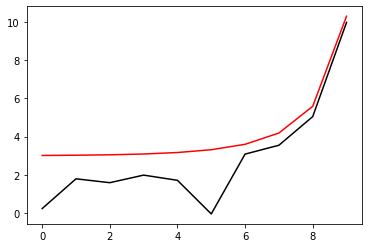

In [87]:
h=tf.zeros(layer)
h_in=[]
#h_in=[3.0205426, 3.022307 , 3.0291433, 3.04402  , 3.0732646, 3.131582 ,
# 3.2585216, 3.5762587, 4.59116  , 9.752249]
for i in range (layer):
#   midd=np.float64(10.0)
#    h_in.append(midd)
#    midd=3*coth(3*((i-layer)*dn)).numpy()
#    h_in.append(midd)
    mu=1/(1-i/10)
    h_inn=np.float64(np.random.normal(mu, 1))
    h_in.append(h_inn)
h=tf.Variable(h_in)
print(h)

h_real=tf.zeros(layer)
middd=[]
for i in range (layer):
    midd=3*coth(3*((i-layer)*dn)).numpy()
    middd.append(midd)
h_real=tf.constant(middd)
print(h_real)
plt.plot(h_real, 'r-')
plt.plot(h.numpy(), 'k-')
plt.show()

In [88]:
m2=tf.constant(np.float64(-1.0))
m2_2=tf.Variable(np.float64(np.random.uniform(-1.5, -0.5)))
print(m2_2)

lam=tf.constant(np.float64(1.0))
lam2=tf.Variable(np.float64(np.random.uniform(0.5, 1.5)))
print(lam2)

<tf.Variable 'Variable:0' shape=() dtype=float64, numpy=-0.7216483695349111>
<tf.Variable 'Variable:0' shape=() dtype=float64, numpy=1.126158097188783>


In [6]:
def F_func(m, la, a,b):
    return 2*b/n_fin-m*a-la*(a**3)

def t_func(a):
    return 0.5*(tf.math.tanh(100*(a-0.1))-tf.math.tanh(100*(a+0.1))+2)

In [49]:
def LP2(hh, m, la, phi, pi):
    for j in range (layer-1):
        phi1=phi+dn*pi
        pi1 =phi*m*dn+(1-dn*hh[j])*pi+dn*la*(phi1**3)
        phi=phi1
        pi=pi1
    return phi, pi
def NN_func_p(hh, m, la):
    Positive=[]
    while len(Positive)<data:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, m, la, phi1, pi1)
        F=np.array(tf.math.abs(F_func(m, la, phi_1, pi_1)))
        for i in range (len(phi1[F<0.1])):
            Positive.append([phi1[F<0.1][i], pi1[F<0.1][i]])
            if len(Positive)>=data: break
    print(len(Positive))
    return Positive
def NN_func_n(hh, m, la):
    Positive=[]
    while len(Positive)<data:
        phi1=np.random.uniform(0.0, 1.5, 10000)
        pi1=np.random.uniform(-0.2, 0.2, 10000)
        phi_1, pi_1=LP2(hh, m, la, phi1, pi1)
        F=np.array(tf.math.abs(F_func(m, la, phi_1, pi_1)))
        for i in range (len(phi1[F>=0.1])):
            Positive.append([phi1[F>=0.1][i], pi1[F>=0.1][i]])
            if len(Positive)>=data: break
    print(len(Positive))
    return Positive
def NN_func_01(hh, m, la, list1):
    PP=[]
    NN=[]
    phi=np.array(list1)[:, 0]
    pi=np.array(list1)[:, 1]
    F=np.array(tf.math.abs(LP2(hh, m, la, phi, pi)[1]))
    for i in range (len(phi[F<0.1])):
        PP.append([phi[F<0.1][i], pi[F<0.1][i]])
    for i in range (len(phi[F>=0.1])):
        NN.append([phi[F>=0.1][i], pi[F>=0.1][i]])
    return PP, NN

In [54]:
Positive=NN_func_p(h_real, m2, lam)

100


In [55]:
Negative=NN_func_n(h_real, m2, lam)

100


In [69]:
[Positive0, Positive1]=NN_func_01(h, m2_2, lam2, Positive)
[Negative0, Negative1]=NN_func_01(h, m2_2, lam2, Negative)

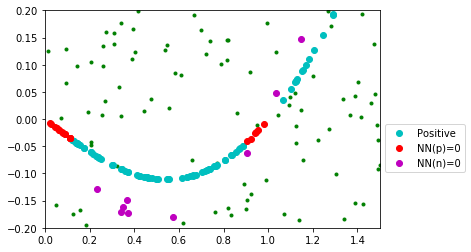

In [70]:
x_data1=[v[0] for v in Positive0]
y_data1=[v[1] for v in Positive0]
x_data2=[v[0] for v in Positive1]
y_data2=[v[1] for v in Positive1]
x_data3=[v[0] for v in Negative0]
y_data3=[v[1] for v in Negative0]
x_data4=[v[0] for v in Negative1]
y_data4=[v[1] for v in Negative1]
plt.plot(x_data4, y_data4, 'g.')
plt.plot(x_data2, y_data2, 'co', label='Positive')
plt.plot(x_data1, y_data1, 'ro', label='NN(p)=0')
plt.plot(x_data3, y_data3, 'mo', label='NN(n)=0')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.legend(bbox_to_anchor=(1, 0.5))
plt.show()

# Error function

$E=\sum_{data} \left\vert y(\bar{x}^{(1)}) - \bar{y} \right\vert+E_{reg}(W)$
, $E_{reg}=c_{reg}^{(1)}\sum_{n=1}^{N-1}(\eta^{(n)})^{4}(h(\eta^{(n+1)})-h(\eta^{(n)}))^{2}+c_{reg}^{(2)}(h(\eta^{(N)})-1/\eta^{(N)})^{2}$

In [71]:
def Error_func(hh, m, la):
    phi0=np.array([v[0] for v in Positive])
    pi0=np.array([v[1] for v in Positive])
    phi1=np.array([v[0] for v in Negative])
    pi1=np.array([v[1] for v in Negative])
    phi_0, pi_0=LP2(hh, m, la, phi0, pi0)
    phi_1, pi_1=LP2(hh, m, la, phi1, pi1)
    PPlist=t_func(pi_0)
    NNlist=t_func(pi_1)
    sum_p=sum(PPlist)
    sum_n=data-sum(NNlist)

    inside=0
    for k in range (layer-1):
        second=((n_ini+k*dn)**4)*((hh[k+1]-hh[k])**2)
        inside=inside+second
    E_reg1=c_reg1*inside
    E_reg2=c_reg2*((hh[layer-1]-1/n_fin)**2)
    return E_reg1+E_reg2+sum_p+sum_n

In [72]:
print(Error_func(h_real, m2, lam))
print(Error_func(h, m2_2, lam2))

tf.Tensor(1.9992528431111505, shape=(), dtype=float64)
tf.Tensor(90.00503195836622, shape=(), dtype=float64)


In [74]:
def run():
    with tf.GradientTape() as g:
        loss=Error_func(h, m2_2, lam2) #돌리기전에 Error함수 수정 잊지말것
        gradients=g.gradient(loss, [h, m2_2, lam2])
    optimizer.apply_gradients(zip(gradients, [h, m2_2, lam2]))

100 101.09294072694956 0.35848228853779074 1.9415608632771706
[ 0.35100139  1.78663869  1.62554086  1.99410403  1.71423089 -0.0349135
  3.06946099  3.53438185  5.03030519  9.97289659]


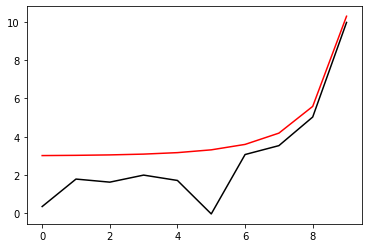

200 99.11337432141511 0.5395184803005839 2.00161478794831
[ 0.39569563  1.74321884  1.63255203  1.98681469  1.70811178 -0.02429578
  3.06248717  3.53297399  5.02905142  9.97265922]


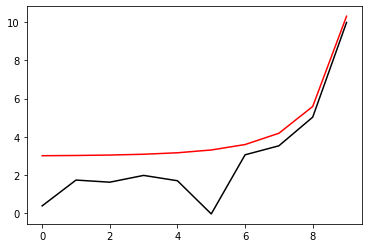

300 99.05220146627103 0.5659231451871874 1.9105422325978831
[0.49905806 1.75193385 1.68291677 2.01988779 1.74108369 0.0303646
 3.08860061 3.56313226 5.05617153 9.97242251]


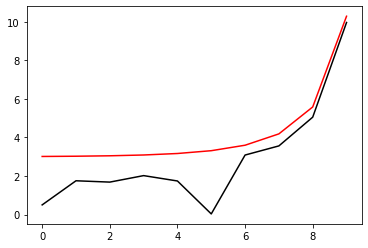

400 101.10002935769656 0.4025973944787977 1.9513804995796213
[0.53971915 1.71550048 1.68656823 2.01072    1.73191682 0.03616012
 3.07750905 3.55715133 5.0504622  9.97218675]


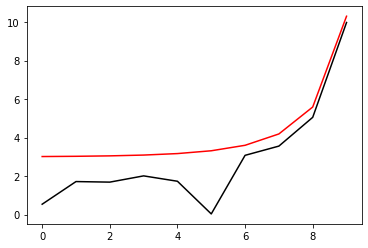

500 99.05152148917601 0.5624736406434724 1.9461405134328116
[0.59464302 1.69585488 1.70271754 2.01473312 1.73634542 0.05808678
 3.0794367  3.56416322 5.05684065 9.97195049]


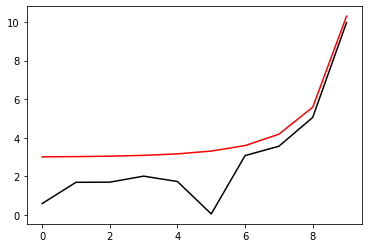

600 99.0239172229837 0.5816347845236728 1.903089526006098
[0.65550173 1.68403474 1.7209898  2.02027968 1.74110911 0.07915626
 3.08009522 3.56936732 5.06123937 9.97171472]


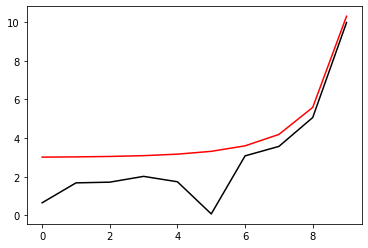

700 99.14163495428 0.5486493253490003 2.009722039176958
[0.76279307 1.70131448 1.74855271 2.02228008 1.73070622 0.07106731
 3.04980404 3.53838121 5.02886061 9.97147796]


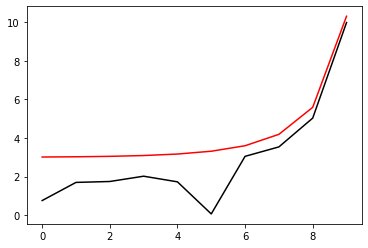

800 99.0401581938231 0.5932479207622153 1.9431655359793885
[0.79656412 1.67588467 1.74763106 2.01137404 1.71897816 0.07303227
 3.03609988 3.52970352 5.02070406 9.97124052]


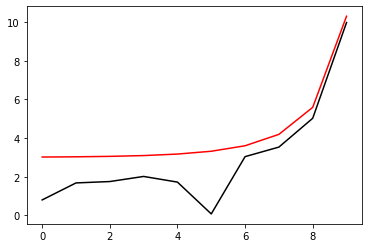

900 101.07545221067073 0.39302413109565587 1.903640819154849
[0.82941548 1.65223276 1.74463832 1.99811463 1.70387517 0.06997347
 3.01778364 3.51591484 5.00749426 9.97100267]


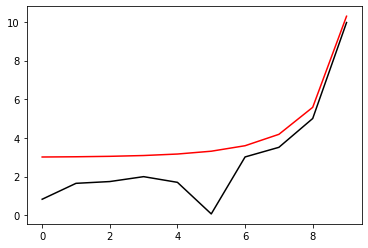

1000 99.04740777553538 0.5701500580723515 1.940343095849354
[0.85764151 1.63278266 1.74721289 1.99386332 1.70029434 0.08238908
 3.01329089 3.51676359 5.00846199 9.97076448]


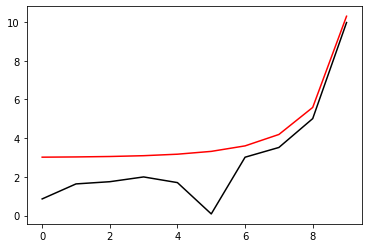

1100 100.04267878924195 0.33896530135270436 1.8683737413429642
[0.94511447 1.66019453 1.78486802 2.01801366 1.72084332 0.11828956
 3.0242844  3.53054623 5.01989726 9.97052629]


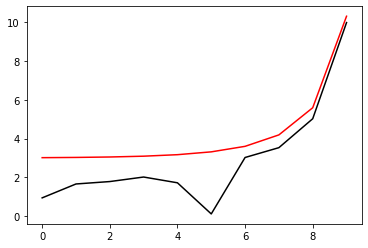

1200 101.76382221483802 0.061557646875495795 2.182250750860107
[0.941543   1.62125826 1.76596585 1.99503637 1.69869863 0.10925619
 3.00344938 3.51558806 5.00661757 9.97028857]


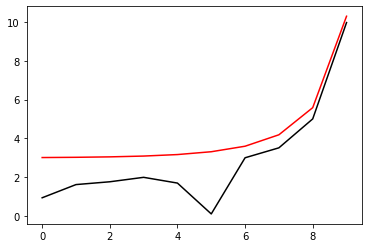

1300 99.11236327686032 0.5569363550899711 2.1624702506060305
[0.96168134 1.60231115 1.76240221 1.98629719 1.69062946 0.11633313
 2.99545347 3.51320289 5.00483769 9.97005036]


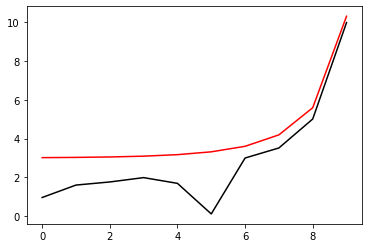

1400 99.02935885407076 0.5788950308246472 2.0810739594213827
[0.99123392 1.59047543 1.7605672  1.97694544 1.67975151 0.11799331
 2.98178146 3.50416972 4.99626783 9.96981183]


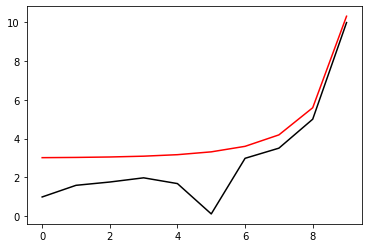

1500 99.02327798881632 0.5982718001893114 2.004586411892589
[1.01782917 1.57885429 1.75762195 1.96705213 1.66843296 0.11911139
 2.96782116 3.49485599 4.98746209 9.9695729 ]


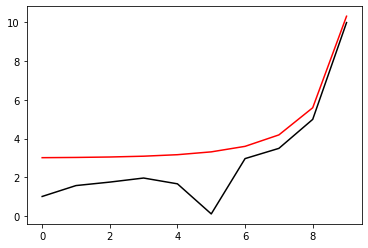

1600 99.00362941078183 0.584957411569888 1.9290857866695754
[1.04465446 1.56988998 1.75584037 1.95861238 1.65857314 0.12175216
 2.95511358 3.48670268 4.97970157 9.96933358]


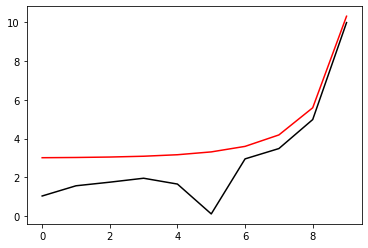

1700 101.08353940498539 0.44594365996531815 2.1101064607626356
[1.05059355 1.5443966  1.73707927 1.93395559 1.63200503 0.10474507
 2.92677491 3.46317752 4.9578691  9.96909333]


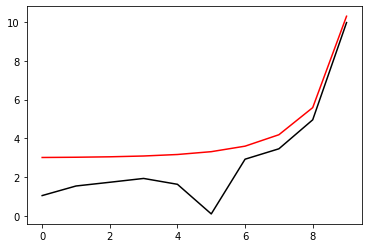

1800 99.04177953221524 0.5721226734995197 2.14348833464501
[1.0705244  1.53813798 1.73924673 1.93264659 1.6314576  0.11961628
 2.92505995 3.46646198 4.96107706 9.96885265]


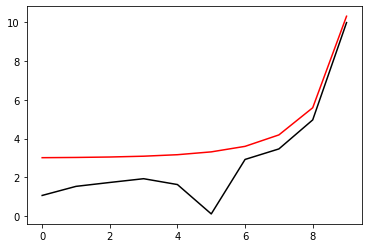

1900 99.09317908431841 0.5634423639206001 2.0543308944089773
[1.11672623 1.55169142 1.75454212 1.94081817 1.63796379 0.14019994
 2.92650864 3.47178616 4.96553026 9.96861247]


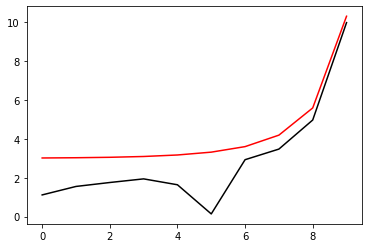

2000 99.08096147654966 0.5695213851903034 1.9743754294729199
[1.144369   1.55080704 1.75569279 1.93603002 1.63171496 0.14638154
 2.91692576 3.46652646 4.96042235 9.96837221]


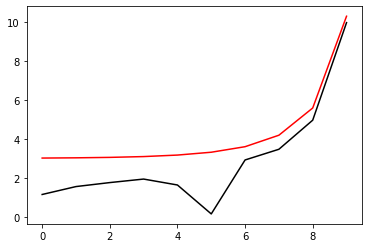

2100 99.0197523201367 0.5825082289363592 1.9425796728260647
[1.16095835 1.54246509 1.74960177 1.92492751 1.61939562 0.14573381
 2.90215471 3.45627844 4.95081531 9.96813162]


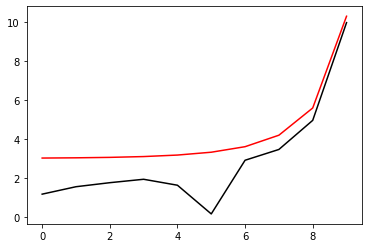

2200 101.06929267041653 0.4281486179303674 1.9465773370804746
[1.17898595 1.53728146 1.74574066 1.9159512  1.60894576 0.14669622
 2.88834092 3.44661169 4.94152057 9.96789057]


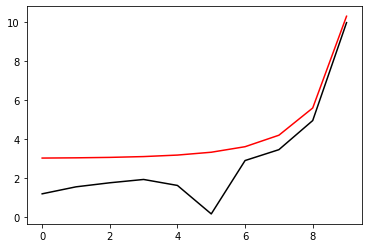

2300 99.05375027248512 0.5759727660519823 1.922227454828476
[1.19479637 1.53305658 1.74360676 1.9101477  1.60293368 0.15379453
 2.88038649 3.44324541 4.93838545 9.96764915]


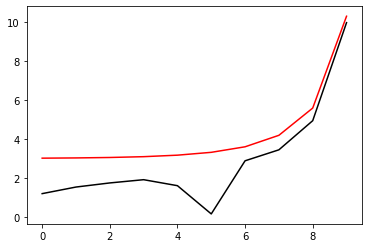

2400 101.0676651572611 0.4320702325109004 1.9198209216580673
[1.21106401 1.52871023 1.73911386 1.90083019 1.59219829 0.15426453
 2.86643252 3.4334601  4.92904726 9.96740761]


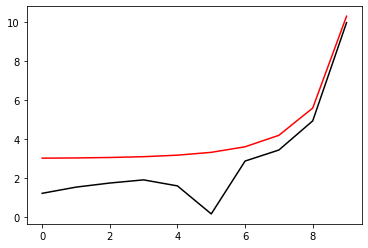

2500 102.78157758062723 0.0910658530096416 1.9774463162869853
[1.23241085 1.53090114 1.74060587 1.89746682 1.58740042 0.16110526
 2.85731087 3.4280528  4.92350364 9.96716553]


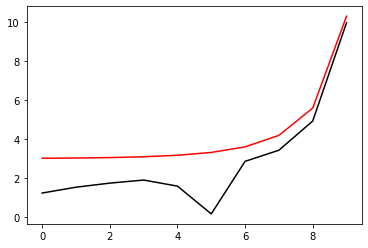

2600 100.77162057393234 0.06964861106863768 2.3286244180816125
[1.13386304 1.42316955 1.63691253 1.79203193 1.47841281 0.04895395
 2.75397278 3.33208977 4.83630613 9.96692178]


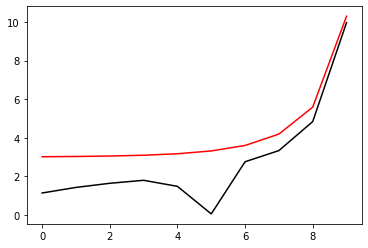

2700 98.9056659453859 0.4227967677487614 2.7405806958418966
[ 1.00256817  1.2636922   1.46118942  1.59519615  1.25542774 -0.21614047
  2.51214792  3.08908244  4.60713311  9.96667062]


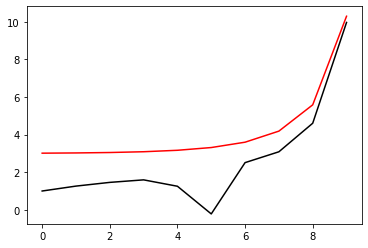

2800 99.81418615401668 0.27284791283606935 2.8706448475698427
[ 0.83700153  1.10069629  1.31013687  1.44959902  1.11042575 -0.36533869
  2.38428391  2.97216402  4.50270337  9.96641114]


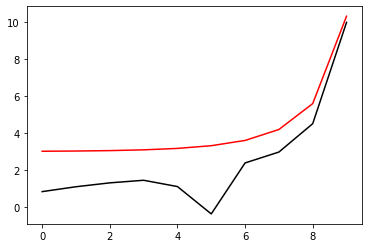

2900 81.25546131198988 -0.9921105486335333 2.765182929046809
[ 0.811254    1.04571822  1.23457971  1.34872946  0.98175953 -0.52918483
  2.21784733  2.79707009  4.33204702  9.96614473]


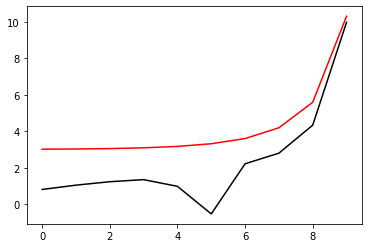

3000 95.21231158950987 -0.036711809150297814 2.8820245393419928
[ 0.93528288  1.10934228  1.23747749  1.28373082  0.84501783 -0.75760067
  1.9526538   2.48727308  4.01289754  9.96586701]


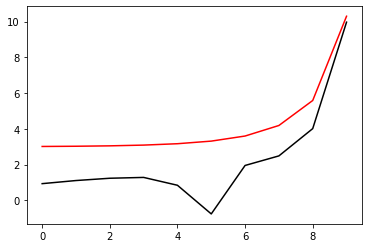

3100 99.08916678586662 -2.5036451260926644 0.8826175750090066
[ 0.98635501  1.12150926  1.21937276  1.23355833  0.7628389  -0.87342228
  1.82342758  2.34886721  3.87832201  9.96557684]


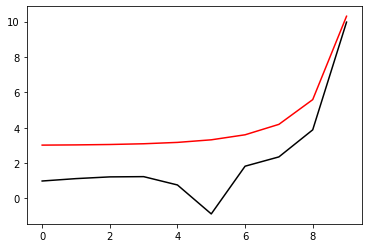

3200 99.04643785469952 -2.3671774869608617 0.8827989131817574
[ 0.99603092  1.12205474  1.21620471  1.22410316  0.74881646 -0.88076424
  1.7998992   2.32753769  3.85744137  9.96528409]


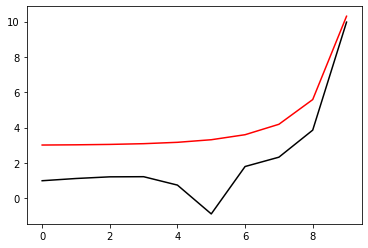

3300 99.40014557847121 -2.882220644025209 -1.4490904603846186
[ 1.02347466  1.14093625  1.22581197  1.21812076  0.72595471 -0.91490272
  1.74191296  2.26270068  3.79159854  9.96499034]


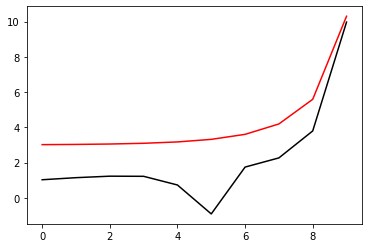

3400 99.07101853072272 -2.5521579816368476 -1.4489081709874787
[ 1.03867146  1.14242911  1.2159279   1.19330593  0.68610036 -0.96416438
  1.67766754  2.19654214  3.72788034  9.96469201]


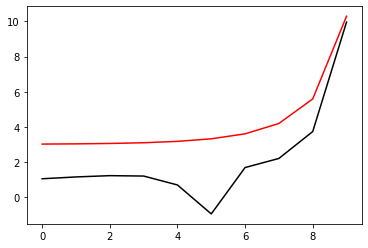

3500 99.04530233180219 -2.4465970387259826 -1.448837906193247
[ 1.04554496  1.14215433  1.21227942  1.18431637  0.67338923 -0.96933137
  1.65669576  2.17814638  3.70999171  9.96439218]


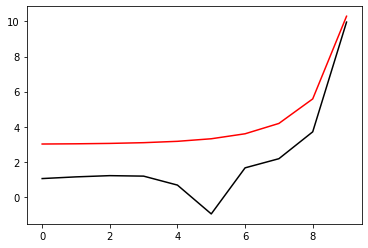

3600 99.03089260329399 -2.366487283565353 -1.4487597141351616
[ 1.05131603  1.14180127  1.20931798  1.17710557  0.6637227  -0.96967829
  1.64053838  2.16504301  3.69719305  9.96409167]


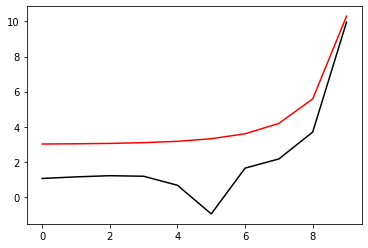

3700 98.99695677621376 -2.246693829032131 -1.4485436136970633
[ 1.05866368  1.14260642  1.2064991   1.16907235  0.65210729 -0.97375938
  1.62045753  2.14731178  3.67975327  9.96379051]


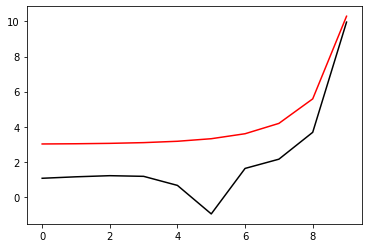

3800 98.30393697248493 -2.125488899186033 -1.5041068056887867
[ 1.14008511  1.23291031  1.30849046  1.28144633  0.78056666 -0.80176958
  1.74134797  2.26333053  3.77713896  9.96348975]


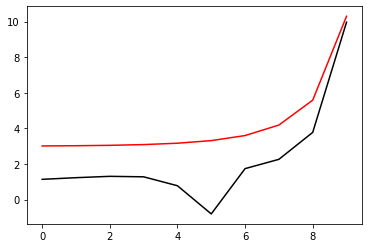

3900 98.09982880026169 -2.202746319122276 -1.5345540743768202
[ 1.19320392  1.2950113   1.38340583  1.36832552  0.88447082 -0.65617633
  1.84707888  2.36898875  3.86889683  9.96319547]


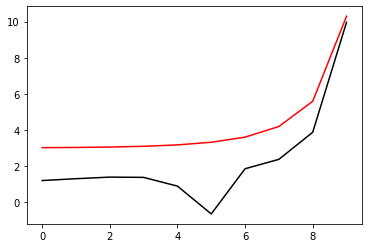

4000 98.07514666998422 -2.230500111249312 -1.5471736586851919
[ 1.21427197  1.31644228  1.40895436  1.39733194  0.92013168 -0.59737756
  1.88242615  2.40705666  3.90200079  9.96290383]


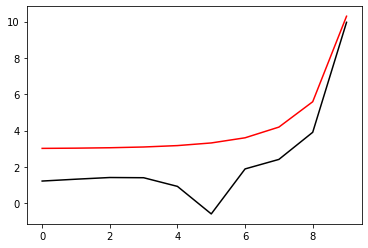

4100 98.0682510560971 -2.2445019013933343 -1.5561979190765292
[ 1.22676251  1.32699583  1.42112449  1.41064637  0.93732322 -0.56205558
  1.89876484  2.42687694  3.91928282  9.96261336]


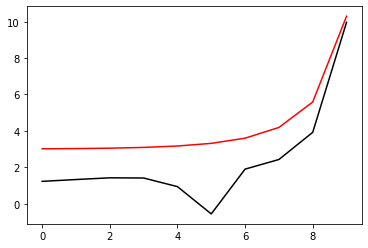

4200 98.0656267157766 -2.2523720848717206 -1.5639410925570032
[ 1.23534603  1.3326967   1.42724308  1.41687154  0.94619149 -0.53734748
  1.90655536  2.43848781  3.9294553   9.96232355]


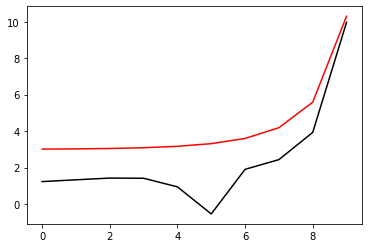

4300 98.06438475332334 -2.256987254199395 -1.5711112333616817
[ 1.24175343  1.33579534  1.43006184  1.41923838  0.95054304 -0.51843948
  1.90971382  2.44564304  3.93577406  9.96203414]


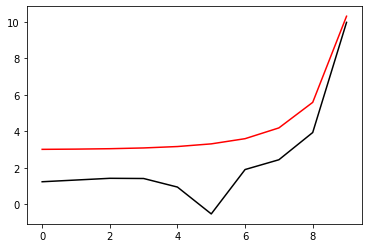

4400 98.06365512582721 -2.259725245769278 -1.577989252842435
[ 1.2468256   1.33738588  1.43092614  1.41932508  0.95223451 -0.50298983
  1.91014509  2.45016591  3.93981908  9.96174499]


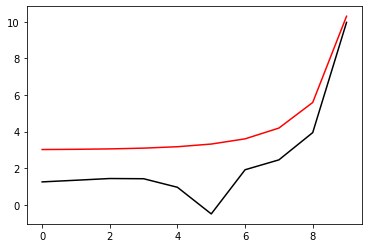

4500 98.06313090766626 -2.261327750201942 -1.584704079615658
[ 1.2510298   1.33807268  1.43058411  1.41800781  0.95229499 -0.48970361
  1.90890237  2.45306304  3.94246182  9.96145601]


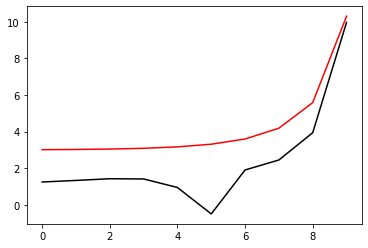

4600 98.0626942904352 -2.2622221863240246 -1.5913210184045612
[ 1.25464542  1.33821254  1.42948142  1.41580755  0.95133542 -0.47781354
  1.90660963  2.45493015  3.94421761  9.96116715]


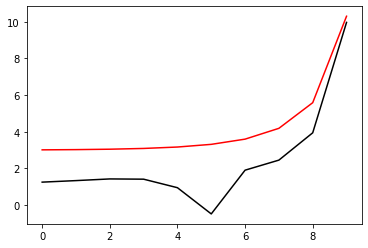

4700 98.06229773740714 -2.2626659949577568 -1.597875654000397
[ 1.25784702  1.3380239   1.42789429  1.41304648  0.94973306 -0.46684638
  1.9036517   2.4561343   3.94540377  9.96087838]


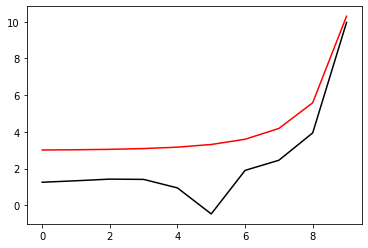

4800 98.0619214248025 -2.2628189542024595 -1.6043884840938119
[ 1.26074684  1.33764306  1.42599811  1.4099287   0.9477265  -0.45650298
  1.90027178  2.45690734  3.94622066  9.96058966]


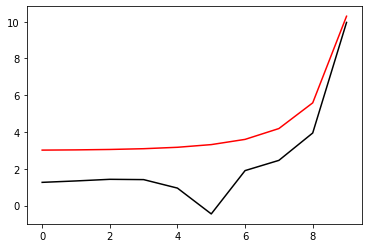

4900 98.06155687161221 -2.262782297610701 -1.6108718213540216
[ 1.26341862  1.3371558   1.42390601  1.40658546  0.9454689  -0.4465912
  1.89662597  2.45739809  3.94679682  9.96030099]


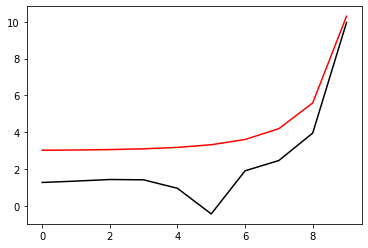

5000 98.06120035439996 -2.2626210911951157 -1.617333295498435
[ 1.2659117   1.33661612  1.42169173  1.40310204  0.9430595  -0.43698629
  1.89281552  2.45770305  3.94721557  9.96001236]


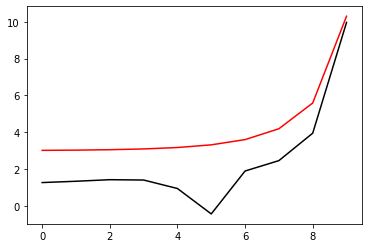

5100 98.06085018016026 -2.2623775765356005 -1.6237777433234801
[ 1.26825969  1.33605779  1.41940373  1.3995342   0.94056298 -0.42760663
  1.8889065   2.45788526  3.94753135  9.95972376]


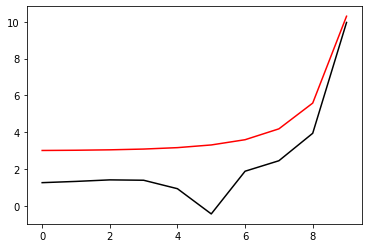

5200 98.06050553466363 -2.2620793737131293 -1.6302082826751298
[ 1.27048593  1.33550153  1.41707399  1.39591863  0.93802168 -0.41839848
  1.88494223  2.45798611  3.94777988  9.95943519]


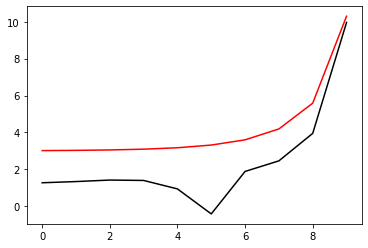

5300 98.060165989415 -2.2617446368223906 -1.6366269486410667
[ 1.27260697  1.3349597   1.41472376  1.39227949  0.93546331 -0.40932629
  1.88095119  2.45803287  3.94798467  9.95914664]


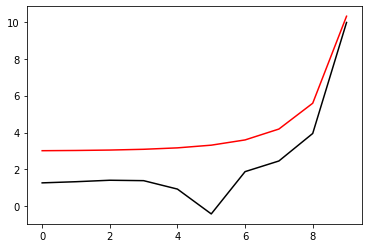

5400 98.0598312883777 -2.26138534568737 -1.6430350827975808
[ 1.27463483  1.33443927  1.41236719  1.38863281  0.93290601 -0.40036638
  1.87695214  2.45804355  3.94816126  9.95885812]


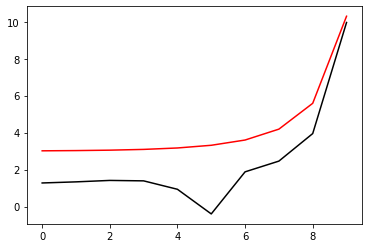

5500 98.05950125488278 -2.2610094312142843 -1.6494335772156659
[ 1.27657851  1.33394372  1.41001374  1.3849892   0.93036165 -0.39150293
  1.87295741  2.45803009  3.94831994  9.95856962]


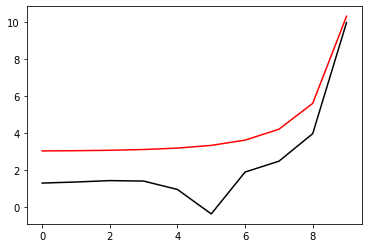

5600 98.05917575060053 -2.260622158612852 -1.6558230301587198
[ 1.27844492  1.33347437  1.40766973  1.38135574  0.92783791 -0.38272526
  1.86897513  2.45800041  3.94846753  9.95828113]


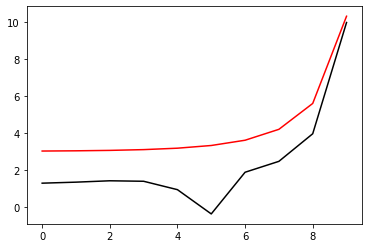

5700 98.0588546572175 -2.260227032772129 -1.6622038467075944
[ 1.28023956  1.33303113  1.40533944  1.37773713  0.92533976 -0.37402609
  1.86501063  2.45795976  3.94860853  9.95799267]


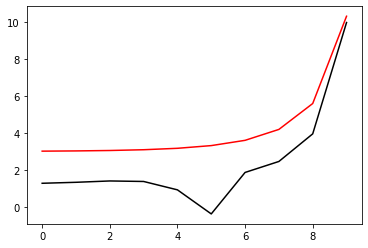

5800 98.05853786807754 -2.259826393341359 -1.6685763043883197
[ 1.28196693  1.33261309  1.4030257   1.37413652  0.92287033 -0.36540043
  1.86106738  2.45791165  3.94874595  9.95770423]


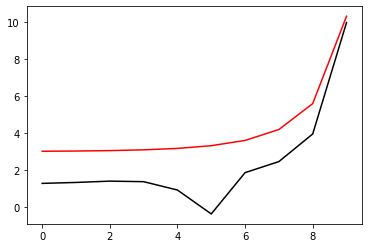

5900 98.058225284229 -2.259421807087166 -1.674940596254437
[ 1.2836308   1.33221883  1.40073042  1.37055602  0.92043155 -0.35684476
  1.85714763  2.45785842  3.94888179  9.95741581]


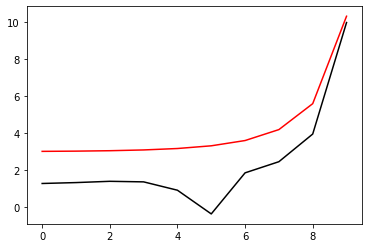

6000 98.05791681244062 -2.259014327217757 -1.6812968593023978
[ 1.28523445  1.33184669  1.39845485  1.36699707  0.91802458 -0.34835656
  1.8532528   2.45780161  3.94901737  9.95712741]


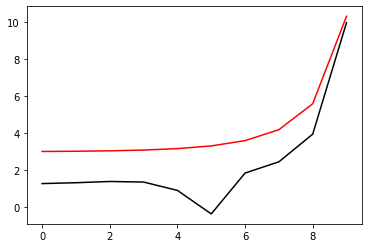

6100 98.05761236411315 -2.258604665118004 -1.6876451932780316
[ 1.28678074  1.33149486  1.39619983  1.36346061  0.91565001 -0.339934
  1.84938379  2.45774228  3.94915357  9.95683903]


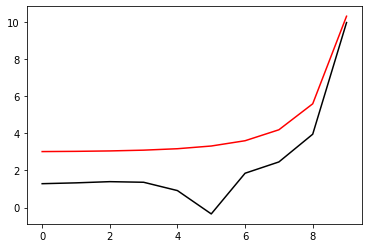

6200 98.05731185461138 -2.2581933042689166 -1.6939856731556406
[ 1.28827225  1.33116153  1.39396585  1.3599473   0.9133081  -0.33157567
  1.84554112  2.45768113  3.94929098  9.95655068]


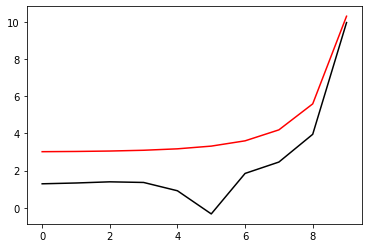

6300 98.05701520280371 -2.257780575926796 -1.7003183574349199
[ 1.28971133  1.3308449   1.39175322  1.35645759  0.91099889 -0.32328045
  1.84172507  2.45761862  3.94942996  9.95626234]


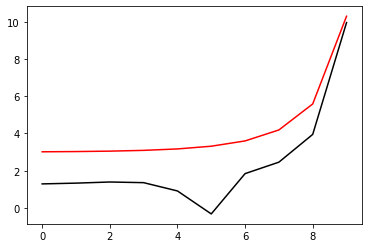

6400 98.05672233071331 -2.2573667094668926 -1.7066432936657943
[ 1.29110012  1.33054326  1.38956207  1.35299177  0.90872226 -0.31504746
  1.83793577  2.45755506  3.94957079  9.95597402]


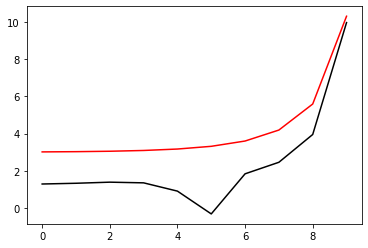

6500 98.05643316323506 -2.256951865916977 -1.7129605221317812
[ 1.29244061  1.33025495  1.38739245  1.34955004  0.90647798 -0.3068759
  1.83417324  2.45749068  3.94971361  9.95568572]


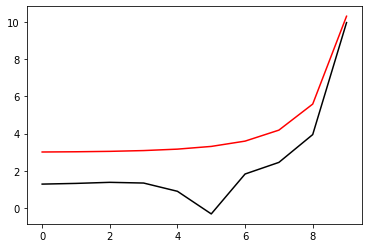

6600 98.05614762789715 -2.2565361603228604 -1.7192700783079178
[ 1.29373464  1.32997843  1.3852443   1.34613256  0.90426576 -0.29876512
  1.83043742  2.45742561  3.94985854  9.95539745]


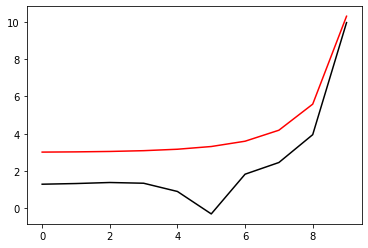

6700 98.05586565465522 -2.256119676685235 -1.7255719945020076
[ 1.29498395  1.32971224  1.38311752  1.34273941  0.90208528 -0.29071448
  1.82672822  2.45735996  3.95000563  9.95510919]


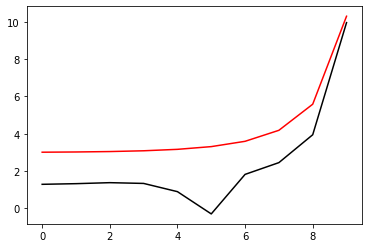

6800 98.05558717571199 -2.255702477949463 -1.7318663009509416
[ 1.29619015  1.32945505  1.38101194  1.33937066  0.89993618 -0.28272343
  1.8230455   2.45729378  3.95015493  9.95482096]


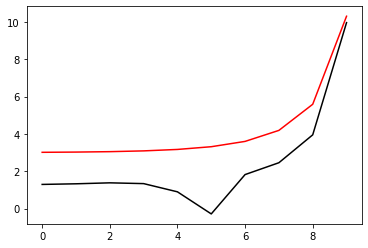

6900 98.05531212535854 -2.255284612697208 -1.7381530265529974
[ 1.29735477  1.32920558  1.37892739  1.33602633  0.8978181  -0.27479142
  1.81938911  2.45722713  3.95030645  9.95453274]


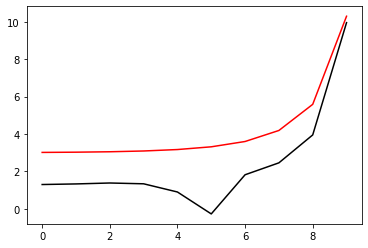

7000 98.05504043983376 -2.2548661196367323 -1.7444321993567689
[ 1.29847926  1.32896267  1.37686365  1.33270645  0.89573066 -0.26691792
  1.81575888  2.45716004  3.9504602   9.95424455]


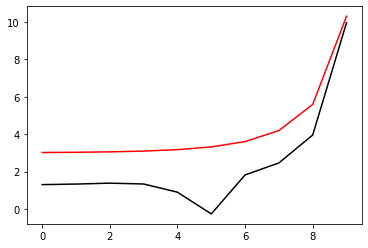

7100 98.05477205719912 -2.254447030622248 -1.7507038468872322
[ 1.29956496  1.32872525  1.37482047  1.32941102  0.89367348 -0.25910245
  1.81215465  2.45709252  3.95061618  9.95395638]


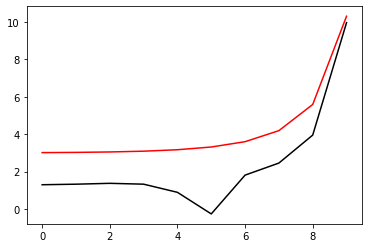

7200 98.05450691722729 -2.2540273726892064 -1.7569679963627765
[ 1.30061317  1.32849233  1.3727976   1.32614003  0.89164617 -0.25134452
  1.80857622  2.4570246   3.95077438  9.95366823]


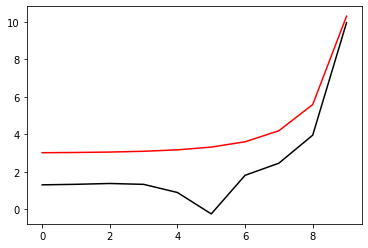

7300 98.05424496130222 -2.2536071694304085 -1.7632246748391691
[ 1.30162509  1.32826298  1.37079477  1.32289346  0.88964837 -0.24364364
  1.80502342  2.45695628  3.95093479  9.9533801 ]


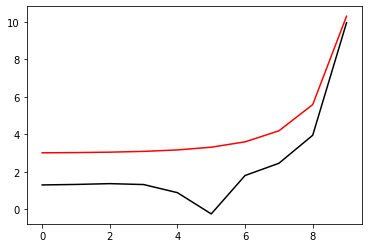

7400 98.05398613232968 -2.2531864419299787 -1.769473909304575
[ 1.30260189  1.32803635  1.3688117   1.31967129  0.88767968 -0.23599934
  1.80149605  2.45688757  3.9510974   9.95309199]


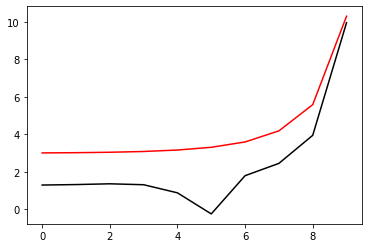

7500 98.05373037465667 -2.25276520940031 -1.775715726741764
[ 1.30354465  1.32781168  1.3668481   1.31647349  0.88573973 -0.22841117
  1.79799395  2.45681848  3.95126219  9.95280391]


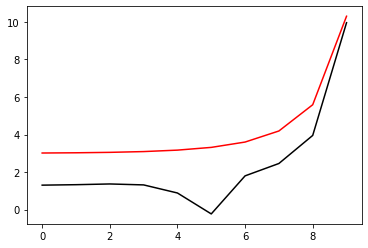

7600 98.05347763399875 -2.2523434896191374 -1.7819501541683536
[ 1.30445441  1.32758824  1.36490367  1.31330001  0.88382817 -0.22087867
  1.79451691  2.45674901  3.95142914  9.95251585]


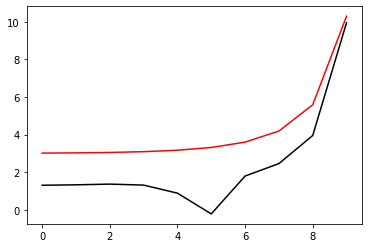

7700 98.05322785737415 -2.2519212992318374 -1.7881772186623324
[ 1.30533218  1.32736538  1.36297812  1.3101508   0.88194461 -0.21340138
  1.79106475  2.45667917  3.95159825  9.95222781]


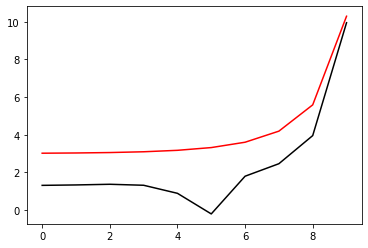

7800 98.0529809930441 -2.251498653962637 -1.7943969473777668
[ 1.30617887  1.32714249  1.36107112  1.30702582  0.88008871 -0.20597886
  1.78763729  2.45660894  3.95176949  9.95193979]


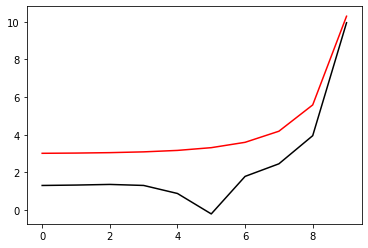

7900 98.05273699045811 -2.2510755687640707 -1.800609367553952
[ 1.30699539  1.32691902  1.35918238  1.30392501  0.8782601  -0.19861066
  1.78423434  2.45653834  3.95194284  9.95165179]


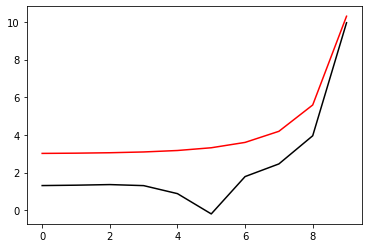

8000 98.05249580020448 -2.2506520579244307 -1.806814506520229
[ 1.30778259  1.32669445  1.35731159  1.30084829  0.87645844 -0.19129636
  1.78085572  2.45646737  3.95211829  9.95136381]


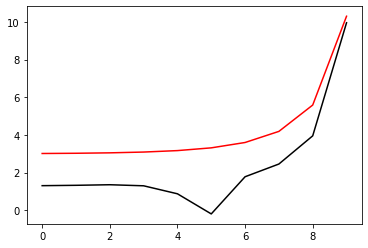

8100 98.05225737396444 -2.25022813514651 -1.8130123916979286
[ 1.30854129  1.32646834  1.35545843  1.29779561  0.87468337 -0.18403552
  1.77750125  2.45639603  3.95229581  9.95107586]


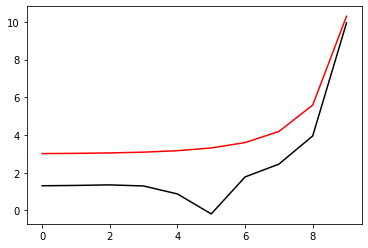

8200 98.05202166447012 -2.249803813606599 -1.8192030506004513
[ 1.30927225  1.32624024  1.3536226   1.29476688  0.87293457 -0.1768277
  1.77417074  2.45632431  3.9524754   9.95078793]


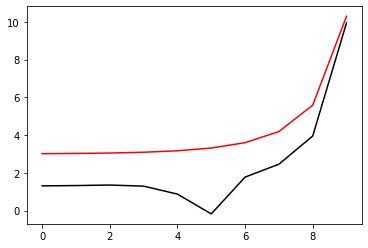

8300 98.05178862546593 -2.24937910599983 -1.825386510832154
[ 1.30997623  1.32600978  1.35180378  1.29176204  0.87121168 -0.16967249
  1.77086401  2.45625221  3.95265702  9.95050002]


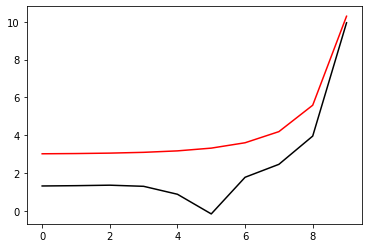

8400 98.05155821167247 -2.2489540245759603 -1.8315628000864734
[ 1.31065392  1.3257766   1.35000167  1.28878099  0.86951438 -0.16256946
  1.7675809   2.45617975  3.95284067  9.95021214]


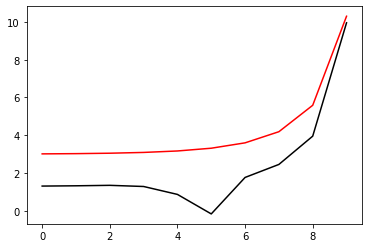

8500 98.05133037875338 -2.2485285811684093 -1.837731946143601
[ 1.31130601  1.32554037  1.34821596  1.28582364  0.86784235 -0.1555182
  1.7643212   2.45610691  3.95302632  9.94992427]


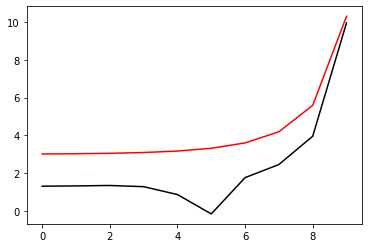

8600 98.05110508328399 -2.2481027872184485 -1.8438939768679057
[ 1.31193315  1.3253008   1.34644635  1.28288991  0.86619526 -0.1485183
  1.76108477  2.4560337   3.95321395  9.94963644]


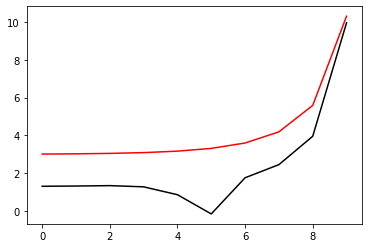

8700 98.05088228272267 -2.247676653795857 -1.8500489202052424
[ 1.31253595  1.32505763  1.34469253  1.2799797   0.86457279 -0.14156934
  1.75787141  2.45596011  3.95340356  9.94934862]


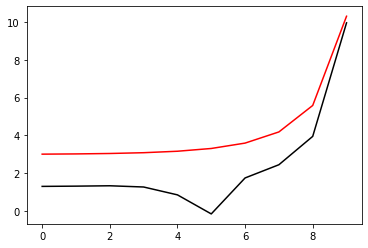

8800 98.05066193538327 -2.2472501916169425 -1.85619680418021
[ 1.31311502  1.32481062  1.34295422  1.2770929   0.86297463 -0.13467092
  1.75468095  2.45588615  3.95359511  9.94906082]


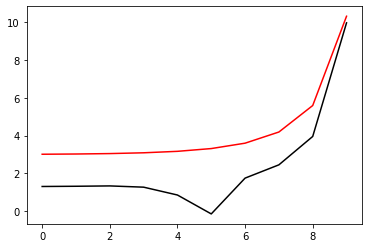

8900 98.05044400040984 -2.246823411060562 -1.8623376568934467
[ 1.31367091  1.32455955  1.34123111  1.27422942  0.86140046 -0.12782265
  1.75151322  2.45581181  3.9537886   9.94877305]


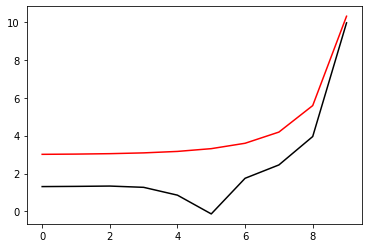

9000 98.05022843775241 -2.2463963221825685 -1.8684715065189805
[ 1.31420419  1.32430422  1.33952293  1.27138914  0.85985    -0.12102411
  1.74836805  2.4557371   3.953984    9.94848531]


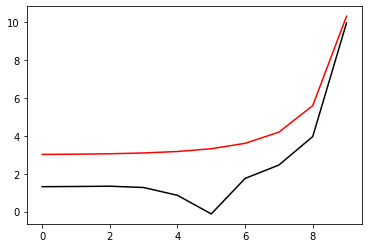

9100 98.05001520814432 -2.245968934729007 -1.8745983813016567
[ 1.31471538  1.32404445  1.33782937  1.26857196  0.85832292 -0.11427492
  1.74524527  2.45566201  3.9541813   9.94819758]


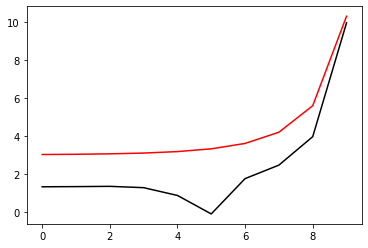

9200 98.04980427308068 -2.245541258148279 -1.880718309554664
[ 1.31520498  1.32378009  1.33615017  1.26577775  0.85681895 -0.10757469
  1.74214472  2.45558655  3.95438048  9.94790988]


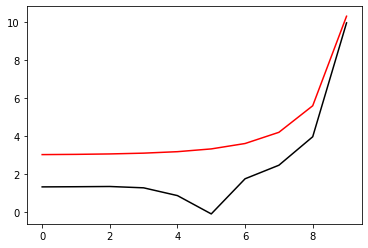

9300 98.04959559479796 -2.245113301602429 -1.8868313196571602
[ 1.31567348  1.323511    1.33448505  1.26300641  0.85533778 -0.10092302
  1.73906621  2.45551071  3.95458152  9.9476222 ]


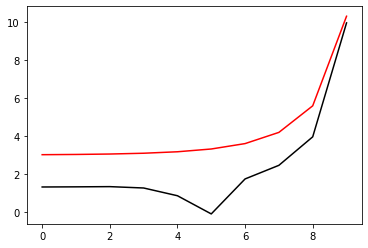

9400 98.04938913625462 -2.2446850739777022 -1.8929374400519976
[ 1.31612136  1.32323705  1.33283373  1.2602578   0.85387912 -0.09431954
  1.7360096   2.45543449  3.9547844   9.94733455]


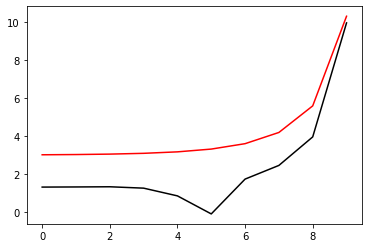

9500 98.04918486111256 -2.2442565838944275 -1.8990366992435628
[ 1.31654905  1.32295813  1.33119596  1.25753181  0.8524427  -0.08776386
  1.73297471  2.4553579   3.95498912  9.94704692]


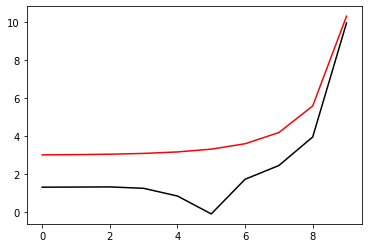

9600 98.04898273371958 -2.243827839716335 -1.905129125795709
[ 1.31695701  1.32267414  1.32957146  1.25482831  0.85102823 -0.08125561
  1.72996138  2.45528093  3.95519564  9.94675931]


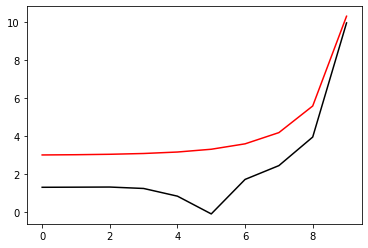

9700 98.04878271909233 -2.24339884955934 -1.9112147483297939
[ 1.31734564  1.322385    1.32795998  1.25214717  0.84963543 -0.07479441
  1.72696945  2.45520358  3.95540396  9.94647173]


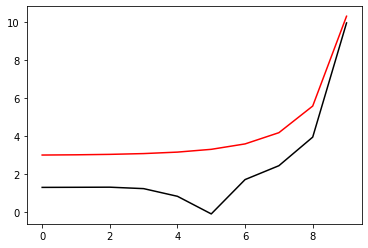

9800 98.04858478290026 -2.242969621299851 -1.9172935955228134
[ 1.31771536  1.32209063  1.32636128  1.24948826  0.84826404 -0.06837988
  1.72399876  2.45512586  3.95561406  9.94618417]


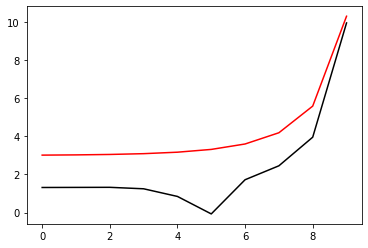

9900 98.04838889145019 -2.2425401625826433 -1.923365696105638
[ 1.31806656  1.32179098  1.3247751   1.24685144  0.84691377 -0.06201168
  1.72104914  2.45504776  3.95582592  9.94589663]


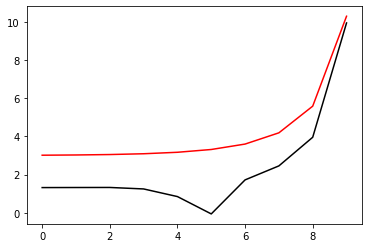

10000 98.04819501167121 -2.2421104808283245 -1.9294310788613256
[ 1.3183996   1.32148598  1.32320121  1.24423658  0.84558437 -0.05568941
  1.71812045  2.45496928  3.95603953  9.94560912]


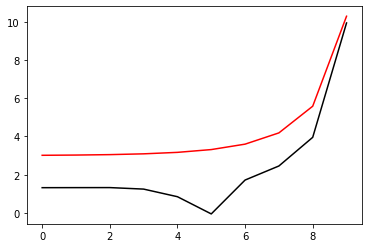

In [89]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 98.04800311110043 -2.2416805832404254 -1.935489772623529
[ 1.31871487  1.3211756   1.32163937  1.24164355  0.84427557 -0.04941274
  1.71521252  2.45489043  3.95625486  9.94532163]


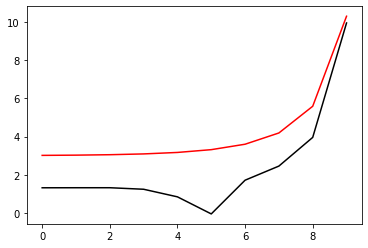

200 98.04781315786944 -2.2412504768121475 -1.9415418062749956
[ 1.31901272  1.32085979  1.32008934  1.23907219  0.84298712 -0.04318129
  1.7123252   2.4548112   3.95647191  9.94503417]


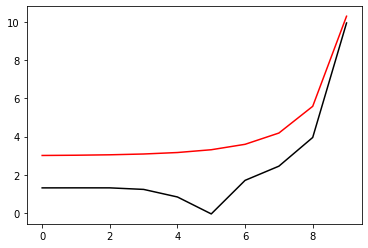

300 98.0476251206904 -2.240820168332772 -1.947587208746136
[ 1.31929348  1.32053854  1.31855091  1.23652237  0.84171875 -0.03699471
  1.70945833  2.45473159  3.95669066  9.94474673]


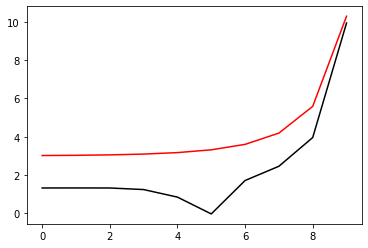

400 98.0474389688438 -2.2403896643937773 -1.9536260090136692
[ 1.31955749  1.32021181  1.31702385  1.23399395  0.84047022 -0.03085266
  1.70661177  2.45465161  3.9569111   9.94445932]


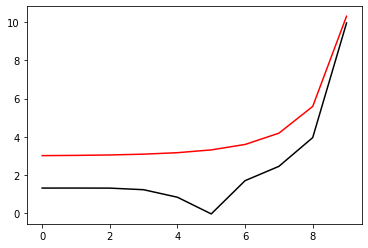

500 98.04725467216569 -2.2399589713946617 -1.9596582360993584
[ 1.31980508  1.3198796   1.31550795  1.23148678  0.83924128 -0.02475477
  1.70378535  2.45457126  3.9571332   9.94417193]


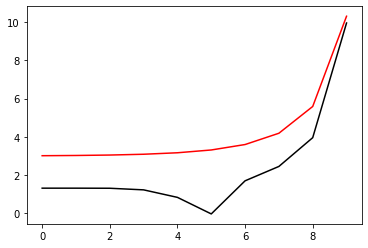

600 98.04707220103565 -2.2395280955484966 -1.9656839190687965
[ 1.32003655  1.31954189  1.31400299  1.22900071  0.83803167 -0.01870071
  1.70097893  2.45449053  3.95735696  9.94388456]


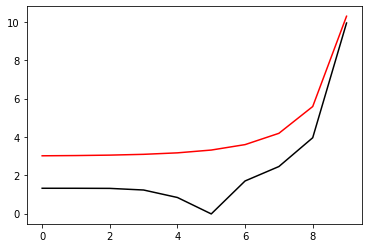

700 98.04689152636539 -2.2390970428872343 -1.971703087030279
[ 1.3202522   1.31919869  1.31250877  1.2265356   0.83684116 -0.01269013
  1.69819236  2.45440943  3.95758235  9.94359722]


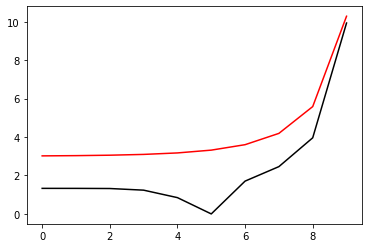

800 98.04671261958713 -2.2386658192667652 -1.9777157691337355
[ 1.32045234e+00  1.31884999e+00  1.31102509e+00  1.22409130e+00
  8.35669506e-01 -6.72268602e-03  1.69542549e+00  2.45432795e+00
  3.95780938e+00  9.94330990e+00]


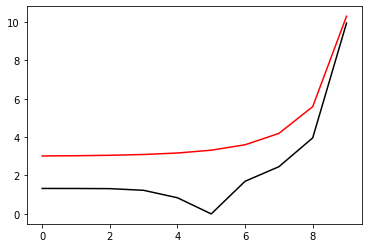

900 98.04653545264296 -2.2382344303717625 -1.9837219945697206
[ 1.32063725e+00  1.31849580e+00  1.30955175e+00  1.22166765e+00
  8.34516473e-01 -7.98046366e-04  1.69267818e+00  2.45424610e+00
  3.95803801e+00  9.94302261e+00]


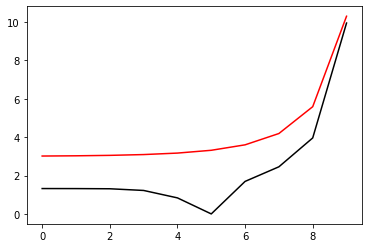

1000 98.04635999797402 -2.2378028817203077 -1.9897217925684751
[1.32080721e+00 1.31813614e+00 1.30808856e+00 1.21926451e+00
 8.33381827e-01 5.08412605e-03 1.68995027e+00 2.45416388e+00
 3.95826823e+00 9.94273534e+00]


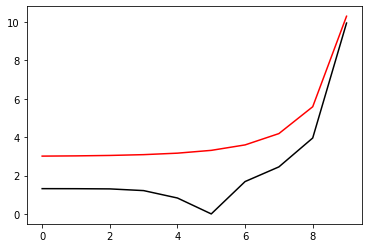

1100 98.04618622851028 -2.2373711786683157 -1.9957151923990417
[1.32096248 1.31777102 1.30663533 1.21688173 0.83226534 0.01092416
 1.68724163 2.45408129 3.95850004 9.9424481 ]


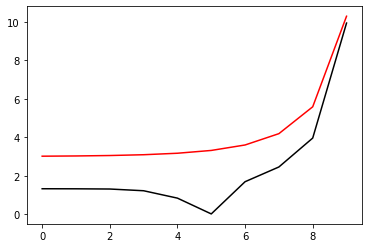

1200 98.04601411766042 -2.236939326413774 -2.0017022233684396
[1.32110333 1.31740046 1.30519189 1.21451915 0.83116677 0.01672239
 1.68455211 2.45399833 3.95873342 9.94216088]


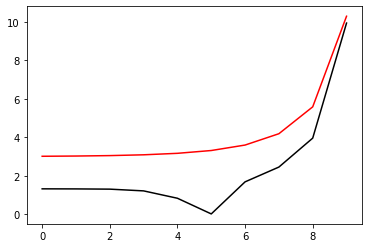

1300 98.04584363930222 -2.2365073300008 -2.007682914820893
[1.32123001 1.31702447 1.30375805 1.21217661 0.83008591 0.02247915
 1.68188157 2.45391501 3.95896835 9.94187369]


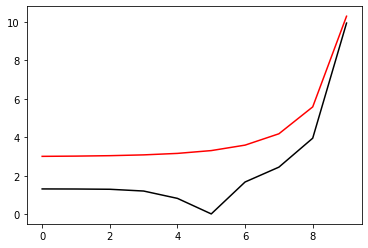

1400 98.04567476777288 -2.2360751943235324 -2.013657296137112
[1.32134279 1.31664309 1.30233363 1.20985397 0.82902253 0.02819474
 1.67922986 2.45383132 3.95920483 9.94158653]


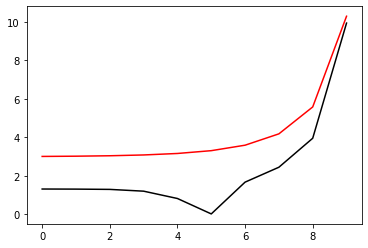

1500 98.04550747785989 -2.2356429241298548 -2.0196253967336357
[1.32144188 1.31625635 1.30091848 1.20755107 0.82797641 0.0338695
 1.67659686 2.45374726 3.95944283 9.94129938]


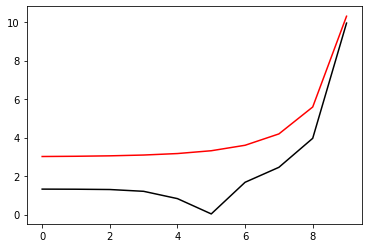

1600 98.04534174479204 -2.235210524024974 -2.025587246062205
[1.32152754 1.31586426 1.29951241 1.20526776 0.82694734 0.03950375
 1.67398241 2.45366283 3.95968235 9.94101227]


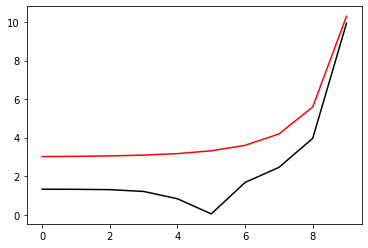

1700 98.04517754423061 -2.2347779984748546 -2.031542873609207
[1.3216     1.31546688 1.29811528 1.20300387 0.82593509 0.04509779
 1.67138638 2.45357805 3.95992337 9.94072518]


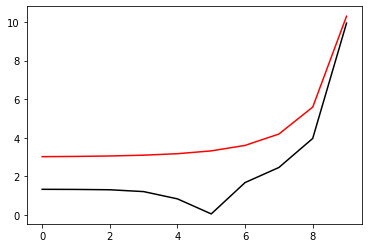

1800 98.04501485226086 -2.2343453518095076 -2.037492308895152
[1.32165948 1.31506423 1.29672693 1.20075925 0.82493946 0.05065195
 1.66880864 2.45349291 3.96016588 9.94043811]


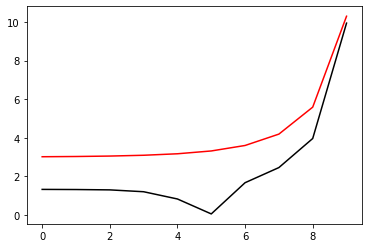

1900 98.04485364538354 -2.2339125882261586 -2.0434355814742022
[1.32170619 1.31465635 1.29534719 1.19853375 0.82396024 0.05616653
 1.66624905 2.4534074  3.96040986 9.94015107]


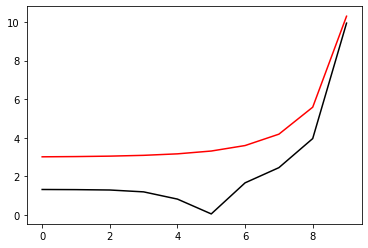

2000 98.04469390050701 -2.2334797117922855 -2.049372720933741
[1.32174036 1.31424327 1.29397593 1.19632721 0.82299722 0.06164184
 1.66370748 2.45332154 3.96065532 9.93986405]


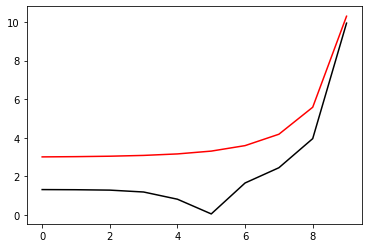

2100 98.044535594939 -2.233046726448546 -2.055303756893987
[1.32176219 1.31382505 1.29261299 1.19413947 0.8220502  0.06707819
 1.66118378 2.45323532 3.96090222 9.93957706]


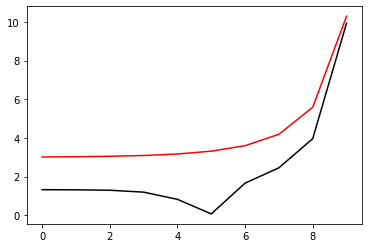

2200 98.04437870637913 -2.232613636011585 -2.0612287190076586
[1.32177189 1.31340172 1.29125823 1.19197038 0.82111898 0.07247587
 1.65867784 2.45314875 3.96115057 9.9392901 ]


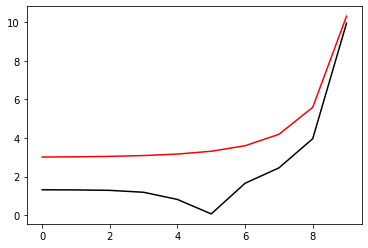

2300 98.04422321291108 -2.2321804441767363 -2.067147636959671
[1.32176966 1.31297332 1.28991152 1.18981978 0.82020335 0.0778352
 1.65618952 2.45306183 3.96140034 9.93900316]


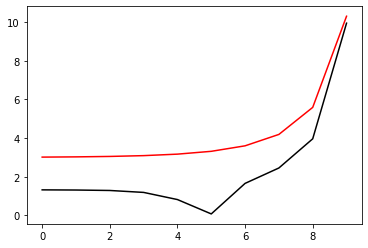

2400 98.04406909299539 -2.2317471545206318 -2.0730605404668636
[1.32175569 1.31253989 1.28857271 1.18768752 0.81930312 0.08315646
 1.65371869 2.45297456 3.96165153 9.93871625]


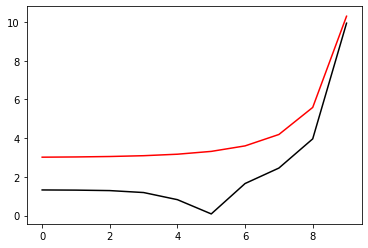

2500 98.04391632546215 -2.2313137705037023 -2.0789674592777985
[1.32173017 1.3121015  1.28724168 1.18557343 0.8184181  0.08843995
 1.65126522 2.45288694 3.96190413 9.93842936]


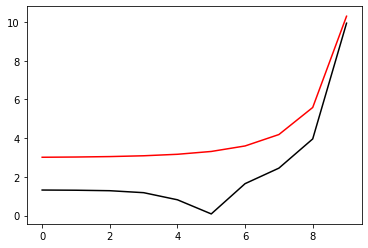

2600 98.04376488950392 -2.23088029547259 -2.084868423172557
[1.32169329 1.31165817 1.2859183  1.18347736 0.81754809 0.09368597
 1.64882898 2.45279898 3.96215812 9.9381425 ]


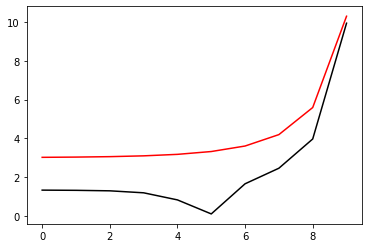

2700 98.04361476466877 -2.230446732662478 -2.090763461962608
[1.32164524 1.31120996 1.28460244 1.18139915 0.81669291 0.0988948
 1.64640985 2.45271067 3.96241349 9.93785567]


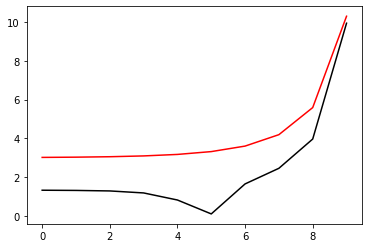

2800 98.04346593085366 -2.230013085199327 -2.096652605490697
[1.32158619 1.31075692 1.28329397 1.17933866 0.81585236 0.10406673
 1.6440077  2.45262203 3.96267024 9.93756886]


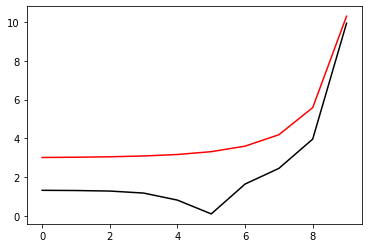

2900 98.04331836829773 -2.229579356102035 -2.102535883630762
[1.32151632 1.31029909 1.28199279 1.17729571 0.81502626 0.10920206
 1.64162241 2.45253304 3.96292835 9.93728208]


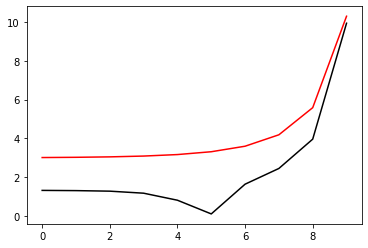

3000 98.04317205757575 -2.229145548284523 -2.108413326287915
[1.32143579 1.30983652 1.28069876 1.17527017 0.81421442 0.11430105
 1.63925385 2.45244372 3.96318781 9.93699532]


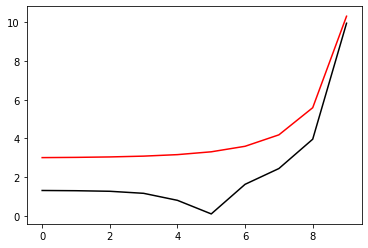

3100 98.043026979592 -2.2287116645577387 -2.1142849633984198
[1.32134479 1.30936927 1.27941179 1.17326186 0.81341667 0.11936399
 1.6369019  2.45235407 3.96344861 9.93670859]


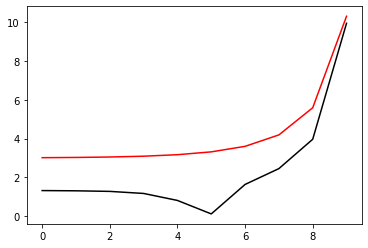

3200 98.04288311557391 -2.228277707631602 -2.1201508249297327
[1.32124346 1.30889737 1.27813175 1.17127065 0.81263283 0.12439117
 1.63456643 2.45226408 3.96371074 9.93642189]


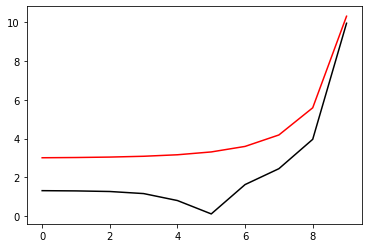

3300 98.04274044706604 -2.2278436801168677 -2.126010940880564
[1.32113198 1.3084209  1.27685854 1.16929637 0.81186271 0.12938285
 1.63224734 2.45217377 3.9639742  9.93613521]


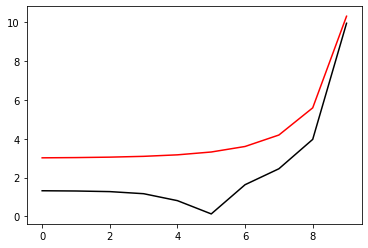

3400 98.04259895592408 -2.227409584526934 -2.131865341280974
[1.3210105  1.30793988 1.27559205 1.16733887 0.81110615 0.13433932
 1.6299445  2.45208314 3.96423896 9.93584856]


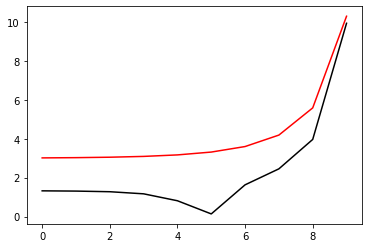

3500 98.04245862430922 -2.226975423279588 -2.1377140561925048
[1.32087918 1.30745438 1.27433218 1.165398   0.81036297 0.13926083
 1.62765778 2.45199218 3.96450502 9.93556194]


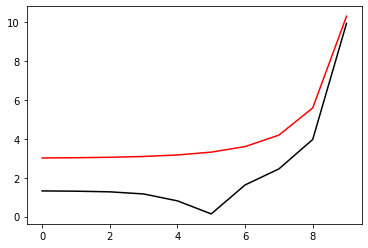

3600 98.04231943468227 -2.226541198698686 -2.1435571157083375
[1.32073817 1.30696445 1.27307883 1.16347361 0.80963299 0.14414766
 1.62538708 2.4519009  3.96477237 9.93527534]


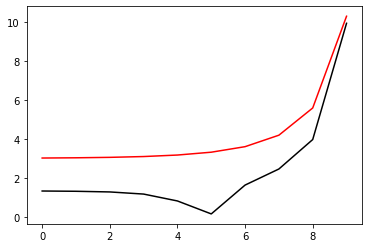

3700 98.04218136979813 -2.2261069130157756 -2.14939454995349
[1.32058762 1.30647013 1.27183191 1.16156554 0.80891606 0.14900009
 1.62313227 2.45180931 3.965041   9.93498877]


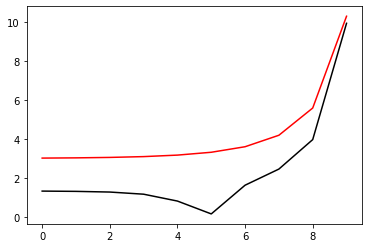

3800 98.04204441270032 -2.2256725683716736 -2.1552263890850294
[1.32042768 1.30597148 1.2705913  1.15967364 0.80821199 0.15381836
 1.62089324 2.4517174  3.96531091 9.93470223]


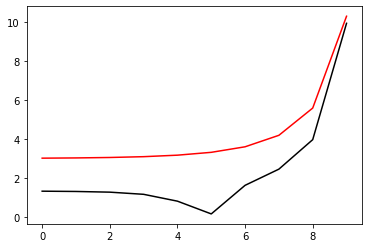

3900 98.0419085467157 -2.225238166817975 -2.1610526632923315
[1.32025848 1.30546855 1.26935693 1.15779776 0.80752064 0.15860276
 1.61866988 2.45162519 3.96558207 9.93441571]


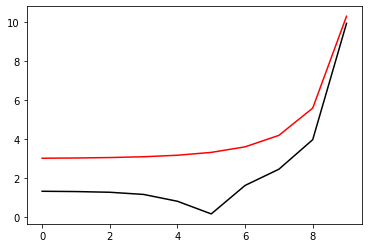

4000 98.04177375544917 -2.224803710318525 -2.1668734027973677
[1.32008018 1.30496139 1.26812869 1.15593776 0.80684182 0.16335352
 1.61646207 2.45153266 3.96585449 9.93412922]


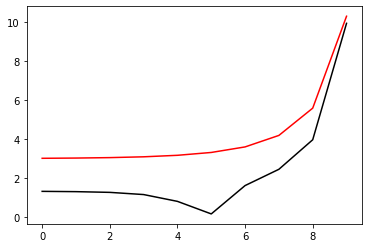

4100 98.04164002277842 -2.22436920075083 -2.1726886378550088
[1.3198929  1.30445006 1.2669065  1.15409348 0.80617539 0.16807092
 1.61426969 2.45143983 3.96612816 9.93384275]


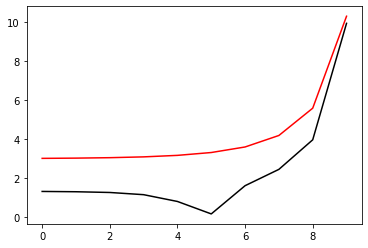

4200 98.04150733284912 -2.22393463990743 -2.178498398753376
[1.31969679 1.30393459 1.26569028 1.15226478 0.80552117 0.17275522
 1.61209264 2.4513467  3.96640305 9.93355632]


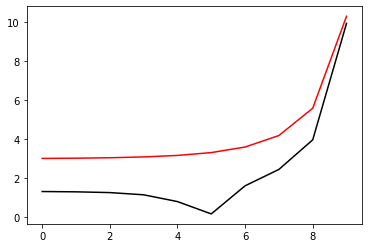

4300 98.04137567006981 -2.223500029497219 -2.1843027158142037
[1.31949199 1.30341506 1.26447993 1.1504515  0.80487902 0.17740665
 1.60993081 2.45125328 3.96667918 9.93326991]


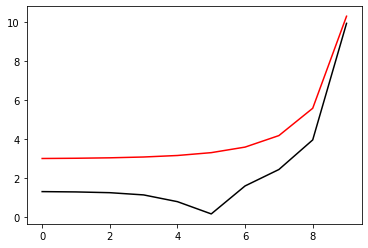

4400 98.04124501910715 -2.223065371146726 -2.1901016193932463
[1.31927861 1.30289149 1.26327538 1.1486535  0.80424878 0.18202548
 1.60778407 2.45115956 3.96695652 9.93298352]


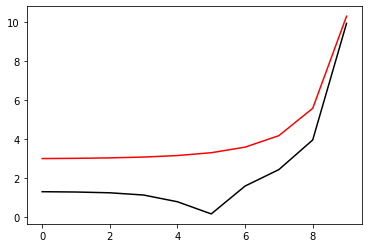

4500 98.04111536488104 -2.222630666401348 -2.1958951398807027
[1.31905679 1.30236396 1.26207653 1.14687064 0.80363028 0.18661196
 1.60565234 2.45106554 3.96723507 9.93269717]


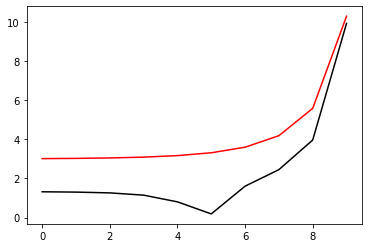

4600 98.04098669256014 -2.222195916726547 -2.2016833077016695
[1.31882667 1.30183249 1.26088332 1.14510277 0.80302339 0.19116633
 1.60353549 2.45097124 3.96751483 9.93241084]


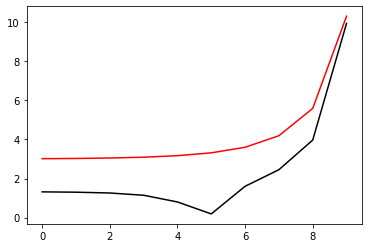

4700 98.04085898755714 -2.2217611235090025 -2.2074661533166315
[1.31858835 1.30129716 1.25969566 1.14334974 0.80242794 0.19568884
 1.60143341 2.45087666 3.96779577 9.93212454]


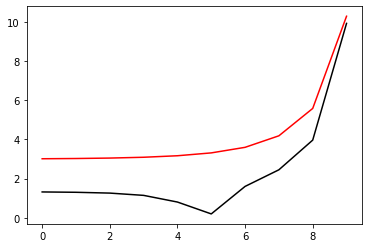

4800 98.04073223552449 -2.2213262880577305 -2.2132437072219724
[1.31834197 1.300758   1.25851349 1.14161142 0.80184378 0.20017973
 1.59934601 2.4507818  3.9680779  9.93183826]


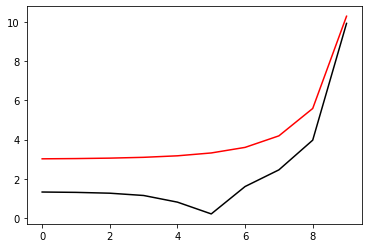

4900 98.04060642234975 -2.2208914116051592 -2.2190159999505146
[1.31808764 1.30021508 1.25733671 1.13988765 0.80127078 0.20463924
 1.59727317 2.45068665 3.96836121 9.93155202]


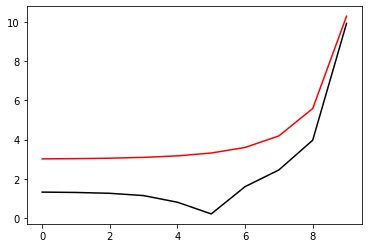

5000 98.04048153415161 -2.2204564953081722 -2.224783062072077
[1.31782549 1.29966842 1.25616527 1.1381783  0.80070878 0.20906762
 1.5952148  2.45059124 3.96864569 9.9312658 ]


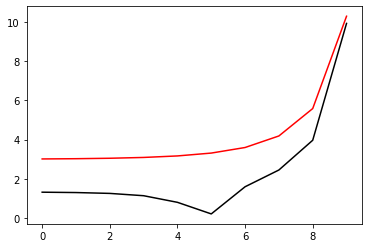

5100 98.0403575572753 -2.2200215402491192 -2.230544924194089
[1.31755564 1.2991181  1.25499909 1.13648322 0.80015763 0.2134651
 1.59317078 2.45049555 3.96893132 9.9309796 ]


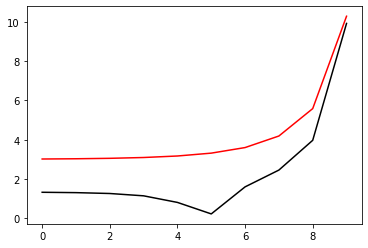

5200 98.04023447828872 -2.219586547436785 -2.2363016169621908
[1.31727818 1.29856415 1.25383809 1.13480228 0.7996172  0.21783191
 1.59114101 2.4503996  3.96921811 9.93069344]


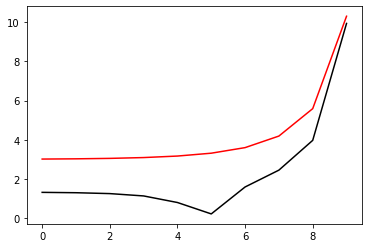

5300 98.0401122839783 -2.219151517807334 -2.2420531710608933
[1.31699325 1.29800662 1.25268222 1.13313534 0.79908734 0.22216829
 1.58912539 2.45030338 3.96950605 9.9304073 ]


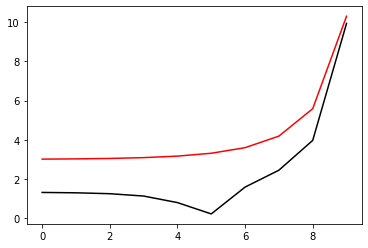

5400 98.03999096134501 -2.218716452225215 -2.247799617214251
[1.31670095 1.29744557 1.25153141 1.13148225 0.79856791 0.22647448
 1.58712382 2.45020691 3.96979513 9.93012119]


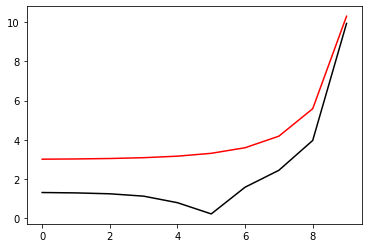

5500 98.03987049760038 -2.218281351484045 -2.253540986186565
[1.31640138 1.29688104 1.25038558 1.12984288 0.79805878 0.23075069
 1.58513619 2.45011018 3.97008533 9.92983511]


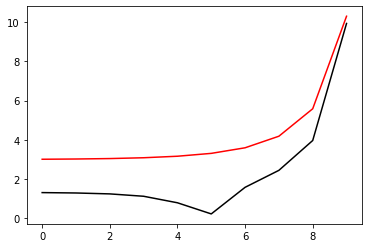

5600 98.03975088016286 -2.21784621630745 -2.2592773087831093
[1.31609467 1.29631308 1.24924468 1.1282171  0.7975598  0.23499717
 1.58316241 2.4500132  3.97037666 9.92954906]


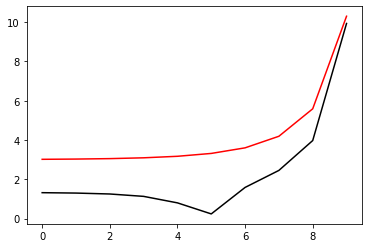

5700 98.03963209665385 -2.2174110473498874 -2.2650086158508866
[1.31578091 1.29574173 1.24810865 1.12660476 0.79707084 0.23921413
 1.58120238 2.44991596 3.97066911 9.92926303]


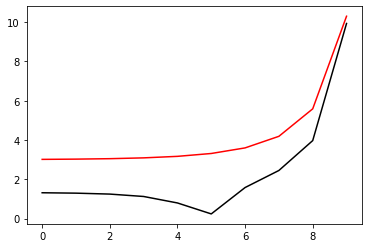

5800 98.03951413489412 -2.2169758451974335 -2.270734938279408
[1.3154602  1.29516705 1.24697742 1.12500574 0.79659177 0.24340179
 1.579256   2.44981849 3.97096267 9.92897703]


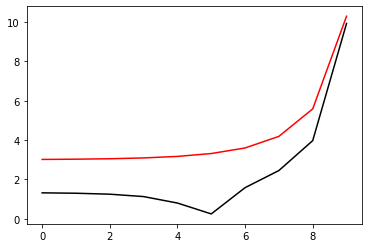

5900 98.03939698290009 -2.2165406103685474 -2.2764563070015145
[1.31513266 1.29458908 1.24585093 1.1234199  0.79612244 0.24756039
 1.57732316 2.44972077 3.97125733 9.92869106]


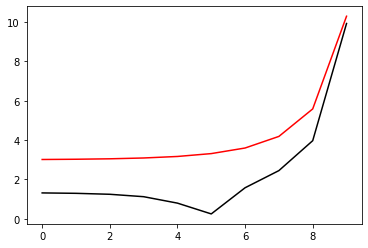

6000 98.03928062888045 -2.2161053433148066 -2.2821727529941893
[1.31479838 1.29400786 1.24472912 1.12184711 0.79566274 0.25169014
 1.57540378 2.44962282 3.97155309 9.92840512]


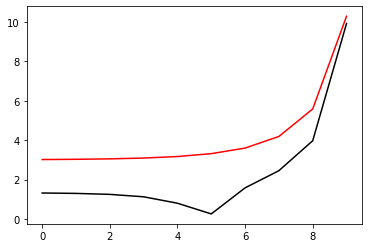

6100 98.03916506123248 -2.2156700444216106 -2.287884307279443
[1.31445745 1.29342345 1.24361194 1.12028723 0.79521254 0.25579125
 1.57349776 2.44952464 3.97184994 9.9281192 ]


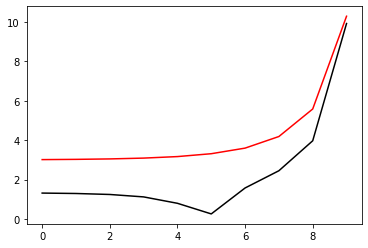

6200 98.03905026853877 -2.215234714008871 -2.293591000925186
[1.31410999 1.29283589 1.24249933 1.11874014 0.79477169 0.25986395
 1.57160499 2.44942622 3.97214787 9.92783332]


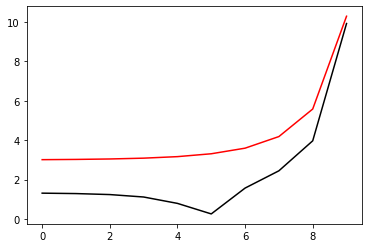

6300 98.03893623956372 -2.214799352331662 -2.299292865046149
[1.31375609 1.29224522 1.24139124 1.1172057  0.79434008 0.26390845
 1.5697254  2.44932758 3.97244688 9.92754746]


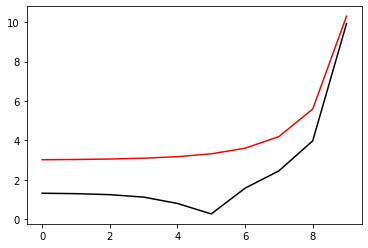

6400 98.03882296325037 -2.2143639595808597 -2.3049899308048234
[1.31339583 1.29165149 1.24028761 1.11568378 0.79391758 0.26792497
 1.56785887 2.44922872 3.97274696 9.92726163]


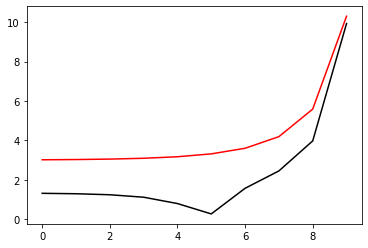

6500 98.03871042871712 -2.21392853588375 -2.310682229412434
[1.31302932 1.29105474 1.23918838 1.11417427 0.79350406 0.27191371
 1.56600532 2.44912964 3.97304811 9.92697582]


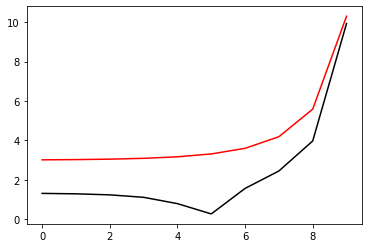

6600 98.03859862525451 -2.2134930813046103 -2.316369792129928
[1.31265665 1.29045502 1.23809351 1.11267702 0.7930994  0.27587488
 1.56416466 2.44903035 3.97335031 9.92669005]


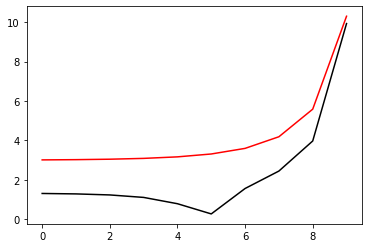

6700 98.03848754232212 -2.2130575958452816 -2.3220526502690038
[1.3122779  1.28985238 1.23700294 1.11119192 0.79270348 0.27980869
 1.56233679 2.44893085 3.97365357 9.9264043 ]


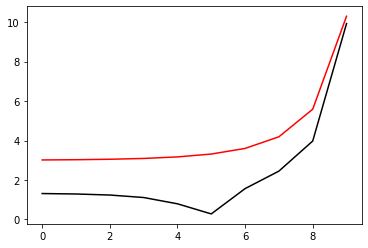

6800 98.03837716954557 -2.2126220794457003 -2.3277308351931536
[1.31189317 1.28924684 1.23591663 1.10971884 0.79231618 0.28371534
 1.56052162 2.44883114 3.97395787 9.92611858]


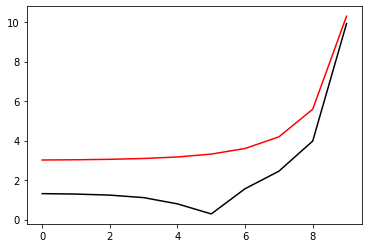

6900 98.03826749671342 -2.212186531984424 -2.33340437831874
[1.31150255 1.28863847 1.23483452 1.10825766 0.79193738 0.28759505
 1.55871906 2.44873124 3.97426321 9.92583289]


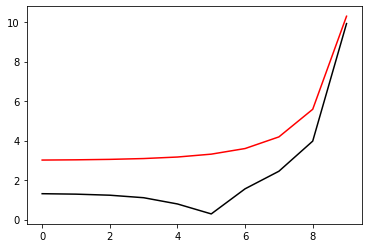

7000 98.03815851377423 -2.2117509532791275 -2.3390733111161097
[1.31110612 1.28802729 1.23375657 1.10680825 0.79156696 0.29144801
 1.55692902 2.44863113 3.97456959 9.92554723]


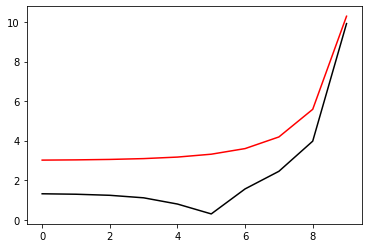

7100 98.03805021083384 -2.2113153430870764 -2.3447376651107072
[1.31070398 1.28741336 1.23268272 1.10537049 0.7912048  0.29527442
 1.55515142 2.44853083 3.974877   9.9252616 ]


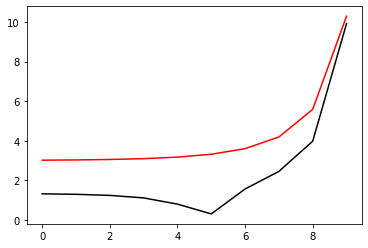

7200 98.0379425781522 -2.210879701105588 -2.3503974718842504
[1.31029619 1.28679671 1.23161294 1.10394426 0.79085078 0.29907449
 1.55338616 2.44843035 3.97518543 9.924976  ]


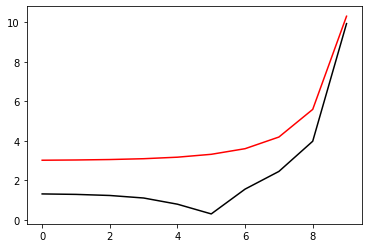

7300 98.03783560614083 -2.210444026972465 -2.3560527630759043
[1.30988285 1.28617738 1.23054718 1.10252944 0.7905048  0.30284841
 1.55163315 2.44832967 3.97549489 9.92469042]


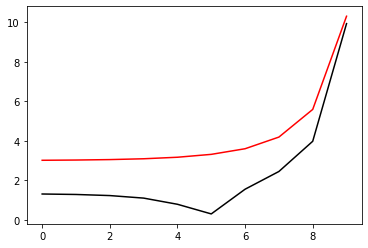

7400 98.03772928536002 -2.2100083202664105 -2.361703570383498
[1.30946404 1.28555543 1.22948538 1.10112591 0.79016674 0.30659637
 1.54989232 2.44822882 3.97580535 9.92440487]


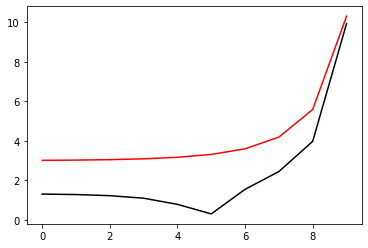

7500 98.03762360651605 -2.209572580507426 -2.3673499255647728
[1.30903985 1.28493087 1.22842752 1.09973355 0.78983649 0.31031857
 1.54816356 2.44812779 3.97611682 9.92411935]


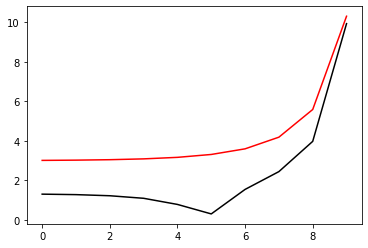

7600 98.03751856045874 -2.20913680715719 -2.3729918604386495
[1.30861034 1.28430377 1.22737353 1.09835224 0.78951393 0.3140152
 1.5464468  2.44802658 3.9764293  9.92383386]


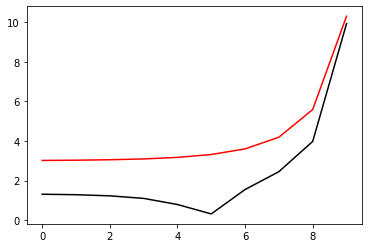

7700 98.03741413817856 -2.208700999619415 -2.3786294068865197
[1.3081756  1.28367415 1.22632339 1.09698188 0.78919896 0.31768645
 1.54474195 2.44792521 3.97674277 9.9235484 ]


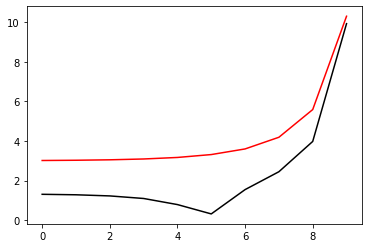

7800 98.0373103308044 -2.2082651572401875 -2.3842625968535853
[1.30773571 1.28304206 1.22527705 1.09562233 0.78889147 0.32133252
 1.54304893 2.44782367 3.97705723 9.92326297]


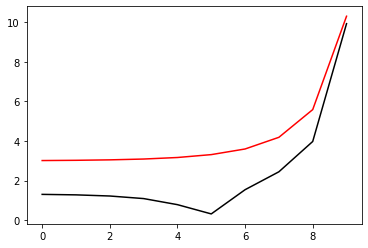

7900 98.03720712960082 -2.207829279308291 -2.389891462350206
[1.30729074 1.28240753 1.22423447 1.0942735  0.78859134 0.32495358
 1.54136764 2.44772197 3.97737268 9.92297757]


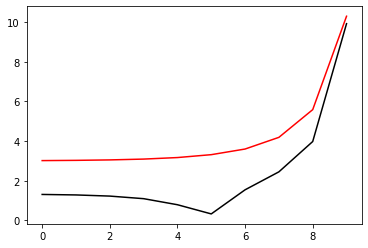

8000 98.0371045259657 -2.2073933650555073 -2.395516035453291
[1.30684077 1.2817706  1.2231956  1.09293526 0.78829848 0.32854983
 1.53969802 2.44762011 3.97768912 9.92269219]


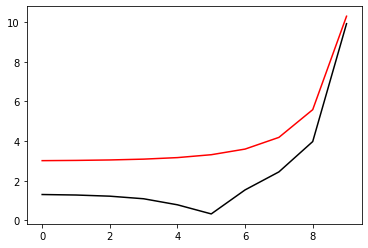

8100 98.03700251142779 -2.206957413656909 -2.40113634830771
[1.30638587 1.28113132 1.22216041 1.0916075  0.78801277 0.33212144
 1.53803997 2.4475181  3.97800653 9.92240685]


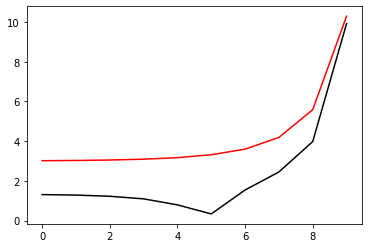

8200 98.0369010776444 -2.2065214242311186 -2.406752433127739
[1.30592613 1.28048971 1.22112886 1.09029011 0.78773412 0.33566861
 1.53639342 2.44741595 3.97832492 9.92212153]


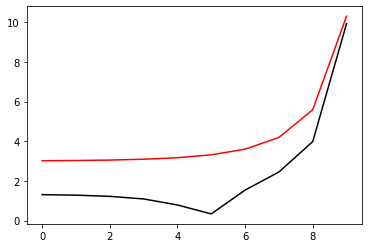

8300 98.03680021639902 -2.206085395840566 -2.412364322198539
[1.3054616  1.27984582 1.22010091 1.08898299 0.78746241 0.33919151
 1.53475827 2.44731364 3.97864427 9.92183624]


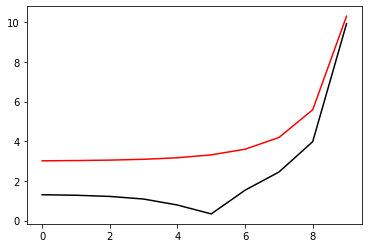

8400 98.03669991959897 -2.2056493274917233 -2.4179720478776567
[1.30499236 1.27919968 1.21907652 1.08768601 0.78719756 0.34269033
 1.53313446 2.4472112  3.97896459 9.92155098]


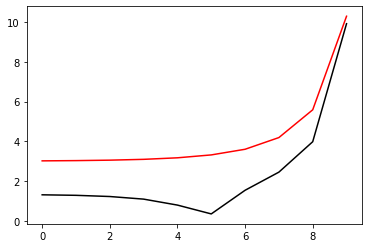

8500 98.03660017927331 -2.205213218135318 -2.423575642596566
[1.30451848 1.27855134 1.21805565 1.08639908 0.78693944 0.34616523
 1.5315219  2.44710862 3.97928586 9.92126575]


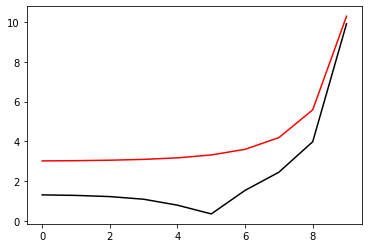

8600 98.03650098757045 -2.2047770666665345 -2.4291751388622305
[1.30404004 1.27790081 1.21703827 1.08512208 0.78668798 0.3496164
 1.52992051 2.44700591 3.9796081  9.92098055]


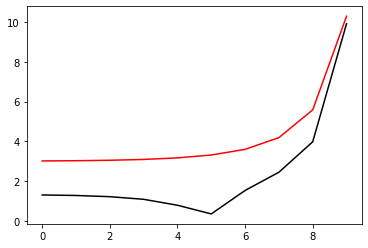

8700 98.0364023367561 -2.2043408719252024 -2.434770569258709
[1.30355709 1.27724815 1.21602434 1.0838549  0.78644306 0.35304401
 1.5283302  2.44690307 3.97993128 9.92069538]


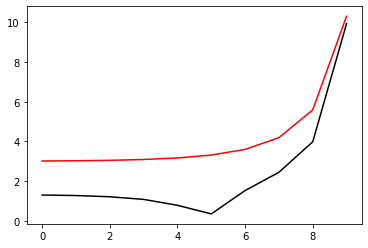

8800 98.03630421921117 -2.2039046326959584 -2.440361966448774
[1.30306972 1.27659338 1.21501383 1.08259745 0.78620459 0.35644824
 1.52675092 2.44680011 3.98025541 9.92041024]


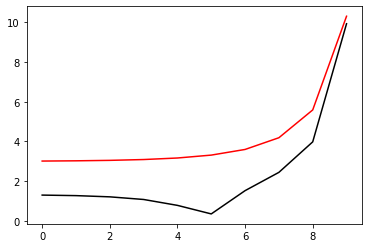

8900 98.0362066274295 -2.2034683477083994 -2.4459493631755955
[1.30257797 1.27593654 1.2140067  1.08134961 0.78597246 0.35982926
 1.52518257 2.44669703 3.98058048 9.92012513]


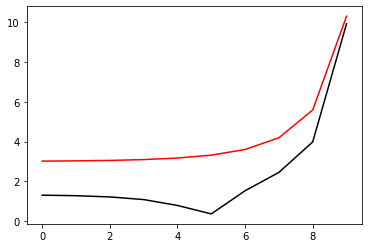

9000 98.036109554016 -2.20303201563722 -2.4515327922644135
[1.30208193 1.27527767 1.21300291 1.08011129 0.7857466  0.36318723
 1.52362507 2.44659383 3.98090648 9.91984004]


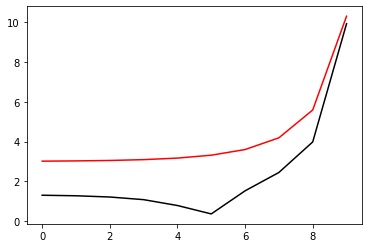

9100 98.0360129916845 -2.2025956351023277 -2.457112286624277
[1.30158165 1.2746168  1.21200243 1.07888237 0.78552689 0.36652233
 1.52207836 2.44649052 3.98123343 9.91955499]


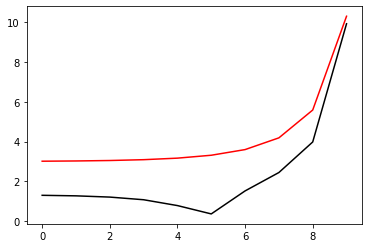

9200 98.03591693325582 -2.2021592046689498 -2.46268787924981
[1.3010772  1.27395396 1.21100523 1.07766276 0.78531324 0.36983473
 1.52054235 2.4463871  3.9815613  9.91926996]


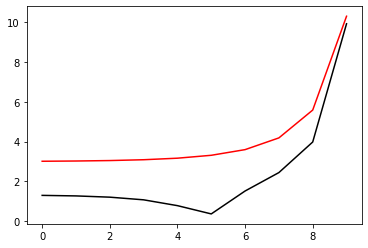

9300 98.03582137165589 -2.2017227228477196 -2.4682596032230033
[1.30056865 1.27328919 1.21001128 1.07645235 0.78510557 0.37312459
 1.51901697 2.44628357 3.9818901  9.91898497]


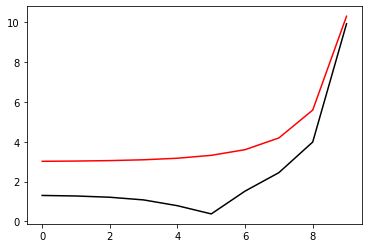

9400 98.03572629991363 -2.2012861880947474 -2.4738274917150442
[1.30005605 1.27262251 1.20902053 1.07525104 0.78490378 0.37639208
 1.51750214 2.44617995 3.98221981 9.9187    ]


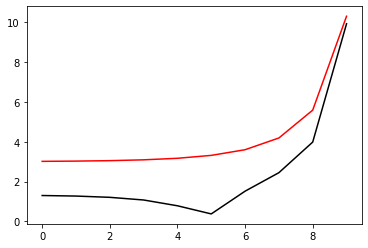

9500 98.03563171115928 -2.2008495988116774 -2.4793915779881806
[1.29953947 1.27195397 1.20803297 1.07405874 0.78470777 0.37963735
 1.51599779 2.44607623 3.98255045 9.91841507]


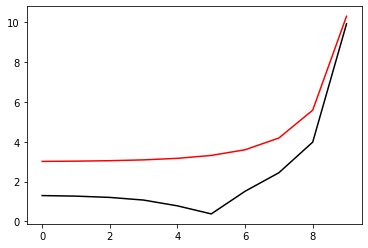

9600 98.0355375986224 -2.2004129533457273 -2.4849518953976246
[1.29901896 1.27128359 1.20704855 1.07287535 0.78451746 0.38286058
 1.51450384 2.44597242 3.982882   9.91813016]


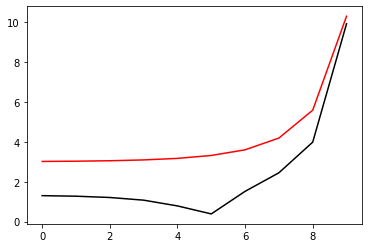

9700 98.03544395563011 -2.199976249989715 -2.4905084773934862
[1.29849459 1.2706114  1.20606725 1.07170076 0.78433276 0.38606192
 1.51302023 2.44586853 3.98321447 9.91784528]


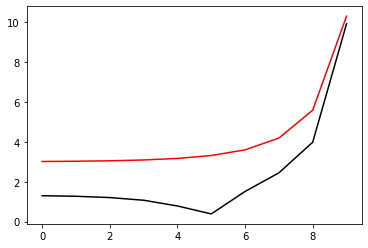

9800 98.03535077560538 -2.1995394869820695 -2.4960613575227546
[1.29796642 1.26993744 1.20508903 1.07053487 0.78415357 0.38924153
 1.51154687 2.44576455 3.98354784 9.91756043]


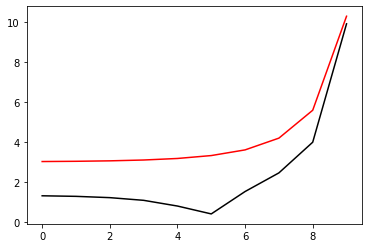

9900 98.03525805206506 -2.19910266250682 -2.5016105694312922
[1.2974345  1.26926174 1.20411386 1.0693776  0.78397982 0.39239958
 1.5100837  2.44566049 3.98388211 9.91727562]


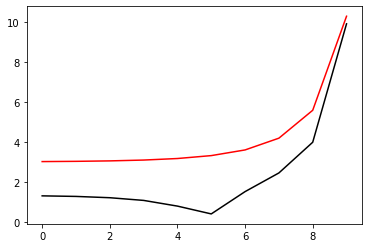

10000 98.0351657786184 -2.1986657746935787 -2.5071561468658974
[1.2968989  1.26858433 1.20314172 1.06822885 0.78381141 0.39553621
 1.50863065 2.44555635 3.98421728 9.91699083]


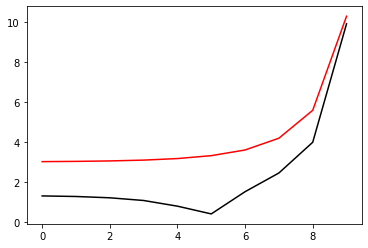

In [90]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 98.03507394896528 -2.198228821617504 -2.5126981236763815
[1.29635967 1.26790524 1.20217257 1.06708852 0.78364825 0.39865158
 1.50718763 2.44545214 3.98455335 9.91670607]


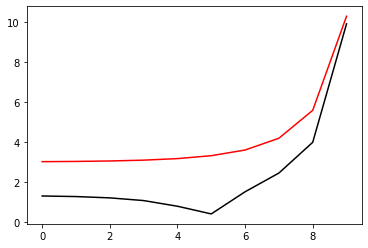

200 98.03498255689435 -2.1977918012992483 -2.5182365338176944
[1.29581686 1.26722449 1.20120638 1.06595652 0.78349027 0.40174584
 1.50575458 2.44534787 3.98489032 9.91642134]


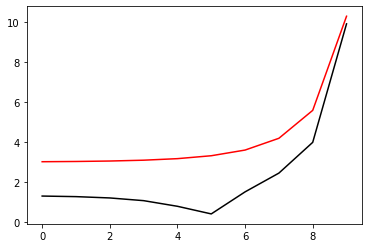

300 98.0348915962816 -2.197354711704889 -2.523771411352094
[1.29527054 1.26654212 1.20024313 1.06483276 0.78333737 0.40481916
 1.50433144 2.44524353 3.98522817 9.91613664]


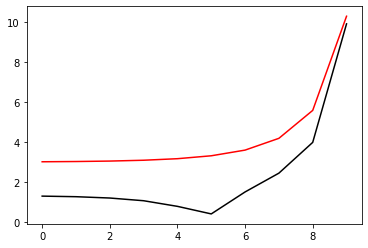

400 98.03480106108876 -2.1969175507458476 -2.529302790451338
[1.29472075 1.26585816 1.19928278 1.06371713 0.78318948 0.40787167
 1.50291812 2.44513913 3.98556691 9.91585197]


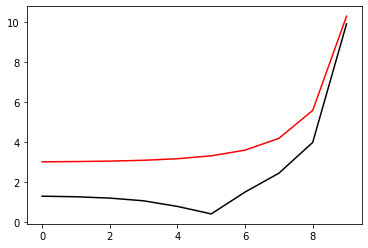

500 98.03471094536157 -2.1964803162787923 -2.534830705398936
[1.29416755 1.26517263 1.19832531 1.06260956 0.78304651 0.41090353
 1.50151457 2.44503468 3.98590653 9.91556733]


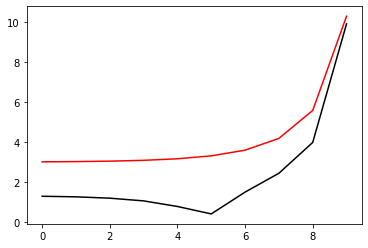

600 98.03462124322834 -2.196043006105522 -2.5403551905924457
[1.29361099 1.26448557 1.19737069 1.06150995 0.78290837 0.41391489
 1.50012071 2.44493018 3.98624703 9.91528273]


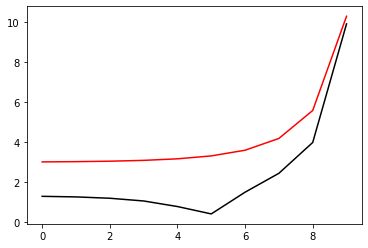

700 98.0345319488983 -2.1956056179728374 -2.5458762805457704
[1.29305113 1.263797   1.19641889 1.06041821 0.782775   0.4169059
 1.49873647 2.44482562 3.98658841 9.91499815]


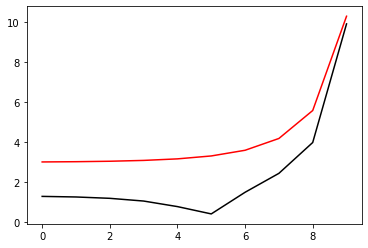

800 98.0344430566603 -2.195168149572401 -2.551394009891562
[1.29248802 1.26310695 1.19546988 1.05933425 0.78264629 0.4198767
 1.49736178 2.44472103 3.98693067 9.9147136 ]


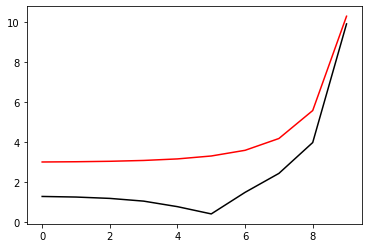

900 98.03435456088108 -2.1947305985405694 -2.5569084133836197
[1.29192171 1.26241544 1.19452364 1.05825799 0.78252219 0.42282743
 1.49599658 2.44461639 3.98727379 9.91442908]


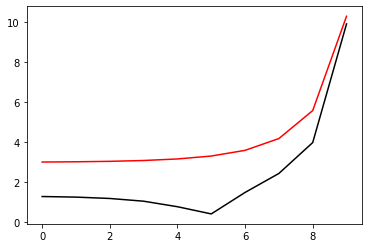

1000 98.03426645600398 -2.1942929624582246 -2.5624195258993527
[1.29135225 1.26172251 1.19358013 1.05718933 0.7824026  0.42575824
 1.4946408  2.44451172 3.98761779 9.91414459]


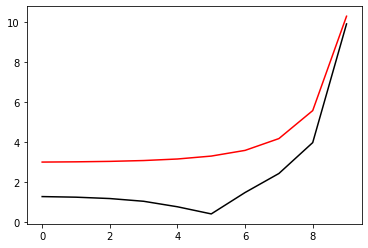

1100 98.03417873654739 -2.1938552388505785 -2.5679273824422744
[1.29077968 1.26102818 1.19263934 1.05612819 0.78228746 0.42866927
 1.49329438 2.44440701 3.98796265 9.91386013]


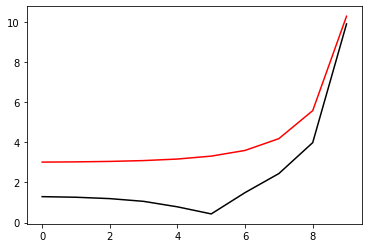

1200 98.0340913971035 -2.1934174251869663 -2.5734320181445596
[1.29020407 1.26033248 1.19170124 1.05507448 0.78217667 0.43156067
 1.49195724 2.44430228 3.98830837 9.9135757 ]


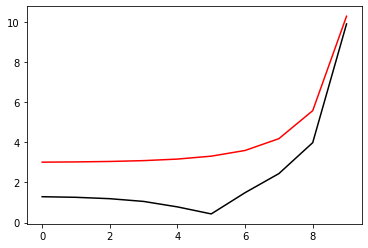

1300 98.0340044323368 -2.192979518880621 -2.578933468269647
[1.28962545 1.25963543 1.19076579 1.05402812 0.78207017 0.43443257
 1.49062932 2.44419752 3.98865495 9.91329131]


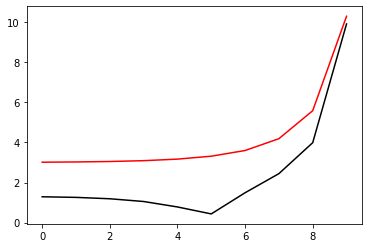

1400 98.03391783698262 -2.192541517288441 -2.5844317682148743
[1.28904388 1.25893705 1.18983298 1.05298903 0.78196788 0.43728511
 1.48931056 2.44409274 3.98900239 9.91300694]


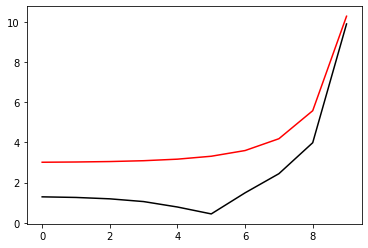

1500 98.0338316058461 -2.1921034177107233 -2.589926953514171
[1.2884594  1.25823738 1.18890278 1.05195711 0.78186973 0.44011843
 1.48800089 2.44398794 3.98935068 9.9127226 ]


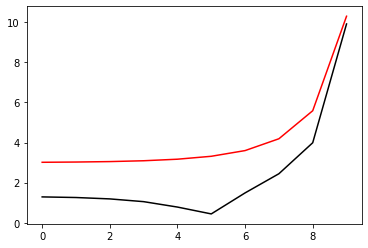

1600 98.03374573380054 -2.191665217390903 -2.5954190598408045
[1.28787207 1.25753644 1.18797516 1.05093229 0.78177564 0.44293266
 1.48670025 2.44388314 3.98969982 9.9124383 ]


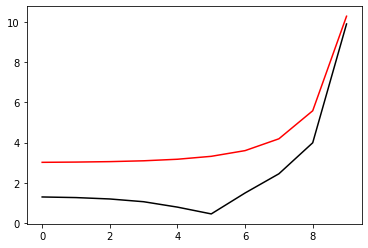

1700 98.03366021578626 -2.191226913515257 -2.6009081230101723
[1.28728191 1.25683425 1.1870501  1.04991448 0.78168553 0.44572794
 1.48540856 2.44377832 3.99004981 9.91215402]


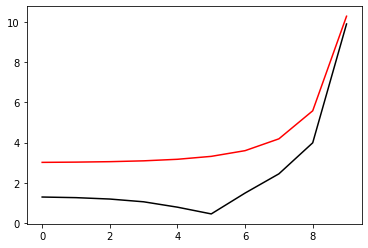

1800 98.03357504680936 -2.190788503212605 -2.6063941789826424
[1.28668899 1.25613084 1.18612757 1.04890361 0.78159933 0.44850441
 1.48412578 2.44367349 3.99040065 9.91186977]


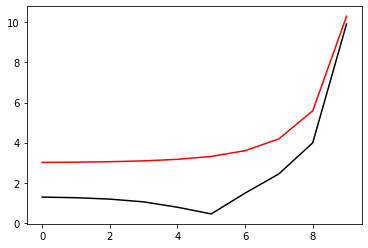

1900 98.03349022194027 -2.1903499835539813 -2.6118772638664556
[1.28609335 1.25542623 1.18520754 1.04789958 0.78151698 0.45126219
 1.48285183 2.44356866 3.99075234 9.91158556]


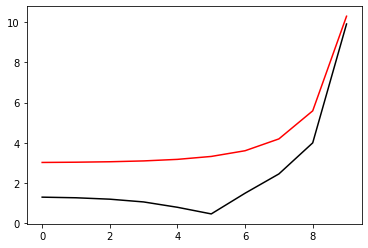

2000 98.03340573631276 -2.189911351552302 -2.6173574139206717
[1.28549502 1.25472045 1.18429001 1.04690233 0.78143839 0.45400141
 1.48158666 2.44346384 3.99110486 9.91130137]


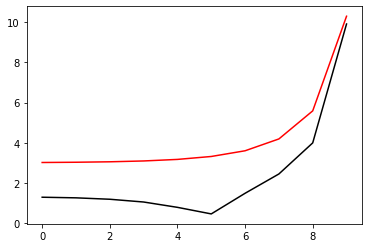

2100 98.03332158512262 -2.189472604162006 -2.6228346655581727
[1.28489406 1.25401351 1.18337493 1.04591176 0.7813635  0.45672222
 1.4803302  2.44335902 3.99145822 9.91101722]


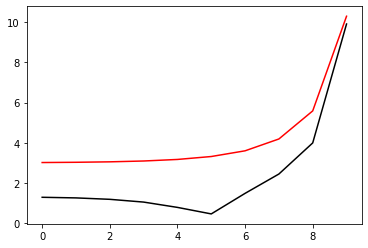

2200 98.03323776362635 -2.1890337382786855 -2.6283090553487254
[1.28429051 1.25330544 1.18246228 1.04492781 0.78129224 0.45942473
 1.47908238 2.4432542  3.99181243 9.91073309]


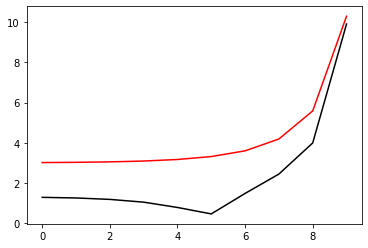

2300 98.03315426714016 -2.18859475073869 -2.6337806200220997
[1.28368441 1.25259627 1.18155205 1.04395039 0.78122454 0.46210907
 1.47784315 2.4431494  3.99216746 9.910449  ]


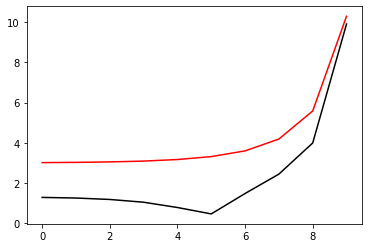

2400 98.03307109103864 -2.1881556383187237 -2.6392493964712402
[1.2830758  1.25188601 1.18064421 1.04297943 0.78116032 0.46477538
 1.47661245 2.44304462 3.99252333 9.91016494]


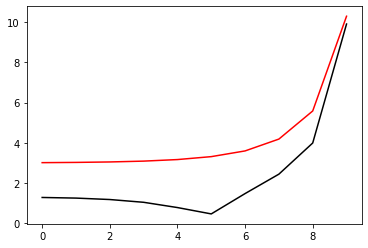

2500 98.03298823075384 -2.187716397735416 -2.6447154217555053
[1.28246472 1.25117469 1.17973873 1.04201485 0.78109953 0.46742377
 1.47539021 2.44293986 3.99288003 9.90988091]


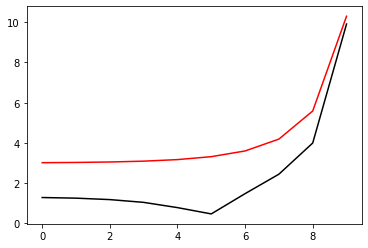

2600 98.03290568177388 -2.1872770256448786 -2.650178733103957
[1.28185122 1.25046233 1.17883559 1.04105657 0.78104209 0.47005438
 1.47417638 2.44283511 3.99323755 9.90959691]


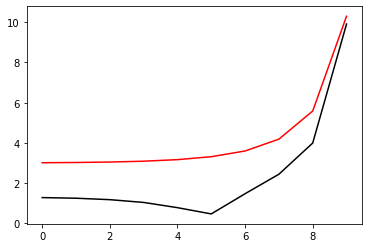

2700 98.03282343964194 -2.1868375186422417 -2.655639367918715
[1.28123533 1.24974895 1.17793477 1.04010452 0.78098793 0.47266731
 1.47297089 2.4427304  3.9935959  9.90931294]


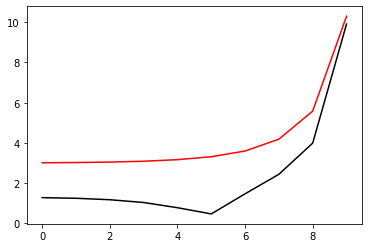

2800 98.03274149995539 -2.1863978732611753 -2.661097363778385
[1.2806171  1.24903457 1.17703624 1.03915862 0.78093699 0.47526271
 1.47177369 2.44262571 3.99395508 9.909029  ]


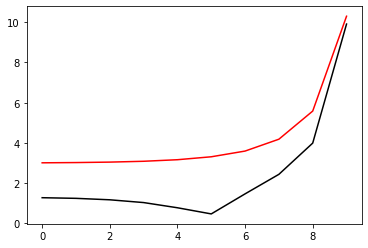

2900 98.03265985836431 -2.1859580859733874 -2.6665527584415387
[1.27999656 1.24831922 1.17613999 1.0382188  0.78088921 0.47784068
 1.47058472 2.44252106 3.99431508 9.90874509]


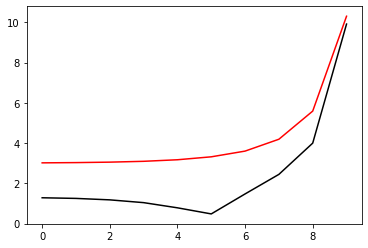

3000 98.03257851057072 -2.185518153188101 -2.6720055898502584
[1.27937376 1.2476029  1.17524599 1.03728498 0.78084451 0.48040136
 1.46940391 2.44241645 3.99467589 9.90846121]


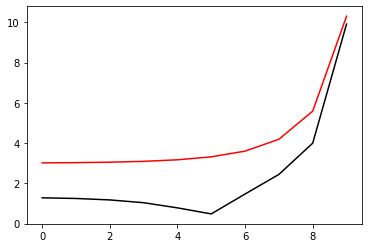

3100 98.03249745232746 -2.185078071251522 -2.6774558961337567
[1.27874872 1.24688565 1.17435421 1.03635709 0.78080283 0.48294485
 1.46823121 2.44231188 3.99503753 9.90817737]


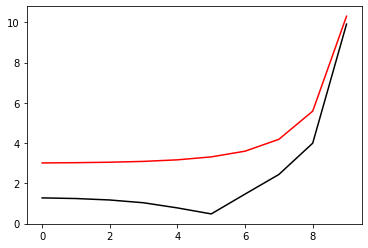

3200 98.03241667943709 -2.1846378364462735 -2.6829037156120576
[1.2781215  1.24616749 1.17346464 1.03543506 0.78076411 0.48547127
 1.46706656 2.44220735 3.99539998 9.90789355]


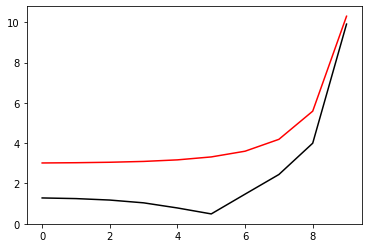

3300 98.03233618775101 -2.1841974449908217 -2.688349086799764
[1.27749212 1.24544842 1.17257725 1.03451882 0.78072829 0.48798075
 1.46590991 2.44210286 3.99576324 9.90760977]


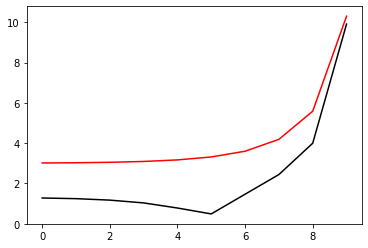

3400 98.03225597316838 -2.1837568930388733 -2.6937920484098754
[1.27686063 1.24472848 1.17169203 1.03360829 0.7806953  0.49047339
 1.46476119 2.44199843 3.99612732 9.90732601]


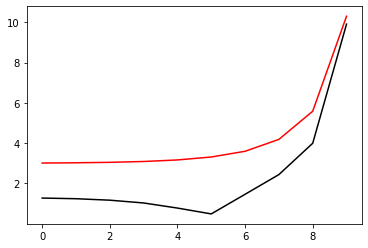

3500 98.03217603163506 -2.1833161766787565 -2.6992326393576764
[1.27622706 1.24400767 1.17080894 1.03270341 0.78066508 0.49294932
 1.46362035 2.44189405 3.9964922  9.90704229]


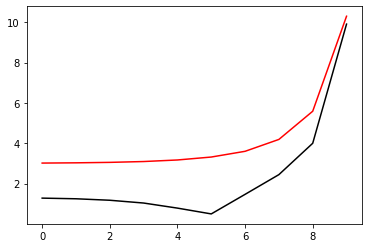

3600 98.0320963591428 -2.182875291932778 -2.7046708987647357
[1.27559144 1.24328603 1.16992798 1.0318041  0.78063756 0.49540865
 1.46248733 2.44178973 3.9968579  9.9067586 ]


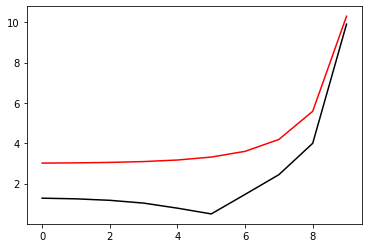

3700 98.03201695172817 -2.1824342347565624 -2.710106865962943
[1.27495382 1.24256356 1.16904911 1.03091029 0.78061269 0.49785148
 1.46136208 2.44168547 3.9972244  9.90647494]


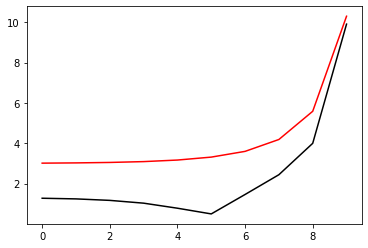

3800 98.03193780547163 -2.1819930010383644 -2.7155405804986374
[1.27431422 1.24184029 1.16817231 1.03002192 0.78059041 0.50027793
 1.46024453 2.44158127 3.99759171 9.90619131]


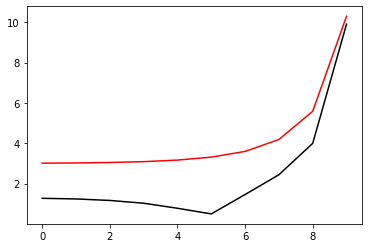

3900 98.03185891649663 -2.1815515865983595 -2.720972082136828
[1.27367268 1.24111623 1.16729757 1.02913892 0.78057065 0.50268812
 1.45913465 2.44147714 3.99795982 9.90590771]


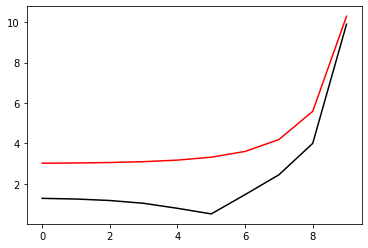

4000 98.03178028096868 -2.1811099871879196 -2.726401410865475
[1.27302924 1.2403914  1.16642486 1.02826121 0.78055335 0.50508215
 1.45803236 2.44137308 3.99832874 9.90562415]


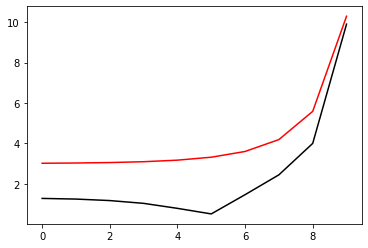

4100 98.03170189509436 -2.1806681984888523 -2.7318286068998754
[1.27238393 1.23966582 1.16555416 1.02738874 0.78053846 0.50746013
 1.45693761 2.4412691  3.99869845 9.90534061]


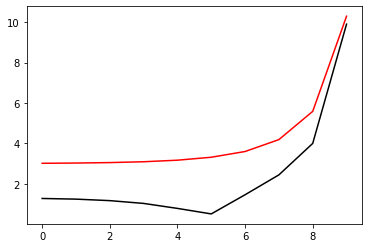

4200 98.03162375512053 -2.1802262161126276 -2.7372537106871118
[1.27173677 1.23893951 1.16468545 1.02652143 0.78052591 0.50982216
 1.45585036 2.44116518 3.99906896 9.90505711]


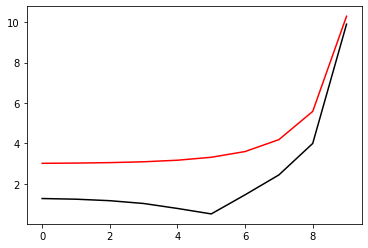

4300 98.03154585733347 -2.1797840355995746 -2.742676762910614
[1.27108782 1.23821247 1.16381871 1.02565922 0.78051566 0.51216836
 1.45477054 2.44106135 3.99944027 9.90477364]


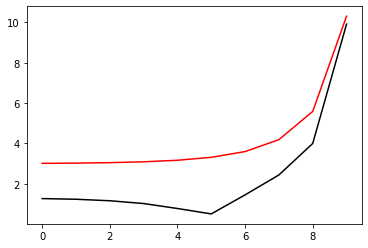

4400 98.03146819805784 -2.179341652418056 -2.7480978044948006
[1.27043708 1.23748473 1.16295392 1.02480204 0.78050763 0.51449883
 1.4536981  2.4409576  3.99981238 9.9044902 ]


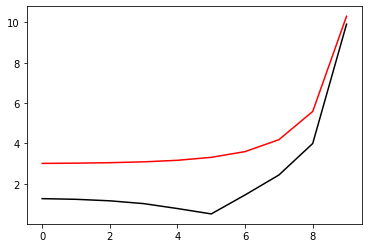

4500 98.03139077365606 -2.1788990619636115 -2.7535168766097993
[1.26978461 1.23675631 1.16209106 1.02394983 0.78050178 0.51681368
 1.45263299 2.44085394 4.00018528 9.90420679]


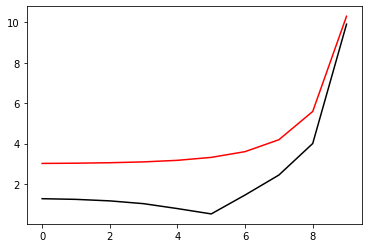

4600 98.03131358052713 -2.178456259558089 -2.758934020676285
[1.26913042 1.23602721 1.16123011 1.02310252 0.78049804 0.519113
 1.45157516 2.44075036 4.00055898 9.90392341]


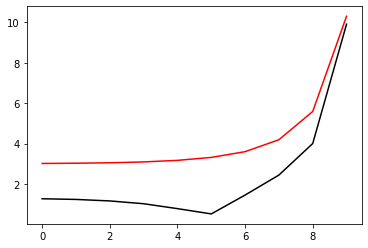

4700 98.03123661510611 -2.178013240448731 -2.764349278370386
[1.26847456 1.23529746 1.16037105 1.02226005 0.78049636 0.5213969
 1.45052455 2.44064688 4.00093347 9.90364007]


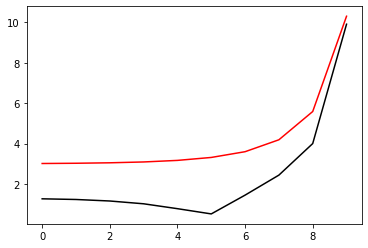

4800 98.0311598738631 -2.1775699998072517 -2.769762691628726
[1.26781705 1.23456707 1.15951385 1.02142236 0.78049669 0.52366549
 1.4494811  2.44054349 4.00130874 9.90335675]


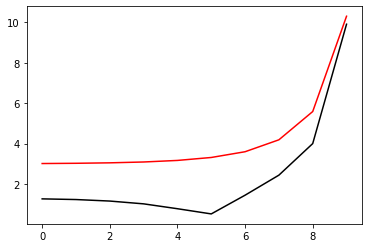

4900 98.03108335330255 -2.1771265327288756 -2.775174302653532
[1.26715791 1.23383606 1.1586585  1.02058937 0.78049896 0.52591886
 1.44844477 2.4404402  4.00168481 9.90307347]


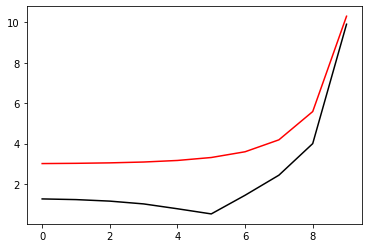

5000 98.03100704996228 -2.1766828342313485 -2.7805841539178724
[1.26649719 1.23310443 1.15780497 1.01976103 0.78050313 0.52815711
 1.44741551 2.440337   4.00206167 9.90279022]


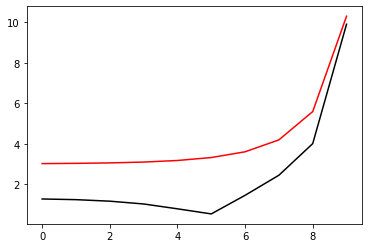

5100 98.03093096041273 -2.176238899253924 -2.785992288170977
[1.26583491 1.23237221 1.15695326 1.01893728 0.78050914 0.53038034
 1.44639326 2.44023391 4.00243931 9.902507  ]


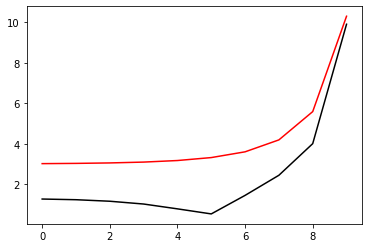

5200 98.03085508125628 -2.1757947226563217 -2.79139874844369
[1.26517109 1.2316394  1.15610333 1.01811804 0.78051693 0.53258866
 1.44537797 2.44013093 4.00281774 9.90222381]


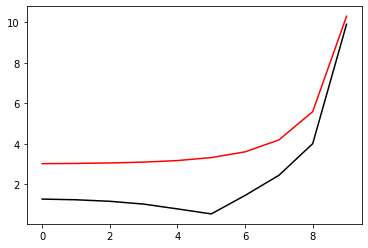

5300 98.03077940912642 -2.1753502992176488 -2.7968035780540204
[1.26450577 1.23090603 1.15525516 1.01730328 0.78052645 0.53478215
 1.44436959 2.44002805 4.00319696 9.90194066]


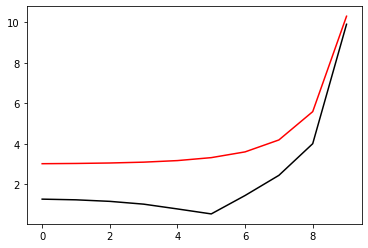

5400 98.0307039406868 -2.1749056236352953 -2.8022068206128137
[1.26383898 1.23017211 1.15440875 1.01649291 0.78053765 0.53696091
 1.44336807 2.43992529 4.00357696 9.90165753]


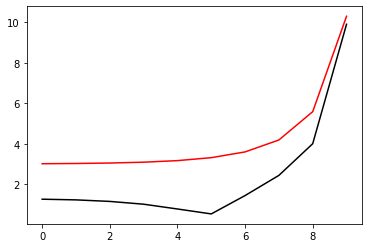

5500 98.03062867263064 -2.174460690523797 -2.8076085200295307
[1.26317074 1.22943764 1.15356405 1.01568688 0.78055047 0.53912504
 1.44237335 2.43982264 4.00395774 9.90137444]


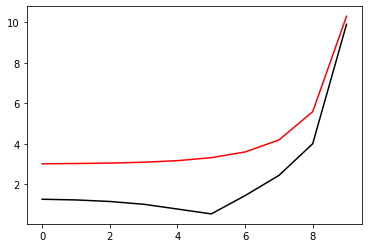

5600 98.03055360167994 -2.174015494413665 -2.813008720518163
[1.26250108 1.22870264 1.15272107 1.01488513 0.78056486 0.54127464
 1.4413854  2.4397201  4.0043393  9.90109138]


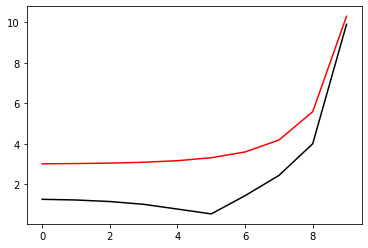

5700 98.0304787245847 -2.173570029750187 -2.8184074666032526
[1.26183002 1.22796713 1.15187978 1.0140876  0.78058078 0.54340979
 1.44040415 2.43961769 4.00472164 9.90080835]


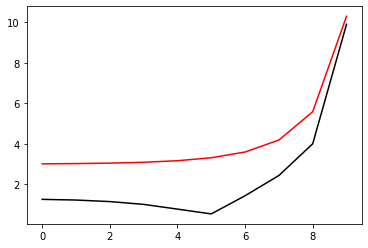

5800 98.03040403812213 -2.1731242908921837 -2.8238048031260616
[1.2611576  1.22723112 1.15104015 1.01329424 0.78059816 0.54553058
 1.43942956 2.43951539 4.00510477 9.90052535]


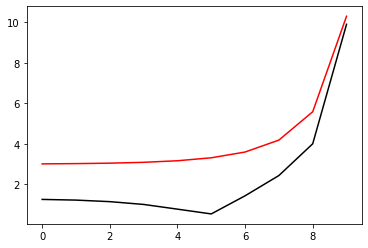

5900 98.03032953909594 -2.1726782721107445 -2.829200775250845
[1.26048384 1.22649461 1.15020217 1.01250497 0.78061695 0.54763712
 1.43846158 2.43941322 4.00548867 9.90024239]


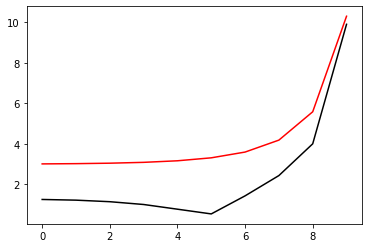

6000 98.03025522433569 -2.1722319675879147 -2.834595428471287
[1.25980876 1.22575763 1.14936582 1.01171975 0.78063712 0.54972949
 1.43750016 2.43931118 4.00587335 9.89995946]


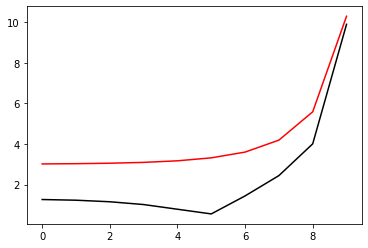

6100 98.03018109069589 -2.1717853714153557 -2.8399888086170395
[1.25913239 1.22502018 1.14853107 1.01093851 0.7806586  0.55180778
 1.43654525 2.43920927 4.00625881 9.89967656]


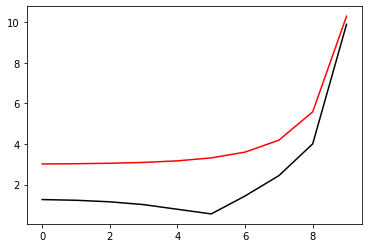

6200 98.03010713505536 -2.171338477592962 -2.8453809618604278
[1.25845476 1.22428227 1.14769792 1.0101612  0.78068134 0.55387207
 1.43559679 2.43910749 4.00664504 9.89939369]


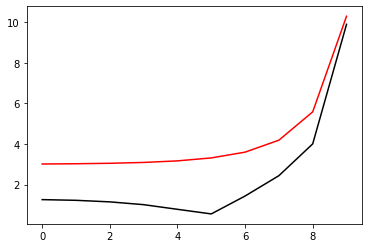

6300 98.03003335431659 -2.1708912800274405 -2.8507719347233005
[1.25777589 1.22354392 1.14686634 1.00938777 0.78070529 0.55592246
 1.43465475 2.43900584 4.00703205 9.89911085]


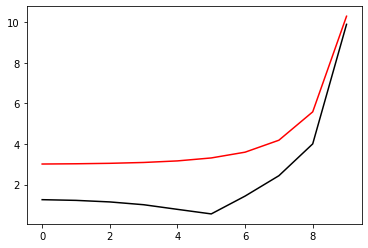

6400 98.02995974540488 -2.170443772530855 -2.856161774084003
[1.2570958  1.22280514 1.1460363  1.00861814 0.78073042 0.55795904
 1.43371908 2.43890433 4.00741984 9.89882805]


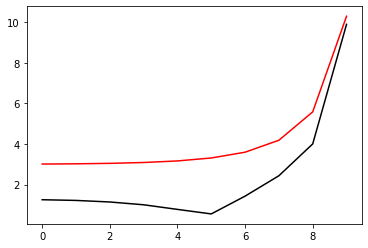

6500 98.0298863052677 -2.1699959488191225 -2.861550527184532
[1.25641452 1.22206594 1.1452078  1.00785227 0.78075665 0.55998188
 1.43278972 2.43880295 4.0078084  9.89854528]


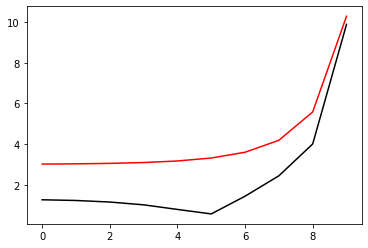

6600 98.02981303087405 -2.1695478025104715 -2.866938241637825
[1.25573207 1.22132632 1.14438081 1.0070901  0.78078396 0.56199108
 1.43186663 2.43870172 4.00819773 9.89826254]


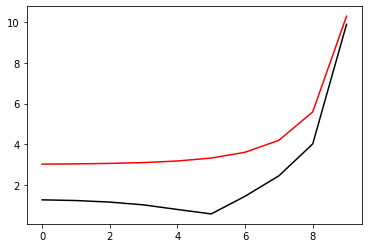

6700 98.02973991921361 -2.169099327123861 -2.872324965435215
[1.25504847 1.2205863  1.14355531 1.00633158 0.78081228 0.56398672
 1.43094976 2.43860063 4.00858784 9.89797983]


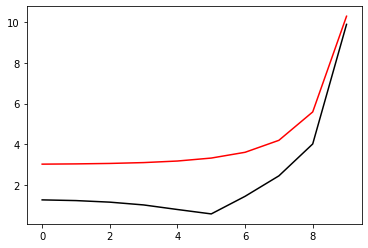

6800 98.0296669672962 -2.1686505160773515 -2.8777107469540657
[1.25436375 1.2198459  1.14273129 1.00557664 0.78084157 0.56596888
 1.43003906 2.43849969 4.00897872 9.89769716]


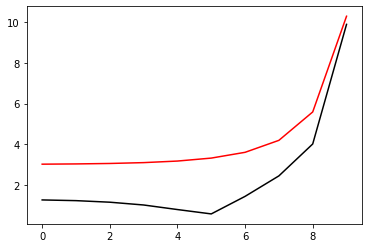

6900 98.02959417215096 -2.1682013626864287 -2.8830956349655446
[1.25367793 1.2191051  1.14190871 1.00482524 0.78087179 0.56793764
 1.42913449 2.43839889 4.00937037 9.89741451]


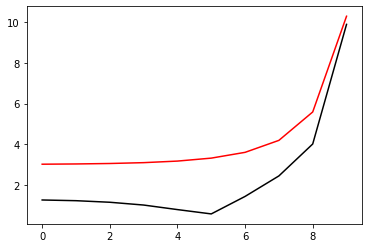

7000 98.02952153082572 -2.1677518601622863 -2.888479678642606
[1.25299103 1.21836394 1.14108758 1.00407731 0.78090288 0.5698931
 1.42823599 2.43829825 4.00976279 9.8971319 ]


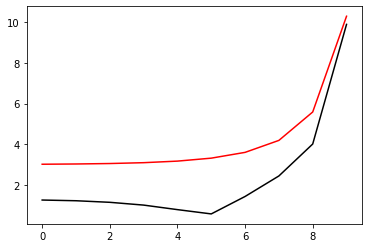

7100 98.02944904038634 -2.1673020016100573 -2.893862927568112
[1.25230308 1.21762242 1.14026785 1.00333281 0.78093479 0.57183532
 1.42734353 2.43819775 4.01015598 9.89684933]


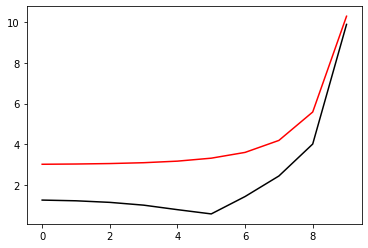

7200 98.02937669791598 -2.166851780026999 -2.8992454317431795
[1.25161409 1.21688054 1.13944953 1.00259168 0.78096749 0.57376439
 1.42645706 2.43809741 4.01054994 9.89656678]


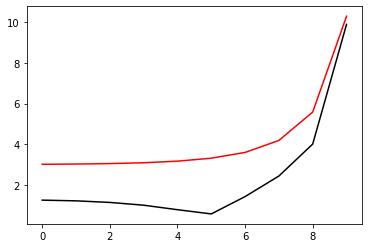

7300 98.02930450051444 -2.166401188300624 -2.9046272415956875
[1.25092408 1.21613831 1.13863257 1.00185387 0.78100092 0.57568038
 1.42557652 2.43799722 4.01094467 9.89628427]


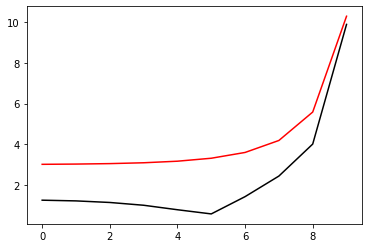

7400 98.02923244529742 -2.165950219206782 -2.9100084079889794
[1.25023309 1.21539575 1.13781698 1.00111932 0.78103503 0.57758338
 1.42470188 2.43789719 4.01134017 9.89600179]


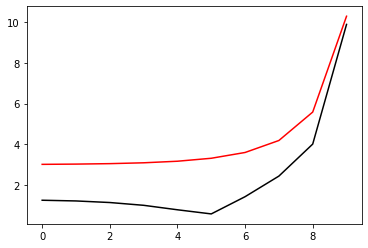

7500 98.02916052939594 -2.1654988654076908 -2.91538898223078
[1.24954112 1.21465286 1.13700272 1.00038798 0.78106979 0.57947347
 1.42383308 2.43779732 4.01173644 9.89571934]


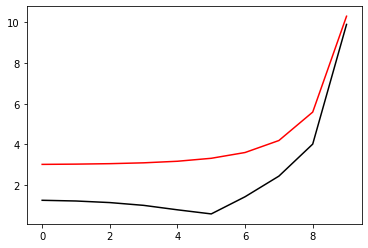

7600 98.02908874995566 -2.1650471194499 -2.9207690160823017
[1.24884819 1.21390965 1.13618978 0.99965979 0.78110513 0.58135071
 1.42297008 2.43769762 4.01213348 9.89543693]


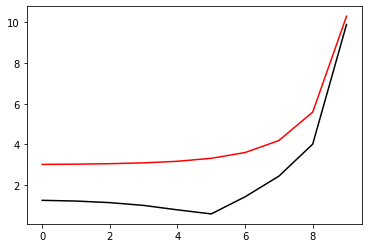

7700 98.02901710413616 -2.164594973762219 -2.926148561767572
[1.24815433 1.21316612 1.13537814 0.9989347  0.78114103 0.58321519
 1.42211285 2.43759807 4.01253129 9.89515454]


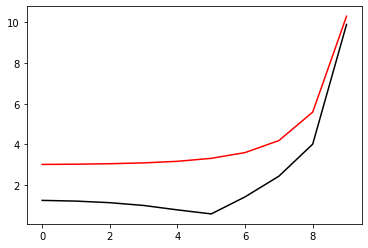

7800 98.02894558911014 -2.1641424206535644 -2.9315276719829724
[1.24745956 1.21242229 1.13456778 0.99821267 0.78117743 0.58506699
 1.42126132 2.43749869 4.01292986 9.89487219]


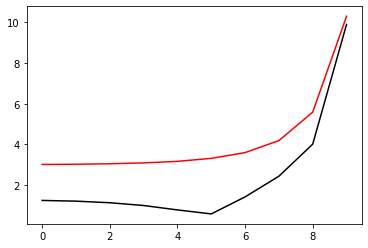

7900 98.02887420206302 -2.1636894523107673 -2.9369063999069978
[1.2467639  1.21167816 1.13375867 0.99749364 0.78121429 0.58690616
 1.42041545 2.43739947 4.0133292  9.89458988]


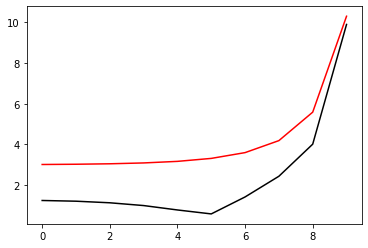

8000 98.02880294019212 -2.1632360607962995 -2.9422847992102557
[1.24606736 1.21093375 1.13295081 0.99677755 0.78125156 0.5887328
 1.41957521 2.43730043 4.01372931 9.89430759]


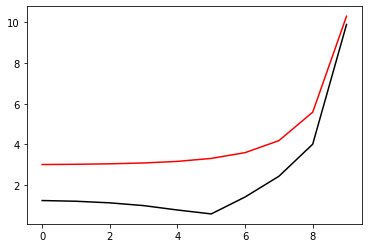

8100 98.0287318007059 -2.162782238045956 -2.947662924065688
[1.24536996 1.21018904 1.13214417 0.99606435 0.78128919 0.59054697
 1.41874054 2.43720155 4.01413018 9.89402534]


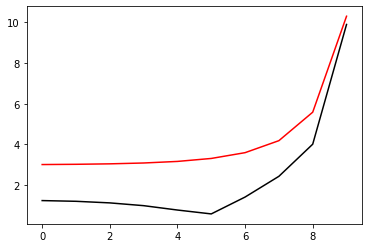

8200 98.02866078082349 -2.162327975866454 -2.9530408291590504
[1.24467172 1.20944406 1.13133873 0.995354   0.78132715 0.59234874
 1.41791141 2.43710284 4.01453182 9.89374312]


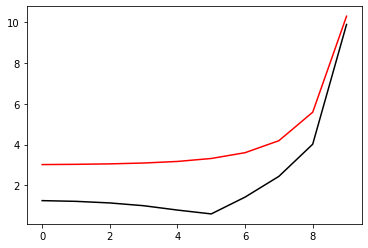

8300 98.02858987777377 -2.1618732659329782 -2.95841856969963
[1.24397266 1.20869881 1.13053447 0.99464644 0.78136539 0.59413818
 1.41708776 2.43700431 4.01493423 9.89346094]


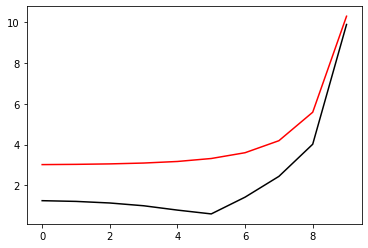

8400 98.02851908879498 -2.1614180997866463 -2.9637962014312165
[1.2432728  1.20795329 1.12973137 0.99394162 0.78140386 0.59591537
 1.41626955 2.43690595 4.0153374  9.89317878]


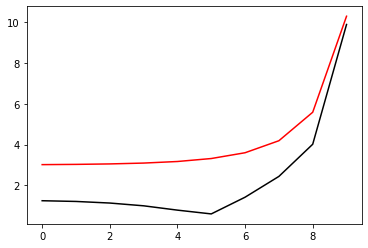

8500 98.02844841113374 -2.1609624688319107 -2.9691737806433656
[1.24257215 1.20720752 1.12892941 0.99323949 0.78144252 0.59768037
 1.41545674 2.43680777 4.01574134 9.89289666]


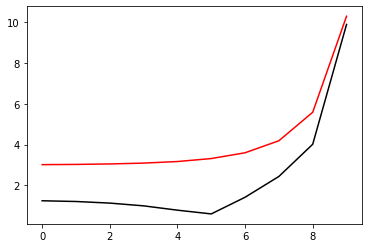

8600 98.02837784204466 -2.1605063643338775 -2.974551364182902
[1.24187073 1.20646149 1.12812858 0.99254001 0.78148132 0.59943325
 1.41464928 2.43670976 4.01614605 9.89261458]


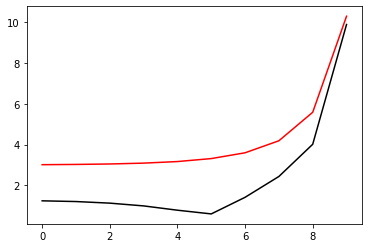

8700 98.02830737878944 -2.160049777415559 -2.9799290094657267
[1.24116856 1.20571521 1.12732884 0.99184311 0.78152023 0.60117408
 1.41384714 2.43661193 4.01655152 9.89233252]


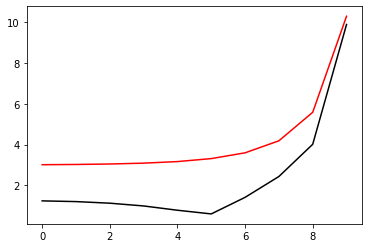

8800 98.02823701863626 -2.1595926990550387 -2.9853067744888997
[1.24046565 1.20496869 1.12653019 0.99114874 0.78155919 0.60290293
 1.41305026 2.43651427 4.01695776 9.8920505 ]


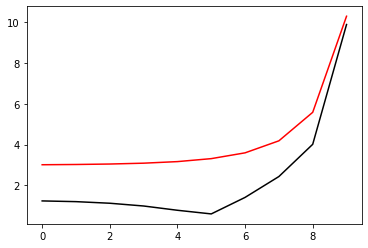

8900 98.02816675885907 -2.159135120082562 -2.9906847178430382
[1.23976201 1.20422192 1.12573261 0.99045687 0.78159817 0.60461986
 1.4122586  2.4364168  4.01736476 9.89176851]


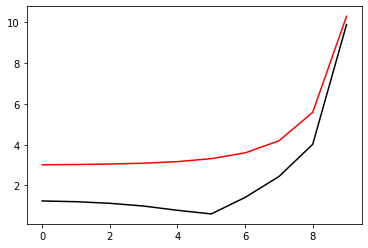

9000 98.02809659673704 -2.158677031177536 -2.996062898725004
[1.23905768 1.20347493 1.12493606 0.98976744 0.78163713 0.60632494
 1.41147212 2.43631951 4.01777253 9.89148656]


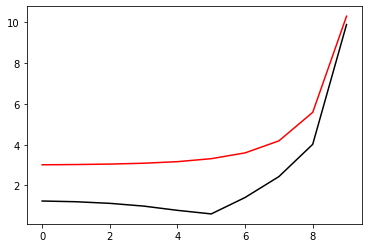

9100 98.02802652955359 -2.158218422865447 -3.0014413769509147
[1.23835265 1.2027277  1.12414054 0.98908039 0.78167601 0.60801823
 1.41069078 2.4362224  4.01818107 9.89120464]


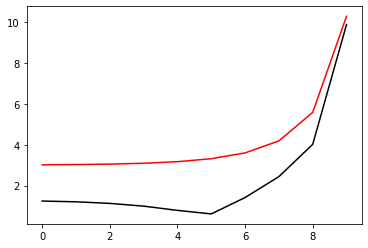

9200 98.02795655459595 -2.1577592855146883 -3.006820212969499
[1.23764695 1.20198025 1.12334602 0.98839569 0.78171477 0.6096998
 1.40991453 2.43612547 4.01859037 9.89092275]


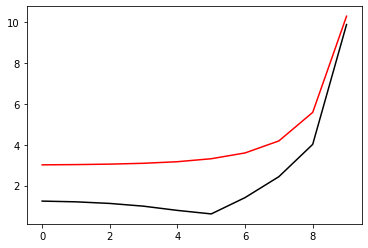

9300 98.0278866691544 -2.1572996093332955 -3.0121994678757598
[1.23694059 1.20123258 1.12255248 0.98771327 0.78175338 0.6113697
 1.40914334 2.43602873 4.01900043 9.89064089]


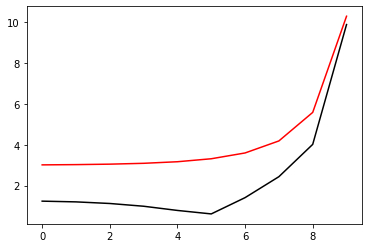

9400 98.02781687052132 -2.156839384365583 -3.0175792034250164
[1.23623359 1.20048468 1.1217599  0.9870331  0.78179179 0.613028
 1.40837714 2.43593217 4.01941126 9.89035907]


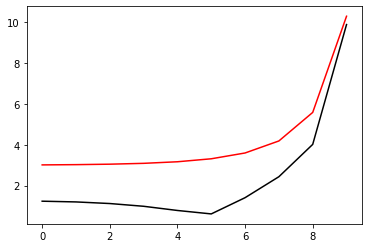

9500 98.02774715599087 -2.156378600488687 -3.0229594820472716
[1.23552595 1.19973657 1.12096826 0.98635511 0.78182995 0.61467477
 1.40761591 2.4358358  4.01982286 9.89007728]


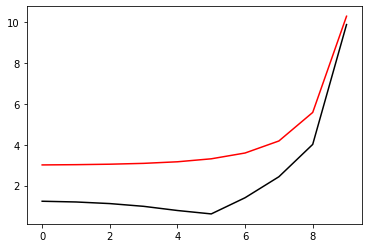

9600 98.02767752285791 -2.155917247409002 -3.028340366861977
[1.2348177  1.19898825 1.12017755 0.98567928 0.78186783 0.61631006
 1.40685961 2.43573961 4.02023522 9.88979552]


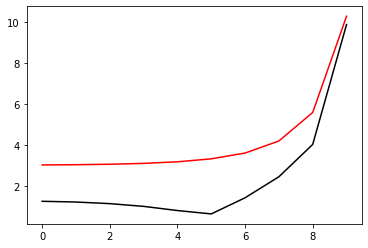

9700 98.0276079684175 -2.155455314658513 -3.033721921693177
[1.23410884 1.19823973 1.11938773 0.98500553 0.78190538 0.61793393
 1.40610818 2.43564361 4.02064835 9.8895138 ]


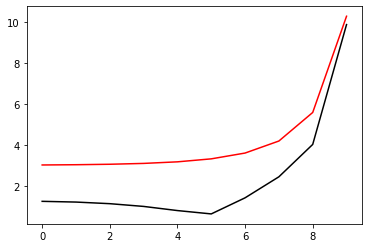

9800 98.02753848996412 -2.1549927915910243 -3.039104211085028
[1.2333994  1.19749099 1.1185988  0.98433383 0.78194256 0.61954644
 1.40536158 2.4355478  4.02106225 9.88923211]


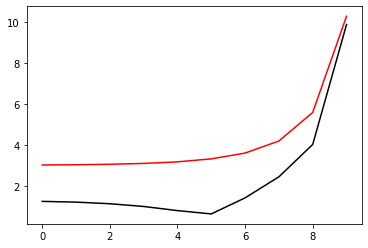

9900 98.02746908479072 -2.154529667378264 -3.044487300317752
[1.23268937 1.19674205 1.11781072 0.98366413 0.78197933 0.62114765
 1.40461978 2.43545217 4.02147691 9.88895046]


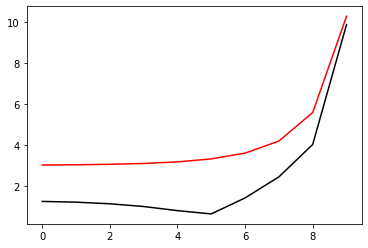

10000 98.0273997501884 -2.154065931005882 -3.0498712554239846
[1.23197878 1.19599291 1.11702347 0.98299637 0.78201564 0.62273762
 1.40388273 2.43535673 4.02189234 9.88866884]


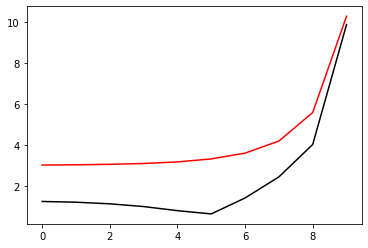

In [91]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 98.02733048344514 -2.153601571269323 -3.0552561432055727
[1.23126764 1.19524356 1.11623705 0.98233052 0.78205145 0.6243164
 1.40315039 2.43526148 4.02230854 9.88838725]


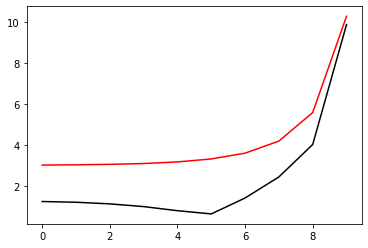

200 98.02726128184541 -2.1531365767695774 -3.060642031250826
[1.23055597 1.19449402 1.11545142 0.98166651 0.78208672 0.62588404
 1.40242272 2.43516642 4.0227255  9.88810569]


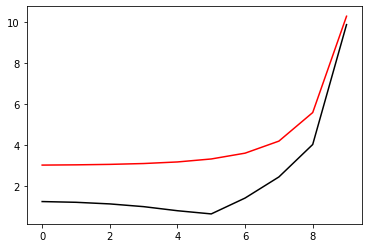

300 98.02719214266918 -2.1526709359087968 -3.0660289879522065
[1.22984376 1.19374428 1.11466656 0.98100431 0.78212141 0.62744061
 1.40169967 2.43507155 4.02314323 9.88782417]


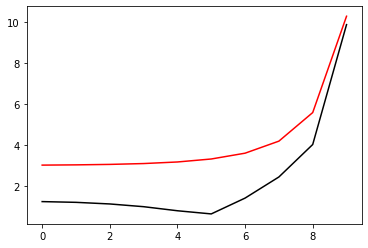

400 98.02712306319131 -2.1522046368857826 -3.0714170825245253
[1.22913104 1.19299434 1.11388245 0.98034386 0.78215547 0.62898616
 1.4009812  2.43497686 4.02356173 9.88754268]


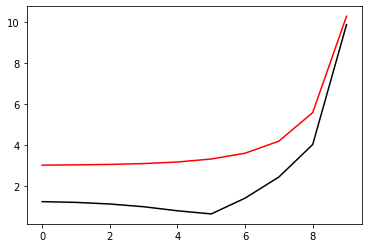

500 98.02705404068045 -2.1517376676913345 -3.076806385023612
[1.22841781 1.19224421 1.11309908 0.97968512 0.78218887 0.63052073
 1.40026728 2.43488236 4.023981   9.88726123]


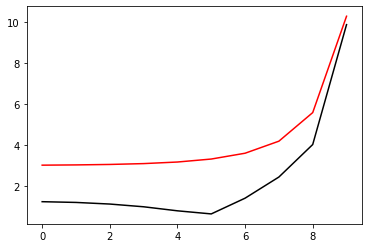

600 98.0269850723985 -2.15127001610345 -3.082196966365511
[1.22770409 1.19149388 1.11231641 0.97902804 0.78222156 0.63204439
 1.39955785 2.43478805 4.02440103 9.88697981]


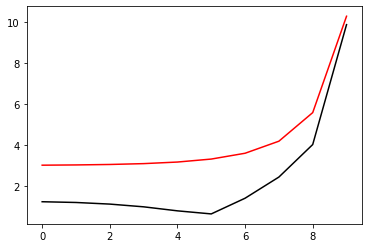

700 98.0269161555998 -2.1508016696823837 -3.087588898346195
[1.22698988 1.19074336 1.11153443 0.97837257 0.78225349 0.63355718
 1.39885287 2.43469393 4.02482184 9.88669842]


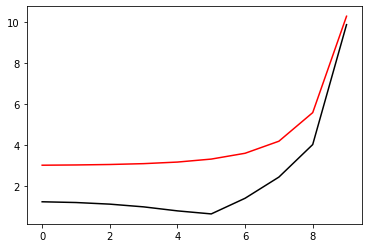

800 98.02684728752996 -2.150332615765545 -3.092982253661831
[1.22627521 1.18999264 1.11075311 0.97771866 0.78228463 0.63505916
 1.39815232 2.4346     4.02524341 9.88641707]


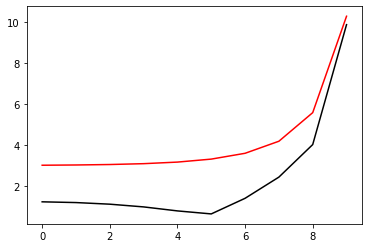

900 98.02677846542538 -2.149862841462241 -3.0983771059296075
[1.22556007 1.18924172 1.10997243 0.97706626 0.78231494 0.63655037
 1.39745613 2.43450625 4.02566575 9.88613575]


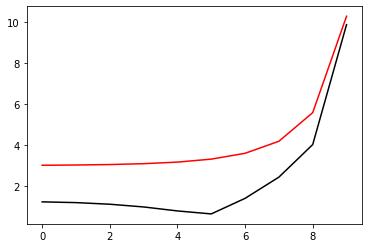

1000 98.02670968651218 -2.149392333648252 -3.1037735297091573
[1.22484448 1.18849061 1.10919237 0.97641533 0.78234436 0.63803086
 1.39676427 2.43441269 4.02608886 9.88585446]


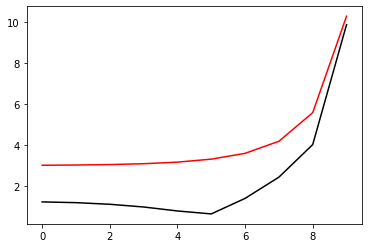

1100 98.02664094800527 -2.148921078960233 -3.109171600524561
[1.22412845 1.1877393  1.10841291 0.97576581 0.78237287 0.63950068
 1.39607671 2.43431932 4.02651274 9.88557321]


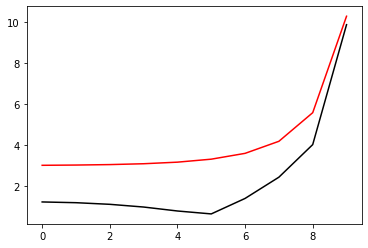

1200 98.02657224710761 -2.1484490637899425 -3.1145713948870046
[1.22341199 1.18698779 1.10763402 0.97511766 0.78240041 0.64095989
 1.39539338 2.43422613 4.02693739 9.88529199]


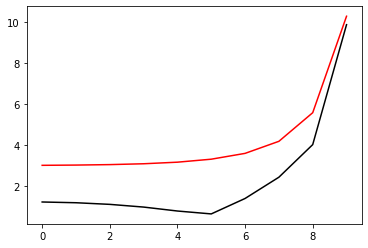

1300 98.02650358100917 -2.1479762742782817 -3.119972990318063
[1.2226951  1.18623608 1.10685568 0.97447084 0.78242694 0.64240852
 1.39471427 2.43413313 4.02736281 9.88501081]


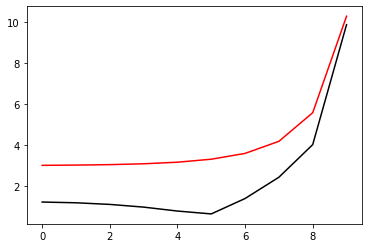

1400 98.026434946886 -2.147502696309143 -3.125376465373668
[1.2219778  1.18548418 1.10607787 0.97382528 0.78245243 0.64384662
 1.39403932 2.43404031 4.02778901 9.88472966]


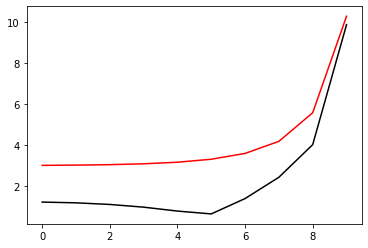

1500 98.02636634189933 -2.1470283155030616 -3.1307818996687655
[1.22126009 1.18473206 1.10530056 0.97318095 0.78247682 0.64527424
 1.39336848 2.43394767 4.02821597 9.88444854]


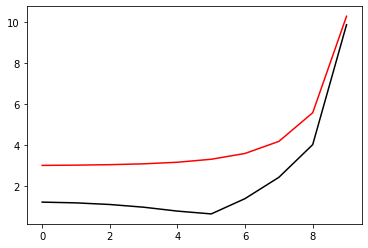

1600 98.02629776319453 -2.1465531172106576 -3.136189373902694
[1.22054198 1.18397975 1.10452374 0.9725378  0.78250008 0.64669141
 1.39270173 2.43385522 4.02864371 9.88416746]


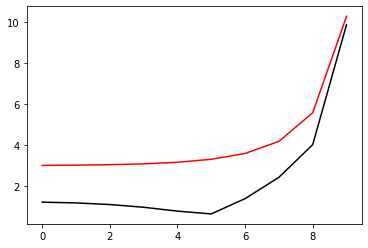

1700 98.02622920790014 -2.1460770865058647 -3.1415989698852997
[1.21982348 1.18322722 1.10374736 0.97189577 0.78252215 0.6480982
 1.39203901 2.43376294 4.02907222 9.88388641]


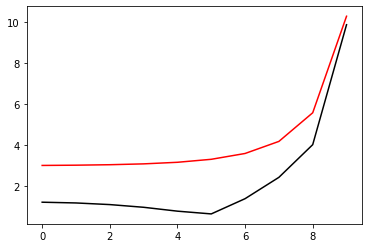

1800 98.02616067312682 -2.1456002081789367 -3.147010770563841
[1.21910461 1.18247448 1.10297142 0.97125481 0.78254301 0.64949462
 1.39138029 2.43367084 4.0295015  9.8836054 ]


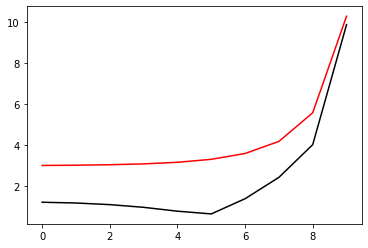

1900 98.02609215596628 -2.1451224667292204 -3.152424860050677
[1.21838535 1.18172153 1.10219588 0.97061489 0.7825626  0.65088074
 1.39072553 2.43357892 4.02993155 9.88332442]


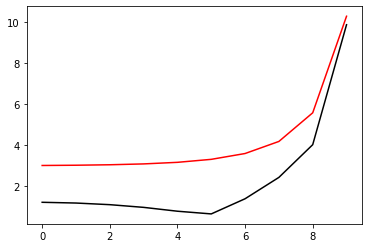

2000 98.0260236534904 -2.1446438463576905 -3.1578413236517933
[1.21766573 1.18096836 1.10142073 0.96997595 0.78258089 0.65225658
 1.39007467 2.43348718 4.03036238 9.88304347]


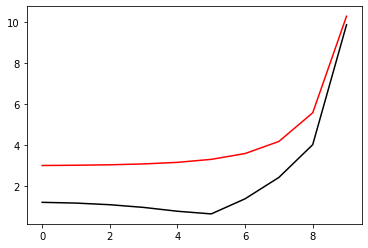

2100 98.0259551627498 -2.1441643309592306 -3.1632602478961944
[1.21694575 1.18021496 1.10064593 0.96933793 0.78259782 0.65362219
 1.38942768 2.43339561 4.03079399 9.88276256]


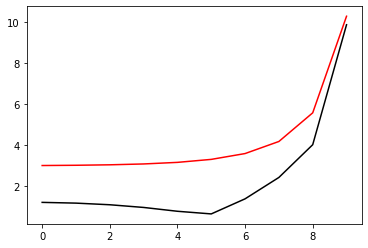

2200 98.02588668077291 -2.143683904114658 -3.1686817205661715
[1.21622541 1.17946135 1.09987146 0.9687008  0.78261335 0.65497761
 1.38878452 2.43330421 4.03122636 9.88248168]


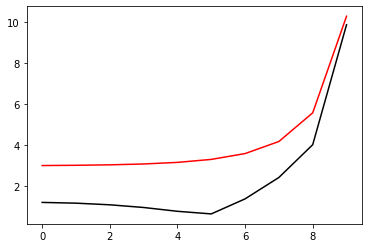

2300 98.02581820456493 -2.1432025490824738 -3.1741058307285175
[1.21550473 1.1787075  1.0990973  0.9680645  0.78262744 0.65632288
 1.38814515 2.43321299 4.03165952 9.88220084]


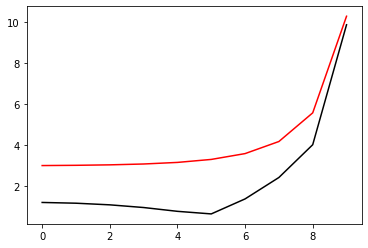

2400 98.0257497311064 -2.1427202487903343 -3.1795326687666763
[1.21478371 1.17795341 1.09832342 0.96742898 0.78264005 0.65765802
 1.38750952 2.43312193 4.03209344 9.88192003]


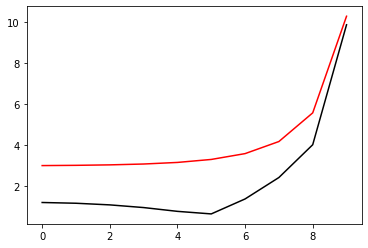

2500 98.02568125735219 -2.1422369858262296 -3.184962326413929
[1.21406235 1.17719909 1.09754979 0.9667942  0.78265113 0.65898308
 1.38687758 2.43303103 4.03252815 9.88163925]


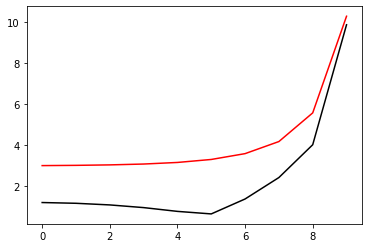

2600 98.02561278023006 -2.1417527424293534 -3.1903948967875695
[1.21334066 1.17644452 1.09677639 0.96616009 0.78266063 0.6602981
 1.38624931 2.4329403  4.03296363 9.88135851]


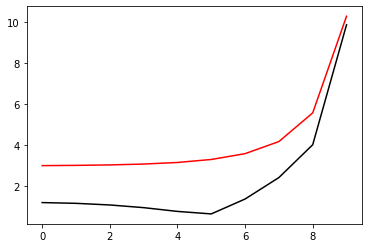

2700 98.02554429663957 -2.1412675004806587 -3.1958304744241928
[1.21261864 1.17568969 1.09600319 0.96552662 0.78266851 0.66160311
 1.38562465 2.43284973 4.03339989 9.88107781]


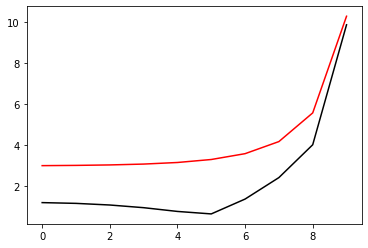

2800 98.02547580345069 -2.1407812414930807 -3.2012691553160733
[1.2118963  1.17493461 1.09523017 0.96489373 0.78267473 0.66289813
 1.38500356 2.43275932 4.03383692 9.88079714]


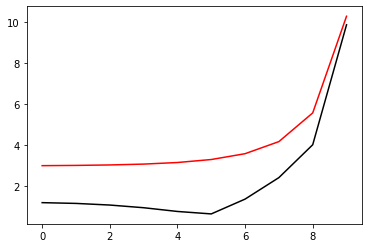

2900 98.02540729750235 -2.140293946601418 -3.2067110369487235
[1.21117365 1.17417927 1.09445728 0.96426137 0.78267923 0.66418321
 1.38438599 2.43266907 4.03427473 9.8805165 ]


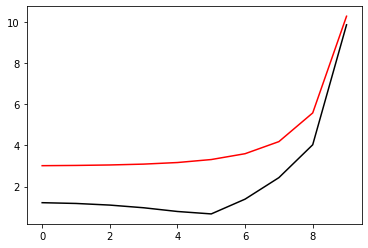

3000 98.02533877560123 -2.139805596551848 -3.212156218339654
[1.21045069 1.17342366 1.09368452 0.96362949 0.78268197 0.66545838
 1.38377192 2.43257896 4.03471332 9.8802359 ]


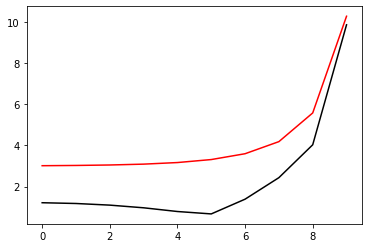

3100 98.02527023452008 -2.1393161716910774 -3.217604800078373
[1.20972742 1.17266776 1.09291184 0.96299803 0.78268291 0.66672366
 1.38316129 2.43248901 4.03515269 9.87995533]


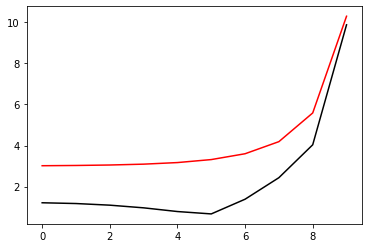

3200 98.02520167099658 -2.138825651955094 -3.223056884367712
[1.20900385 1.17191158 1.09213923 0.96236695 0.782682   0.66797908
 1.38255405 2.43239919 4.03559284 9.87967479]


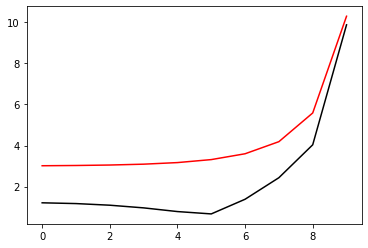

3300 98.02513308173148 -2.138334016857513 -3.2285125750664894
[1.20827997 1.17115511 1.09136664 0.9617362  0.78267919 0.66922468
 1.38195017 2.43230953 4.03603377 9.8793943 ]


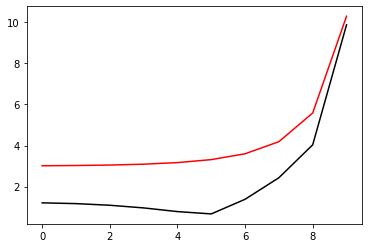

3400 98.02506446338718 -2.1378412454775018 -3.2339719777335922
[1.2075558  1.17039834 1.09059406 0.96110571 0.78267443 0.67046049
 1.38134961 2.43221999 4.03647547 9.87911383]


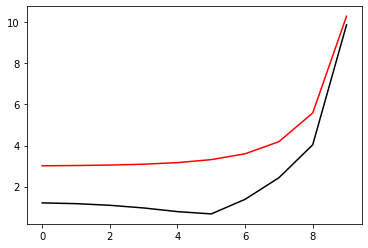

3500 98.02499581258614 -2.1373473164472583 -3.2394351996735335
[1.20683134 1.16964125 1.08982144 0.96047544 0.78266767 0.67168652
 1.38075231 2.4321306  4.03691796 9.8788334 ]


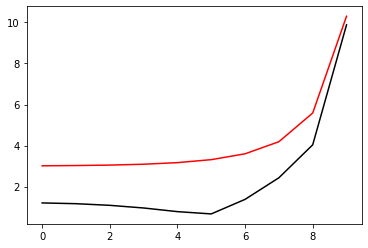

3600 98.02492712590923 -2.136852207939027 -3.2449023499835183
[1.20610658 1.16888385 1.08904877 0.95984534 0.78265887 0.6729028
 1.38015823 2.43204133 4.03736123 9.87855301]


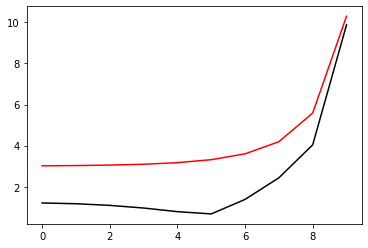

3700 98.02485839989379 -2.1363558976516286 -3.2503735396021343
[1.20538153 1.16812611 1.08827601 0.95921535 0.78264797 0.67410937
 1.37956733 2.43195219 4.03780528 9.87827265]


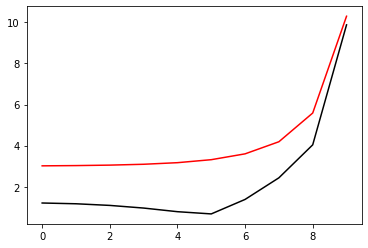

3800 98.02478963103206 -2.135858362796491 -3.2558488813596504
[1.2046562  1.16736804 1.08750313 0.95858541 0.78263494 0.67530624
 1.37897957 2.43186316 4.0382501  9.87799232]


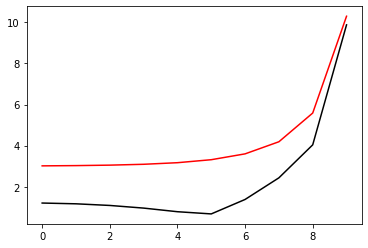

3900 98.02472081576933 -2.1353595800831475 -3.261328490030097
[1.20393058 1.16660962 1.0867301  0.95795548 0.7826197  0.67649343
 1.37839489 2.43177426 4.03869571 9.87771203]


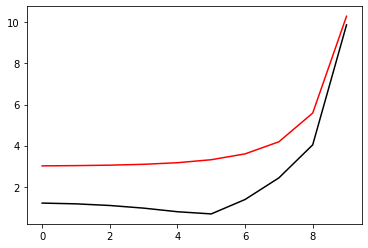

4000 98.02465195050183 -2.1348595257041825 -3.2668124823851072
[1.20320468 1.16585083 1.08595687 0.95732549 0.78260222 0.67767096
 1.37781326 2.43168546 4.0391421  9.87743178]


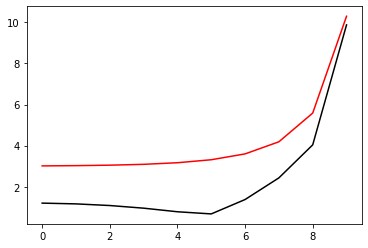

4100 98.024583031575 -2.1343581753196044 -3.2723009772496554
[1.20247849 1.16509168 1.08518344 0.9566954  0.78258245 0.67883887
 1.37723463 2.43159677 4.03958928 9.87715156]


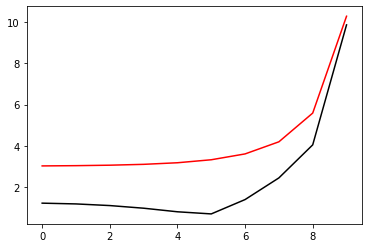

4200 98.02451405528133 -2.133855504040609 -3.2777940955597504
[1.20175202 1.16433214 1.08440974 0.95606514 0.78256033 0.67999716
 1.37665894 2.43150818 4.04003723 9.87687137]


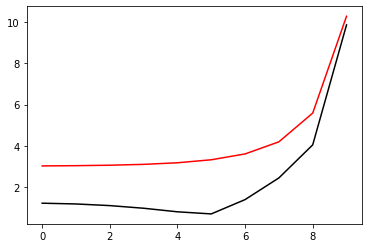

4300 98.02444501785814 -2.1333514864127188 -3.2832919604221558
[1.20102526 1.16357221 1.08363577 0.95543465 0.7825358  0.68114585
 1.37608617 2.43141968 4.04048596 9.87659122]


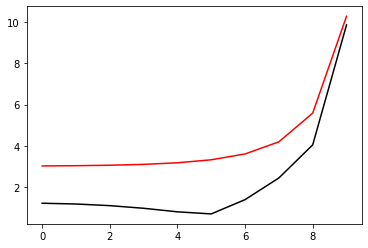

4400 98.02437591548558 -2.132846096398254 -3.288794697176259
[1.20029823 1.16281187 1.08286147 0.95480389 0.78250882 0.68228497
 1.37551625 2.43133127 4.04093548 9.8763111 ]


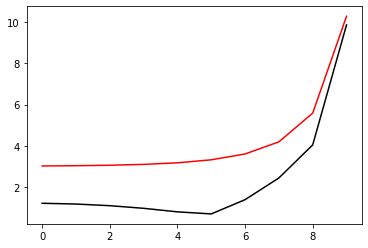

4500 98.02430674428426 -2.1323393073581136 -3.2943024334581623
[1.19957091 1.16205111 1.08208682 0.95417279 0.78247933 0.68341452
 1.37494915 2.43124295 4.04138578 9.87603102]


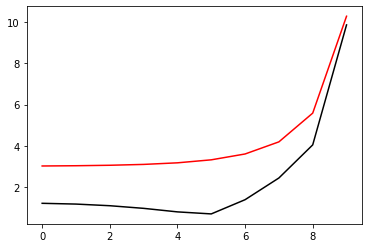

4600 98.02423750031286 -2.131831092032837 -3.2998152992670806
[1.1988433  1.16128991 1.08131177 0.95354129 0.78244728 0.68453452
 1.37438481 2.43115469 4.04183686 9.87575098]


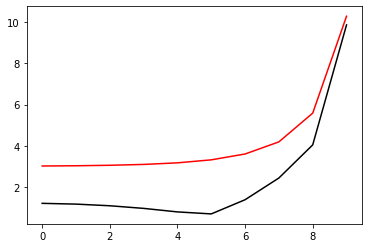

4700 98.02416817956569 -2.1313214225228942 -3.305333427034186
[1.19811541 1.16052826 1.0805363  0.95290934 0.78241261 0.68564498
 1.37382318 2.43106651 4.04228872 9.87547097]


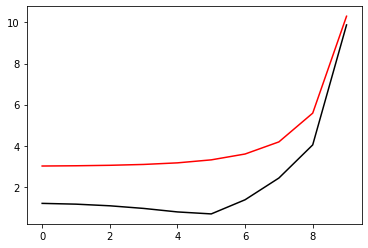

4800 98.02409877797025 -2.1308102702681913 -3.310856951693973
[1.19738723 1.15976616 1.07976036 0.95227687 0.78237526 0.68674592
 1.37326423 2.43097838 4.04274136 9.87519099]


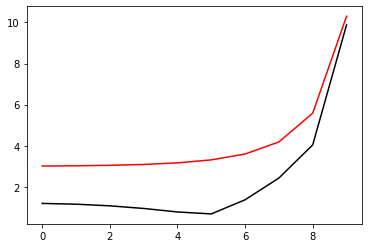

4900 98.0240292913844 -2.13029760602673 -3.3163860107582788
[1.19665877 1.15900357 1.07898391 0.95164382 0.78233518 0.68783735
 1.37270789 2.43089031 4.04319478 9.87491105]


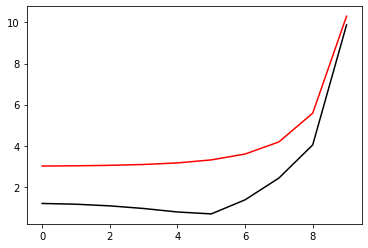

5000 98.02395971559373 -2.129783399852404 -3.3219207443930743
[1.19593001 1.15824049 1.07820693 0.95101014 0.7822923  0.68891927
 1.37215413 2.43080229 4.04364899 9.87463115]


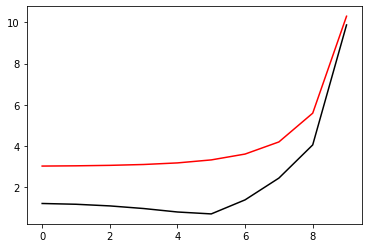

5100 98.02389004630876 -2.12926762107186 -3.3274612954981513
[1.19520097 1.1574769  1.07742936 0.95037575 0.78224658 0.6899917
 1.37160288 2.4307143  4.04410397 9.87435128]


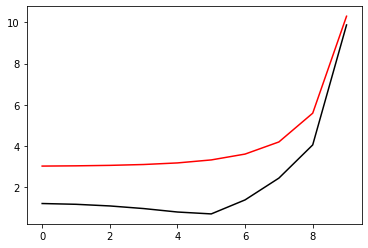

5200 98.02382027916185 -2.128750238260409 -3.3330078097898457
[1.19447162 1.15671278 1.07665118 0.9497406  0.78219794 0.69105464
 1.37105411 2.43062634 4.04455973 9.87407144]


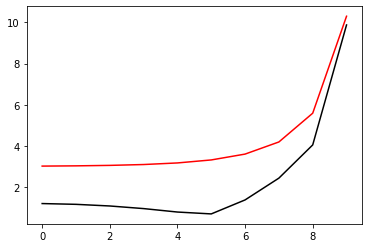

5300 98.02375040970416 -2.1282312192169117 -3.338560435886935
[1.19374198 1.15594811 1.07587233 0.94910462 0.78214634 0.69210809
 1.37050776 2.4305384  4.04501627 9.87379164]


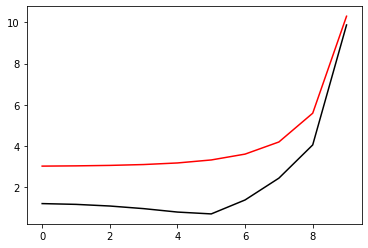

5400 98.02368043340242 -2.1277105309376037 -3.344119325399851
[1.19301203 1.15518289 1.07509277 0.94846775 0.7820917  0.69315206
 1.36996377 2.43045046 4.04547359 9.87351188]


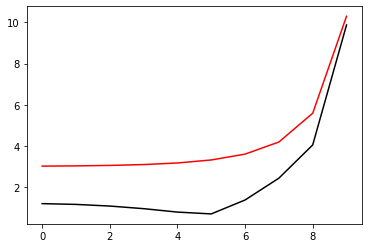

5500 98.02361034563556 -2.127188139588804 -3.3496846330233847
[1.19228178 1.15441708 1.07431247 0.94782992 0.78203396 0.69418656
 1.3694221  2.43036253 4.04593168 9.87323215]


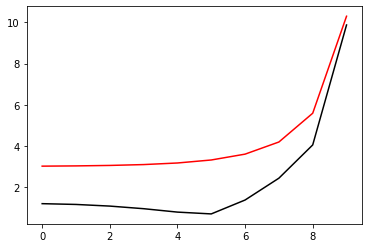

5600 98.0235401416913 -2.126664010478442 -3.355256516633043
[1.19155121 1.15365067 1.07353138 0.94719105 0.78197307 0.69521158
 1.3688827  2.43027459 4.04639056 9.87295246]


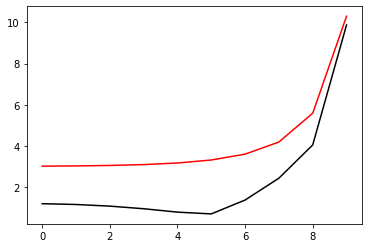

5700 98.02346981676234 -2.126138108026344 -3.360835137385215
[1.19082033 1.15288364 1.07274945 0.9465511  0.78190895 0.69622712
 1.36834551 2.43018663 4.0468502  9.8726728 ]


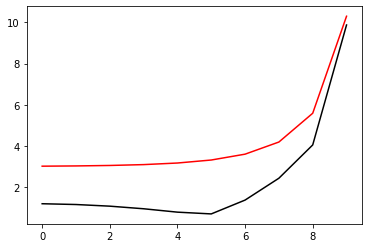

5800 98.02339936594278 -2.125610395733226 -3.366420659821371
[1.19008912 1.15211597 1.07196665 0.94590998 0.78184153 0.69723318
 1.36781047 2.43009864 4.04731062 9.87239318]


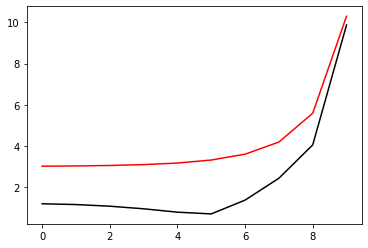

5900 98.0233287842239 -2.125080836148302 -3.3720132519764534
[1.18935759 1.15134764 1.07118291 0.94526762 0.78177076 0.69822977
 1.36727754 2.4300106  4.04777182 9.87211359]


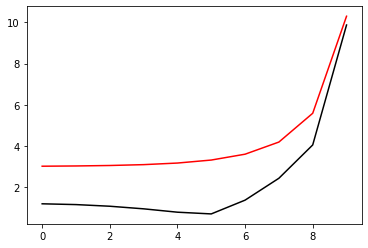

6000 98.0232580664903 -2.1245493908354574 -3.3776130854917006
[1.18862572 1.15057862 1.0703982  0.94462395 0.78169655 0.69921686
 1.36674666 2.42992251 4.04823378 9.87183404]


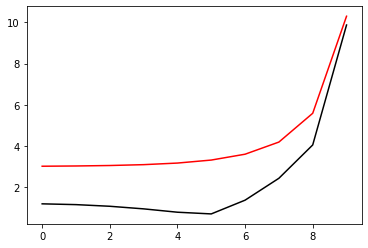

6100 98.02318720751526 -2.1240160203378933 -3.3832203357321013
[1.18789351 1.14980889 1.06961247 0.94397891 0.78161885 0.70019445
 1.36621776 2.42983436 4.04869652 9.87155453]


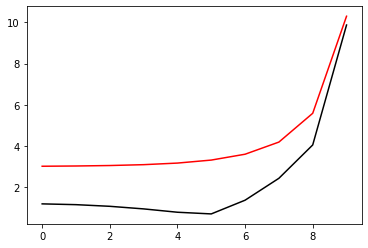

6200 98.02311620195641 -2.123480684141167 -3.3888351819087292
[1.18716095 1.14903843 1.06882567 0.94333241 0.78153757 0.70116255
 1.3656908  2.42974612 4.04916002 9.87127505]


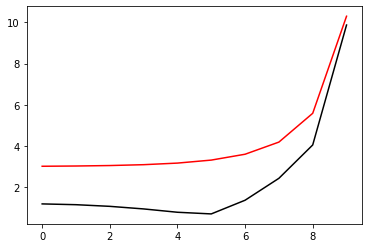

6300 98.023045044351 -2.122943340634538 -3.3944578072061944
[1.18642804 1.14826722 1.06803774 0.94268438 0.78145265 0.70212112
 1.36516572 2.42965779 4.04962429 9.8709956 ]


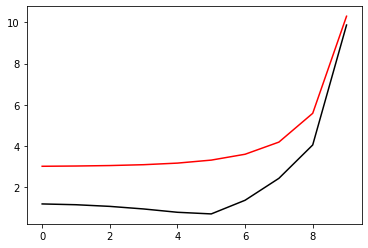

6400 98.02297372911083 -2.12240394707053 -3.40008839891549
[1.18569476 1.14749522 1.06724864 0.94203474 0.78136401 0.70307017
 1.36464245 2.42956935 4.05008932 9.87071619]


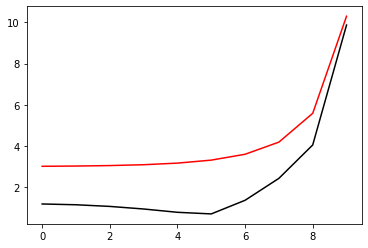

6500 98.02290225051718 -2.1218624595226 -3.4057271485724914
[1.18496111 1.14672241 1.0664583  0.94138341 0.78127157 0.70400968
 1.36412094 2.42948079 4.05055511 9.87043682]


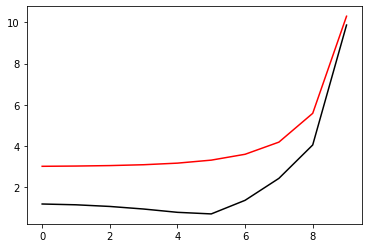

6600 98.0228306027153 -2.1213188328408252 -3.4113742521024397
[1.18422708 1.14594877 1.06566669 0.94073032 0.78117525 0.70493963
 1.36360112 2.42939209 4.05102166 9.87015749]


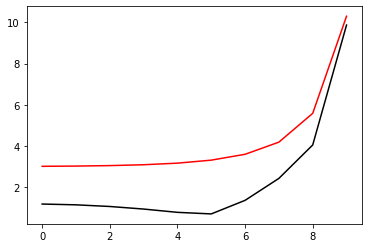

6700 98.02275877970872 -2.1207730206054682 -3.4170299099706747
[1.18349266 1.14517427 1.06487373 0.94007538 0.78107499 0.70586
 1.36308295 2.42930323 4.05148897 9.86987819]


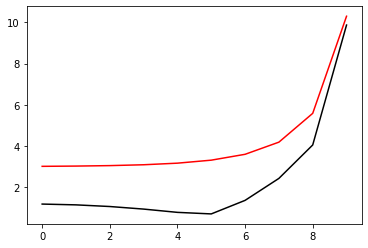

6800 98.0226867753534 -2.1202249750783326 -3.4226943273400154
[1.18275783 1.14439888 1.06407938 0.93941851 0.78097068 0.70677078
 1.36256634 2.42921421 4.05195703 9.86959892]


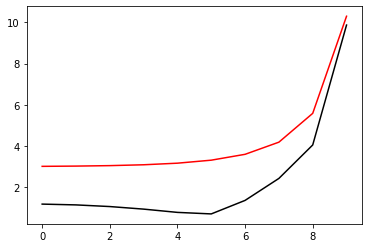

6900 98.02261458335123 -2.119674647151748 -3.4283677142350744
[1.18202259 1.14362256 1.06328357 0.93875962 0.78086225 0.70767193
 1.36205124 2.429125   4.05242584 9.86931969]


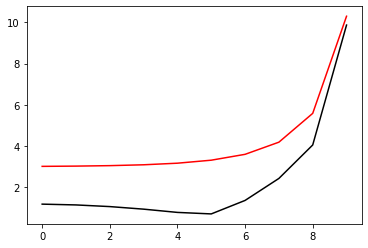

7000 98.02254219724365 -2.1191219862950765 -3.4340502857139534
[1.18128693 1.14284529 1.06248624 0.93809863 0.78074962 0.70856344
 1.36153758 2.42903558 4.0528954  9.8690405 ]


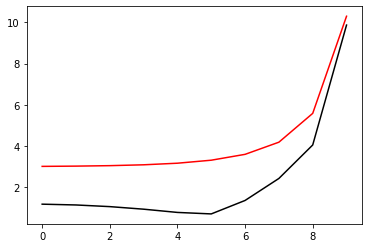

7100 98.02246961040478 -2.118566940498567 -3.4397422620476683
[1.18055083 1.14206703 1.06168734 0.93743545 0.7806327  0.70944528
 1.3610253  2.42894594 4.0533657  9.86876134]


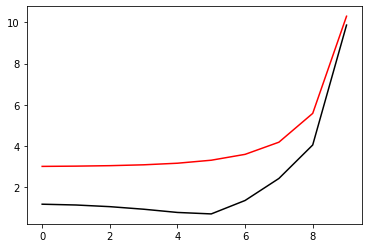

7200 98.02239681603389 -2.118009456214417 -3.445443868907763
[1.17981428 1.14128776 1.06088679 0.93676998 0.78051139 0.71031742
 1.36051433 2.42885605 4.05383673 9.86848222]


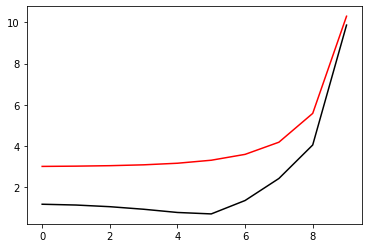

7300 98.0223238071481 -2.117449478294874 -3.4511553375625756
[1.17907727 1.14050744 1.06008454 0.93610214 0.7803856  0.71117983
 1.36000459 2.4287659  4.0543085  9.86820313]


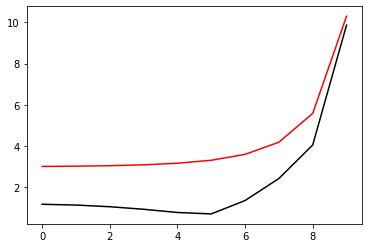

7400 98.02225057657412 -2.1168869499271836 -3.456876905082614
[1.17833978 1.13972602 1.05928051 0.93543182 0.78025524 0.71203246
 1.35949603 2.42867546 4.054781   9.86792409]


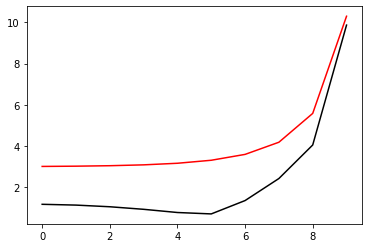

7500 98.02217711693991 -2.1163218125652072 -3.46260881455559
[1.1776018  1.13894348 1.05847464 0.93475893 0.78012022 0.7128753
 1.35898856 2.42858471 4.05525423 9.86764507]


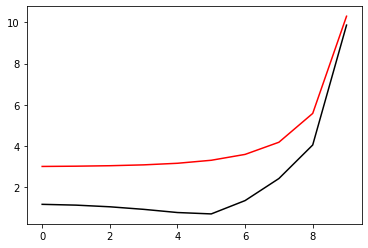

7600 98.02210342066579 -2.1157540058574895 -3.4683513153116743
[1.17686332 1.13815978 1.05766685 0.93408338 0.77998042 0.71370829
 1.35848211 2.42849363 4.05572817 9.8673661 ]


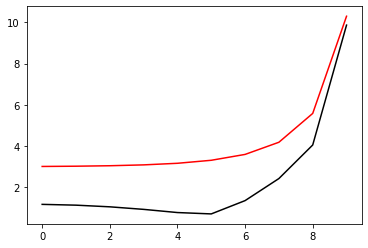

7700 98.02202947995491 -2.1151834675715655 -3.474104663159537
[1.17612431 1.13737488 1.05685707 0.93340505 0.77983576 0.71453139
 1.35797661 2.42840219 4.05620283 9.86708716]


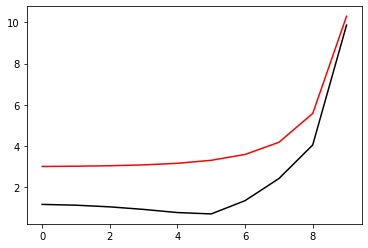

7800 98.02195528678355 -2.1146101335142578 -3.4798691206338273
[1.17538476 1.13658873 1.05604524 0.93272384 0.77968613 0.71534456
 1.35747197 2.42831038 4.05667819 9.86680825]


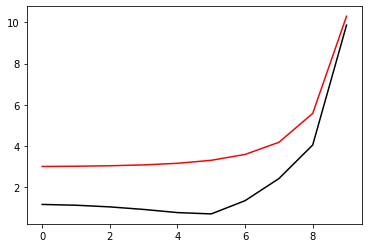

7900 98.0218808328906 -2.1140339374477204 -3.485644957254786
[1.17464466 1.1358013  1.05523126 0.93203965 0.7795314  0.71614775
 1.35696813 2.42821815 4.05715425 9.86652938]


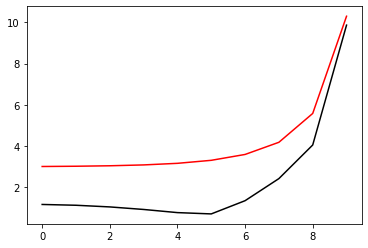

8000 98.02180610976656 -2.1134548110009455 -3.491432449800694
[1.17390398 1.13501254 1.05441506 0.93135236 0.77937149 0.71694091
 1.356465   2.42812549 4.057631   9.86625055]


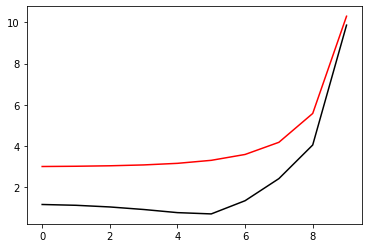

8100 98.02173110864176 -2.1128726835764393 -3.4972318825939586
[1.1731627  1.13422241 1.05359656 0.93066186 0.77920627 0.71772397
 1.35596249 2.42803237 4.05810844 9.86597175]


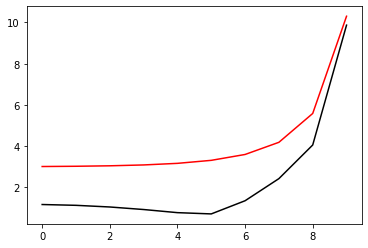

8200 98.02165582047428 -2.112287482251754 -3.503043547801661
[1.17242081 1.13343085 1.05277567 0.92996803 0.77903562 0.7184969
 1.35546053 2.42793875 4.05858655 9.86569299]


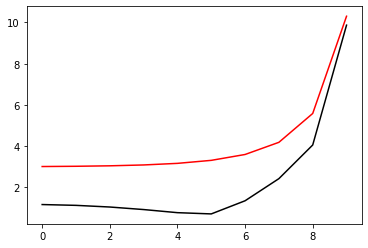

8300 98.02158023593675 -2.111699131675528 -3.508867745751471
[1.17167828 1.13263782 1.05195231 0.92927076 0.77885942 0.71925961
 1.35495902 2.4278446  4.05906533 9.86541427]


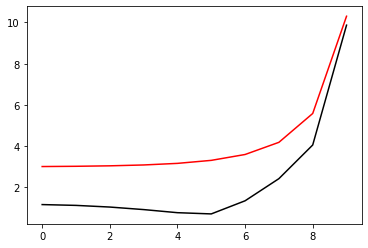

8400 98.02150434540259 -2.111107553957668 -3.5147047852638846
[1.1709351  1.13184328 1.05112638 0.92856992 0.77867755 0.72001205
 1.35445787 2.4277499  4.05954477 9.86513559]


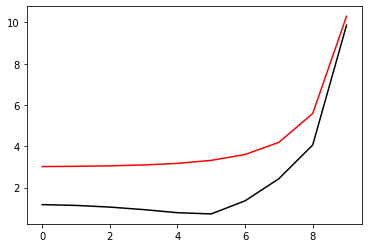

8500 98.0214281389315 -2.11051266855327 -3.5205549840018415
[1.17019123 1.13104716 1.05029779 0.92786538 0.77848989 0.72075415
 1.353957   2.4276546  4.06002486 9.86485693]


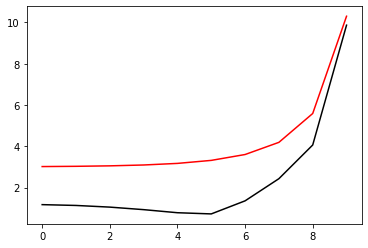

8600 98.02135160625384 -2.1099143921398547 -3.526418668838812
[1.16944665 1.13024941 1.04946646 0.92715701 0.77829628 0.72148583
 1.3534563  2.42755868 4.06050558 9.86457832]


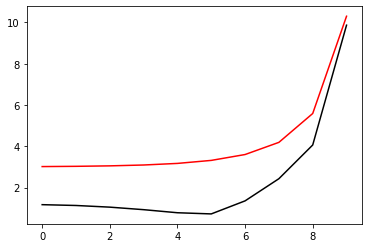

8700 98.02127473675425 -2.1093126384874505 -3.532296176246577
[1.16870135 1.12944998 1.04863226 0.92644468 0.77809661 0.72220702
 1.35295568 2.42746208 4.06098693 9.86429974]


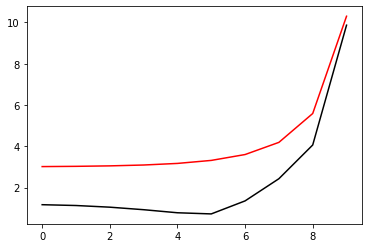

8800 98.02119751945429 -2.1087073183210197 -3.538187852703953
[1.16795529 1.12864881 1.04779512 0.92572824 0.77789072 0.72291763
 1.35245504 2.42736478 4.06146889 9.8640212 ]


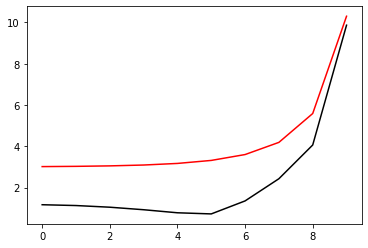

8900 98.02111994299369 -2.108098339174679 -3.5440940551279194
[1.16720844 1.12784583 1.04695491 0.92500756 0.77767848 0.72361757
 1.35195428 2.42726674 4.06195145 9.8637427 ]


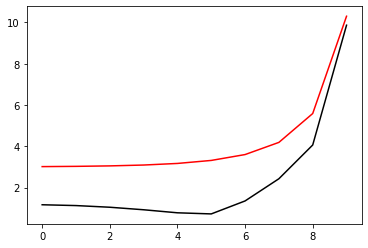

9000 98.02104199561097 -2.107485605237137 -3.5500151513285894
[1.16646078 1.12704099 1.04611153 0.92428249 0.77745972 0.72430676
 1.35145329 2.4271679  4.0624346  9.86346423]


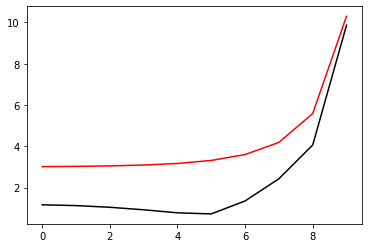

9100 98.02096366512208 -2.1068690171876967 -3.5559515204896837
[1.16571228 1.12623422 1.04526486 0.92355287 0.7772343  0.7249851
 1.35095196 2.42706822 4.06291831 9.8631858 ]


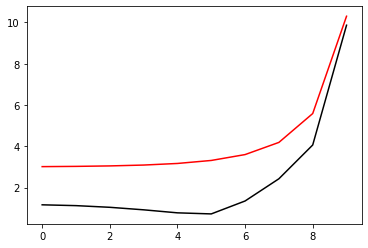

9200 98.02088493889845 -2.1062484720221315 -3.561903553676251
[1.1649629  1.12542545 1.0444148  0.92281854 0.77700205 0.72565249
 1.35045017 2.42696767 4.06340258 9.8629074 ]


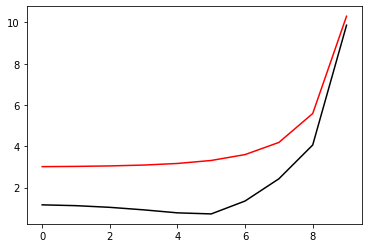

9300 98.02080580384295 -2.105623862867684 -3.5678716543715194
[1.16421262 1.1246146  1.0435612  0.92207934 0.77676281 0.72630882
 1.34994782 2.42686618 4.06388738 9.86262905]


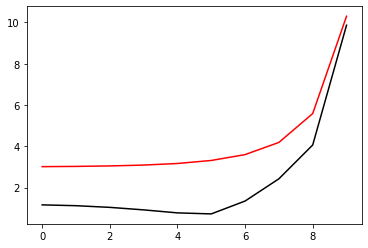

9400 98.02072624636445 -2.104995078786366 -3.573856239044968
[1.1634614  1.12380162 1.04270396 0.92133511 0.77651639 0.72695397
 1.34944477 2.4267637  4.06437271 9.86235072]


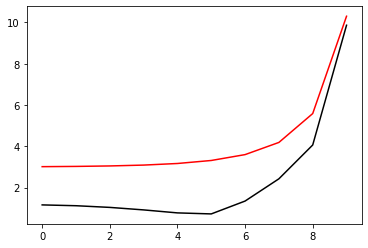

9500 98.020646252351 -2.104362004565657 -3.5798577377538106
[1.16270919 1.12298641 1.04184294 0.92058567 0.77626263 0.72758783
 1.3489409  2.42666019 4.06485853 9.86207244]


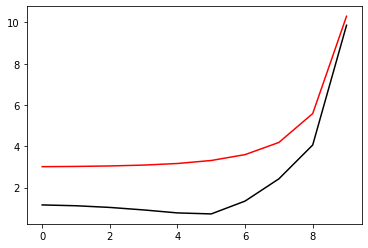

9600 98.0205658071405 -2.103724520495645 -3.5858765947803124
[1.16195598 1.1221689  1.04097799 0.91983083 0.77600134 0.72821027
 1.34843609 2.42655558 4.06534483 9.86179419]


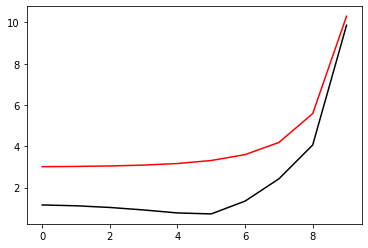

9700 98.02048489549003 -2.1030825021315365 -3.591913269307596
[1.16120171 1.12134901 1.04010899 0.91907041 0.77573232 0.72882117
 1.3479302  2.42644981 4.06583158 9.86151598]


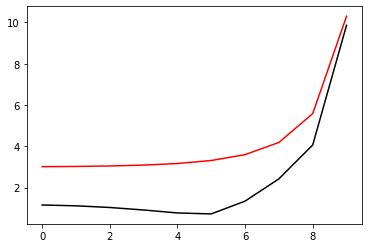

9800 98.02040350154252 -2.1024358200403714 -3.597968236136745
[1.16044635 1.12052665 1.03923578 0.91830422 0.77545537 0.72942037
 1.34742309 2.42634282 4.06631877 9.86123781]


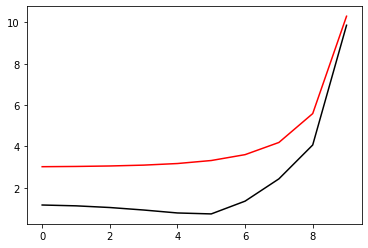

9900 98.02032160879122 -2.1017843395306928 -3.6040419864483466
[1.15968985 1.11970173 1.03835821 0.91753205 0.77517028 0.73000775
 1.34691462 2.42623455 4.06680636 9.86095967]


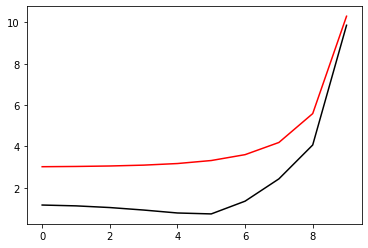

10000 98.02023920004159 -2.1011279203637665 -3.610135028611802
[1.15893217 1.11887415 1.03747613 0.91675369 0.77487684 0.73058313
 1.34640463 2.42612492 4.06729433 9.86068157]


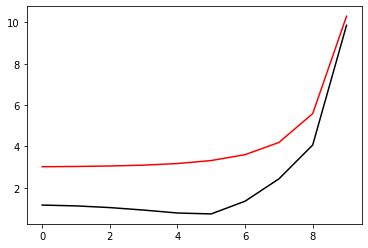

In [92]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 98.0201562573705 -2.1004664164448488 -3.616247889046163
[1.15817326 1.11804382 1.03658936 0.91596893 0.77457482 0.73114636
 1.34589297 2.42601386 4.06778265 9.8604035 ]


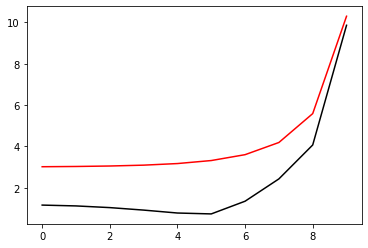

200 98.020072762082 -2.0997996754928185 -3.622381113136454
[1.15741307 1.11721063 1.03569774 0.91517754 0.77426398 0.73169727
 1.34537948 2.42590129 4.06827129 9.86012547]


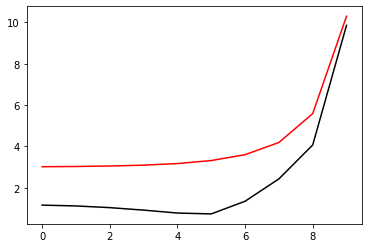

300 98.01998869466021 -2.09912753868636 -3.628535266209911
[1.15665156 1.11637448 1.03480108 0.91437929 0.77394409 0.73223567
 1.34486399 2.42578714 4.06876021 9.85984748]


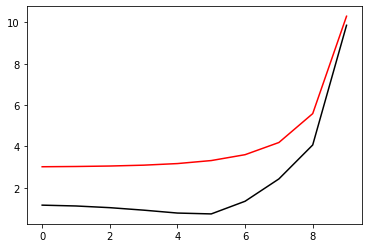

400 98.01990403471837 -2.0984498402846765 -3.6347109345769577
[1.15588867 1.11553525 1.0338992  0.91357392 0.77361489 0.73276138
 1.34434633 2.4256713  4.06924938 9.85956953]


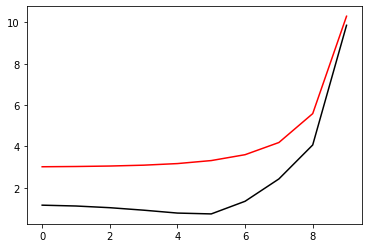

500 98.01981876094372 -2.097766407220523 -3.6409087266421487
[1.15512434 1.11469283 1.03299191 0.91276119 0.77327611 0.7332742
 1.34382632 2.42555371 4.06973876 9.85929161]


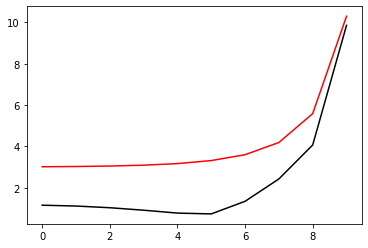

600 98.01973285103846 -2.0970770586631193 -3.6471292740909176
[1.15435851 1.11384709 1.032079   0.91194083 0.77292747 0.73377392
 1.34330375 2.42543425 4.07022832 9.85901373]


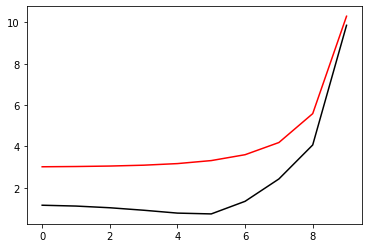

700 98.01964628165535 -2.096381605548251 -3.653373233158456
[1.15359113 1.11299791 1.03116025 0.91111256 0.77256869 0.73426031
 1.34277844 2.42531284 4.070718   9.85873589]


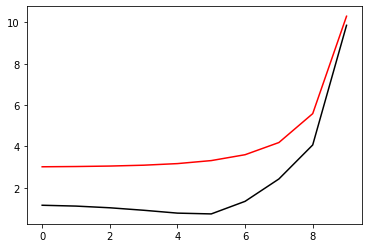

800 98.01955902832871 -2.095679850072582 -3.6596412859876994
[1.15282212 1.11214515 1.03023545 0.9102761  0.77219947 0.73473314
 1.34225018 2.42518935 4.07120776 9.85845808]


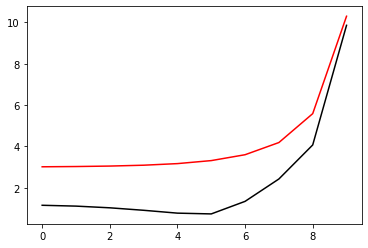

900 98.01947106539907 -2.094971585148884 -3.6659341420841436
[1.15205143 1.11128867 1.02930436 0.90943113 0.77181948 0.73519217
 1.34171875 2.42506369 4.07169755 9.85818031]


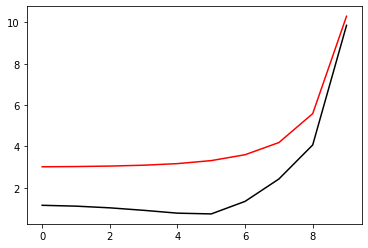

1000 98.01938236593182 -2.0942565938185456 -3.672252539875935
[1.15127897 1.11042832 1.02836674 0.90857734 0.7714284  0.73563713
 1.34118392 2.42493573 4.07218732 9.85790258]


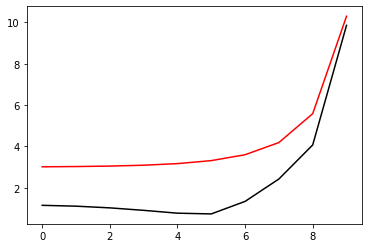

1100 98.01929290162873 -2.093534648617294 -3.6785972483886686
[1.15050467 1.10956395 1.02742233 0.90771441 0.77102589 0.73606774
 1.34064546 2.42480535 4.07267701 9.85762488]


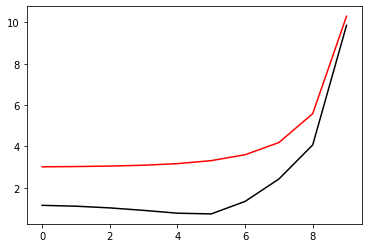

1200 98.01920264273176 -2.0928055108896473 -3.6849690690451715
[1.14972846 1.10869538 1.02647087 0.90684198 0.77061157 0.73648372
 1.34010311 2.4246724  4.07316656 9.85734722]


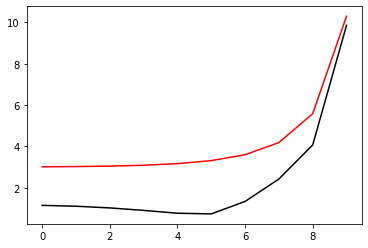

1300 98.01911155791815 -2.0920689300470734 -3.6913688376018396
[1.14895024 1.10782246 1.02551207 0.9059597  0.77018507 0.73688476
 1.33955662 2.42453676 4.0736559  9.8570696 ]


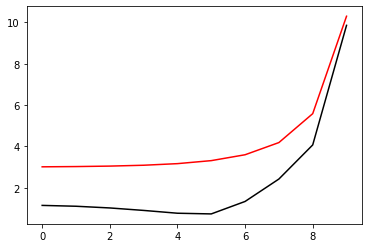

1400 98.01901961418648 -2.0913246427642913 -3.697797426234167
[1.14816995 1.106945   1.02454564 0.90506717 0.76974598 0.73727052
 1.33900571 2.42439828 4.07414496 9.85679202]


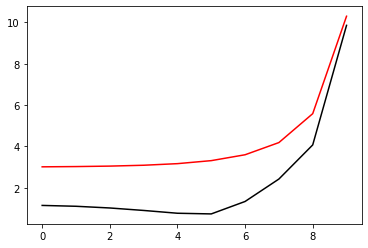

1500 98.01892677673148 -2.09057237210745 -3.7042557457856997
[1.14738747 1.10606281 1.02357127 0.90416401 0.7692939  0.73764068
 1.33845009 2.42425678 4.07463367 9.85651447]


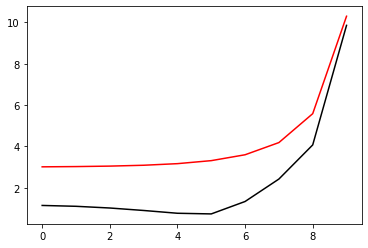

1600 98.01883300880785 -2.089811826587242 -3.710744748196093
[1.14660271 1.10517568 1.02258863 0.90324979 0.76882837 0.73799486
 1.33788946 2.42411211 4.07512195 9.85623696]


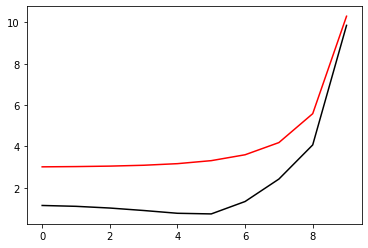

1700 98.01873827158057 -2.0890426991291062 -3.7172654291258653
[1.14581557 1.10428341 1.02159737 0.90232406 0.76834893 0.73833269
 1.33732349 2.42396409 4.0756097  9.85595948]


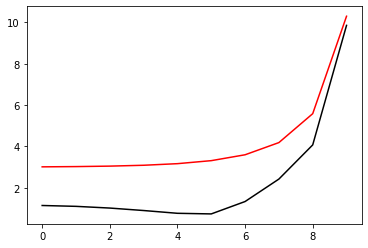

1800 98.01864252396084 -2.088264665951778 -3.7238188307974167
[1.14502595 1.10338578 1.02059715 0.90138637 0.76785509 0.73865374
 1.33675185 2.42381253 4.07609684 9.85568204]


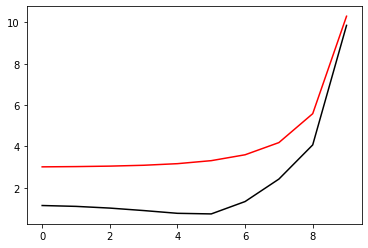

1900 98.01854572242571 -2.087477385344286 -3.7304060450742473
[1.14423372 1.10248254 1.01958756 0.90043622 0.76734634 0.73895758
 1.33617419 2.42365721 4.07658326 9.85540464]


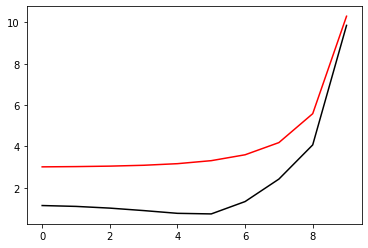

2000 98.01844782081959 -2.08668049633032 -3.737028216802981
[1.14343877 1.10157344 1.01856822 0.89947309 0.76682213 0.73924376
 1.33559012 2.42349793 4.07706885 9.85512727]


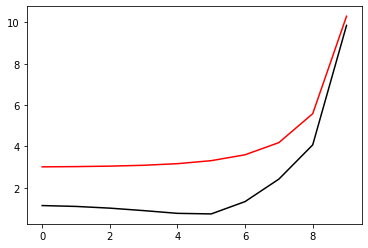

2100 98.01834877013499 -2.0858736172073815 -3.743686547445734
[1.14264096 1.10065823 1.01753868 0.89849645 0.76628189 0.73951179
 1.33499925 2.42333446 4.0775535  9.85484995]


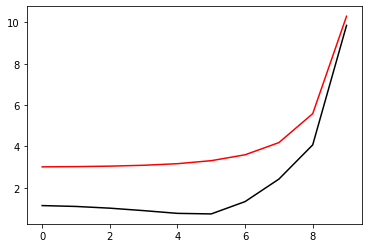

2200 98.0182485182707 -2.0850563439465626 -3.7503822990339377
[1.14184016 1.09973662 1.01649851 0.8975057  0.765725   0.73976115
 1.33440116 2.42316655 4.07803708 9.85457265]


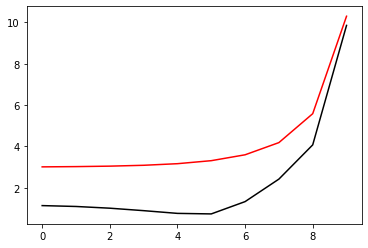

2300 98.01814700976355 -2.0842282484368355 -3.7571167984786062
[1.14103623 1.09880831 1.01544721 0.89650024 0.76515081 0.73999128
 1.33379539 2.42299393 4.07851945 9.8542954 ]


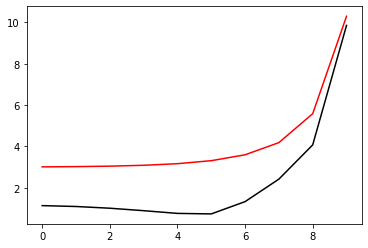

2400 98.01804418549129 -2.083388876555597 -3.7638914422766003
[1.140229   1.09787298 1.01438429 0.89547943 0.76455866 0.7402016
 1.33318147 2.42281632 4.07900046 9.85401818]


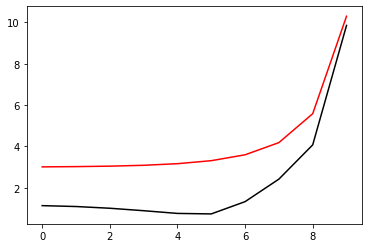

2500 98.01793998234167 -2.0825377460446504 -3.770707701657728
[1.13941832 1.09693031 1.0133092  0.89444257 0.7639478  0.74039147
 1.3325589  2.42263343 4.07947996 9.853741  ]


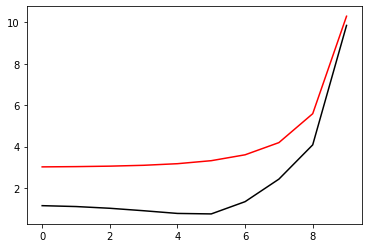

2600 98.0178343328446 -2.0816743441678947 -3.777567128223502
[1.13860401 1.09597993 1.01222138 0.89338893 0.76331748 0.74056023
 1.33192714 2.42244492 4.07995777 9.85346385]


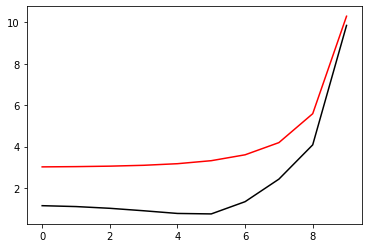

2700 98.01772716476049 -2.080798125123557 -3.784471360135403
[1.13778589 1.09502146 1.0111202  0.89231774 0.76266686 0.74070715
 1.33128561 2.42225045 4.08043369 9.85318674]


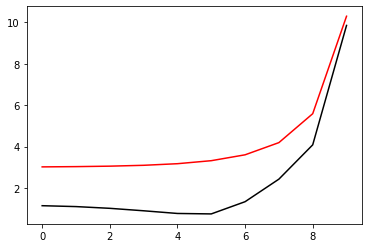

2800 98.01761840062035 -2.079908507179828 -3.791422128918668
[1.13696375 1.09405449 1.01000502 0.89122818 0.76199507 0.74083149
 1.33063371 2.42204964 4.08090753 9.85290966]


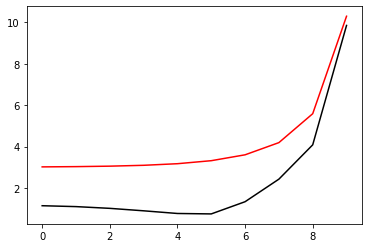

2900 98.01750795720916 -2.0790048694981245 -3.7984212669570114
[1.13613739 1.09307859 1.00887515 0.89011936 0.76130119 0.7409324
 1.32997077 2.4218421  4.08137907 9.85263263]


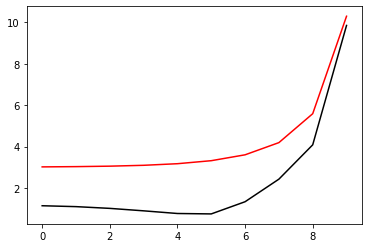

3000 98.01739574498535 -2.0780865486026836 -3.805470715764755
[1.13530657 1.09209329 1.00772984 0.88899034 0.76058422 0.74100903
 1.3292961  2.42162739 4.08184806 9.85235562]


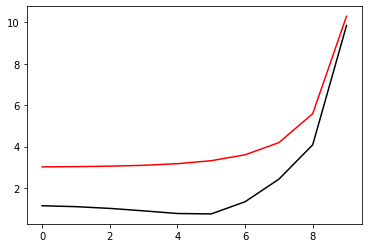

3100 98.01728166742578 -2.077152834448837 -3.8125725351358204
[1.13447106 1.09109809 1.0065683  0.88784012 0.75984308 0.74106041
 1.32860895 2.42140503 4.08231425 9.85207866]


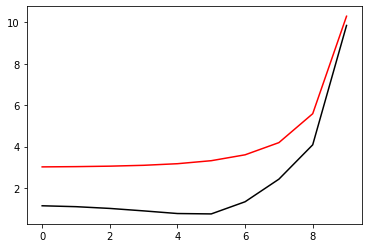

3200 98.01716562028557 -2.0762029660346557 -3.8197289132841803
[1.13363058 1.09009245 1.00538968 0.88666762 0.75907665 0.74108555
 1.32790851 2.42117453 4.08277733 9.85180173]


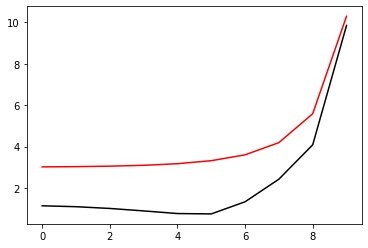

3300 98.01704749075816 -2.0752361264917103 -3.826942178108261
[1.13278487 1.08907581 1.00419306 0.88547169 0.7582837  0.74108334
 1.32719391 2.42093533 4.08323701 9.85152483]


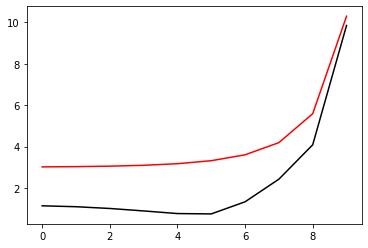

3400 98.01692715652067 -2.074251437579999 -3.8342148097330484
[1.13193361 1.08804753 1.00297747 0.88425109 0.7574629  0.74105261
 1.32646421 2.42068684 4.08369293 9.85124797]


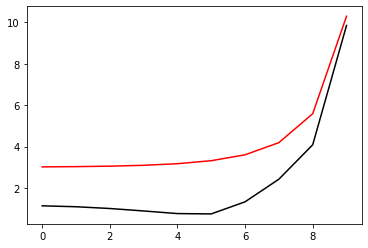

3500 98.01680448464452 -2.073247953499341 -3.8415494545087188
[1.13107648 1.08700695 1.00174185 0.88300448 0.75661286 0.74099208
 1.32571842 2.42042841 4.08414473 9.85097114]


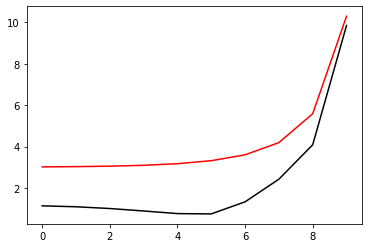

3600 98.01667933034867 -2.072224653914305 -3.848948940674563
[1.13021313 1.08595334 1.00048505 0.88173043 0.75573203 0.7409004
 1.32495543 2.42015934 4.084592   9.85069435]


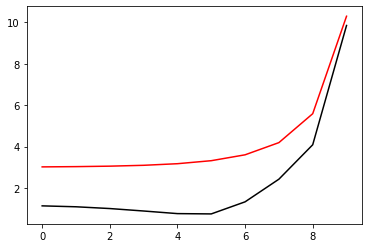

3700 98.01655153556807 -2.0711804360714017 -3.8564162959329122
[1.12934317 1.08488593 0.99920584 0.88042738 0.75481877 0.74077605
 1.32417406 2.41987886 4.08503427 9.8504176 ]


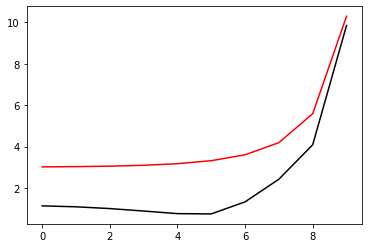

3800 98.01642092730346 -2.070114105865158 -3.863954767220665
[1.1284662  1.08380386 0.99790289 0.87909366 0.7538713  0.74061744
 1.32337304 2.41958614 4.08547105 9.85014088]


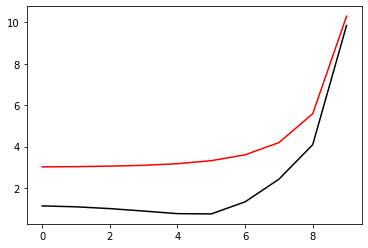

3900 98.01628731571292 -2.0690243676829105 -3.8715678430180342
[1.12758175 1.08270621 0.99657475 0.87772744 0.75288768 0.7404228
 1.32255097 2.41928026 4.0859018  9.84986419]


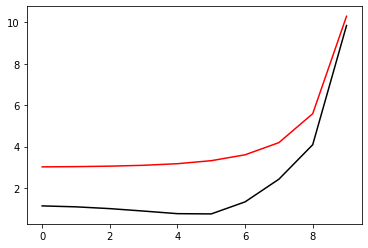

4000 98.0161504918955 -2.067909812825523 -3.879259278596938
[1.12668935 1.08159198 0.99521983 0.87632675 0.7518658  0.74019022
 1.32170632 2.41896021 4.08632591 9.84958754]


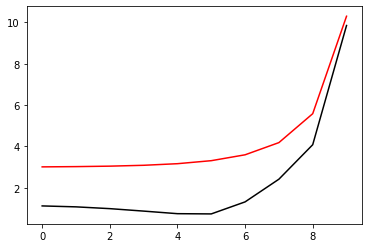

4100 98.01601022530659 -2.0667689062614065 -3.887033124688095
[1.12578844 1.08046006 0.99383644 0.87488943 0.75080338 0.73991761
 1.32083743 2.4186249  4.08674271 9.84931092]


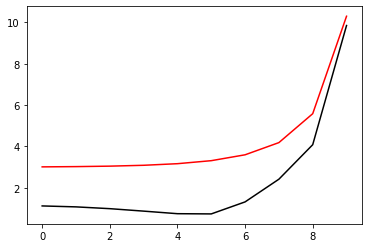

4200 98.01586626073134 -2.0655999714221998 -3.894893760139419
[1.12487846 1.07930926 0.99242268 0.87341313 0.74969791 0.73960268
 1.31994249 2.41827309 4.08715145 9.84903433]


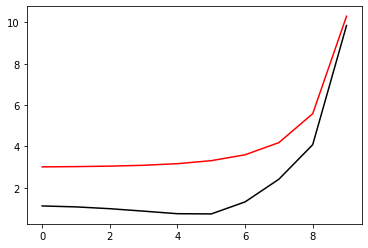

4300 98.01571831472454 -2.0644011726880382 -3.902845929253531
[1.12395875 1.07813826 0.9909765  0.87189528 0.74854666 0.73924292
 1.31901949 2.41790346 4.0875513  9.84875777]


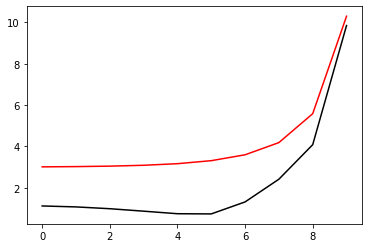

4400 98.01556607140127 -2.063170495135251 -3.9108947846344635
[1.12302861 1.07694561 0.98949565 0.87033305 0.74734662 0.73883557
 1.31806623 2.41751452 4.08794135 9.84848125]


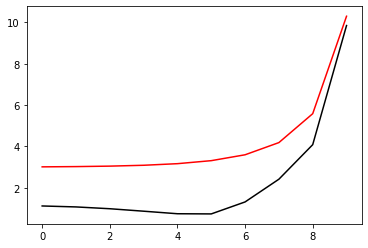

4500 98.01540917743714 -2.0619057210256395 -3.9190459365506176
[1.12208727 1.07572971 0.98797764 0.86872335 0.74609448 0.73837759
 1.31708028 2.41710461 4.08832055 9.84820476]


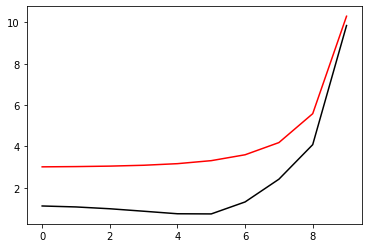

4600 98.01524723609556 -2.0606044023988783 -3.9273055100423284
[1.12113385 1.07448881 0.98641973 0.86706276 0.7447866  0.73786561
 1.31605896 2.4166719  4.08868776 9.8479283 ]


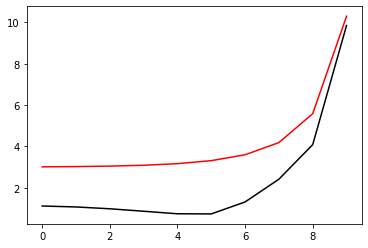

4700 98.01507980005412 -2.059263828980958 -3.9356802112809635
[1.12016741 1.07322094 0.98481888 0.86534747 0.74341894 0.73729591
 1.31499926 2.41621434 4.08904168 9.84765187]


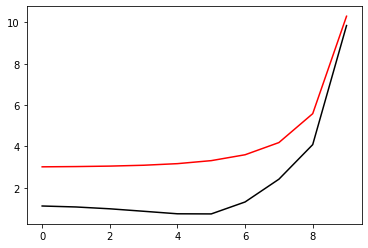

4800 98.01490636273508 -2.057880990432709 -3.9441774050394973
[1.11918688 1.07192392 0.98317173 0.8635733  0.74198703 0.73666432
 1.31389787 2.41572963 4.08938083 9.84737548]


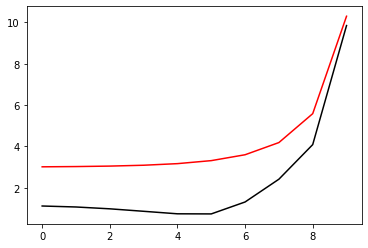

4900 98.01472634776226 -2.0564525317205766 -3.95280520558491
[1.11819108 1.07059531 0.98147451 0.86173556 0.74048586 0.73596621
 1.31275106 2.41521519 4.08970357 9.84709911]


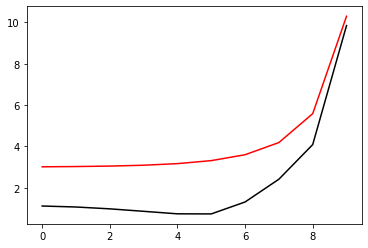

5000 98.014539096052 -2.0549747000800465 -3.9615725838819347
[1.11717868 1.0692324  0.979723   0.85982901 0.73890985 0.73519639
 1.31155465 2.41466812 4.090008   9.84682277]


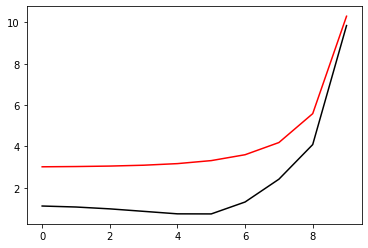

5100 98.01434384989237 -2.053443281637031 -3.970489494748274
[1.11614818 1.06783211 0.97791249 0.85784778 0.73725274 0.73434902
 1.31030393 2.4140851  4.090292   9.84654645]


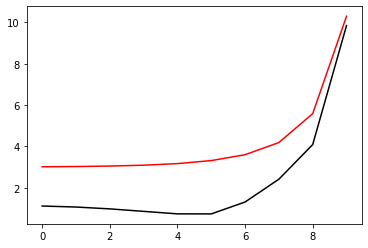

5200 98.01413973315614 -2.051853525222055 -3.979567028582313
[1.11509789 1.06639096 0.97603764 0.85578526 0.73550745 0.7334175
 1.30899358 2.41346241 4.0905531  9.84627016]


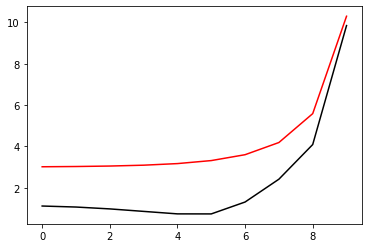

5300 98.01392572650613 -2.0502000502114317 -3.9888175935780836
[1.11402589 1.06490503 0.97409242 0.85363395 0.733666   0.73239436
 1.30761754 2.41279576 4.0907885  9.8459939 ]


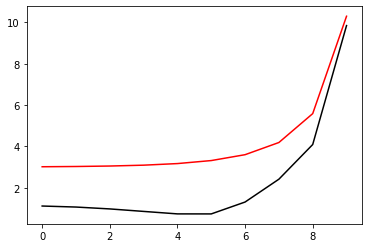

5400 98.01370063604844 -2.048476734295869 -3.9982551360646106
[1.11293    1.06336983 0.97206993 0.85138533 0.73171928 0.73127105
 1.3061689  2.41208024 4.09099494 9.84571766]


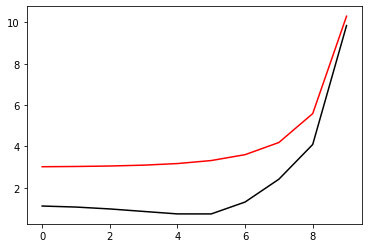

5500 98.01346305332602 -2.0466765758206056 -4.007895408923692
[1.11180772 1.0617802  0.96996233 0.84902967 0.72965688 0.73003783
 1.30463973 2.4113102  4.09116866 9.84544145]


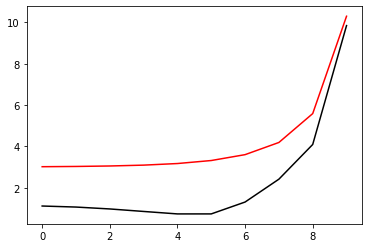

5600 98.01321130373623 -2.04479152363365 -4.017756301190983
[1.11065617 1.06013023 0.96776055 0.84655577 0.72746685 0.72868343
 1.30302087 2.41047907 4.09130527 9.84516525]


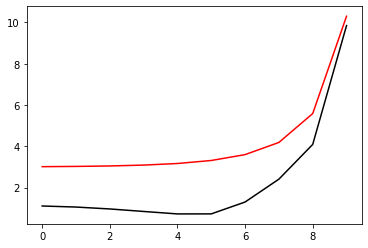

5700 98.01294337928695 -2.0428122650328544 -4.027858246280605
[1.10947199 1.05841302 0.96545412 0.84395069 0.72513534 0.72719483
 1.30130168 2.40957922 4.09139962 9.84488908]


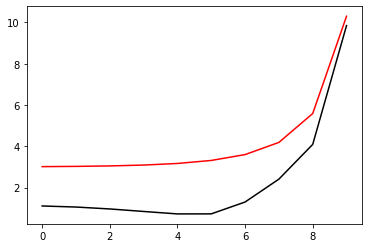

5800 98.01265684988732 -2.0407279591430516 -4.038224732314556
[1.10825129 1.05662056 0.96303085 0.84119936 0.72264624 0.72555684
 1.29946976 2.40860166 4.09144564 9.84461292]


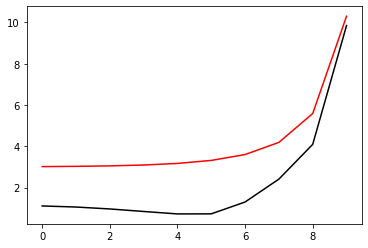

5900 98.01234874480133 -2.0385258984704056 -4.04888294656997
[1.10698951 1.05474342 0.96047641 0.83828414 0.71998068 0.72375162
 1.29751048 2.4075358  4.09143613 9.84433677]


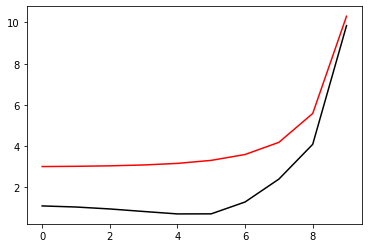

6000 98.01201539199391 -2.0361910748517995 -4.05986459828485
[1.10568122 1.05277043 0.9577739  0.83518418 0.71711635 0.72175806
 1.29540653 2.40636901 4.09136248 9.84406064]


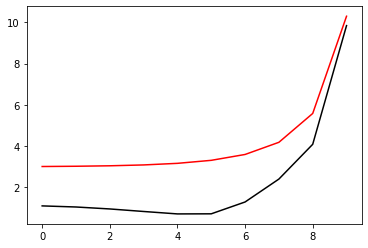

6100 98.01165219706209 -2.033705616591502 -4.071206981863301
[1.10431997 1.05068825 0.95490314 0.83187466 0.71402668 0.719551
 1.29313719 2.40508617 4.09121428 9.84378451]


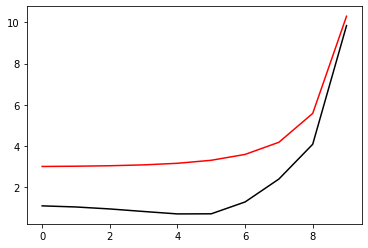

6200 98.01125333391577 -2.0310480497789647 -4.082954368879284
[1.10289802 1.04848083 0.95183991 0.82832575 0.71067974 0.71710013
 1.29067748 2.40366894 4.09097892 9.84350839]


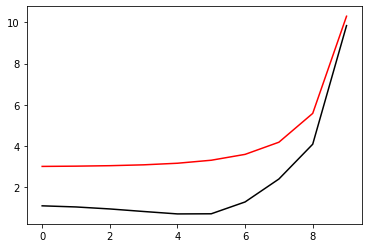

6300 98.01081130399957 -2.028192316287724 -4.095159857027791
[1.10140593 1.04612862 0.94855473 0.82450126 0.70703676 0.71436862
 1.28799698 2.40209493 4.09064089 9.84323227]


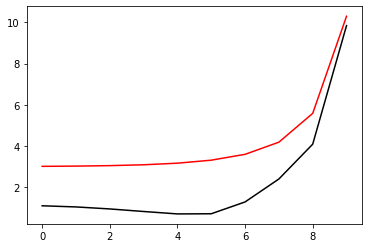

6400 98.01031629546934 -2.025106450068739 -4.107887865315623
[1.09983217 1.04360758 0.94501143 0.82035674 0.70305014 0.71131118
 1.28505823 2.40033648 4.09018097 9.84295614]


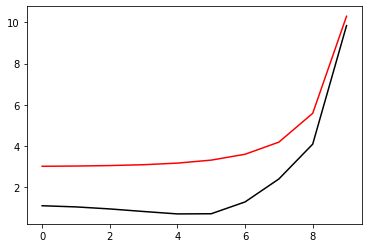

6500 98.009755230778 -2.021750766136026 -4.121217560854146
[1.09816239 1.04088775 0.94116501 0.815837   0.69866072 0.70787149
 1.28181453 2.39835901 4.08957509 9.84268   ]


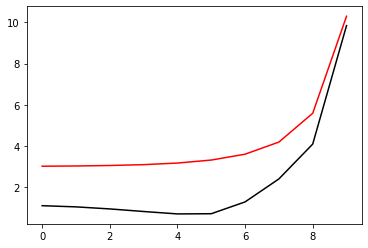

6600 98.00911031645573 -2.0180753435423764 -4.1352476570353325
[1.09637861 1.03793137 0.93695878 0.81087249 0.693794   0.70397852
 1.27820694 2.39611877 4.08879265 9.84240384]


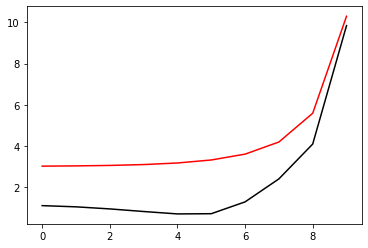

6700 98.0083567753903 -2.014016469435592 -4.150103277105601
[1.09445794 1.03469008 0.93232021 0.80537434 0.68835473 0.69954142
 1.27415996 2.39355964 4.08779436 9.84212765]


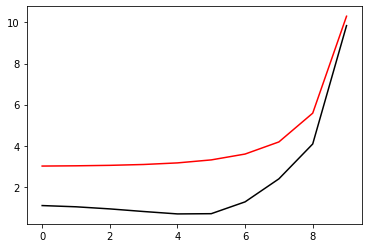

6800 98.00745919637734 -2.009491532667441 -4.165946006199323
[1.09237088 1.03110097 0.927155   0.79922703 0.6822191  0.69444203
 1.26957539 2.3906085  4.08652896 9.84185142]


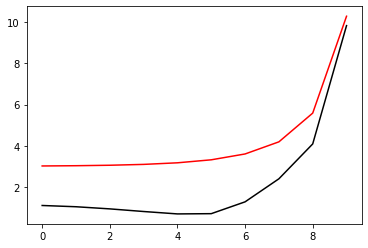

6900 98.0063654713668 -2.0043915807975323 -4.1829889966912015
[1.09007887 1.02708084 0.92133833 0.79227772 0.67522334 0.68852408
 1.26432332 2.38716871 4.08492871 9.84157513]


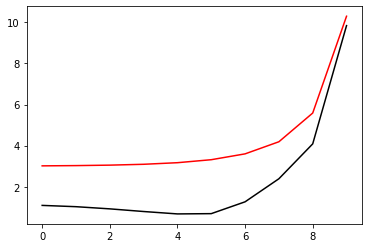

7000 98.00499639239666 -1.998570357715143 -4.201520301207139
[1.0875309  1.02251768 0.91470187 0.78432028 0.66714667 0.68157702
 1.258229   2.38311045 4.08290283 9.84129877]


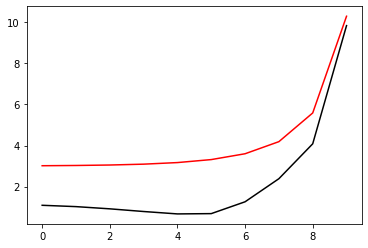

7100 98.00322722622485 -1.991828177007497 -4.221939944174075
[1.08465896 1.01725814 0.90701431 0.7750714  0.65768586 0.67331222
 1.25105363 2.37825714 4.08032857 9.84102232]


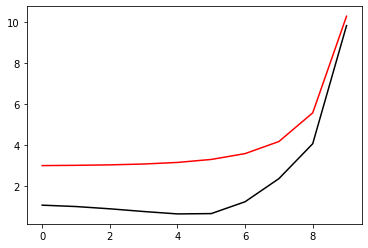

7200 98.00085426024441 -1.9838889287454542 -4.244820343547909
[1.08137282 1.01108983 0.89795292 0.7641353  0.64641797 0.66332859
 1.2424675  2.37236733 4.07704006 9.84074574]


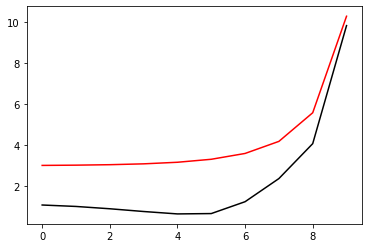

7300 97.99753392349581 -1.9743710618251016 -4.271006214231836
[1.07755738 1.00371936 0.8870653  0.75095591 0.63275048 0.6510684
 1.23201808 2.36511609 4.07281979 9.84046899]


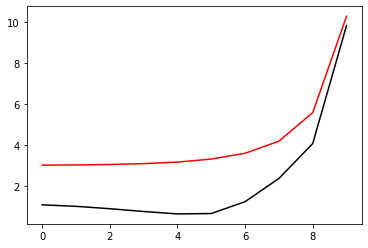

7400 97.99267920298483 -1.9627672956762945 -4.301776414375096
[1.07308611 0.99475914 0.8737348  0.73477111 0.61587615 0.63578384
 1.21911586 2.35609923 4.06741412 9.84019203]


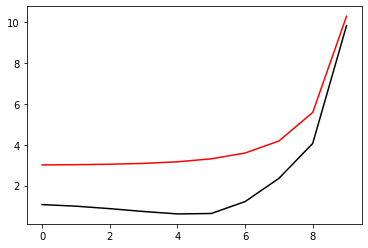

7500 97.98533410003363 -1.9485028399922384 -4.3390733779286235
[1.06789868 0.9837831  0.85722158 0.71465323 0.59482759 0.61661672
 1.20313912 2.34495286 4.06065293 9.83991478]


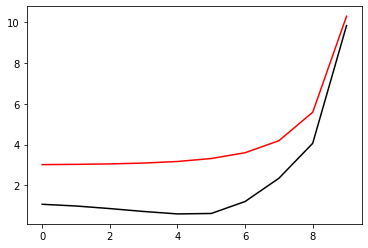

7600 97.97427111814528 -1.9312973192347616 -4.385659071754787
[1.06227454 0.97064622 0.83703239 0.68993547 0.56896246 0.59313243
 1.18397643 2.33186376 4.0528985  9.8396372 ]


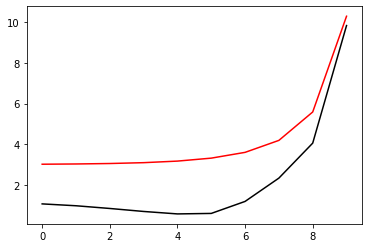

7700 97.95901159503627 -1.9121395644704866 -4.4445522444491115
[1.0574214  0.95634226 0.81402283 0.66151491 0.53940554 0.56681262
 1.16342816 2.31878584 4.04604699 9.83935927]


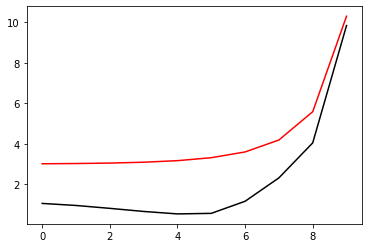

7800 97.94110182514953 -1.8938897111119923 -4.51689454331785
[1.05557931 0.94353488 0.79126991 0.6329301  0.51017539 0.54207068
 1.14596607 2.30991376 4.04378178 9.83908112]


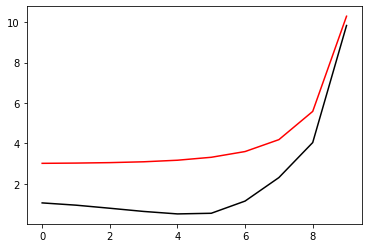

7900 97.92214386549135 -1.8789368529925303 -4.6002700934505985
[1.05811053 0.93441786 0.77164296 0.607565   0.48497795 0.52268001
 1.13505645 2.3081823  4.04846473 9.83880304]


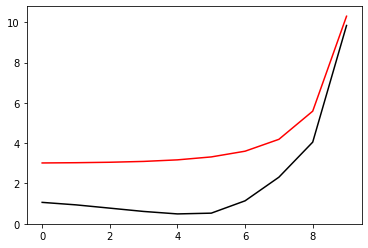

8000 97.90213384935126 -1.8669825051432842 -4.690788612290305
[1.06419594 0.92865285 0.75508281 0.58541678 0.46365872 0.50816725
 1.12985875 2.31248224 4.05890328 9.83852534]


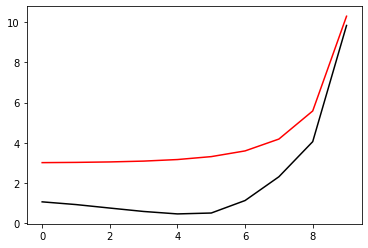

8100 97.880926097571 -1.856678727268549 -4.785644331203982
[1.07239769 0.92490321 0.74021765 0.56492679 0.44435865 0.4963298
 1.12795343 2.32037602 4.07284137 9.83824824]


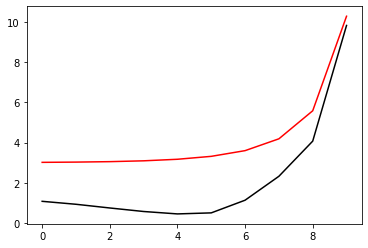

8200 97.8586626686979 -1.8471568050565113 -4.883302764170061
[1.08182269 0.92229637 0.72612666 0.54503976 0.42583264 0.48572239
 1.12778609 2.33032408 4.08887017 9.83797189]


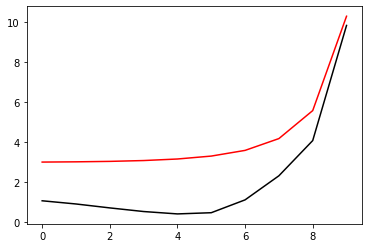

8300 97.83555556972087 -1.8380514366112892 -4.982887606669659
[1.09205493 0.92045196 0.71243197 0.52532434 0.40756063 0.47572367
 1.12866862 2.34162759 4.10633849 9.83769635]


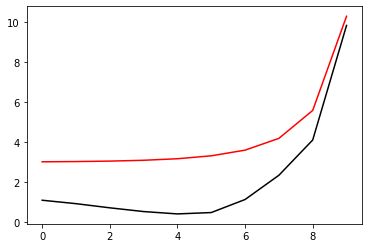

8400 97.81180389090808 -1.8292199562168991 -5.083807091273294
[1.10288947 0.91920986 0.69900148 0.50563291 0.38935123 0.46608311
 1.13029977 2.35396061 4.12492966 9.83742168]


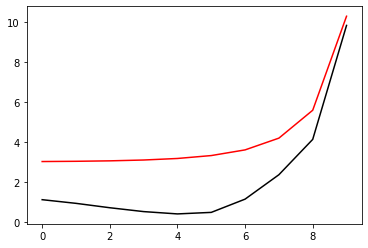

8500 97.7875811755539 -1.8205952698513674 -5.185611595162691
[1.11419982 0.91848614 0.68578561 0.4859131  0.37112476 0.45667866
 1.13251518 2.36713171 4.14444945 9.83714795]


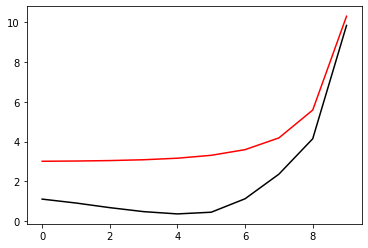

8600 97.76303561208738 -1.8121361978389945 -5.28794285078522
[1.12589264 0.91822389 0.67276135 0.46614308 0.3528388  0.44743379
 1.13520198 2.38100267 4.16475377 9.83687519]


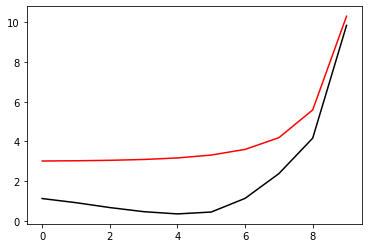

8700 97.73829209404049 -1.8038126893783637 -5.390511509755689
[1.1378933  0.91837848 0.65991569 0.44631239 0.33446601 0.43829234
 1.13827257 2.39546324 4.185726   9.83660343]


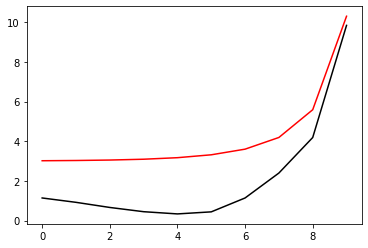

8800 97.71345442222282 -1.7956007726780576 -5.4930839804447835
[1.15014041 0.91891256 0.64724018 0.42641562 0.31598655 0.4292098
 1.14165525 2.41042175 4.20726846 9.8363327 ]


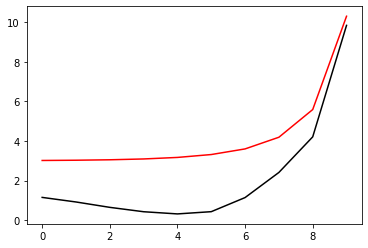

8900 97.68860731380177 -1.7874801742519355 -5.595473377106191
[1.16258296 0.91979369 0.63472842 0.40644946 0.29738457 0.42014908
 1.14528952 2.42580043 4.22929798 9.83606304]


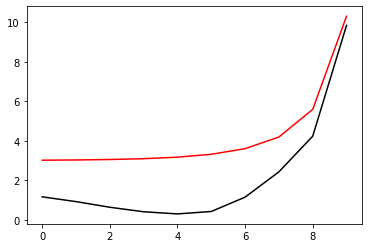

9000 97.66497115294975 -1.7782660703023625 -5.690822062935031
[1.17504673 0.91902863 0.6192899  0.38348326 0.27650287 0.40993358
 1.14910745 2.44241122 4.25261245 9.83579445]


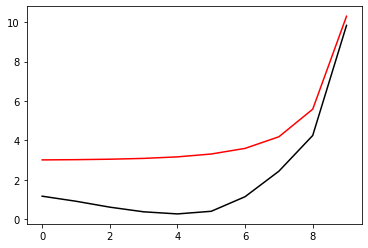

9100 97.64786644128314 -1.766576128087656 -5.744770836933042
[1.18986412 0.91030301 0.58950855 0.34778859 0.24856561 0.39955934
 1.15990862 2.4711142  4.28711789 9.83552726]


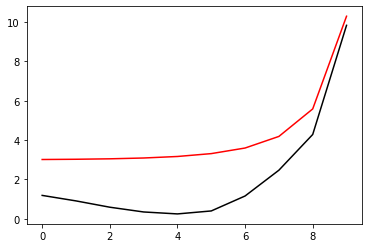

9200 97.63098067757231 -1.7564681272030158 -5.795801333744378
[1.20605649 0.9031244  0.56095101 0.31359009 0.22292646 0.3923836
 1.17454057 2.50380653 4.32513453 9.83526184]


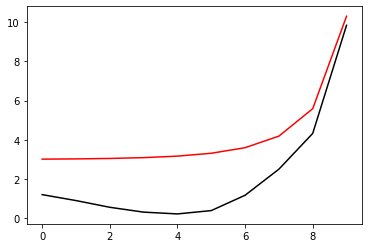

9300 97.61406432671106 -1.7465870617091426 -5.846614155709908
[1.22213568 0.89650067 0.53278514 0.27957789 0.19755416 0.38569127
 1.18982066 2.5371676  4.3637466  9.83499827]


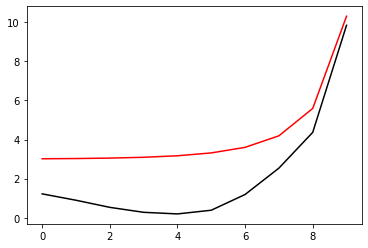

9400 97.59711535330662 -1.7367316975008753 -5.897606905461421
[1.23789386 0.89026498 0.50489168 0.24556313 0.17214775 0.37907642
 1.20526994 2.57069493 4.40251126 9.83473658]


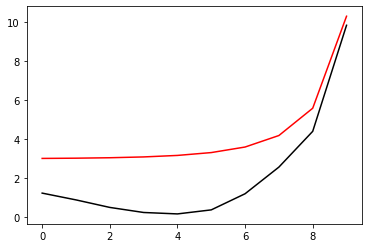

9500 97.5801340690168 -1.7268678756965465 -5.948845551425177
[1.25331162 0.88437148 0.47725231 0.211518   0.14665728 0.37246979
 1.22080495 2.60429926 4.4413489  9.83447676]


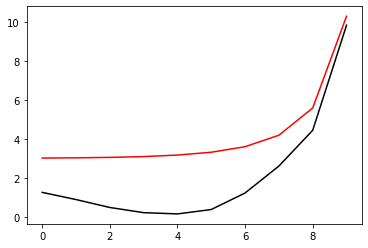

9600 97.5631173983089 -1.7169841791599467 -6.000353691037996
[1.26839787 0.8787922  0.44985993 0.17743428 0.12106603 0.36584921
 1.23639977 2.63795301 4.48023504 9.83421882]


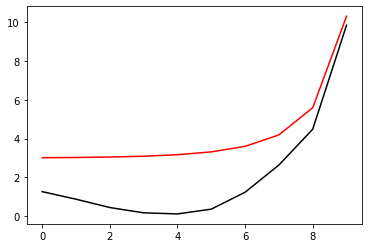

9700 97.5460582290816 -1.707070892781972 -6.0521555736296575
[1.28316687 0.87350208 0.42270549 0.14330234 0.09535844 0.35919732
 1.25203699 2.67163955 4.51915582 9.83396276]


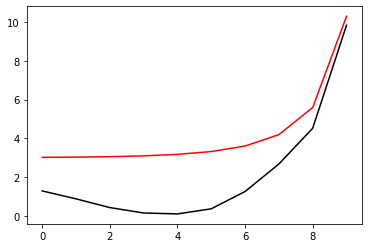

9800 97.52894473027962 -1.697116620841923 -6.104283709962036
[1.29763515 0.86847671 0.39577563 0.10910742 0.06951477 0.35249492
 1.2677004  2.70534578 4.55810172 9.83370858]


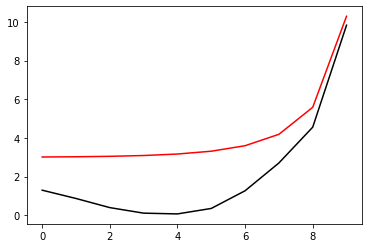

9900 97.51175946584455 -1.6871073429549714 -6.156781726374517
[1.3118214  0.86369173 0.36905181 0.07482814 0.04350937 0.34571941
 1.2833736  2.73906103 4.59706676 9.83345629]


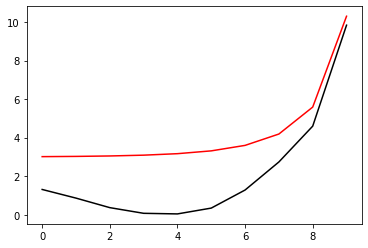

10000 97.49447821777596 -1.6770256794724987 -6.209707053716746
[1.32574688 0.85912251 0.34250936 0.04043512 0.01730929 0.33884364
 1.29903942 2.77277691 4.63604854 9.83320587]


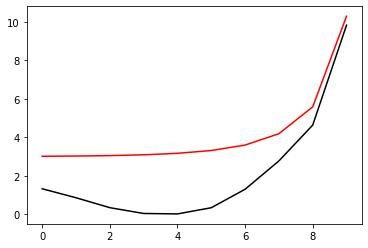

In [93]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 97.47706839204164 -1.666849983949014 -6.263134331371424
[ 1.33943598e+00  8.54743821e-01  3.16116284e-01  5.88914039e-03
 -9.12758275e-03  3.31834623e-01  1.31467930e+00  2.80648716e+00
  4.67504851e+00  9.83295734e+00]


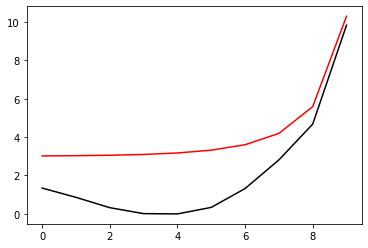

200 97.4594868151327 -1.6565531184720341 -6.317159966296292
[ 1.35291695  0.85052932  0.28983168 -0.02886129 -0.03585493  0.32465175
  1.33027241  2.84018753  4.71407222  9.83271069]


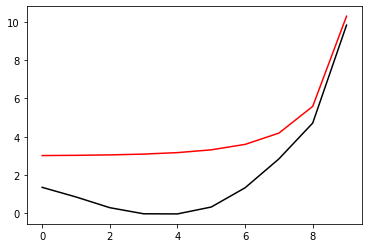

300 97.44167662215393 -1.6461007581592377 -6.371908376047708
[ 1.36622294  0.8464509   0.26360351 -0.06388321 -0.06294141  0.31724429
  1.34579437  2.87387552  4.75312971  9.83246593]


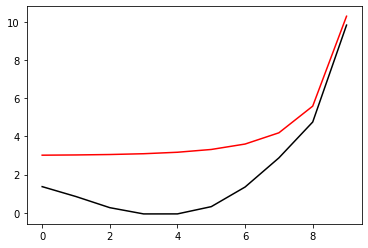

400 97.42356275998851 -1.635449000919908 -6.427540697027592
[ 1.37939323  0.84247776  0.23736551 -0.09926393 -0.09047536  0.30954783
  1.36121545  2.90754991  4.79223586  9.83222306]


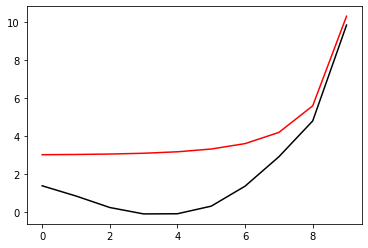

500 97.40504532818069 -1.6245409417684582 -6.484267149012004
[ 1.39247508  0.83857515  0.21103278 -0.1351175  -0.11857156  0.30147918
  1.37649784  2.94121003  4.83141088  9.83198208]


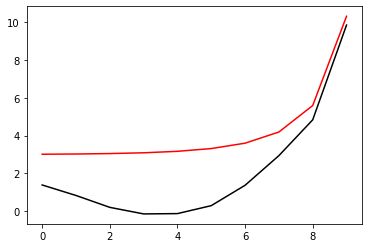

600 97.38598946028837 -1.6133016940489109 -6.542364878020844
[ 1.40552609  0.83470249  0.18449552 -0.17159426 -0.14738105  0.2929289
  1.39159156  2.97485441  4.8706808   9.83174299]


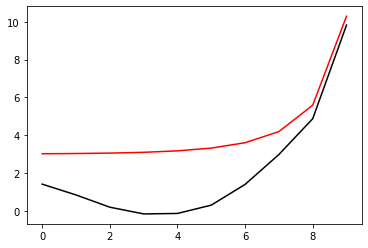

700 97.36620954336891 -1.6016310960954183 -6.602204015095782
[ 1.41861784  0.83081073  0.15760986 -0.20889461 -0.1771054   0.28375028
  1.40642837  3.00847882  4.91007804  9.8315058 ]


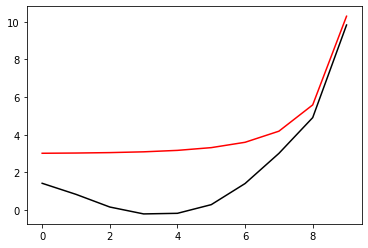

800 97.34544402767139 -1.5893930957733433 -6.664285797884613
[ 1.43184116  0.8268387   0.13018463 -0.24728912 -0.2080177   0.27374322
  1.42091294  3.04207332  4.94964235  9.83127051]


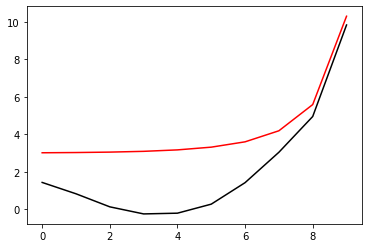

900 97.32331467888189 -1.576400929584422 -6.7292970592054555
[ 1.44531459  0.82270838  0.10196264 -0.28714724 -0.24049233  0.26263185
  1.43491106  3.07561922  4.98942314  9.83103714]


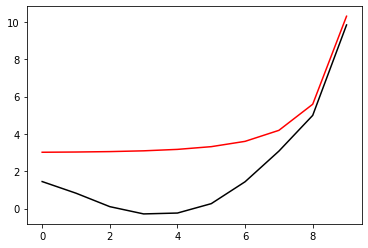

1000 97.29926168032762 -1.5623992065034586 -6.79818143004129
[ 1.45919904  0.81832062  0.07259657 -0.32897482 -0.27504289  0.25003777
  1.44823838  3.10908989  5.02948721  9.8308057 ]


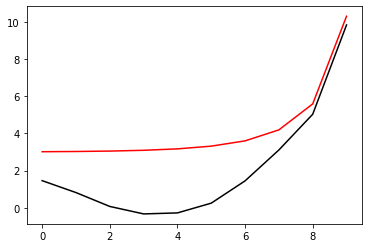

1100 97.27245008847491 -1.547052933036603 -6.872205819767908
[ 1.47372551  0.81355751  0.04162666 -0.3734496  -0.3123539   0.23546576
  1.4606667   3.14247141  5.06994509  9.8305762 ]


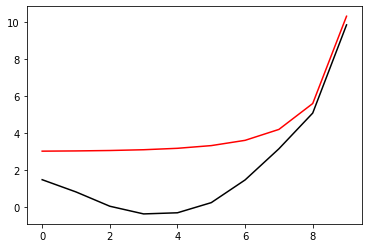

1200 97.24168302747914 -1.529982424238829 -6.952923947683641
[ 1.48925117e+00  8.08312036e-01  8.49260791e-03 -4.21404733e-01
 -3.53244169e-01  2.18366260e-01  1.47200645e+00  3.17585305e+00
  5.11103410e+00  9.83034867e+00]


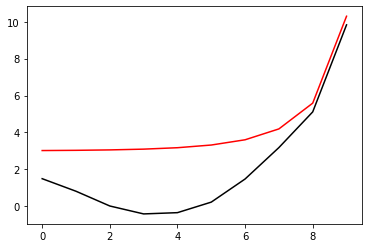

1300 97.20550709768523 -1.5109418476889478 -7.041762415978756
[ 1.50636182  0.80259032 -0.02733273 -0.4736215  -0.39839517  0.19843626
  1.48240081  3.20969289  5.15333218  9.83012315]


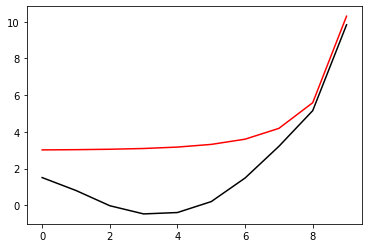

1400 97.16289708114711 -1.4902183288119943 -7.138909214319466
[ 1.52596504  0.79670666 -0.06598672 -0.53026899 -0.44767363  0.17628671
  1.492895    3.24526863  5.19808004  9.82989972]


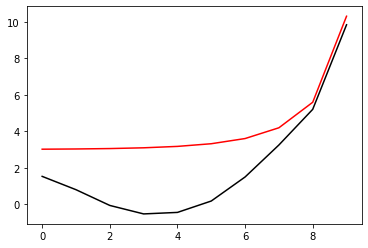

1500 97.1142887119633 -1.4688747228920855 -7.2422553899164
[ 1.54907117  0.79135643 -0.10686061 -0.59035793 -0.49957596  0.15383791
  1.50560021  3.28465295  5.24705116  9.82967854]


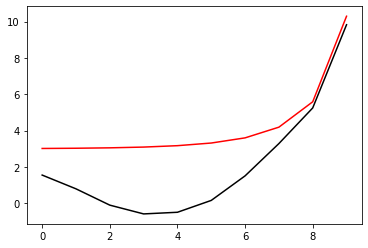

1600 97.06130165536341 -1.4480987856611551 -7.348529295821214
[ 1.57608218  0.78722802 -0.1488829  -0.65225904 -0.55208661  0.13316304
  1.52235522  3.3293395   5.30134423  9.82945985]


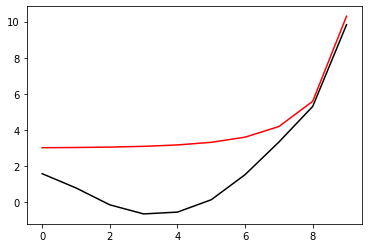

1700 97.00530153220228 -1.428299766944541 -7.455771877244469
[ 1.60643321  0.78455215 -0.19124721 -0.71490838 -0.604217    0.11488698
  1.54327108  3.37901382  5.36045124  9.82924389]


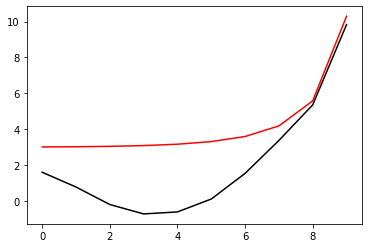

1800 96.9468991724125 -1.4091489456232187 -7.563875958425535
[ 1.63912562  0.78317534 -0.23365935 -0.7781304  -0.65618635  0.09829428
  1.56715248  3.43218509  5.4229221   9.82903087]


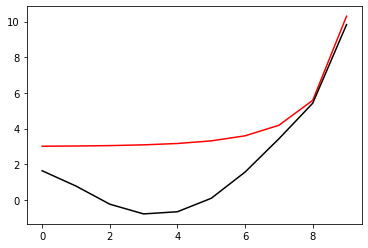

1900 96.88609015148464 -1.3900181065462685 -7.673811216021221
[ 1.67330921  0.78282819 -0.27618521 -0.84231314 -0.7088265   0.08217536
  1.59251151  3.48724896  5.48730915  9.8288209 ]


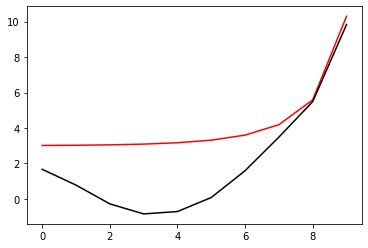

2000 96.82208993844245 -1.3700331557567524 -7.787485922088465
[ 1.70841991  0.7832124  -0.31920347 -0.90835032 -0.7634778   0.06498835
  1.61776791  3.5426956   5.55235202  9.82861406]


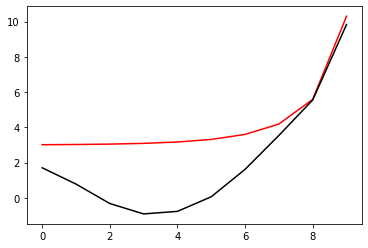

2100 96.75208184735935 -1.3473086672990338 -7.909341437580006
[ 1.74393168  0.78384358 -0.36373833 -0.97838722 -0.82302809  0.04375416
  1.64021213  3.59619047  5.61625294  9.82841034]


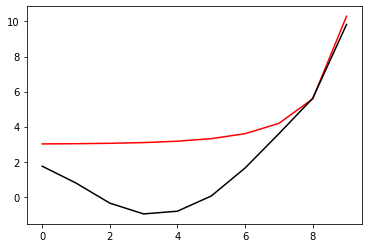

2200 96.63460029560355 -1.2933540610669219 -8.061114714988141
[ 1.77538810e+00  7.82030013e-01 -4.14610435e-01 -1.06335433e+00
 -9.03281755e-01  8.95340411e-04  1.64268052e+00  3.63207711e+00
  5.66620851e+00  9.82820952e+00]


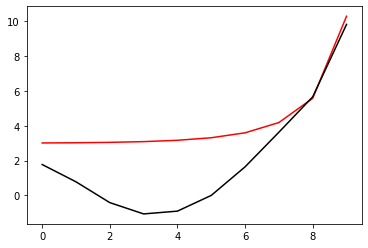

2300 73.03498891245093 0.08218531303048898 -7.864825006405466
[ 1.86092161  0.91758148 -0.25572854 -0.91564847 -0.79448699  0.05882301
  1.65405914  3.61339134  5.63218528  9.82800834]


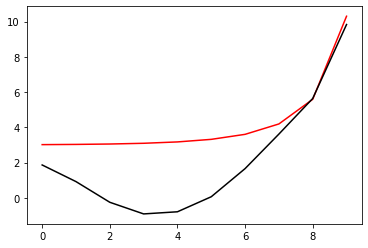

2400 73.21179481173547 0.0843936877028173 -7.63544802494158
[ 1.8808174   0.98255453 -0.17122461 -0.84168649 -0.75149671  0.06327407
  1.62473463  3.56371984  5.57369779  9.82780556]


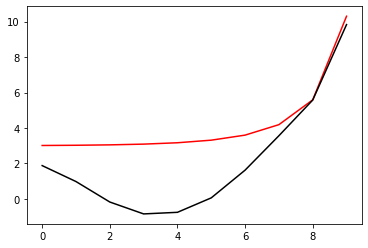

2500 73.0384958219787 0.06478054300912 -7.401988193666556
[ 1.91065109  1.05495841 -0.07890567 -0.75960359 -0.7008155   0.07412564
  1.60001627  3.51711645  5.51726737  9.82760005]


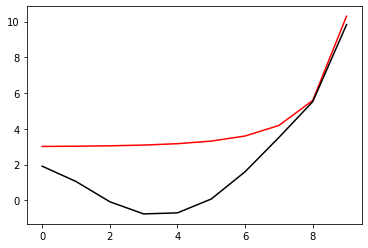

2600 72.56948636198288 0.03460281917926511 -7.144644257555379
[ 1.9709128   1.15855851  0.04862423 -0.64001059 -0.61455025  0.11479266
  1.59760452  3.4865346   5.47264857  9.82739198]


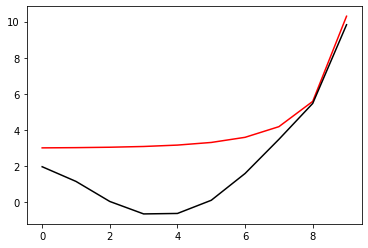

2700 72.08992087702758 -0.028983657285711315 -7.096840229622015
[ 1.96270172  1.17973017  0.08384454 -0.60900946 -0.5934801   0.12609633
  1.60028826  3.48430003  5.46817992  9.8271828 ]


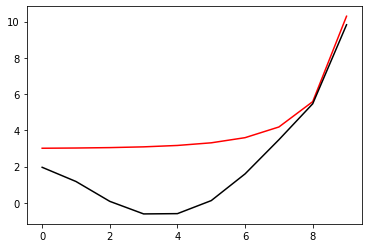

2800 72.08605002791747 -0.03108775662624622 -7.071987240881758
[ 1.9458001   1.18905616  0.10580596 -0.59110508 -0.58315373  0.13066692
  1.60039629  3.48246881  5.46577247  9.82697351]


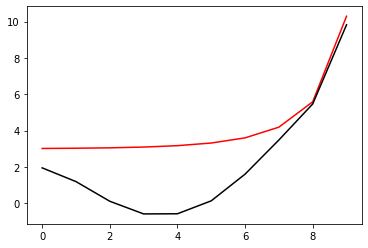

2900 72.08269524106642 -0.03303898826385764 -7.048612070694516
[ 1.92863398  1.19661548  0.12596861 -0.57484354 -0.57435184  0.13395546
  1.59954762  3.4799504   5.46286097  9.82676411]


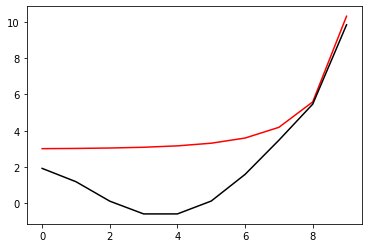

3000 72.07971289883362 -0.03485734813985346 -7.026474217311221
[ 1.91141589  1.20275978  0.14470657 -0.55981597 -0.56667398  0.13631006
  1.59801785  3.47695789  5.45961439  9.82655458]


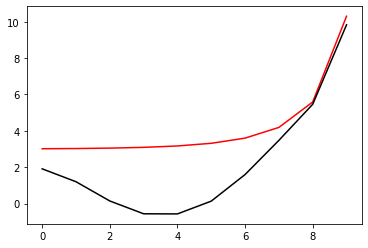

3100 72.07701522606797 -0.036559674012890384 -7.005404864960378
[ 1.89428467  1.20774315  0.16228078 -0.54573903 -0.55984209  0.13797231
  1.59599808  3.47363887  5.45614962  9.82634489]


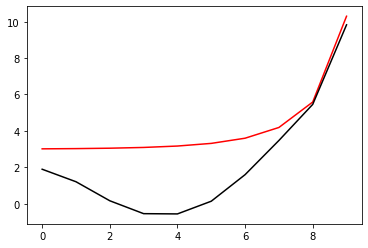

3200 72.0745451423949 -0.03816009989611292 -6.985278593601541
[ 1.87733183  1.21175543  0.17887892 -0.53241087 -0.55365791  0.13911403
  1.59362363  3.47009735  5.45254861  9.82613504]


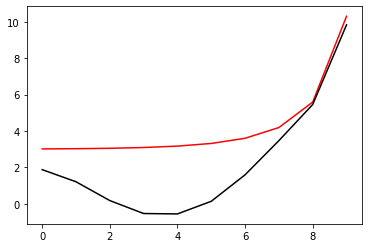

3300 72.07226340752399 -0.039670486360486326 -6.965997772215742
[ 1.86061771  1.21494265  0.19463967 -0.51968436 -0.54797683  0.13985996
  1.59099199  3.46640761  5.44886945  9.82592502]


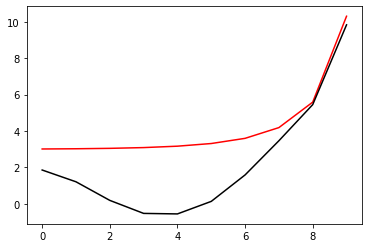

3400 72.07014169375665 -0.041100810897287975 -6.947483516963075
[ 1.8441816   1.21741997  0.20966798 -0.50745004 -0.54269126  0.14030228
  1.58817447  3.46262332  5.44515357  9.82571484]


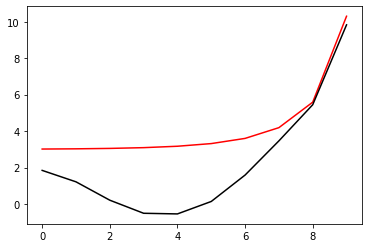

3500 72.06815867200282 -0.0424595043552354 -6.929670207042658
[ 1.82804835  1.21928018  0.22404506 -0.49562507 -0.53771981  0.14051018
  1.58522387  3.45878358  5.4414307   9.82550449]


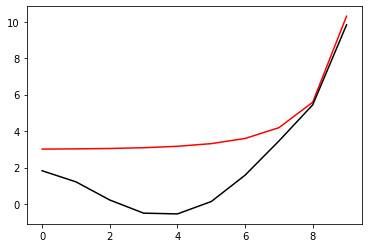

3600 72.06629770262964 -0.04375373106864079 -6.912502010648854
[ 1.81223275  1.22059947  0.23783505 -0.48414584 -0.53299995  0.14053628
  1.58217972  3.45491707  5.43772215  9.82529397]


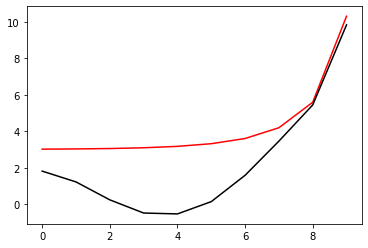

3700 72.06454541718863 -0.04498961743987653 -6.895930591436853
[ 1.79674251  1.22144139  0.25108951 -0.47296278 -0.528483    0.14042113
  1.57907185  3.45104489  5.4340432   9.82508328]


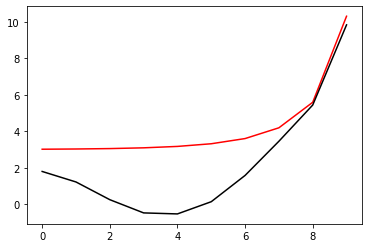

3800 72.06289081379524 -0.04617243651538653 -6.879913534105748
[ 1.78158034  1.2218597   0.2638507  -0.46203687 -0.52413063  0.14019626
  1.57592295  3.44718259  5.43040469  9.82487243]


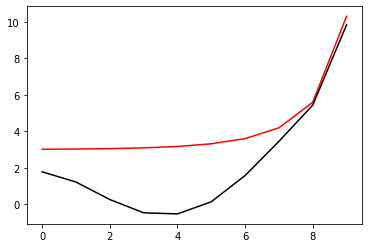

3900 72.0613246592582 -0.04730675640087408 -6.864413223620525
[ 1.7667454   1.22190045  0.27615378 -0.45133703 -0.51991229  0.13988647
  1.57275038  3.44334161  5.42681422  9.82466142]


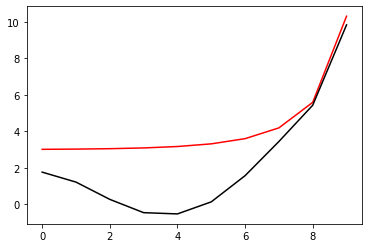

4000 72.05983908054061 -0.048396559576450685 -6.84939602038137
[ 1.75223433  1.22160343  0.28802845 -0.4408383  -0.51580346  0.1395114
  1.56956746  3.43953033  5.42327699  9.82445024]


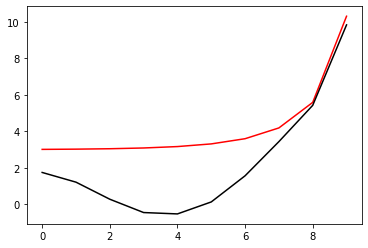

4100 72.05842727678206 -0.04944533904383953 -6.834831634798309
[ 1.738042    1.22100337  0.29950021 -0.43052043 -0.51178425  0.13908673
  1.56638447  3.43575481  5.41979643  9.82423891]


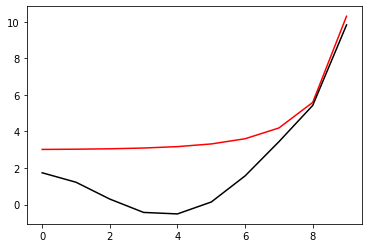

4200 72.05708331040043 -0.05045617611212811 -6.82069264042611
[ 1.72416205  1.22013081  0.31059118 -0.42036691 -0.5078384   0.13862506
  1.56320932  3.43201938  5.41637461  9.82402742]


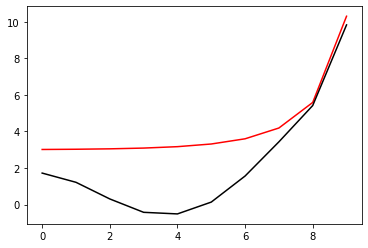

4300 72.05580195154396 -0.0514318036410915 -6.806954086221594
[ 1.71058732  1.21901277  0.32132085 -0.41036413 -0.50395255  0.13813662
  1.56004812  3.42832704  5.41301266  9.82381578]


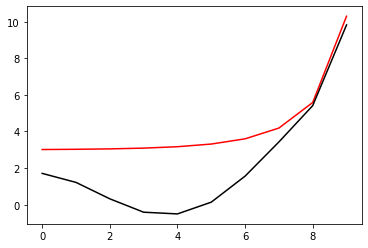

4400 72.05457855950885 -0.05237465774595006 -6.793593181657168
[ 1.69731008  1.21767328  0.33170654 -0.40050086 -0.50011565  0.13762969
  1.55690557  3.42467978  5.40971093  9.82360398]


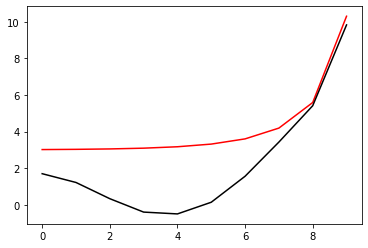

4500 72.05340899041911 -0.053286920315884785 -6.78058903673142
[ 1.68432231  1.21613385  0.34176382 -0.39076772 -0.49631847  0.13711106
  1.55378526  3.42107883  5.40646924  9.82339204]


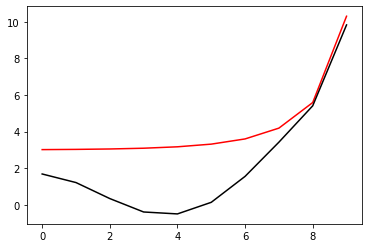

4600 72.05228952400778 -0.05417055418686573 -6.767922444283739
[ 1.67161583  1.21441376  0.35150682 -0.38115689 -0.49255331  0.13658632
  1.55068992  3.41752484  5.40328703  9.82317996]


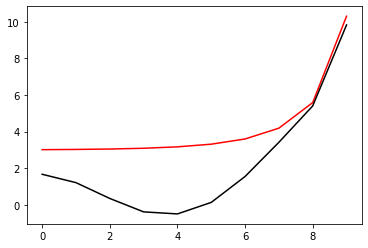

4700 72.05121680459503 -0.055027332411068955 -6.7555756955676225
[ 1.65918242  1.21253041  0.36094846 -0.37166176 -0.48881372  0.13606005
  1.5476216   3.414018    5.40016341  9.82296774]


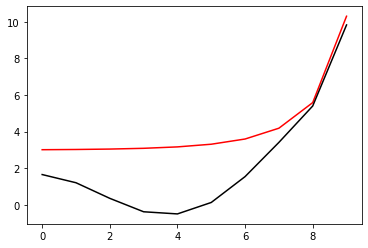

4800 72.0501877928292 -0.05585886275642321 -6.74353242243678
[ 1.6470139   1.21049952  0.37010065 -0.36227676 -0.48509424  0.13553607
  1.54458181  3.41055817  5.3970973   9.82275537]


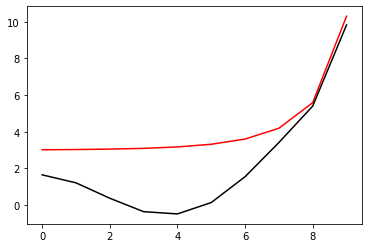

4900 72.04919972573772 -0.05666660833071101 -6.731777461156845
[ 1.63510223  1.20833533  0.37897442 -0.35299715 -0.48139024  0.13501754
  1.54157165  3.40714497  5.39408747  9.82254288]


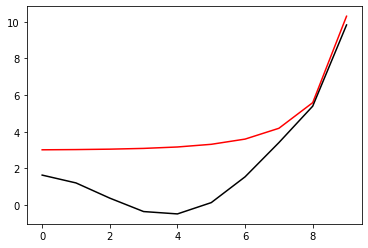

5000 72.04825008329692 -0.05745190503920608 -6.720296734026995
[ 1.6234395   1.20605079  0.3875801  -0.34381887 -0.47769782  0.13450709
  1.53859185  3.40377779  5.39113259  9.82233025]


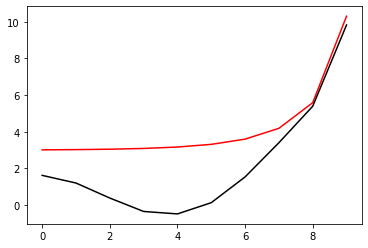

5100 72.04733656019386 -0.0582159764406255 -6.709077145839851
[ 1.61201803  1.20365767  0.39592735 -0.33473845 -0.47401366  0.13400691
  1.53564291  3.40045592  5.38823127  9.82211748]


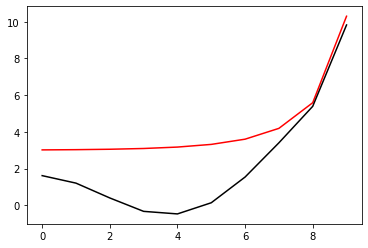

5200 72.04645704177442 -0.05895994645364047 -6.698106492828457
[ 1.60083033  1.20116674  0.40402526 -0.3257529  -0.47033491  0.13351884
  1.5327251   3.39717852  5.38538208  9.82190459]


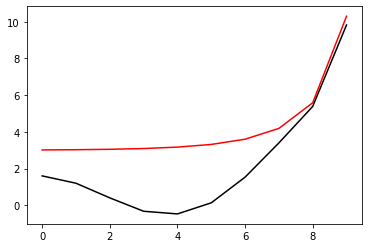

5300 72.04560958340929 -0.059684850277981906 -6.687373382213247
[ 1.58986915  1.1985878   0.41188247 -0.31685961 -0.46665916  0.13304441
  1.52983851  3.39394471  5.38258358  9.82169158]


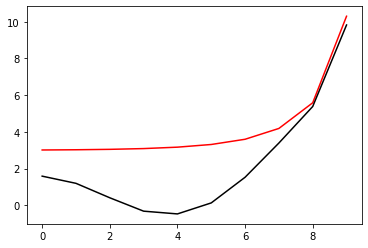

5400 72.04479239267638 -0.060391643824734095 -6.676867160815119
[ 1.57912746  1.19592984  0.41950713 -0.30805632 -0.46298437  0.13258493
  1.52698312  3.39075352  5.37983434  9.82147844]


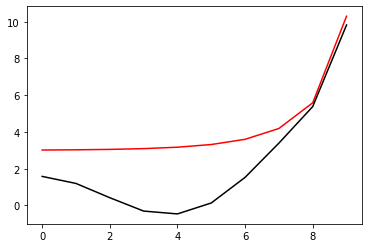

5500 72.04400381388778 -0.06108121189547075 -6.666577851474088
[ 1.5685985   1.19320109  0.42690704 -0.29934105 -0.45930876  0.13214147
  1.5241588   3.38760399  5.37713293  9.82126518]


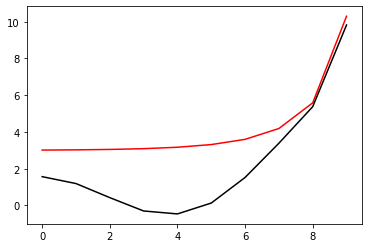

5600 72.04324231458313 -0.06175437530619421 -6.6564960962269595
[ 1.55827573  1.19040908  0.43408961 -0.29071205 -0.45563085  0.13171493
  1.52136533  3.38449514  5.37447796  9.82105181]


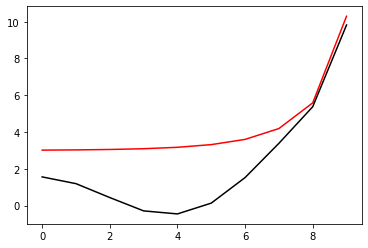

5700 72.04250647368399 -0.062411897117137294 -6.646613105367836
[ 1.54815288  1.18756074  0.44106195 -0.28216777 -0.45194936  0.13130609
  1.51860244  3.38142595  5.37186806  9.82083831]


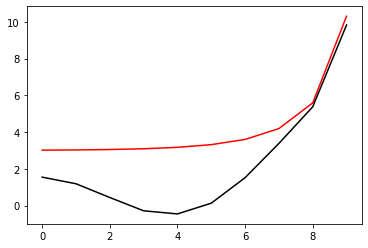

5800 72.04179497106227 -0.06305448810144185 -6.6369206116522
[ 1.53822388  1.18466243  0.44783087 -0.27370681 -0.44826322  0.13091558
  1.51586979  3.37839546  5.3693019   9.82062471]


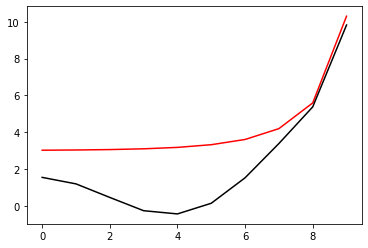

5900 72.04110657831708 -0.0636828115631054 -6.627410829016401
[ 1.52848293  1.18172     0.45440288 -0.26532795 -0.44457152  0.13054395
  1.51316705  3.37540268  5.3667782   9.82041099]


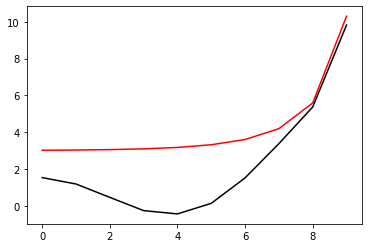

6000 72.04044015059166 -0.06429748759623237 -6.618076415275734
[ 1.51892441  1.17873883  0.46078427 -0.25703004 -0.44087348  0.13019163
  1.51049381  3.37244666  5.3642957   9.82019716]


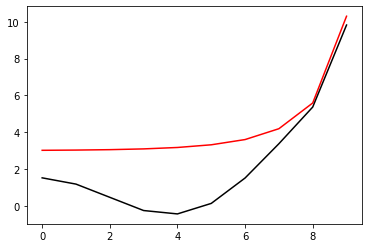

6100 72.03979461928887 -0.06489909686266329 -6.60891043833976
[ 1.50954298  1.17572387  0.46698109 -0.24881205 -0.43716847  0.129859
  1.50784968  3.36952646  5.36185319  9.81998322]


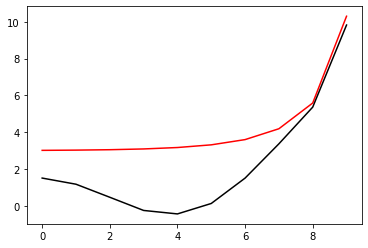

6200 72.03916898556712 -0.06548818395281497 -6.599906345546475
[ 1.50033345  1.17267967  0.47299914 -0.24067304 -0.43345595  0.12954639
  1.50523424  3.36664118  5.35944952  9.81976918]


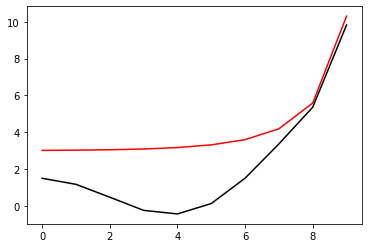

6300 72.03856231451576 -0.06606526038448603 -6.591057935769771
[ 1.49129087  1.16961045  0.47884405 -0.23261212 -0.4297355   0.12925403
  1.50264708  3.36378991  5.35708355  9.81955504]


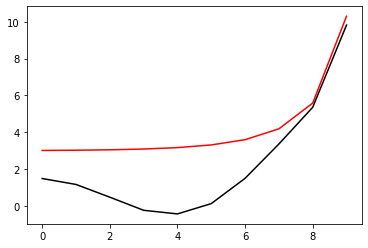

6400 72.03797372992595 -0.0666308072860571 -6.5823593339992374
[ 1.48241048  1.16652006  0.48452124 -0.22462847 -0.42600674  0.12898216
  1.50008778  3.36097181  5.35475421  9.81934079]


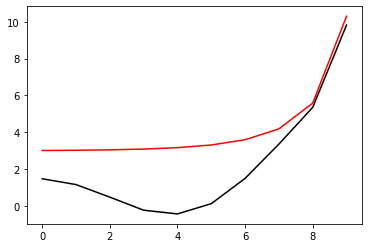

6500 72.03740240958318 -0.0671852778036125 -6.573804968129321
[ 1.4736877   1.1634121   0.49003592 -0.21672131 -0.42226941  0.12873095
  1.49755592  3.35818604  5.35246047  9.81912644]


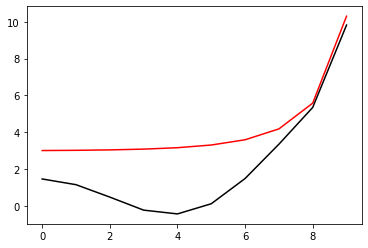

6600 72.03684758102004 -0.06772909926574396 -6.565389547727071
[ 1.46511815  1.16028984  0.49539317 -0.2088899  -0.41852329  0.12850054
  1.49505108  3.3554318   5.35020131  9.81891199]


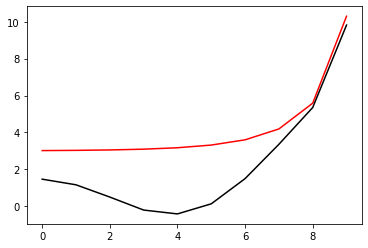

6700 72.0363085176753 -0.06826267513499178 -6.5571080445756165
[ 1.4566976   1.15715633  0.50059787 -0.20113353 -0.41476822  0.12829104
  1.49257286  3.35270831  5.34797579  9.81869744]


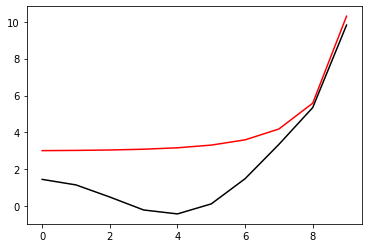

6800 72.03578453541297 -0.0687863867708215 -6.548955674814161
[ 1.44842199  1.15401439  0.50565475 -0.19345153 -0.41100408  0.12810255
  1.49012085  3.35001483  5.34578299  9.8184828 ]


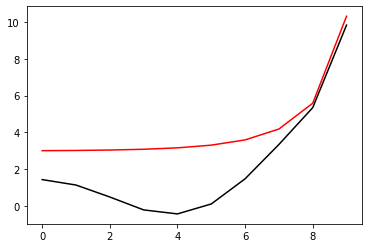

6900 72.0352749893612 -0.06930059502562437 -6.540927882516097
[ 1.44028744  1.15086659  0.51056839 -0.18584321 -0.40723081  0.12793515
  1.48769467  3.34735064  5.34362202  9.81826806]


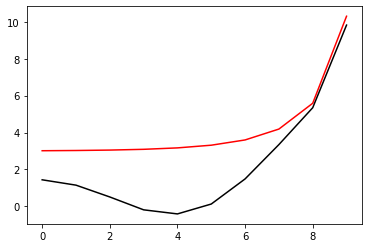

7000 72.03477927103569 -0.06980564169234116 -6.53302032456457
[ 1.4322902   1.14771533  0.51534321 -0.17830795 -0.40344837  0.12778889
  1.48529394  3.34471504  5.34149204  9.81805324]


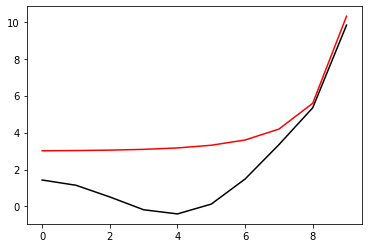

7100 72.03429680571774 -0.07030185081984201 -6.52522885670046
[ 1.42442666  1.14456282  0.51998352 -0.17084509 -0.39965677  0.12766381
  1.4829183   3.34210737  5.33939225  9.81783832]


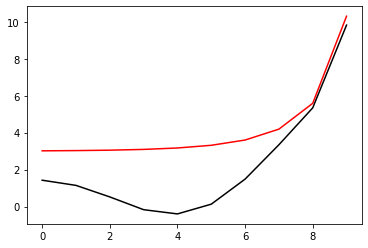

7200 72.03382705005939 -0.07078952991011528 -6.517549520631217
[ 1.41669338  1.1414111   0.52449347 -0.16345401 -0.39585603  0.12755996
  1.48056738  3.339527    5.33732185  9.81762331]


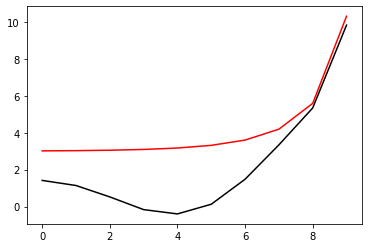

7300 72.03336948989286 -0.07126897100950078 -6.509978532100871
[ 1.40908702  1.13826206  0.52887709 -0.15613409 -0.39204621  0.12747735
  1.47824084  3.33697332  5.33528012  9.81740821]


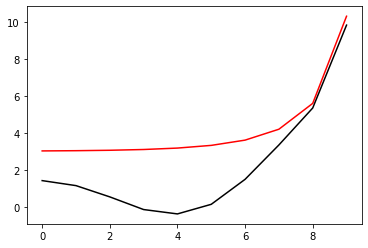

7400 72.03292363822267 -0.07174045170468077 -6.502512269831888
[ 1.40160439  1.13511745  0.53313829 -0.1488847  -0.38822738  0.127416
  1.47593836  3.33444573  5.33326632  9.81719302]


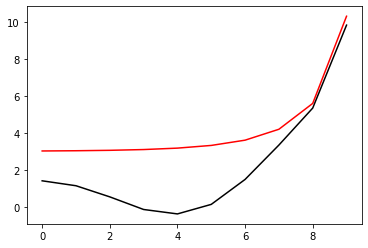

7500 72.03248903338338 -0.07220423603279252 -6.495147265258652
[ 1.3942424   1.13197886  0.53728085 -0.14170522 -0.38439964  0.12737592
  1.47365962  3.33194368  5.3312798   9.81697775]


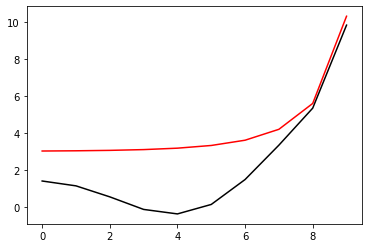

7600 72.03206523734566 -0.07266057531388011 -6.4878801929803736
[ 1.3869981   1.1288478   0.54130844 -0.13459504 -0.38056308  0.12735712
  1.47140432  3.32946663  5.32931988  9.8167624 ]


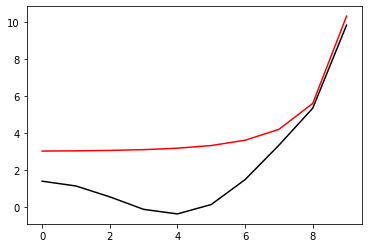

7700 72.03165183415643 -0.07310970891289723 -6.480707861868201
[ 1.37986864  1.12572564  0.54522464 -0.12755352 -0.37671783  0.12735961
  1.46917217  3.32701406  5.32738594  9.81654696]


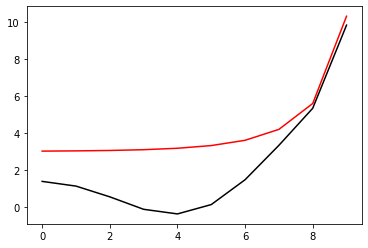

7800 72.03124842850166 -0.07355186493759049 -6.473627206767626
[ 1.37285126  1.12261365  0.54903289 -0.12058004 -0.37286401  0.12738338
  1.46696289  3.32458549  5.32547739  9.81633144]


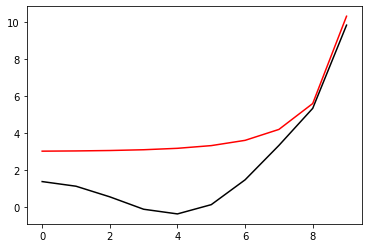

7900 72.03085464437778 -0.0739872608778249 -6.466635280742626
[ 1.36594333  1.119513    0.55273655 -0.11367396 -0.36900177  0.12742844
  1.46477623  3.32218044  5.32359364  9.81611584]


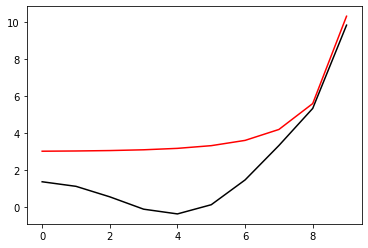

8000 72.03047012386473 -0.07441610419122484 -6.459729247812971
[ 1.3591423   1.1164248   0.55633888 -0.10683465 -0.36513124  0.12749479
  1.46261193  3.31979847  5.32173415  9.81590016]


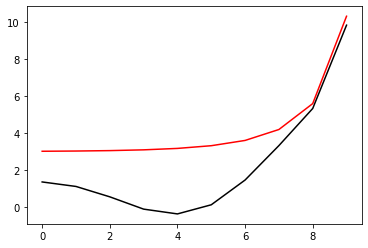

8100 72.03009452598826 -0.07483859283940464 -6.452906376140189
[ 1.35244572  1.11335005  0.55984304 -0.10006145 -0.36125257  0.12758244
  1.46046977  3.31743915  5.3198984   9.8156844 ]


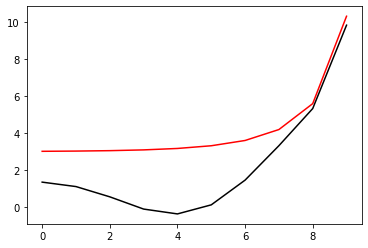

8200 72.02972752566626 -0.07525491577850753 -6.446164031621635
[ 1.34585123  1.11028968  0.56325209 -0.09335373 -0.35736592  0.12769138
  1.45834952  3.31510207  5.31808589  9.81546856]


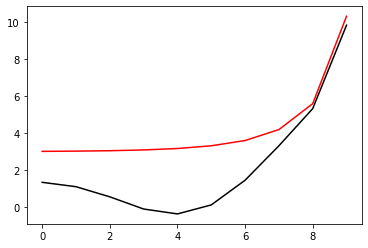

8300 72.02936881272934 -0.07566525340729265 -6.439499671855283
[ 1.33935655  1.10724455  0.56656903 -0.08671081 -0.35347144  0.12782163
  1.45625099  3.31278684  5.31629612  9.81525265]


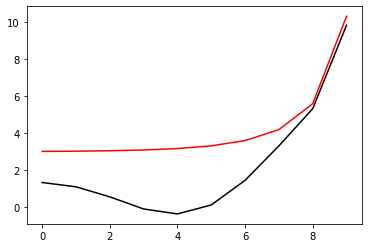

8400 72.02901809101049 -0.0760697779755525 -6.432910840440758
[ 1.33295949  1.10421548  0.56979674 -0.08013203 -0.34956927  0.1279732
  1.45417397  3.3104931   5.31452865  9.81503667]


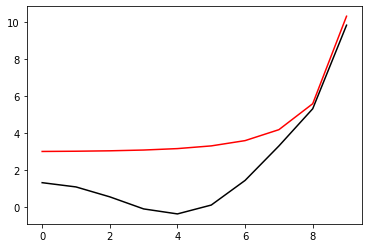

8500 72.02867507749707 -0.07646865395523064 -6.426395161584727
[ 1.32665794  1.1012032   0.57293805 -0.07361671 -0.34565956  0.12814609
  1.45211829  3.30822049  5.31278303  9.8148206 ]


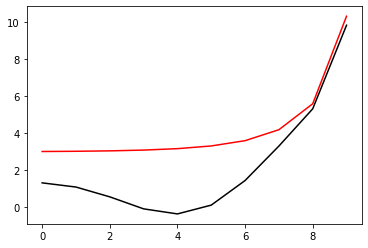

8600 72.02833950154023 -0.0768620383762187 -6.419950334980911
[ 1.32044985  1.0982084   0.57599569 -0.06716416 -0.34174247  0.12834034
  1.45008378  3.3059687   5.31105886  9.81460447]


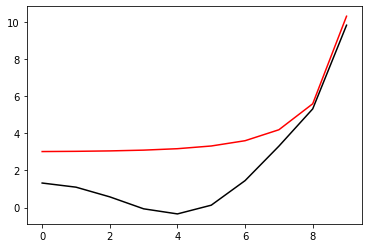

8700 72.02801110411593 -0.07725008112845262 -6.413574130936768
[ 1.31433327  1.09523172  0.57897232 -0.06077368 -0.33781813  0.12855597
  1.4480703   3.30373739  5.30935572  9.81438827]


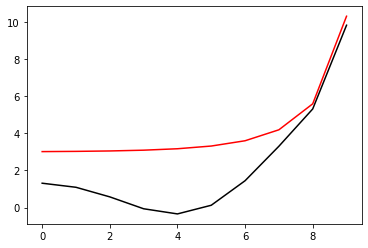

8800 72.0276896371341 -0.07763292523155237 -6.4072643857207385
[ 1.3083063   1.09227377  0.58187053 -0.05444457 -0.33388667  0.128793
  1.4460777   3.30152628  5.30767325  9.81417199]


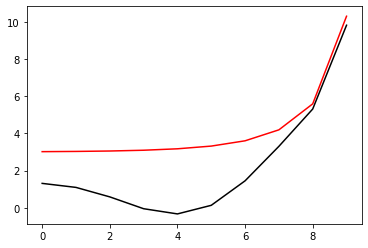

8900 72.02737486279082 -0.07801070707291966 -6.4010189971048765
[ 1.30236711  1.0893351   0.58469285 -0.04817611 -0.32994824  0.12905147
  1.44410587  3.29933509  5.30601108  9.81395564]


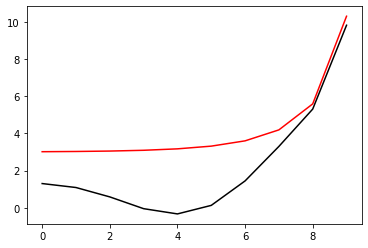

9000 72.02706655296033 -0.0783835566148297 -6.394835920079149
[ 1.29651394  1.08641623  0.58744173 -0.04196758 -0.32600296  0.12933143
  1.4421547   3.29716357  5.30436886  9.81373923]


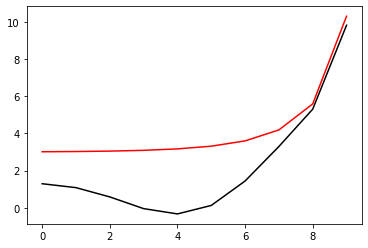

9100 72.02676448862309 -0.07875159757070922 -6.388713162714123
[ 1.29074511  1.08351764  0.59011955 -0.03581823 -0.32205093  0.12963294
  1.44022409  3.29501145  5.30274628  9.81352274]


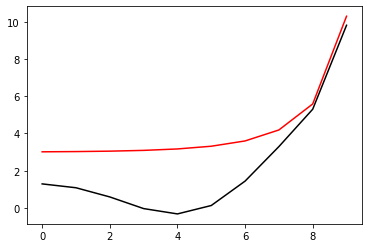

9200 72.02646845932699 -0.07911494755038928 -6.382648782149526
[ 1.28505897  1.08063978  0.59272865 -0.02972731 -0.31809226  0.12995604
  1.43831396  3.29287853  5.30114303  9.81330619]


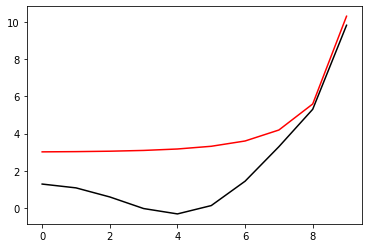

9300 72.0261782626776 -0.07947371817372387 -6.376640880686309
[ 1.27945395  1.07778309  0.59527129 -0.02369406 -0.31412705  0.13030081
  1.43642424  3.29076458  5.29955881  9.81308958]


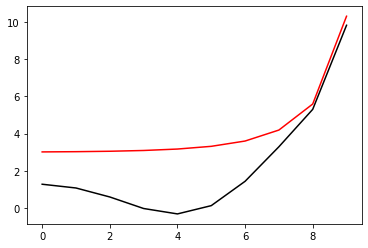

9400 72.02589370385631 -0.07982801515150299 -6.370687601959889
[ 1.27392854  1.07494798  0.5977497  -0.0177177  -0.31015537  0.13066734
  1.4345549   3.28866942  5.29799335  9.8128729 ]


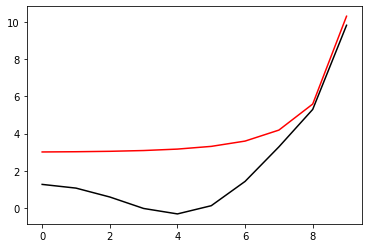

9500 72.02561459516225 -0.08017793833208844 -6.364787127171891
[ 1.26848127  1.07213481  0.60016603 -0.01179745 -0.3061773   0.1310557
  1.43270589  3.28659286  5.2964464   9.81265615]


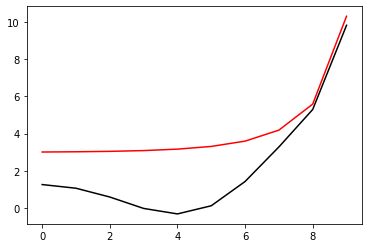

9600 72.02534075557587 -0.08052358171162723 -6.358937671357159
[ 1.26311074e+00  1.06934396e+00  6.02522389e-01 -5.93250474e-03
 -3.02192876e-01  1.31466021e-01  1.43087720e+00  3.28453475e+00
  5.29491771e+00  9.81243934e+00]


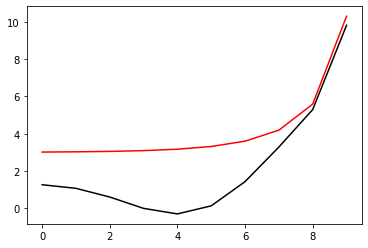

9700 72.02507201034204 -0.08086503340503191 -6.353137479661775
[ 1.25781560e+00  1.06657577e+00  6.04820850e-01 -1.22047547e-04
 -2.98202149e-01  1.31898401e-01  1.42906882e+00  3.28249495e+00
  5.29340705e+00  9.81222247e+00]


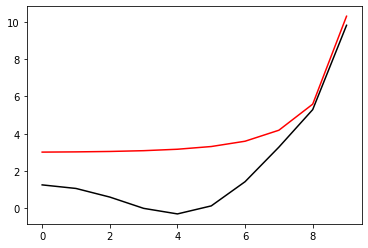

9800 72.02480819056989 -0.08120237557415025 -6.3473848236065
[ 1.25259455e+00  1.06383058e+00  6.07063430e-01  5.63475201e-03
 -2.94205133e-01  1.32352976e-01  1.42728077e+00  3.28047333e+00
  5.29191422e+00  9.81200554e+00]


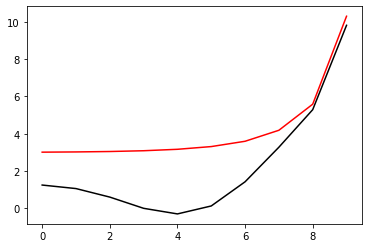

9900 72.0245491328468 -0.08153568430863414 -6.341677997308175
[ 1.24744634  1.06110872  0.60925211  0.01133874 -0.29020183  0.13282989
  1.42551308  3.27846977  5.29043903  9.81178854]


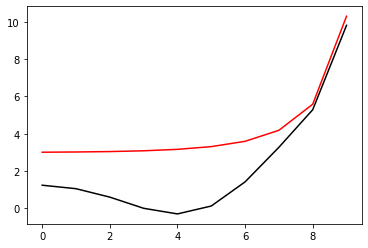

10000 72.02429467886513 -0.08186502945392496 -6.336015313629356
[ 1.24236978  1.05841048  0.61138882  0.01699078 -0.28619222  0.13332931
  1.42376581  3.2764842   5.2889813   9.81157149]


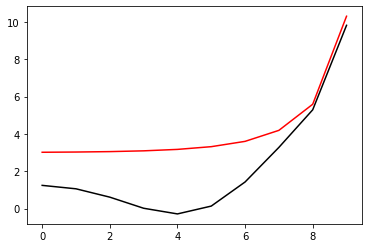

In [94]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 72.02404467505798 -0.0821904743794659 -6.330395100223325
[ 1.23736371  1.05573619  0.61347546  0.02259176 -0.28217626  0.13385141
  1.42203903  3.27451654  5.28754087  9.81135437]


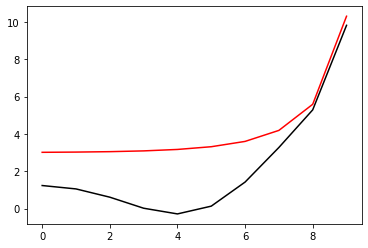

200 72.02379897224264 -0.08251207567865156 -6.324815695438074
[ 1.23242705  1.05308615  0.61551392  0.02814257 -0.27815389  0.1343964
  1.42033282  3.27256673  5.28611759  9.8111372 ]


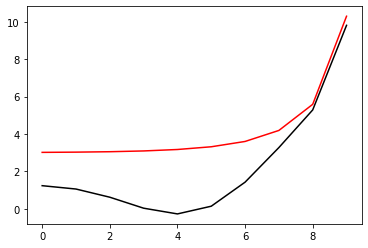

300 72.0235574252682 -0.0828298827900772 -6.319275444038074
[ 1.22755874  1.05046066  0.61750601  0.03364414 -0.27412501  0.13496449
  1.41864731  3.27063474  5.28471135  9.81091997]


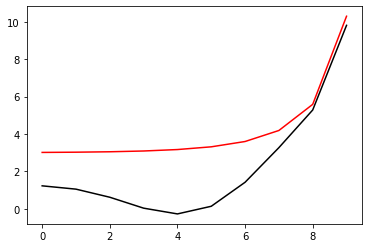

400 72.02331989266513 -0.08314393752723523 -6.313772692696983
[ 1.22275779  1.04786003  0.61945357  0.0390974  -0.27008951  0.13555593
  1.41698262  3.26872057  5.28332203  9.81070269]


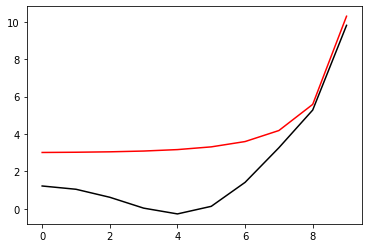

500 72.02308623629364 -0.08345427350080817 -6.308305785207389
[ 1.21802324  1.04528457  0.62135836  0.04450334 -0.26604723  0.13617099
  1.41533893  3.2668242   5.28194954  9.81048534]


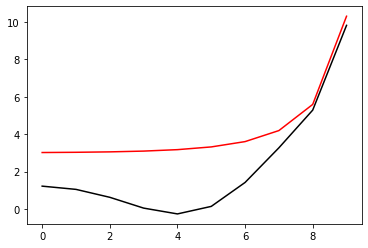

600 72.02285632098716 -0.08376091541396599 -6.302873057344823
[ 1.21335419  1.04273459  0.62322217  0.04986294 -0.261998    0.13680996
  1.41371641  3.26494569  5.28059382  9.81026795]


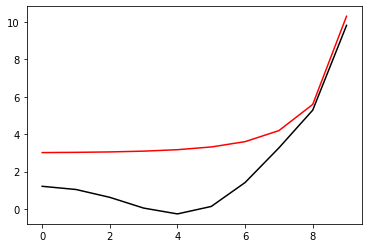

700 72.02263001418706 -0.08406387820631854 -6.297472831312601
[ 1.20874979  1.04021042  0.62504675  0.05517723 -0.25794159  0.13747318
  1.41211529  3.26308508  5.27925481  9.8100505 ]


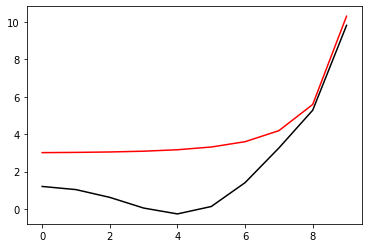

800 72.02240718556482 -0.08436316601618887 -6.292103409680378
[ 1.20420924  1.0377124   0.62683382  0.06044727 -0.25387774  0.13816101
  1.41053581  3.26124246  5.27793249  9.80983299]


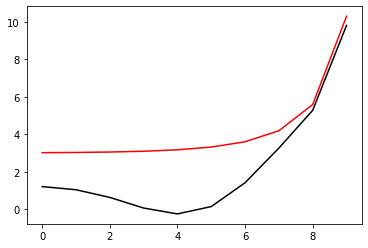

900 72.0221877066254 -0.08465877092315531 -6.286763068712593
[ 1.19973179  1.03524088  0.62858514  0.06567413 -0.24980616  0.13887385
  1.40897825  3.25941792  5.27662683  9.80961543]


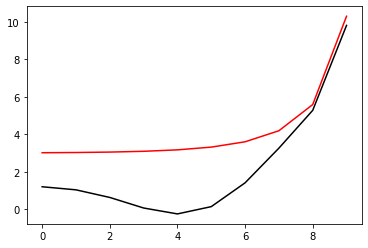

1000 72.02197145028704 -0.08495067142288908 -6.281450050961916
[ 1.19531674  1.03279625  0.63030242  0.07085897 -0.24572649  0.13961213
  1.40744293  3.25761162  5.27533787  9.80939783]


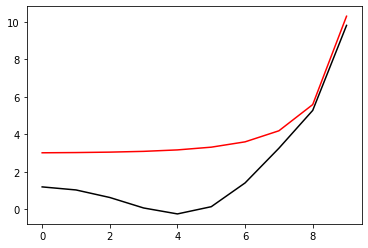

1100 72.02175829042855 -0.0852388305733793 -6.276162556975876
[ 1.19096346  1.0303789   0.6319874   0.07600294 -0.24163832  0.14037635
  1.40593021  3.25582371  5.27406563  9.80918017]


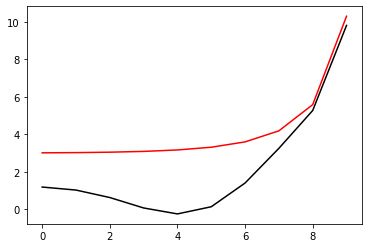

1200 72.02154810139658 -0.08552319373471301 -6.270898735931323
[ 1.18667135  1.02798926  0.63364181  0.08110728 -0.23754121  0.14116705
  1.40444049  3.2540544   5.27281019  9.80896246]


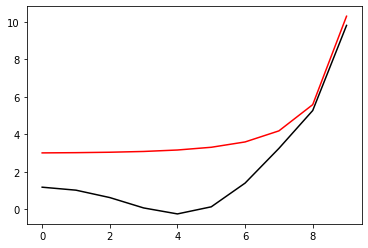

1300 72.02134075746106 -0.0858036858020888 -6.265656674967638
[ 1.18243989  1.0256278   0.63526741  0.08617325 -0.23343461  0.14198481
  1.40297422  3.25230394  5.27157163  9.8087447 ]


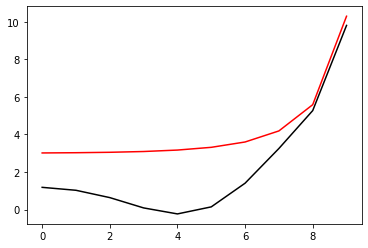

1400 72.02113613220524 -0.08608020780172253 -6.260434386933871
[ 1.17826863  1.02329502  0.63686598  0.09120221 -0.22931794  0.1428303
  1.40153191  3.2505726   5.27035009  9.80852689]


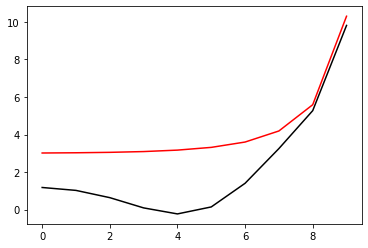

1500 72.02093409783316 -0.08635263267870785 -6.255229796191641
[ 1.17415717  1.02099147  0.63843933  0.09619556 -0.2251905   0.14370426
  1.40011411  3.24886072  5.26914573  9.80830903]


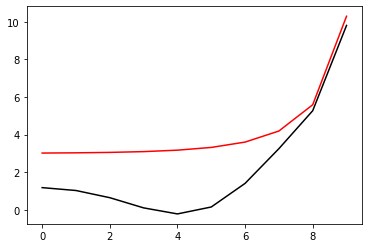

1600 72.02073452437236 -0.0866208000503601 -6.250040722019877
[ 1.17010518  1.01871775  0.6399893   0.1011548  -0.22105151  0.1446075
  1.39872148  3.24716868  5.26795875  9.80809113]


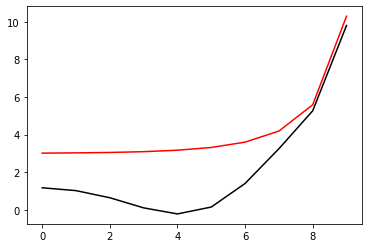

1700 72.02053727874386 -0.08688450962173881 -6.244864859039435
[ 1.16611245  1.01647454  0.6415178   0.1060815  -0.21690011  0.14554093
  1.39735472  3.24549692  5.2667894   9.80787318]


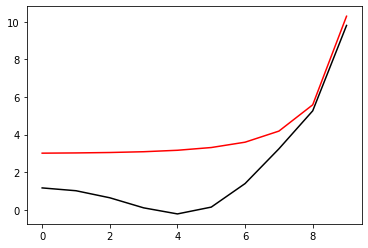

1800 72.02034222366154 -0.08714351285225407 -6.2396997539035715
[ 1.1621788   1.01426258  0.64302679  0.11097736 -0.21273527  0.14650558
  1.39601464  3.24384595  5.26563796  9.80765519]


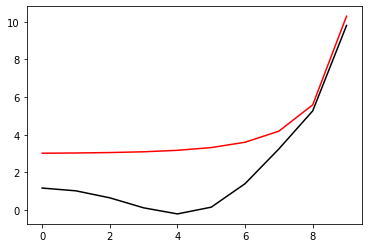

1900 72.02014921631238 -0.08739750230884075 -6.234542777265833
[ 1.1583042   1.0120827   0.64451832  0.11584419 -0.20855587  0.14750259
  1.39470214  3.24221634  5.26450478  9.80743715]


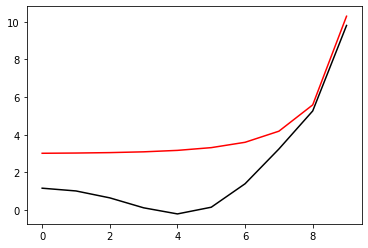

2000 72.01995810675139 -0.08764609791937046 -6.22939108971225
[ 1.1544887   1.00993585  0.64599455  0.12068396 -0.20436058  0.14853327
  1.39341825  3.24060878  5.26339028  9.80721906]


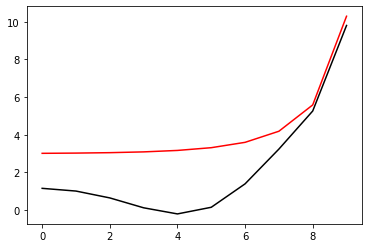

2100 72.01976873592155 -0.08788882901360534 -6.224241599889111
[ 1.15073248  1.00782307  0.64745775  0.12549879 -0.20014792  0.14959908
  1.39216414  3.23902404  5.26229493  9.80700094]


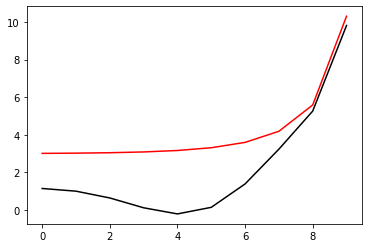

2200 72.01958093317374 -0.08812511054952385 -6.219090912406154
[ 1.14703587  1.00574559  0.64891036  0.13029103 -0.19591617  0.15070169
  1.39094114  3.23746301  5.26121932  9.80678277]


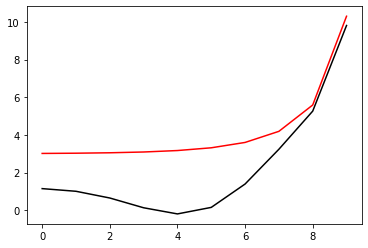

2300 72.01939451311243 -0.08835421117299125 -6.21393526214629
[ 1.14339937  1.0037048   0.650355    0.13506325 -0.19166333  0.15184303
  1.38975077  3.23592672  5.2601641   9.80656457]


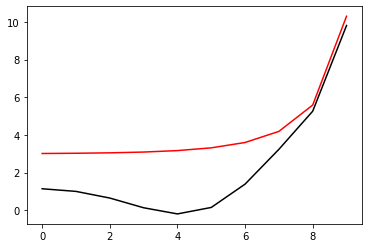

2400 72.01920927151254 -0.08857520958238621 -6.208770430201085
[ 1.13982369  1.00170229  0.65179454  0.13981834 -0.18738709  0.1530253
  1.38859479  3.23441639  5.25913007  9.80634632]


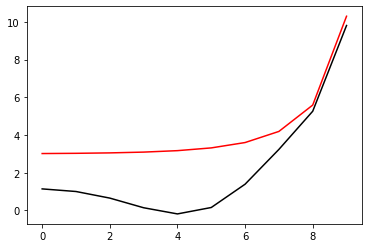

2500 72.01902497993768 -0.08878693377461395 -6.2035916344993725
[ 1.13630976  0.99973996  0.65323214  0.14455954 -0.18308474  0.1542511
  1.38747527  3.23293341  5.25811817  9.80612803]


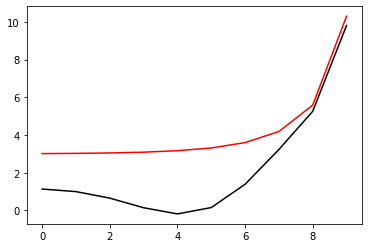

2600 72.01884137849692 -0.08898787460238962 -6.1983933848262645
[ 1.13285882  0.99782001  0.65467136  0.14929055 -0.17875307  0.15552345
  1.3863946   3.23147947  5.25712951  9.80590971]


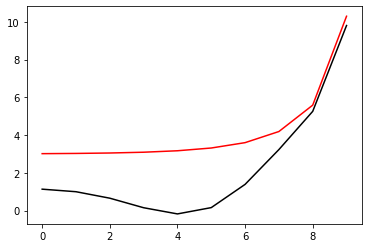

2700 72.01865816586668 -0.08917605966592008 -6.193169286486515
[ 1.12947248  0.99594508  0.65611623  0.15401567 -0.17438827  0.15684595
  1.38535564  3.23005655  5.25616543  9.80569135]


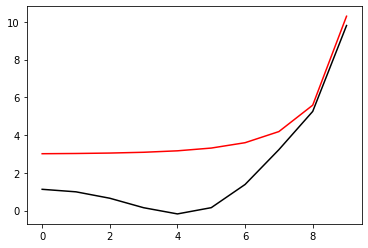

2800 72.01847498517331 -0.08934886389711422 -6.187911767754402
[ 1.12615282  0.99411838  0.65757142  0.15873992 -0.16998572  0.15822292
  1.38436184  3.22866705  5.25522756  9.80547296]


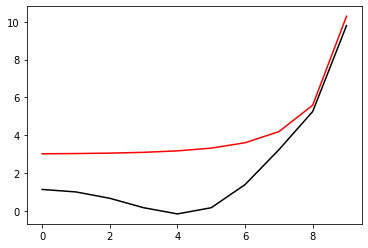

2900 72.01829140338137 -0.08950271510276347 -6.182611690353425
[ 1.12290255  0.99234382  0.65904248  0.16346932 -0.16553975  0.15965967
  1.38341736  3.22731391  5.25431789  9.80525453]


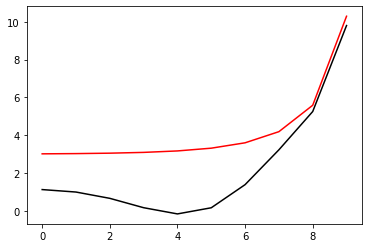

3000 72.01810688005666 -0.08963261697470212 -6.177257773071046
[ 1.11972521  0.99062634  0.6605361   0.16821125 -0.16104326  0.16116278
  1.38252744  3.22600079  5.25343893  9.80503607]


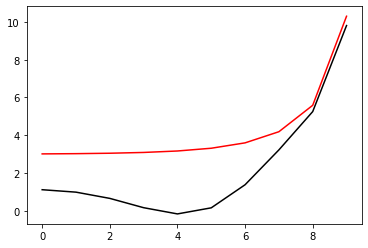

3100 72.01792071781564 -0.08973133662799493 -6.171835701969783
[ 1.11662551  0.98897228  0.66206064  0.17297497 -0.15648716  0.16274068
  1.3816987   3.22473235  5.25259387  9.80481758]


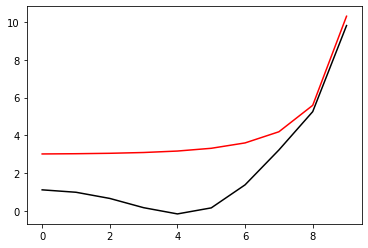

3200 72.01773197910134 -0.08978793127938535 -6.166326682286421
[ 1.11360988  0.98739004  0.66362689  0.17777251 -0.15185944  0.16440445
  1.38093986  3.22351472  5.25178689  9.80459906]


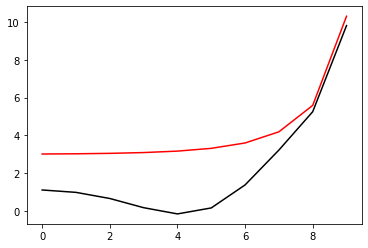

3300 72.01753933564825 -0.08978485275999434 -6.160704916203285
[ 1.11068742  0.98589125  0.66524944  0.18262022 -0.1471436   0.16616928
  1.38026282  3.22235626  5.25102372  9.80438051]


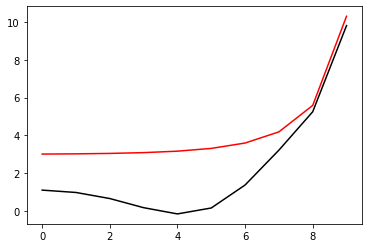

3400 72.01734076741981 -0.08969161212061418 -6.154932792646097
[ 1.1078717   0.98449299  0.66694926  0.18754165 -0.14231558  0.16805722
  1.37968478  3.22126903  5.2503126   9.80416194]


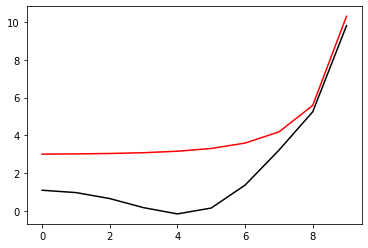

3500 72.01713286643265 -0.08944865135481254 -6.1489504597654925
[ 1.10518468  0.98322249  0.66875928  0.19257381 -0.13733737  0.17010296
  1.37923273  3.22027188  5.24966636  9.80394334]


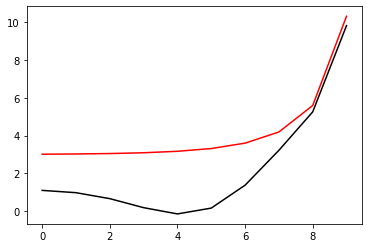

3600 72.01690880613558 -0.08891552707696192 -6.1426482974833005
[ 1.10266714  0.98212975  0.67073901  0.19778345 -0.13214008  0.17236905
  1.37895499  3.2193984   5.24910772  9.80372473]


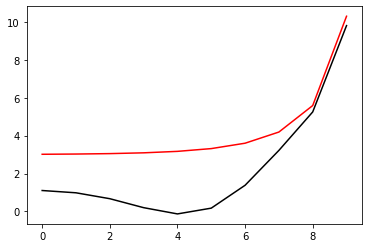

3700 72.01664902010909 -0.08761752300856936 -6.135763335151074
[ 1.10041823  0.9813349   0.67302926  0.20332772 -0.12656178  0.17500148
  1.37896346  3.2187257   5.24868832  9.8035061 ]


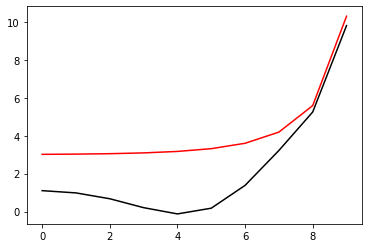

3800 72.01604588405748 -0.08029441036322571 -6.126769265617081
[ 1.099037    0.98154379  0.67643545  0.21009052 -0.11970256  0.17879915
  1.37986007  3.21866032  5.24867395  9.80328747]


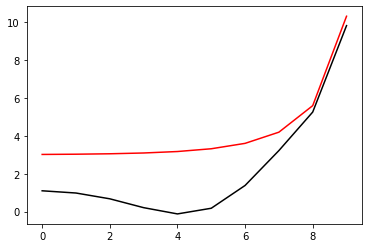

3900 72.0148518990733 -0.09632705210788406 -6.025501216808572
[ 1.11751447  1.00003976  0.69421692  0.2240553  -0.11739923  0.1625821
  1.34672948  3.17605265  5.20281395  9.80306747]


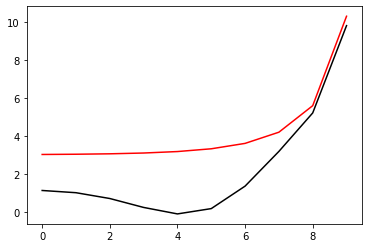

4000 72.00021826391644 -0.06929278205963302 -5.955015277350051
[ 1.12392739  1.00355484  0.69494612  0.22017165 -0.13133529  0.13497127
  1.3087788   3.13415725  5.16110258  9.80284639]


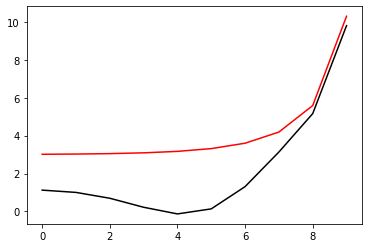

4100 72.01368817657246 -0.09994762625199684 -5.9164526996007645
[ 1.12869793  1.00922548  0.70248554  0.22905432 -0.12532504  0.13396603
  1.30114887  3.12322852  5.14926309  9.80262347]


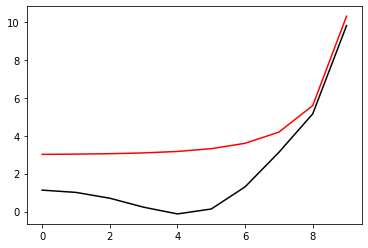

4200 72.01607827245235 -0.13431458502369664 -5.795524462223274
[ 1.14450565  1.02566428  0.71881626  0.24258034 -0.12169819  0.12120707
  1.27321163  3.08682043  5.11000525  9.8023993 ]


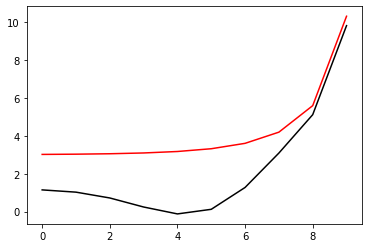

4300 72.01903650264092 -0.15244080176883984 -5.708713110772718
[ 1.15629265  1.03957185  0.73497398  0.25938656 -0.10998614  0.12185137
  1.26262793  3.06956229  5.09009919  9.80217409]


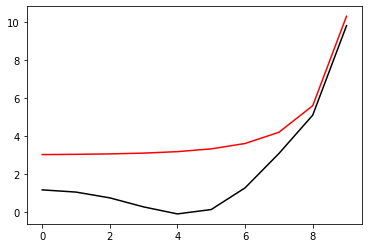

4400 72.01683456378726 -0.15785819802827883 -5.624102124476713
[ 1.174512    1.06171827  0.76166949  0.28957379 -0.08176908  0.14119253
  1.27093663  3.06999703  5.08630007  9.80194794]


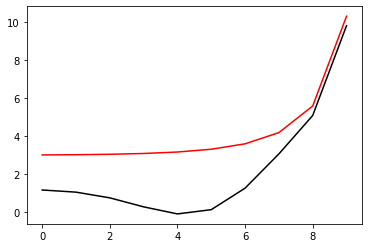

4500 71.16792485136251 -0.04413167562215892 -5.4064077361370835
[ 1.20831023  1.09980501  0.80287529  0.3303004  -0.05057971  0.15245634
  1.26014441  3.04396904  5.05270055  9.80172122]


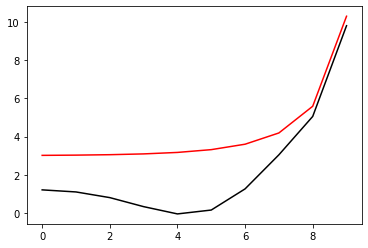

4600 71.07529576546139 -0.07649704368025521 -5.286996165933297
[ 1.23169034  1.12882299  0.83845367  0.37127786 -0.01007154  0.18419535
  1.2791863   3.05283626  5.05539098  9.80149339]


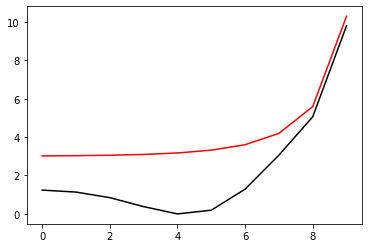

4700 71.0523853177231 -0.07647494485302272 -5.188443394055225
[1.23909484e+00 1.13884582e+00 8.52065278e-01 3.87381628e-01
 3.65358624e-03 1.89922209e-01 1.27594518e+00 3.04396423e+00
 5.04406113e+00 9.80126539e+00]


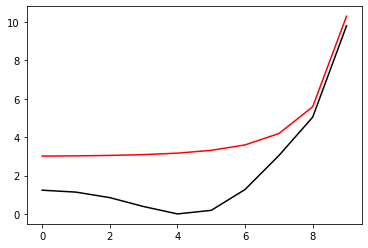

4800 72.01644817314467 -0.21239921549675378 -5.017502769196654
[ 1.27156311  1.14913107  0.8360334   0.33733649 -0.09228471  0.04361896
  1.0942501   2.84932136  4.85143464  9.80103254]


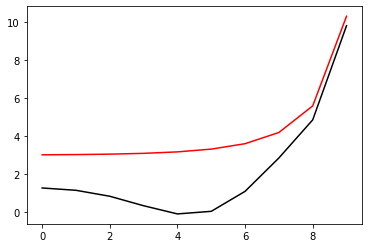

4900 72.01044071140522 -0.1930863051474495 -4.995823550343963
[ 1.28268304  1.16180412  0.85160083  0.35620209 -0.07313618  0.05873213
  1.10397698  2.85548427  4.8557824   9.80079504]


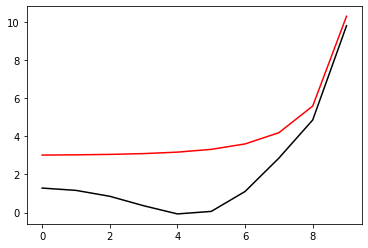

5000 72.0123079878469 -0.2071932987986969 -4.9518606992541
[ 1.29997101  1.17836996  0.86822879  0.37257082 -0.06086785  0.0623375
  1.09881215  2.84528308  4.84367591  9.80055768]


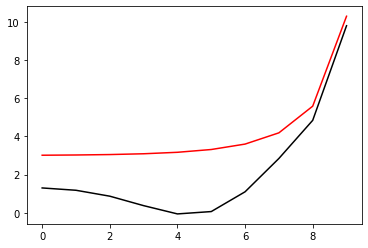

5100 72.01258356233453 -0.20051292059359718 -4.91359410633482
[ 1.32269796e+00  1.18879260e+00  8.65200078e-01  3.53360751e-01
 -1.02553244e-01 -5.19833850e-03  1.01272196e+00  2.75252817e+00
  4.75197338e+00  9.80031740e+00]


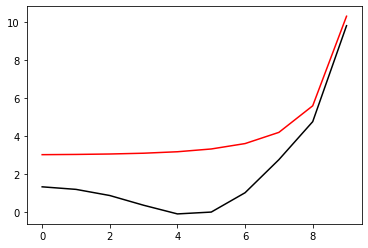

5200 72.01158817101273 -0.20167984525191654 -4.898115384228785
[ 1.32871029e+00  1.19727756e+00  8.76959439e-01  3.68809239e-01
 -8.62018756e-02  7.89547234e-03  1.02115779e+00  2.75794358e+00
  4.75592887e+00  9.80007518e+00]


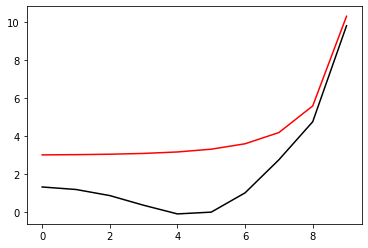

5300 71.96898537946674 -0.19124505596161773 -4.830869308406705
[ 1.37999613  1.24947098  0.9309567   0.42497304 -0.03181601  0.05319687
  1.05313936  2.77876216  4.76955721  9.79983349]


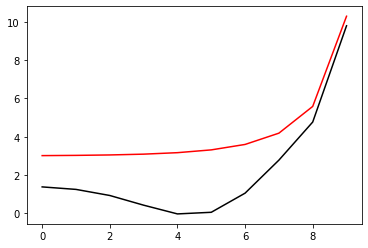

5400 71.94429999319594 -0.1875592626841985 -4.819030220243793
[ 1.41048171  1.27313049  0.94789782  0.43474442 -0.03290932  0.03774867
  1.02586715  2.7460384   4.73587147  9.79959124]


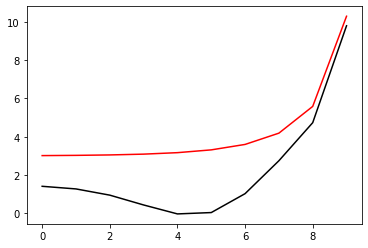

5500 70.35444602806469 -0.06665990184107148 -4.775012307393878
[ 1.48520395  1.33622927  0.99921686  0.47369749 -0.01120762  0.03631133
  1.00276997  2.70972619  4.69389901  9.79934693]


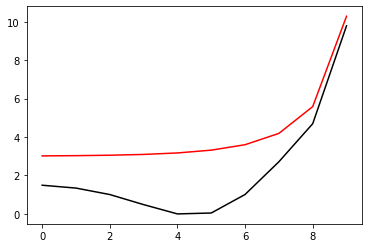

5600 72.00036644453802 -0.21581695955695976 -4.785484756383843
[ 1.51502025e+00  1.35486503e+00  1.00586529e+00  4.67734291e-01
 -3.32793800e-02 -3.92755456e-03  9.49772540e-01  2.65259857e+00
  4.63782943e+00  9.79909997e+00]


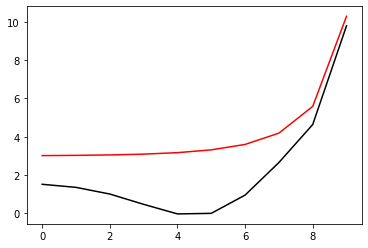

5700 71.21315362428173 -0.04632365671459915 -4.7715944219953395
[ 1.57310448e+00  1.40322389e+00  1.04376711e+00  4.95129230e-01
 -1.99300118e-02 -8.81925463e-03  9.28635413e-01  2.62239567e+00
  4.60433269e+00  9.79885097e+00]


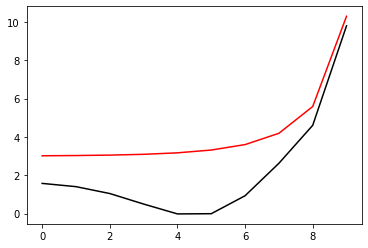

5800 72.00159096036272 -0.21718053858988948 -4.8129916515424
[ 1.62593101  1.43895731  1.06107029  0.49372166 -0.04288636 -0.05418749
  0.86832945  2.55764211  4.54110092  9.7986005 ]


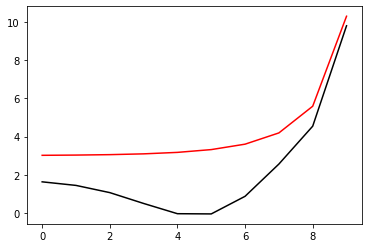

5900 72.0160543171012 -0.24881304613316227 -4.836798369548168
[ 1.67098633  1.47554591  1.08779151  0.51087521 -0.03773326 -0.06368488
  0.84695332  2.53078135  4.51309824  9.79834771]


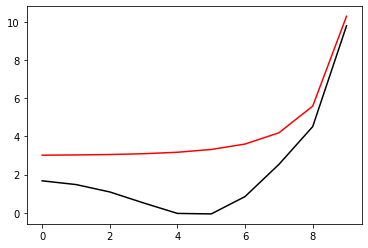

6000 72.01748548854795 -0.2555125492036133 -4.847598221233714
[ 1.68876185  1.49084136  1.09882042  0.51766505 -0.03754358 -0.072803
  0.83023076  2.51107334  4.49335476  9.79809354]


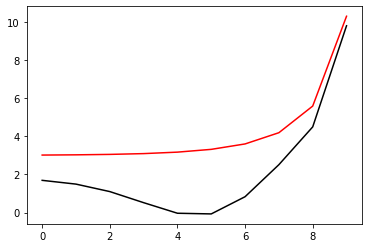

6100 77.2645607467667 -0.5312575086739337 -4.874363583613809
[ 1.70437857  1.50483855  1.10968193  0.52575858 -0.0339545  -0.07602493
  0.82143224  2.50029441  4.48270111  9.79783894]


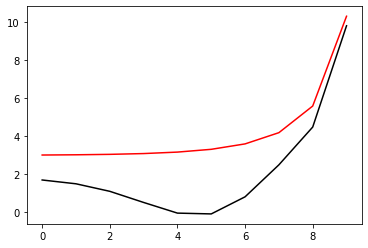

6200 70.3420564063399 -0.07318892006118623 -4.863420827404632
[ 1.75812732e+00  1.55394909e+00  1.15269410e+00  5.62893815e-01
 -5.47220166e-03 -6.09299165e-02  8.22622134e-01  2.49239159e+00
  4.47040698e+00  9.79758315e+00]


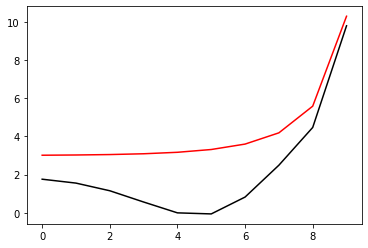

6300 70.28633237325784 -0.07752104940833321 -4.898808034186957
[ 1.81008470e+00  1.59471979e+00  1.18055064e+00  5.78112920e-01
 -4.62259615e-03 -7.59010928e-02  7.96048907e-01  2.46144716e+00
  4.43941638e+00  9.79732686e+00]


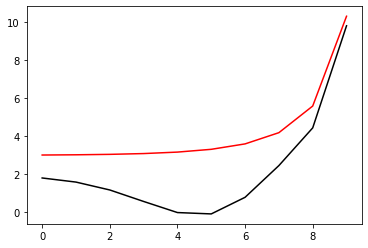

6400 72.01798202340949 -0.256002459222932 -4.92462012229283
[ 1.82738194  1.60550346  1.18219752  0.57007014 -0.02462719 -0.10917092
  0.75426522  2.41823302  4.39842971  9.79706885]


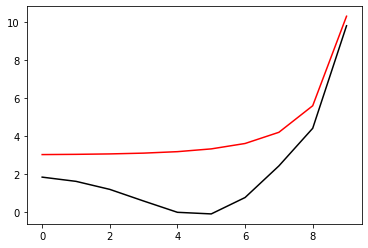

6500 72.0191081510931 -0.2623311255762641 -4.919881707474335
[ 1.854945    1.62869053  1.19834953  0.57847754 -0.02684085 -0.12519903
  0.72676138  2.38560743  4.36510702  9.79680935]


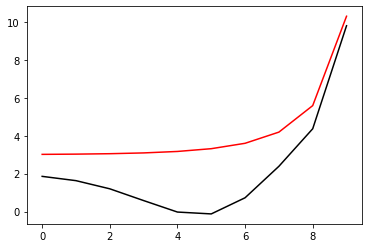

6600 71.61243677787027 -0.17733484221526574 -4.914713069381778
[ 1.86152424  1.63771874  1.20744309  0.58743928 -0.01991203 -0.1233051
  0.72360241  2.38018851  4.35938731  9.79654862]


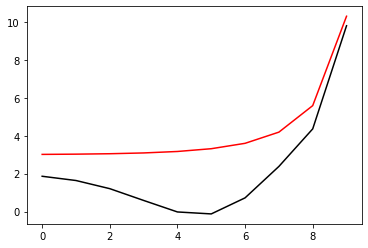

6700 71.83116093790082 -0.19967995108386424 -4.912072885202314
[ 1.88225388e+00  1.66099992e+00  1.23137411e+00  6.12058756e-01
  3.46114103e-03 -1.05272020e-01  7.34453175e-01  2.38588682e+00
  4.36230365e+00  9.79628756e+00]


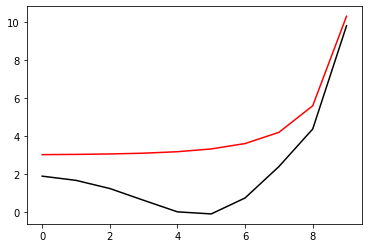

6800 71.98883499726333 -0.22886181631661862 -4.928711835190313
[ 1.90700839  1.68375928  1.25043552  0.62753481  0.01396816 -0.10213698
  0.73097091  2.37934089  4.35506293  9.79602656]


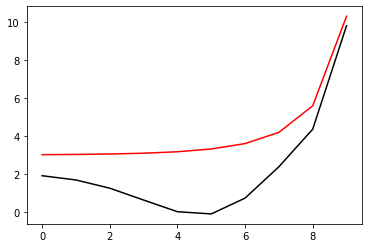

6900 72.01940022367714 -0.27113135514670517 -4.943535932107583
[ 1.93339555  1.7047735   1.26408795  0.63353232  0.01080008 -0.11593334
  0.70964019  2.35599301  4.33268129  9.7957651 ]


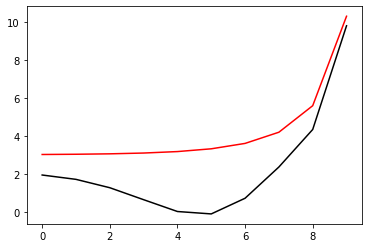

7000 72.0151800071665 -0.25829029519150465 -4.952282687717565
[ 1.94528334  1.7191836   1.27928342  0.64952713  0.02623701 -0.10403809
  0.71703534  2.36072323  4.33629559  9.79550303]


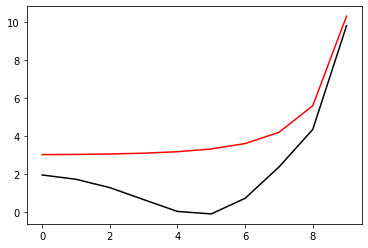

7100 76.7435501583765 -0.5397202691773202 -4.977521878968174
[ 1.95510121e+00  1.72445673e+00  1.27782897e+00  6.40774290e-01
  8.85747339e-03 -1.30599832e-01  6.85530115e-01  2.32994352e+00
  4.30854116e+00  9.79524033e+00]


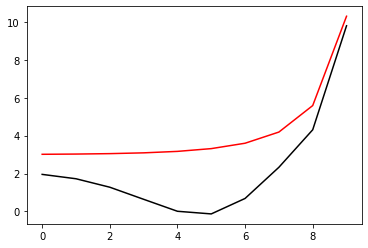

7200 70.3095086788727 -0.119307933849902 -4.951888654948269
[ 2.00262589  1.76724294  1.31386599  0.66935611  0.02734983 -0.12638415
  0.67578092  2.31183157  4.28703977  9.7949761 ]


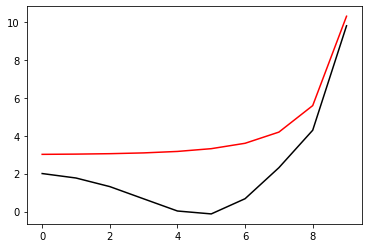

7300 72.01542464273903 -0.2538168406281085 -4.972548326908146
[ 2.01263038  1.77426577  1.31551385  0.66466579  0.01439837 -0.14924974
  0.64620353  2.28119933  4.2582904   9.79471139]


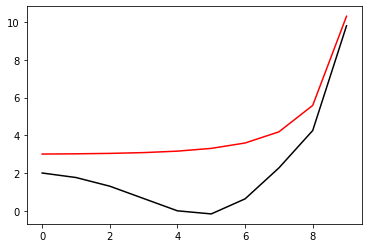

7400 73.1942531054854 -0.03582494545675946 -4.957503485107312
[ 2.05348973  1.80868202  1.34129711  0.68093371  0.01881916 -0.15962724
  0.62322656  2.25217464  4.22792165  9.79444475]


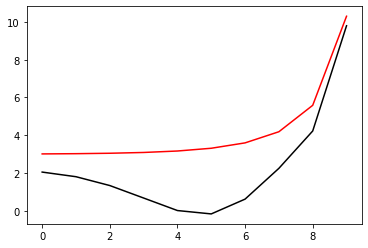

7500 72.01736275289939 -0.2604709007650755 -4.979812195180226
[ 2.06435559  1.81906835  1.3488998   0.68504676  0.01783985 -0.16785366
  0.609166    2.23633797  4.21267746  9.79417735]


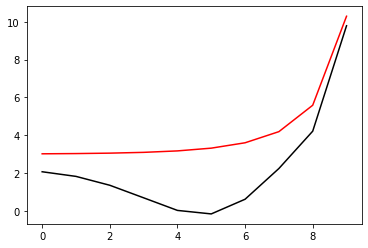

7600 72.02186998656568 -0.28360512656688086 -5.000111434225247
[ 2.07699599  1.83319522  1.36250884  0.69767578  0.02813703 -0.1624793
  0.60948815  2.23427612  4.21012978  9.79390941]


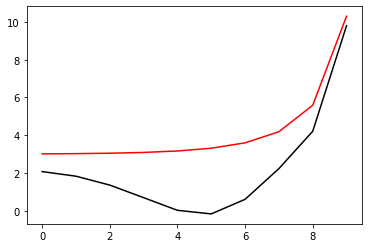

7700 72.0212817277126 -0.2833820351581156 -5.0103593156162365
[ 2.08769732  1.84675619  1.37721413  0.71322501  0.04341628 -0.15018247
  0.61777512  2.24020948  4.21510427  9.79364147]


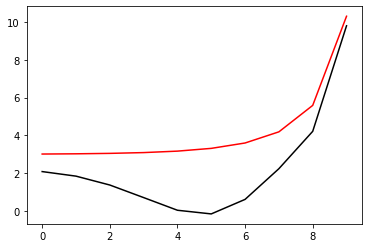

7800 70.29769305129979 -0.08544726975035667 -5.011137848869687
[ 2.11409292  1.86864699  1.39268022  0.72123782  0.04201167 -0.16330721
  0.5952553   2.21409642  4.18910394  9.79337309]


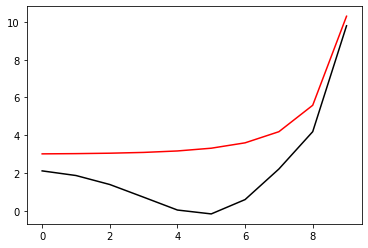

7900 72.02887589802218 -0.05130729239464708 -5.009004462631048
[ 2.13953284  1.8925123   1.41306191  0.73720539  0.05156788 -0.163362
  0.58592689  2.199824    4.17332801  9.79310359]


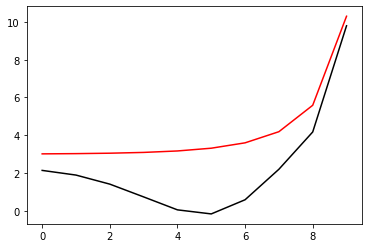

8000 72.01024074597939 -0.2527097489889059 -5.028248688049175
[ 2.14684155  1.89977114  1.4180667   0.7388091   0.04790269 -0.17468243
  0.5682947   2.18019453  4.15434792  9.79283305]


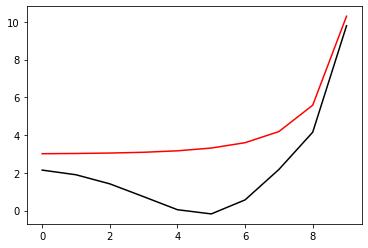

8100 72.01386632698225 -0.2552138154081821 -5.022416067105898
[ 2.17639323  1.92281678  1.43230243  0.74250732  0.0382693  -0.20043926
  0.52968806  2.13649119  4.11069264  9.79256149]


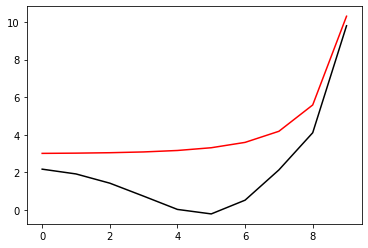

8200 72.01903668285068 -0.2680788087443396 -5.045973613844127
[ 2.19569611  1.9402193   1.44608295  0.7523254   0.04354328 -0.20082553
  0.52514898  2.13118741  4.10620263  9.79228884]


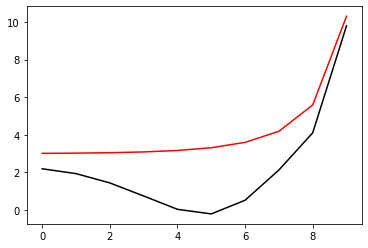

8300 70.75050543741567 -0.15580573895287506 -5.048264862481572
[ 2.21609917  1.9621245   1.46770599  0.77290436  0.0614618  -0.18897286
  0.52966995  2.13095045  4.10381286  9.79201572]


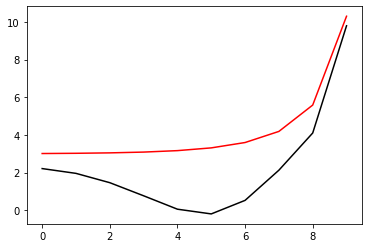

8400 71.74310665118385 -0.21045002796513587 -5.0422997995670436
[ 2.2262415   1.9728446   1.47680304  0.7788316   0.06182388 -0.1974966
  0.51271772  2.11003393  4.08233242  9.79174215]


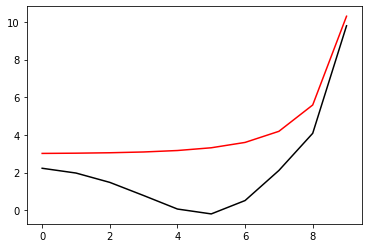

8500 72.0183530106451 -0.2680036273365743 -5.043148353695845
[ 2.24086615  1.98479169  1.48388006  0.77935813  0.05346097 -0.21724458
  0.48391015  2.078176    4.05121171  9.79146746]


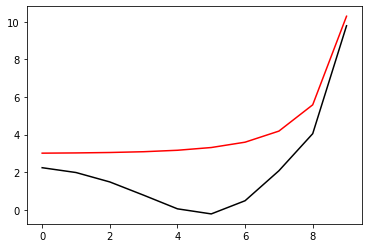

8600 72.01995162643313 -0.27377922031852336 -5.066375829152158
[ 2.24915034  1.99455854  1.49342234  0.787949    0.06021519 -0.21402021
  0.48399384  2.07760504  4.0512871   9.79119187]


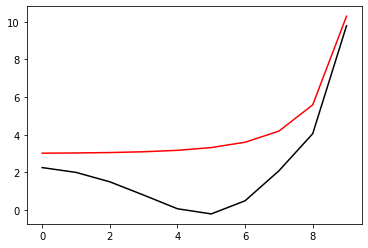

8700 72.02479283759364 -0.30094683193052 -5.0675209406114226
[ 2.25487061  2.00191737  1.50056565  0.79350477  0.06229187 -0.21821052
  0.4737549   2.06483806  4.03850237  9.79091627]


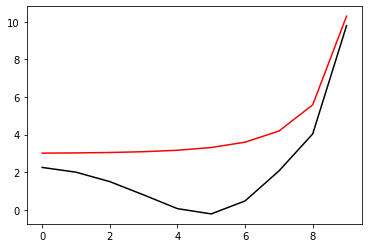

8800 72.02220382971764 -0.28635011122784915 -5.0903586945019255
[ 2.26313822  2.01162859  1.51047798  0.80302737  0.07078634 -0.21225074
  0.4773438   2.06807924  4.04235471  9.79064024]


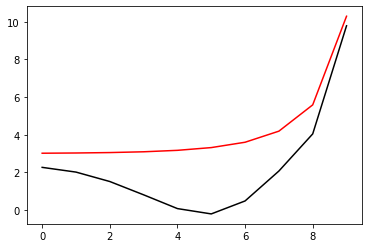

8900 72.02197517201263 -0.27878886499125555 -5.09641046654534
[ 2.2704019   2.01626732  1.51068892  0.79712211  0.05681658 -0.23589543
  0.4471071   2.03711247  4.01367833  9.79036379]


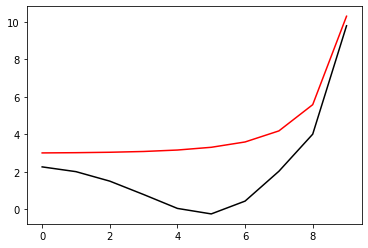

9000 70.35052228990229 -0.09293372045204747 -5.042930536882679
[ 2.29791559  2.0468151   1.54296334  0.82959819  0.08634608 -0.21565265
  0.45372156  2.03261153  4.0028023   9.79008613]


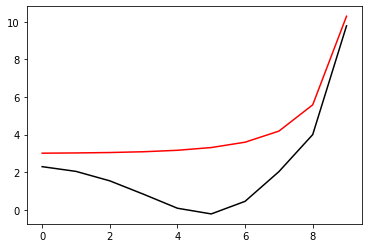

9100 72.02205229913612 -0.2881641047076347 -5.086209405787283
[ 2.32530256  2.06837783  1.55771599  0.83686226  0.08536306 -0.22567734
  0.43738548  2.01496138  3.98628663  9.78980804]


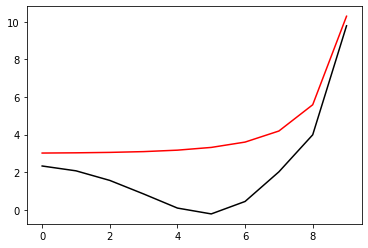

9200 71.66915015693391 -0.21352567032333794 -5.088021800838399
[ 2.33829302  2.08251324  1.57169792  0.84969958  0.0956643  -0.22051604
  0.43689014  2.0114843   3.98198746  9.78952953]


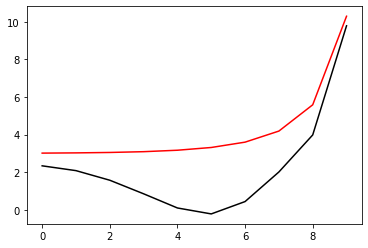

9300 73.54238716398052 -0.431774049568431 -5.108681854739605
[ 2.35256194  2.09388482  1.5785666   0.85072167  0.08929565 -0.23583752
  0.41496524  1.98811499  3.95996104  9.78925033]


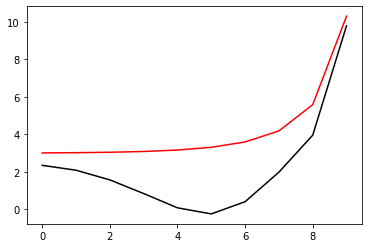

9400 72.01473697000758 -0.271457544644557 -5.093169468451752
[ 2.37920539  2.11896713  1.60078759  0.86872171  0.10085507 -0.23438558
  0.40574969  1.97251195  3.94195392  9.78897056]


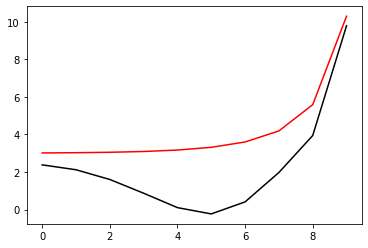

9500 72.00568367971202 -0.2604455045233532 -5.125634304214238
[ 2.38835797  2.12806788  1.60863387  0.87463985  0.10438118 -0.23403945
  0.40410878  1.97155052  3.94258549  9.78868998]


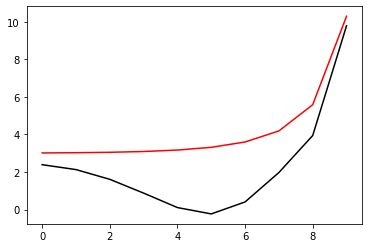

9600 72.01265120199128 -0.2655581480030815 -5.087551939304915
[ 2.3867495   2.12819932  1.60827917  0.87137337  0.09500769 -0.25332671
  0.37549706  1.93892558  3.9100211   9.78840821]


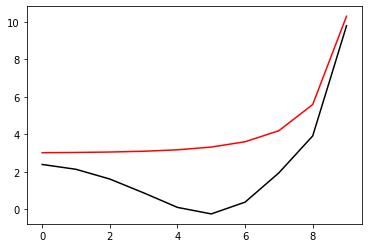

9700 72.0226586020256 -0.28762434786940666 -5.059508201092175
[ 2.38472248  2.12675915  1.60542371  0.86487369  0.08212982 -0.27551038
  0.34550387  1.90655646  3.87881716  9.78812527]


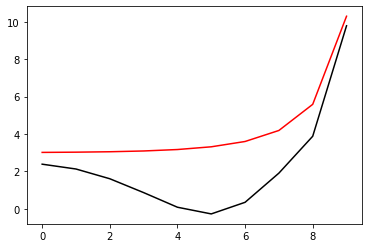

9800 70.06525159189779 -0.13016602204965558 -5.016097102972197
[ 2.38832389  2.12677706  1.59970583  0.8507335   0.05627263 -0.31577633
  0.29454023  1.85305771  3.82764179  9.78784062]


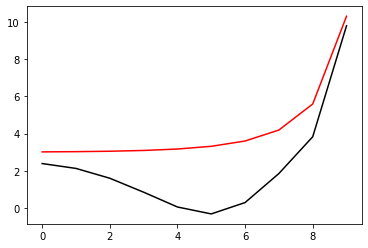

9900 72.02523599802699 -0.3005067048606443 -5.041650031197578
[ 2.38360715  2.12410442  1.59762679  0.84809501  0.05221741 -0.32213027
  0.28726815  1.84763385  3.82482668  9.78755426]


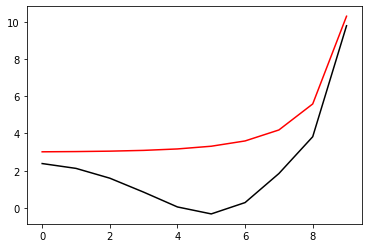

10000 72.0234582446096 -0.28318963852151197 -5.050368335730059
[ 2.38207545  2.12654981  1.60288318  0.85495856  0.05939186 -0.31691866
  0.28972567  1.84910446  3.82659822  9.78726809]


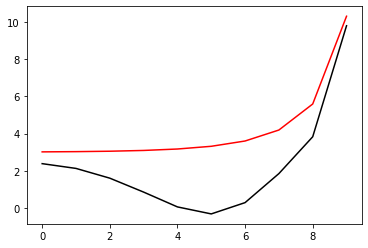

In [95]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 72.02274251390116 -0.28082102108001905 -5.046779961957541
[ 2.38143654  2.12978606  1.60897839  0.86261448  0.06710175 -0.3117663
  0.29124919  1.84885494  3.82616232  9.78698198]


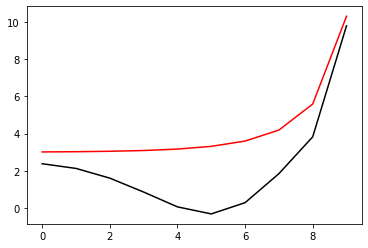

200 72.02189887979758 -0.27725717994590793 -5.0578917190101755
[ 2.37934154  2.13148775  1.61371256  0.86922729  0.07437769 -0.30597882
  0.29472762  1.85161269  3.829318    9.78669598]


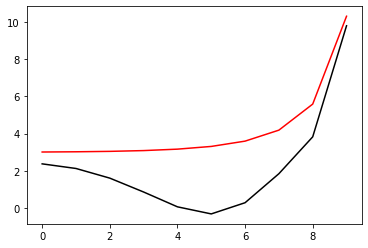

300 72.02347303012195 -0.29296478026523015 -5.0592750667686746
[ 2.38365638  2.1392821   1.62447029  0.881773    0.08720353 -0.29577221
  0.3006029   1.85468358  3.83132623  9.78641009]


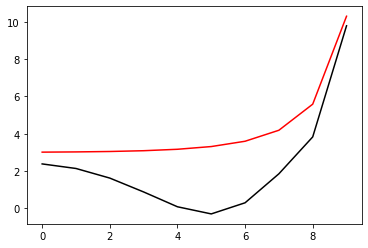

400 72.02315758026097 -0.2960373066327612 -5.02986550435337
[ 2.38392052  2.14374682  1.63247149  0.89161981  0.09654757 -0.29082602
  0.29904428  1.84877906  3.82374051  9.78612414]


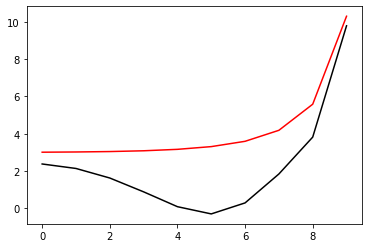

500 72.0213256807973 -0.28616478315133936 -5.00485254432131
[ 2.37894759  2.14236068  1.63402455  0.89430255  0.09804571 -0.29382079
  0.29057328  1.83760745  3.81233398  9.78583759]


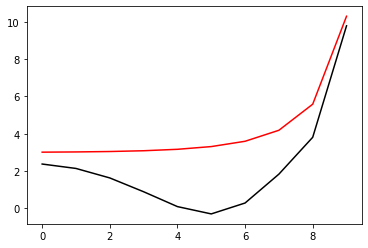

600 72.024351566283 -0.31113215877225975 -5.001307102213656
[ 2.37746334  2.14318876  1.63690242  0.89780963  0.10046516 -0.294965
  0.28542053  1.83098912  3.80610658  9.78555056]


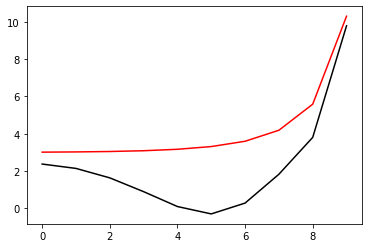

700 72.02330618229362 -0.3056565113099386 -4.993230697893223
[ 2.37594591  2.14584711  1.64366909  0.90739961  0.11116299 -0.2862062
  0.29031372  1.83335155  3.8076074   9.78526359]


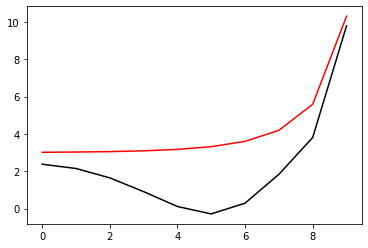

800 72.02156315384251 -0.2951421272929551 -4.978634743790894
[ 2.37265414  2.14592224  1.64704451  0.91261175  0.11629419 -0.28409152
  0.28819706  1.82909167  3.80313376  9.78497655]


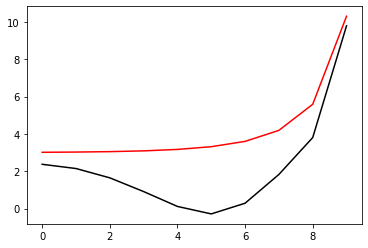

900 71.95346773096703 -0.2483764744401084 -4.969287526399279
[ 2.37382934  2.15033116  1.65494621  0.92283443  0.12718744 -0.27543649
  0.29284979  1.83120088  3.80440777  9.78468945]


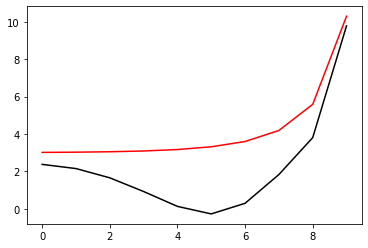

1000 72.02480833121899 -0.32375790636642776 -4.998227990006221
[ 2.37907616  2.15663191  1.66297695  0.9320171   0.13683102 -0.26676399
  0.30001612  1.83818953  3.81192461  9.78440273]


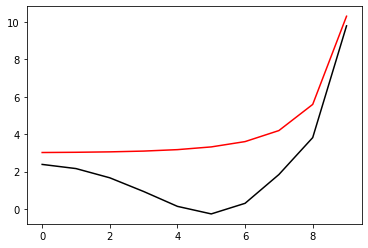

1100 72.02819614173517 -0.3372510602001526 -5.021551077966559
[ 2.38452328  2.1649848   1.67510708  0.94746554  0.15476989 -0.24861107
  0.31612803  1.85241492  3.82500554  9.78411626]


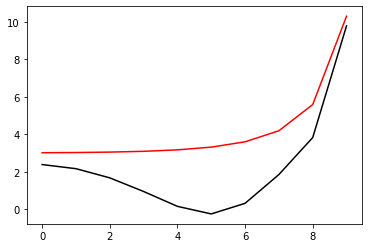

1200 72.01816692787988 -0.29444545248265563 -5.046325285769766
[ 2.39274669  2.17466298  1.68724383  0.96170098  0.17041023 -0.23344341
  0.32926309  1.8641545   3.83611414  9.7838304 ]


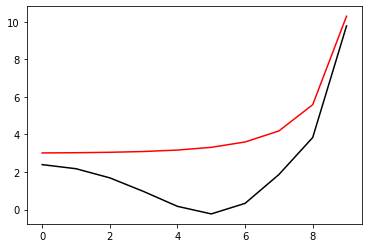

1300 72.01958655651744 -0.2983943441964858 -5.078169623607725
[ 2.4047542   2.18535856  1.69744374  0.97083631  0.17755223 -0.22980378
  0.32947646  1.86336426  3.83578447  9.78354498]


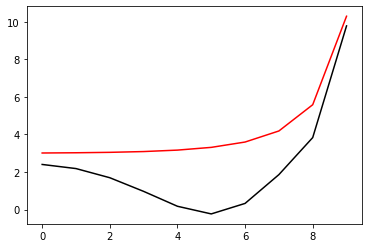

1400 72.02261636824825 -0.3117188964108265 -5.100156590077228
[ 2.41478566  2.19404181  1.70528416  0.97706113  0.18094855 -0.23088272
  0.32432834  1.85714248  3.83029392  9.78325924]


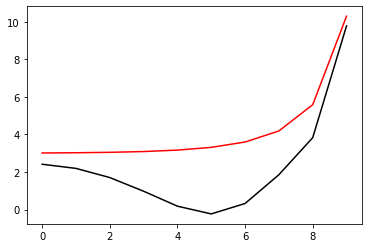

1500 72.01115618804873 -0.2816050645114121 -5.121738267691714
[ 2.41959784  2.19980746  1.71261195  0.98545185  0.18954342 -0.22367705
  0.32954292  1.86184733  3.83541287  9.78297362]


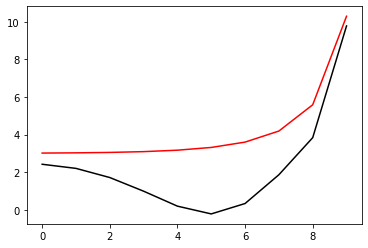

1600 72.02255844026482 -0.30314442198653685 -5.170494987340132
[ 2.43882023  2.21119822  1.71681298  0.98211802  0.17832458 -0.24210946
  0.30814277  1.84286035  3.82036569  9.78268799]


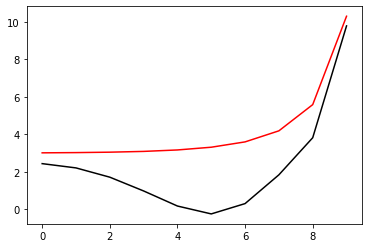

1700 71.10010325621079 -0.19445520689610998 -5.118651731557296
[ 2.44643874  2.21791364  1.72191766  0.98347634  0.17228942 -0.26009818
  0.27790061  1.80615025  3.78239306  9.78240073]


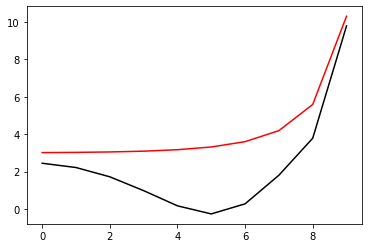

1800 72.02329500421396 -0.3089476226548214 -5.115239417574795
[ 2.44194208  2.21574487  1.72167667  0.98386925  0.17130995 -0.26508487
  0.26847342  1.79513712  3.7719448   9.78211262]


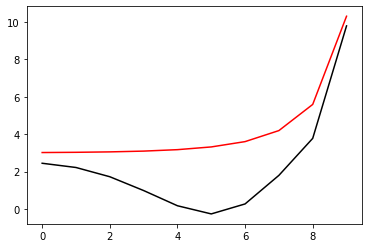

1900 72.02369717693699 -0.3060161189115918 -5.177982290896561
[ 2.45157091  2.22220418  1.72558933  0.98545662  0.17111387 -0.26590023
  0.26965072  1.80067871  3.78135378  9.78182447]


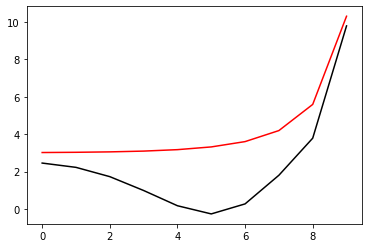

2000 72.02234835029114 -0.29631976592074677 -5.143383991652381
[ 2.45292333  2.22426974  1.72772361  0.98589399  0.16689316 -0.27853683
  0.24818109  1.77487768  3.75510897  9.78153615]


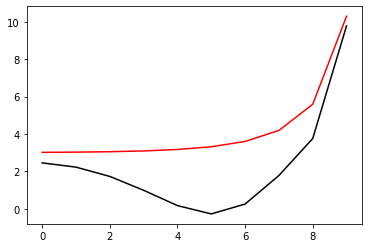

2100 72.00704004310161 -0.26809798966334536 -5.119477296707724
[ 2.45276076  2.22750895  1.73401704  0.99399685  0.17456896 -0.27481034
  0.24598986  1.76888697  3.74788328  9.78124663]


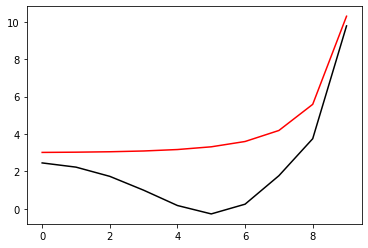

2200 72.0236385176636 -0.30442821211141824 -5.164843651792674
[ 2.45823124  2.23050067  1.73471499  0.9920224   0.16954869 -0.28266089
  0.23783704  1.76382752  3.74649553  9.78095709]


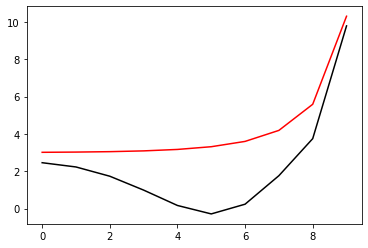

2300 72.02949230765037 -0.33736200738825106 -5.146116474487491
[ 2.46154623  2.23623035  1.74260681  1.0009189   0.17726916 -0.27954742
  0.23456339  1.7565363   3.73789939  9.78066737]


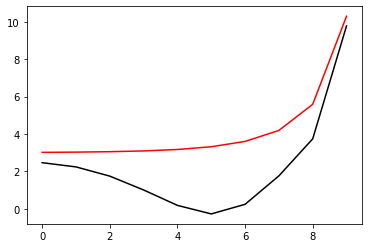

2400 72.02409792393357 -0.31348281037763986 -5.154366345443178
[ 2.46010894  2.23744068  1.74649495  1.00674422  0.18370473 -0.27461492
  0.23699894  1.75806348  3.73980389  9.78037735]


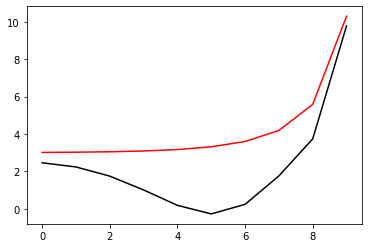

2500 72.02105457823727 -0.28862843835479113 -5.155582832874823
[ 2.45866122  2.23579293  1.74445877  1.00321165  0.17703796 -0.28599877
  0.22210379  1.74348301  3.72747903  9.78008715]


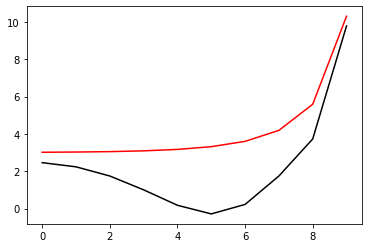

2600 72.02380703959275 -0.3087549245004813 -5.14406759024425
[ 2.45795461  2.23624224  1.74596942  1.00460408  0.1762198  -0.29182611
  0.2107572   1.72979751  3.7140182   9.77979679]


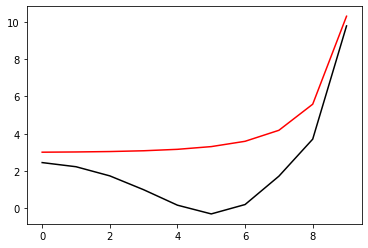

2700 72.02295161831199 -0.3032182691504983 -5.156217609024128
[ 2.45910453  2.23993124  1.75248052  1.01342721  0.18623532 -0.28268065
  0.21764525  1.73552679  3.71969107  9.77950578]


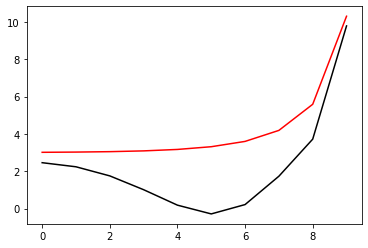

2800 72.0234084744148 -0.302928850639205 -5.196990460125409
[ 2.46170238  2.24151549  1.75347078  1.01359081  0.18524272 -0.28487697
  0.21583301  1.73656146  3.72385149  9.77921504]


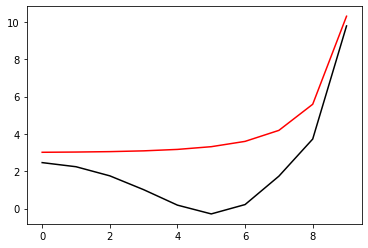

2900 72.02337453856279 -0.30231335927941766 -5.16316191132012
[ 2.46119602  2.24142746  1.75338578  1.01182968  0.17888637 -0.29942201
  0.19285683  1.70977621  3.69709523  9.77892391]


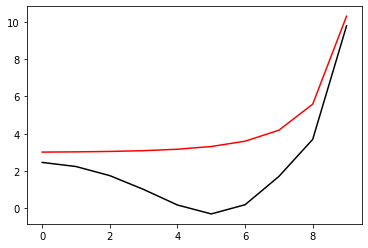

3000 72.02384315649658 -0.30580401222670656 -5.143615825012879
[ 2.45720718  2.23800773  1.75025598  1.00757612  0.17108196 -0.31363676
  0.17241842  1.68728392  3.67556344  9.77863148]


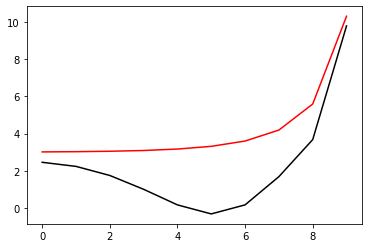

3100 72.02325444244127 -0.3016389505260932 -5.140385992013698
[ 2.45592541  2.23928399  1.75418513  1.0133497   0.17709686 -0.30987999
  0.1726443   1.6857865   3.67406966  9.77833853]


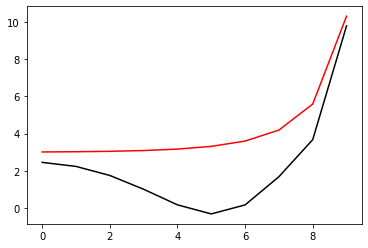

3200 72.02229565592249 -0.29341615526102205 -5.112636287557462
[ 2.45039211  2.23590567  1.75276747  1.01249326  0.17431226 -0.31787733
  0.15856915  1.66893627  3.65734986  9.77804509]


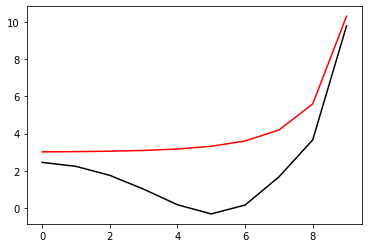

3300 72.01575297450178 -0.2740612288263105 -5.09007823945621
[ 2.44934498  2.23810084  1.75840607  1.02061585  0.1828698  -0.31228904
  0.15886184  1.66556397  3.65266523  9.77775115]


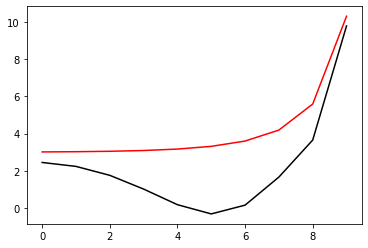

3400 72.01717430624132 -0.2799462808177511 -5.090294819496764
[ 2.44851075  2.24042081  1.7643575   1.02956937  0.1933378  -0.30296987
  0.1649755   1.66948237  3.65591259  9.77745729]


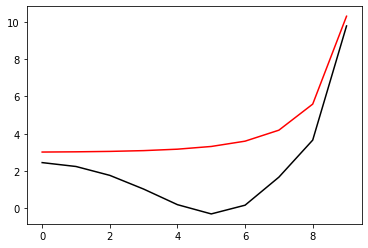

3500 72.03166568154151 -0.3504399043991744 -5.081385757079932
[ 2.44779122  2.24122782  1.76707836  1.03331294  0.1962291  -0.30370329
  0.15945913  1.661572    3.64785492  9.77716294]


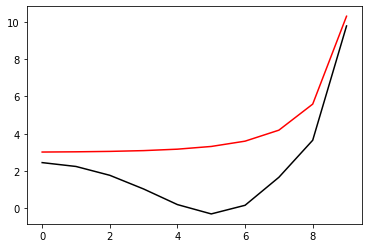

3600 70.07597378942401 -0.14901736484045305 -5.079126374626584
[ 2.45167927  2.24631865  1.77410138  1.04179232  0.2048919  -0.29698684
  0.16306628  1.6637033   3.65004379  9.77686874]


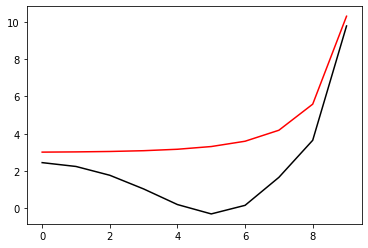

3700 72.02132349468187 -0.2889764458959294 -5.120225728390222
[ 2.44418578  2.23690339  1.7630673   1.02857629  0.18882271 -0.31548928
  0.14557015  1.65134975  3.643277    9.77657436]


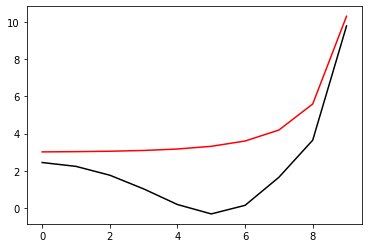

3800 72.0210267084768 -0.29050631207964467 -5.100353186034199
[ 2.44068321  2.23642555  1.76590439  1.0338163   0.19444206 -0.31268732
  0.14358312  1.64638532  3.63759008  9.77627976]


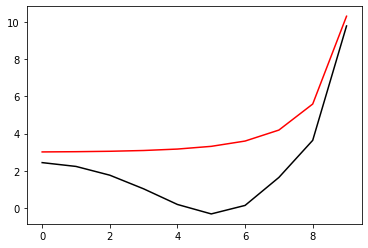

3900 72.02257867817475 -0.2973867555880168 -5.069365859529258
[ 2.43632479  2.23000358  1.75737664  1.02164897  0.17594069 -0.34012355
  0.10889455  1.61040826  3.60397695  9.77598415]


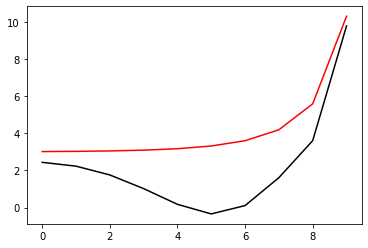

4000 72.02183397885258 -0.2946151029258327 -5.065502530355662
[ 2.43545322  2.23226778  1.76326732  1.03062751  0.186488   -0.33074887
  0.11489526  1.61401487  3.60681169  9.77568799]


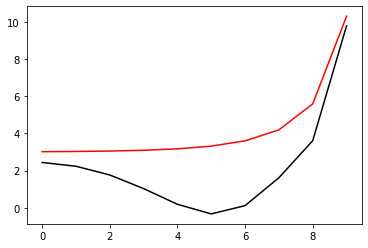

4100 72.02274095922753 -0.30517642828245173 -5.0796282360131775
[ 2.43409395  2.23280087  1.76633768  1.03586606  0.1927571  -0.32532733
  0.11842983  1.617039    3.610455    9.77539202]


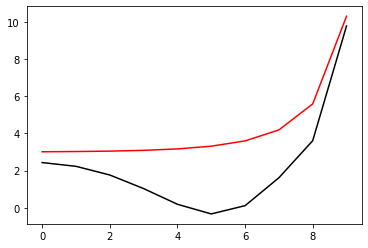

4200 72.02242489323724 -0.3029280935613252 -5.058319019611339
[ 2.42863711  2.22930983  1.76512127  1.0359418   0.19201217 -0.32983767
  0.1090718   1.60550683  3.59918001  9.77509586]


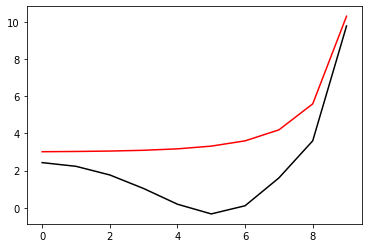

4300 72.02292085162003 -0.3131036193923687 -5.067807281604787
[ 2.42983296  2.23303035  1.77222128  1.04618249  0.20423183 -0.31798462
  0.1184325   1.61299299  3.60602294  9.77479961]


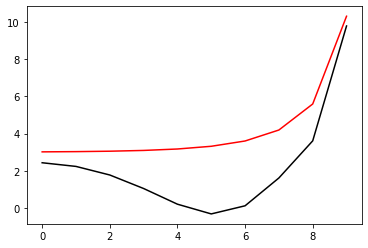

4400 72.02330652427864 -0.32160567988510047 -5.048730463410341
[ 2.42617777  2.23212037  1.77461624  1.05112742  0.20980142 -0.31488532
  0.11705234  1.6088089   3.6011977   9.77450344]


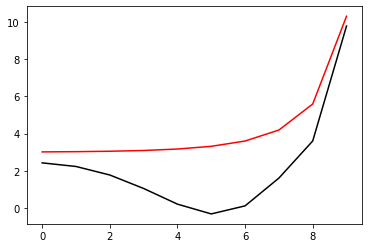

4500 72.02420608783746 -0.33193572420722506 -5.019776287469451
[ 2.41982777  2.22733791  1.77180085  1.04917693  0.20633261 -0.32309248
  0.10308698  1.59223008  3.58485988  9.77420696]


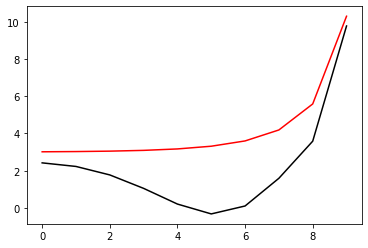

4600 70.11485280273658 -0.14966126425652646 -5.00666139772632
[ 2.42270319  2.2323348   1.77985097  1.0599075   0.21823251 -0.31284305
  0.10935573  1.59556382  3.58711701  9.77390988]


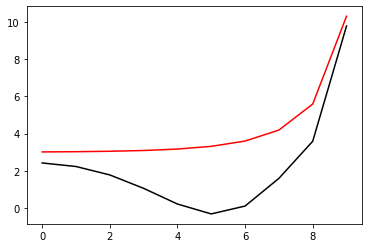

4700 72.02264043428893 -0.3009785552778995 -5.114930081507328
[ 2.4232371   2.22565923  1.76706137  1.04164327  0.19571869 -0.33584017
  0.09301868  1.59077996  3.59223665  9.77361313]


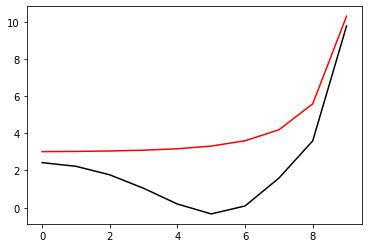

4800 72.02346941036045 -0.31378420235532206 -5.1297339068776795
[ 2.42318269  2.22716578  1.77078946  1.04742384  0.20250456 -0.32987087
  0.09709494  1.59429746  3.59633462  9.77331652]


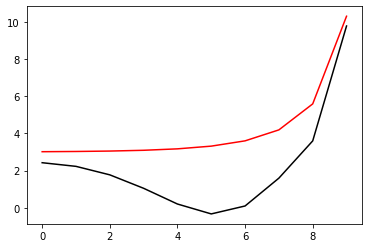

4900 72.02632675858682 -0.3349453792204719 -5.114297871474757
[ 2.41850661  2.22440997  1.77031712  1.04854331  0.20335129 -0.33204284
  0.09069418  1.58598217  3.58828039  9.77302002]


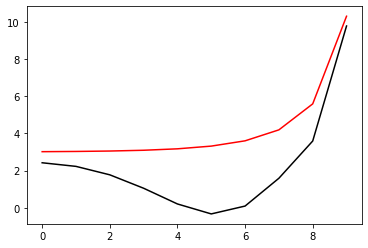

5000 72.02067600317216 -0.28618562854444624 -5.109862912652518
[ 2.41464126  2.22316043  1.77222807  1.05316058  0.20913806 -0.32762712
  0.09207224  1.58574852  3.58809042  9.77272315]


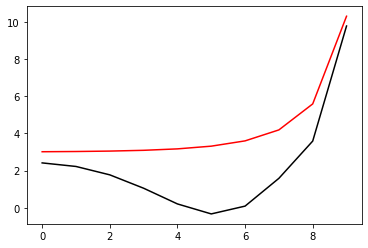

5100 72.0229113192607 -0.3121987790295789 -5.087665080502218
[ 2.41176651  2.22093332  1.77103969  1.05217855  0.20619439 -0.3355437
  0.07831915  1.56940057  3.57200452  9.77242597]


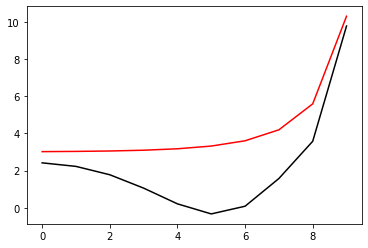

5200 72.02339241645869 -0.3206424126257562 -5.044637406591172
[ 2.40477634  2.21513197  1.76658199  1.04784565  0.19923136 -0.34881658
  0.05772096  1.54534578  3.54804963  9.77212823]


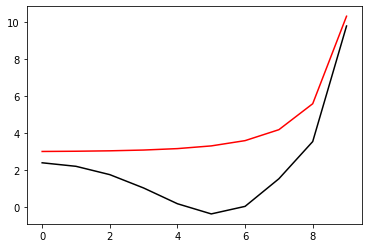

5300 72.0152215637156 -0.2699654358092914 -5.039667604309982
[ 2.40124035  2.2140996   1.76870946  1.05274383  0.20539384 -0.34394734
  0.05952591  1.54543434  3.54809419  9.77182948]


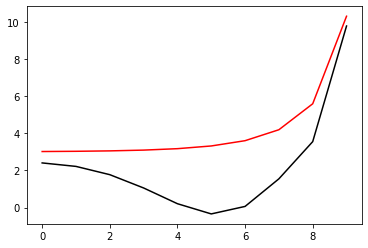

5400 72.02074245540426 -0.2940390351041785 -5.029674771100838
[ 2.40470807  2.21901819  1.77592748  1.06206035  0.21541218 -0.33588673
  0.06352324  1.54660353  3.54833336  9.77153079]


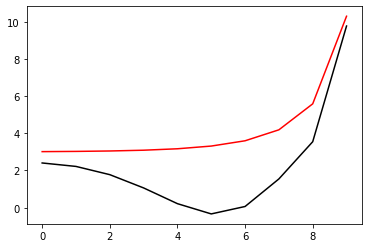

5500 72.02333182910434 -0.32900944289556444 -4.991705197862941
[ 2.40608407  2.22073218  1.77849766  1.06471543  0.2158753  -0.3410504
  0.05122167  1.53027829  3.5312731   9.77123145]


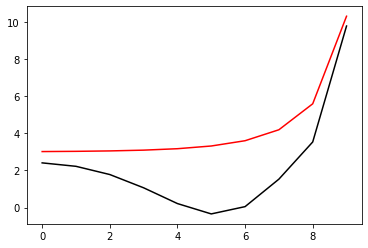

5600 72.011686071698 -0.2721762242093304 -4.986188025384911
[ 2.4029557   2.2199684   1.78083007  1.06981959  0.22227247 -0.33592468
  0.05323848  1.5304876   3.53137206  9.77093193]


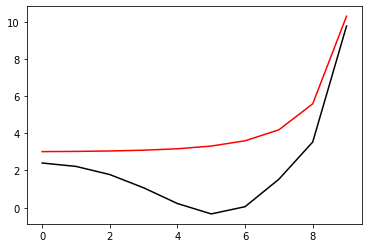

5700 72.02146094958813 -0.30522746905574183 -4.975668226872789
[ 2.40057875  2.21704823  1.77799539  1.06659535  0.21702793 -0.34531216
  0.03973453  1.51619119  3.51853206  9.77063199]


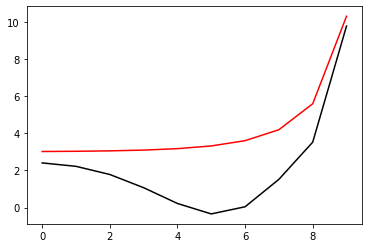

5800 72.02248200609462 -0.3215193658807261 -4.9810734561302805
[ 2.40640962  2.22279412  1.78467295  1.07432665  0.22489399 -0.33914522
  0.04305027  1.51815767  3.520607    9.77033209]


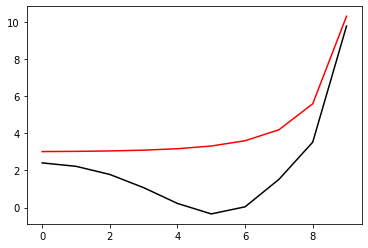

5900 72.02340961760297 -0.33373273909762075 -4.9815969466588905
[ 2.40955167  2.22596102  1.78875263  1.07929682  0.22966399 -0.3364835
  0.04269682  1.51666899  3.51959652  9.77003209]


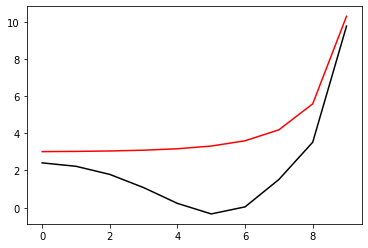

6000 72.01545254584946 -0.28152982649142594 -4.976596147797859
[ 2.40626717  2.2250235   1.79080642  1.08409164  0.23576867 -0.33159608
  0.0445389   1.51675901  3.51962859  9.76973207]


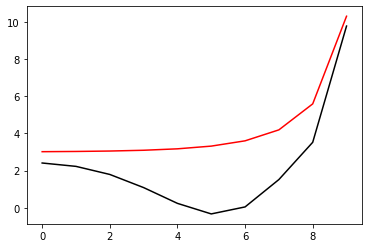

6100 72.02154503887955 -0.31552206838677493 -4.921333497733518
[ 2.40583123  2.22470851  1.7909851   1.08397383  0.23295971 -0.34065532
  0.02782523  1.49587362  3.49812836  9.76943126]


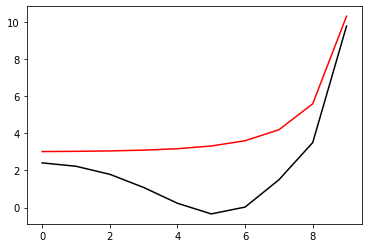

6200 72.0220949499025 -0.3243472983246856 -4.903853967620052
[ 2.40670985  2.22530403  1.79192567  1.08495736  0.23246976 -0.34489309
  0.01923698  1.48573904  3.48871793  9.76913003]


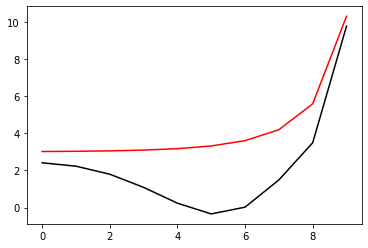

6300 72.02152410348764 -0.31732103915358767 -4.90034025995087
[ 2.40503969  2.22459332  1.79285645  1.08737224  0.23506657 -0.34429124
  0.01674963  1.48207379  3.48562474  9.76882853]


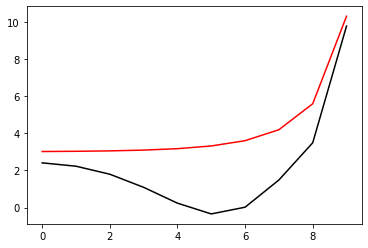

6400 72.02190590156987 -0.3257205955977893 -4.900805775629309
[ 2.41152844  2.2315189   1.80109904  1.09707841  0.24525348 -0.33572659
  0.02203791  1.48533276  3.48849487  9.76852701]


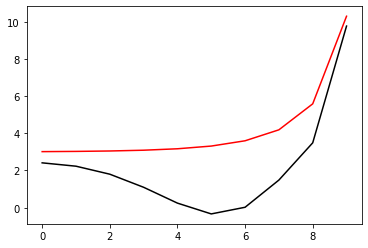

6500 72.3029657463879 -0.0984873297740952 -4.787578238470159
[ 2.44926305  2.26428478  1.82961187  1.1210217   0.26240795 -0.32947766
  0.01496695  1.46889903  3.46801627  9.76822537]


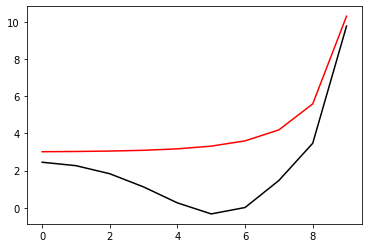

6600 73.38051544512975 -0.06243483488523016 -4.745746623768256
[ 2.49376676  2.30414685  1.86589241  1.15447375  0.29244824 -0.30520003
  0.0309999   1.47818938  3.47361251  9.76792302]


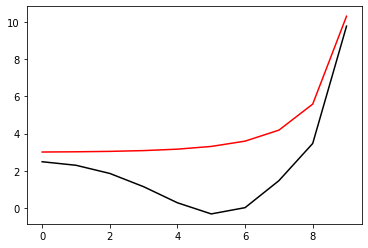

6700 70.25682718938748 -0.1996148484114177 -4.735205688355653
[ 2.56211706  2.35626325  1.90316584  1.17855482  0.30429041 -0.30437558
  0.02464904  1.47067407  3.46764568  9.76762086]


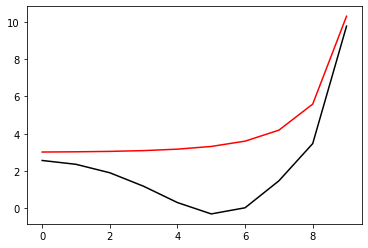

6800 70.30365378760129 -0.20715090415948928 -4.785343839266618
[ 2.62474778  2.40345407  1.93603792  1.19941417  0.31520221 -0.30063486
  0.02594104  1.4743998   3.47461518  9.76731876]


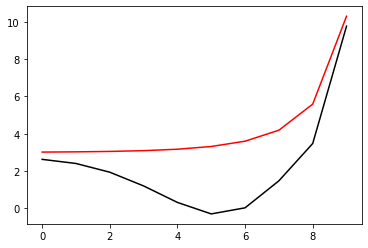

6900 71.96198486254693 -0.2981836600860714 -4.961656330836315
[ 2.66344118  2.43347241  1.95856933  1.21790634  0.3337159  -0.27724737
  0.05785343  1.51455997  3.51930487  9.76701792]


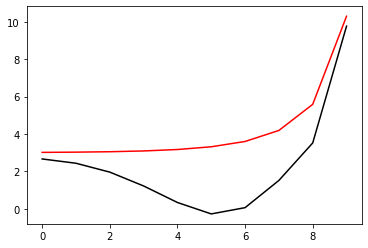

7000 72.02330100583177 -0.34636583218685146 -5.049966327715442
[ 2.67413497  2.44286056  1.96609314  1.22497385  0.34158055 -0.26735394
  0.07100294  1.53171592  3.53939229  9.76671862]


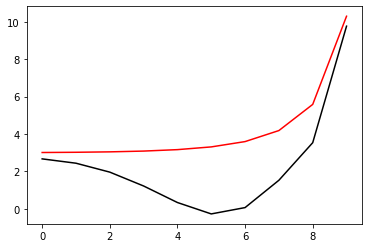

7100 72.02229471594269 -0.3399946337578387 -5.084198525004019
[ 2.67611355  2.44652237  1.97028229  1.23010073  0.34744522 -0.26158916
  0.07629162  1.53776259  3.54679009  9.76641991]


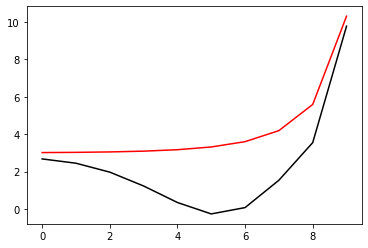

7200 72.02478319575498 -0.3519620726921858 -5.116775112935933
[ 2.67600116  2.44783655  1.97186342  1.23216988  0.34967831 -0.25997454
  0.07738129  1.5400893   3.55106637  9.7661215 ]


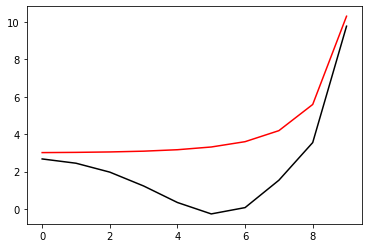

7300 72.02277476408835 -0.3348304968821192 -5.173523560597532
[ 2.68290244  2.45319456  1.97499293  1.23377667  0.35026884 -0.25982635
  0.07869965  1.54473407  3.55899989  9.76582343]


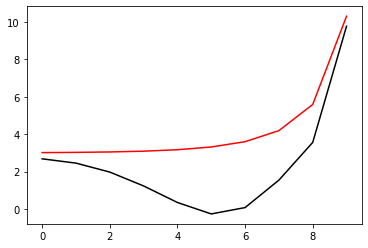

7400 70.0717928474872 -0.1564793531991181 -5.213760113436808
[ 2.69176811  2.45882673  1.97648766  1.23145488  0.3442624  -0.26890156
  0.06943593  1.53920484  3.55791576  9.76552558]


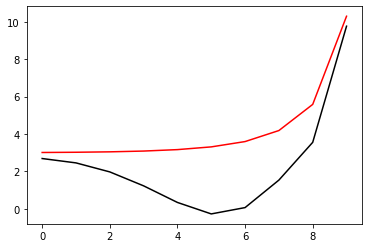

7500 72.025630362146 -0.33868074757792865 -5.199255462295706
[ 2.6849654   2.44447319  1.95504674  1.20600749  0.31540272 -0.30120983
  0.03733142  1.51215606  3.53524725  9.76522666]


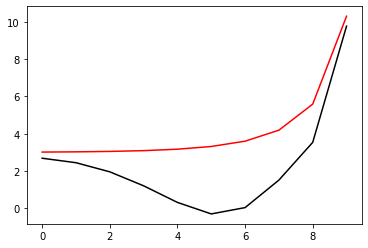

7600 72.02397048707628 -0.3276639827786244 -5.201319787095419
[ 2.68256373  2.44642113  1.95971315  1.21307101  0.32387412 -0.29364296
  0.04191053  1.51468075  3.53733993  9.76492769]


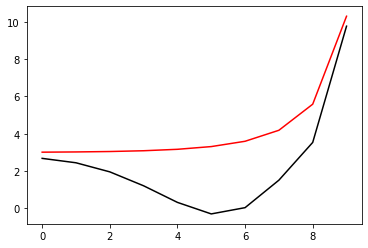

7700 72.02310974218543 -0.3142469958955601 -5.232617999881668
[ 2.68176796  2.44455977  1.95523342  1.20563685  0.31306299 -0.30781256
  0.02706231  1.50344075  3.53080516  9.76462859]


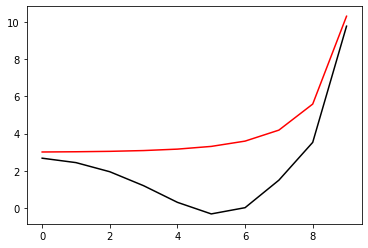

7800 72.02569150422941 -0.3374603319244823 -5.207509277643907
[ 2.68012079  2.44581968  1.95773587  1.20841937  0.31416093 -0.31181577
  0.01601772  1.4881845   3.51469903  9.76432875]


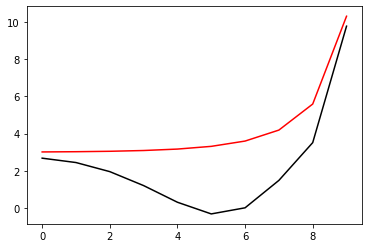

7900 72.02545541618012 -0.33137465147711304 -5.235906066205559
[ 2.67909595  2.44546153  1.95687339  1.20675418  0.3112676  -0.31650012
  0.01056023  1.48476335  3.51429622  9.76402878]


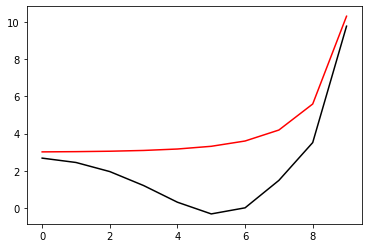

8000 72.02447795531438 -0.32471430485196934 -5.206681270917022
[ 2.67526211e+00  2.44533772e+00  1.95900585e+00  1.21008602e+00
  3.13855529e-01 -3.18074882e-01  2.59662883e-03  1.47278685e+00
  3.50143644e+00  9.76372854e+00]


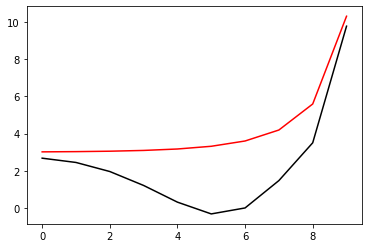

8100 72.02493532115892 -0.3289701386064061 -5.1869511728031545
[ 2.67066477  2.44278004  1.95719472  1.20793552  0.30955973 -0.3272635
 -0.01226384  1.45568984  3.48508656  9.76342751]


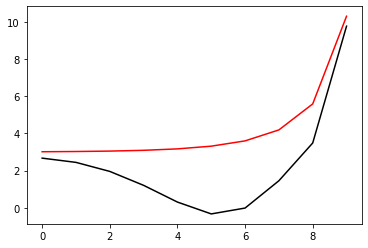

8200 72.02487262828913 -0.33295275614846254 -5.174601399017002
[ 2.66798015e+00  2.44427938e+00  1.96200966e+00  1.21538901e+00
  3.18369585e-01 -3.19865325e-01 -8.87420264e-03  1.45600470e+00
  3.48438376e+00  9.76312615e+00]


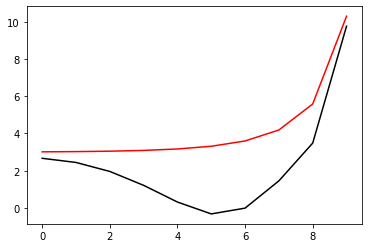

8300 72.024341654069 -0.3308302734608504 -5.180878843324474
[ 2.66604828e+00  2.44608732e+00  1.96705982e+00  1.22325865e+00
  3.28220709e-01 -3.10171381e-01 -1.58591670e-03  1.46140515e+00
  3.48928527e+00  9.76282490e+00]


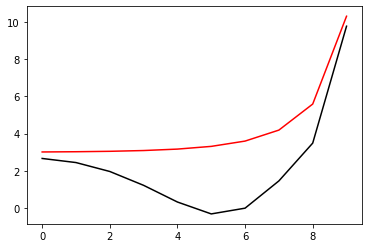

8400 72.01866891208144 -0.3067913047039471 -5.184497743732011
[ 2.66504825e+00  2.44879670e+00  1.97318108e+00  1.23238543e+00
  3.39507624e-01 -2.98960564e-01  7.04321526e-03  1.46777553e+00
  3.49482228e+00  9.76252393e+00]


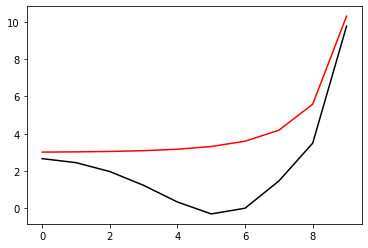

8500 72.02296546164075 -0.3146472948851875 -5.247970716629675
[ 2.66962021e+00  2.45028446e+00  1.97158177e+00  1.22784646e+00
  3.32571439e-01 -3.07024286e-01  1.05935065e-03  1.46729291e+00
  3.49970830e+00  9.76222332e+00]


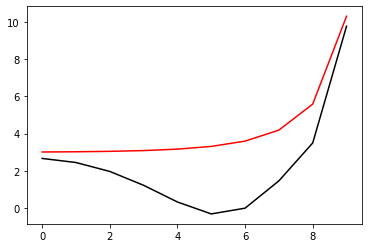

8600 72.02978748482718 -0.3625526459746147 -4.388065129316158
[ 2.64503713  2.24827225  1.66396033  0.92487225  0.08911604 -0.46643042
 -0.05297369  1.49104089  3.51396616  9.76192324]


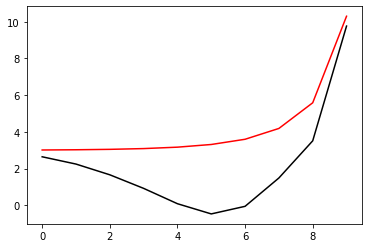

8700 72.0293018057059 -0.35412303986992305 -4.390750023912133
[ 2.63372131  2.24859913  1.6661404   0.92744526  0.09229729 -0.46419738
 -0.05306217  1.49014995  3.51380826  9.76162334]


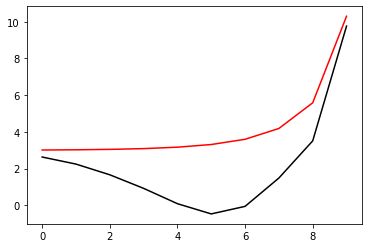

8800 72.02895458060613 -0.3510791431064591 -4.395336120708043
[ 2.62259083  2.24835604  1.66790653  0.92954674  0.09495188 -0.46243877
 -0.05344593  1.48917927  3.5137266   9.76132345]


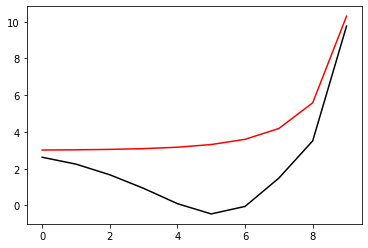

8900 72.02862313497475 -0.34906273039604807 -4.40058713475628
[ 2.61175453  2.24776395  1.66951441  0.93148697  0.09741394 -0.46085611
 -0.053943    1.48816989  3.51366224  9.76102357]


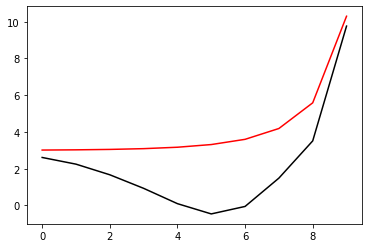

9000 72.02829817529592 -0.34702829958371445 -4.406233192509558
[ 2.60122535  2.24688938  1.67101723  0.93333219  0.09975415 -0.45938746
 -0.0545169   1.4871282   3.5136004   9.7607237 ]


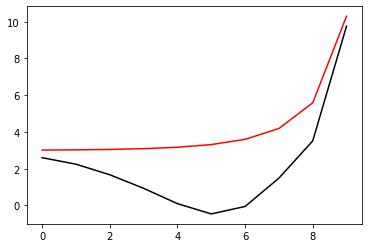

9100 72.02797445361537 -0.34466931125042227 -4.4123190552360105
[ 2.59099763  2.24575638  1.67240804  0.93507144  0.10195672 -0.45805098
 -0.0551829   1.48604501  3.51353698  9.76042385]


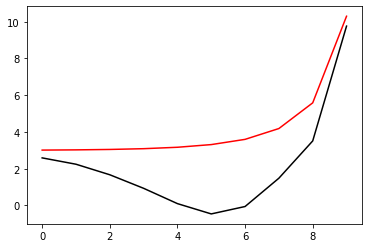

9200 72.02764285229794 -0.34173553091931613 -4.4190311433621945
[ 2.58106706  2.24437553  1.67365648  0.93665941  0.10396462 -0.45690542
 -0.05598484  1.48489946  3.51346887  9.760124  ]


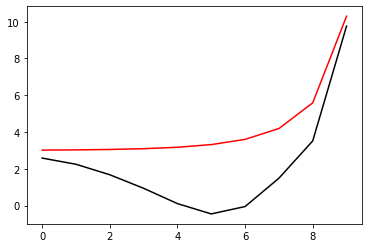

9300 72.02728177019652 -0.3377630636367016 -4.426765553752443
[ 2.57144063  2.24274507  1.67470047  0.93799989  0.10565668 -0.45607494
 -0.05701501  1.48364794  3.51339004  9.75982417]


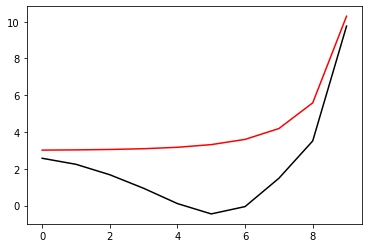

9400 72.02681411542409 -0.33148757411930446 -4.4365351268643325
[ 2.56216231  2.24083266  1.67538473  0.93884595  0.10671995 -0.4558809
 -0.05851343  1.48217537  3.51328218  9.75952434]


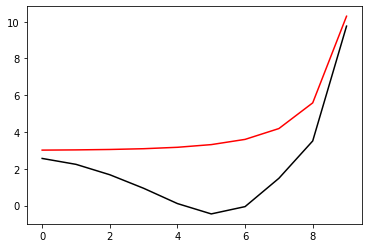

9500 72.02547366297858 -0.3162294388122691 -4.453076316185231
[ 2.55351148  2.23843004  1.67498268  0.93802438  0.10565754 -0.4578695
 -0.06164781  1.47990435  3.51302783  9.75922453]


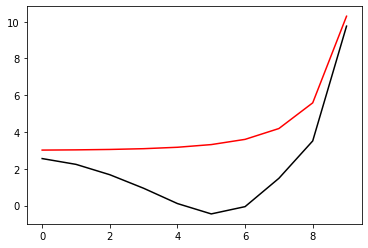

9600 72.01361404368818 -0.2940172926594592 -4.525148121601141
[ 2.5522328   2.23827406  1.67242335  0.93129562  0.09630884 -0.46778843
 -0.0687827   1.47883786  3.5177122   9.75892473]


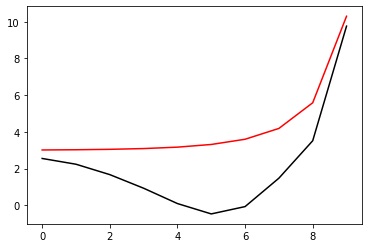

9700 72.02687246297138 -0.33864820487961383 -4.531486809279043
[ 2.54141606  2.23202989  1.66673115  0.92323867  0.08547058 -0.48221919
 -0.08582494  1.46300956  3.50496523  9.75862461]


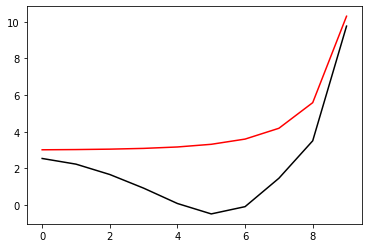

9800 72.02820952735183 -0.35835625342097194 -4.538260027719654
[ 2.53897377  2.23385046  1.66941932  0.92409275  0.08428579 -0.48631177
 -0.09279496  1.45599105  3.4997037   9.75832435]


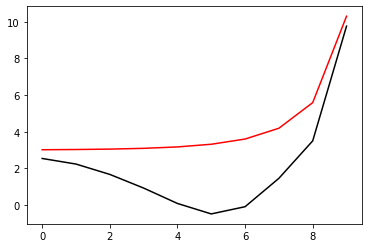

9900 72.02393742727885 -0.316510908935165 -4.535489474086638
[ 2.53131671  2.23299229  1.67228883  0.92792284  0.08858113 -0.4832024
 -0.09253215  1.45485133  3.49892813  9.75802393]


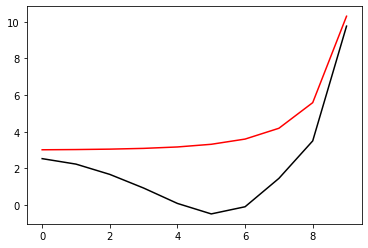

10000 72.02698697189065 -0.3424502420179037 -4.534849518917561
[ 2.52455961  2.2290485   1.66809965  0.92046072  0.07728596 -0.49895243
 -0.11128109  1.43744733  3.48490432  9.75772298]


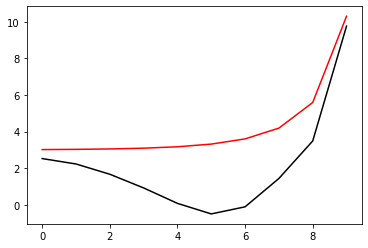

In [96]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 72.02662699913216 -0.3390231285393762 -4.565604088518506
[ 2.54186324  2.24994275  1.6909021   0.94340848  0.10123078 -0.47429562
 -0.08798532  1.45898925  3.50547655  9.75742206]


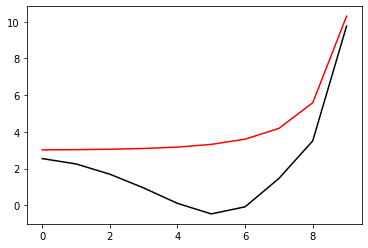

200 72.01230793969734 -0.2926730286566064 -4.581390240749648
[ 2.53707068  2.24957889  1.69279249  0.94498016  0.1022653  -0.47454376
 -0.08990477  1.45739516  3.50555471  9.75712197]


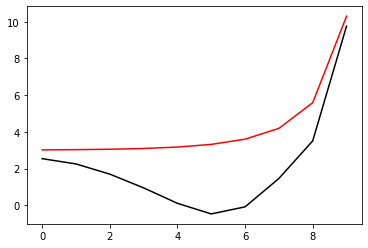

300 72.02479122822544 -0.31773451683447557 -4.624539871200305
[ 2.53402747  2.24981969  1.69461773  0.94623591  0.10337546 -0.47331045
 -0.08817389  1.46126696  3.51202095  9.75682215]


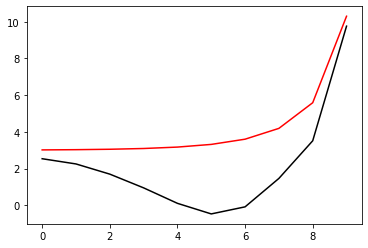

400 72.82976379331674 -0.0743210799677822 -4.626141902824143
[ 2.54415658  2.26352729  1.7105584   0.9621726   0.11915598 -0.45891202
 -0.07722369  1.46954604  3.5193893   9.75652255]


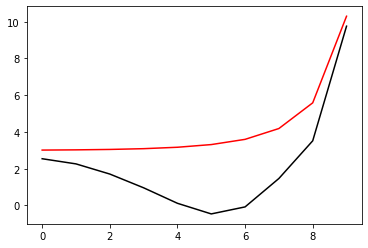

500 72.00799492850365 -0.2849752120352115 -4.676896263861055
[ 2.54829964  2.27094423  1.72009733  0.97192002  0.12967597 -0.44739442
 -0.06526252  1.48252865  3.53371217  9.75622359]


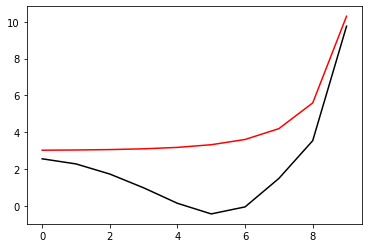

600 71.93469891615774 -0.26042001574865664 -4.696491418338989
[ 2.54714721  2.27381167  1.72572242  0.97799144  0.13597039 -0.44162778
 -0.06102147  1.48647943  3.53856441  9.75592515]


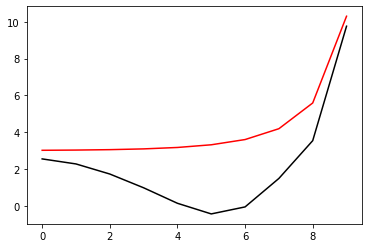

700 72.02381511214216 -0.3117864848716398 -4.713225375276921
[ 2.54821201  2.27804154  1.73200087  0.98398375  0.14139674 -0.43739787
 -0.0586036   1.48873388  3.54196913  9.75562679]


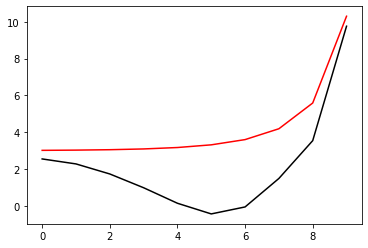

800 72.0245478733062 -0.31706921959128337 -4.726090917457339
[ 2.54752766  2.28116952  1.73798473  0.99050178  0.14801707 -0.43160446
 -0.05478632  1.49185531  3.54576307  9.75532869]


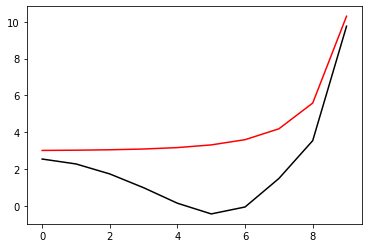

900 72.02567706976272 -0.3289370331303434 -4.756195626543278
[ 2.54862245  2.28533051  1.7446157   0.99755595  0.15539927 -0.42430221
 -0.04837289  1.49841937  3.55339045  9.75503073]


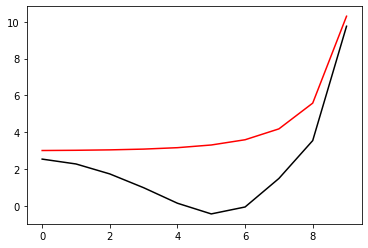

1000 72.02586153049668 -0.3331014047791734 -4.776245083884746
[ 2.55613287  2.29489919  1.75587092  1.00857802  0.16612541 -0.41428573
 -0.04000638  1.50617488  3.56164993  9.75473316]


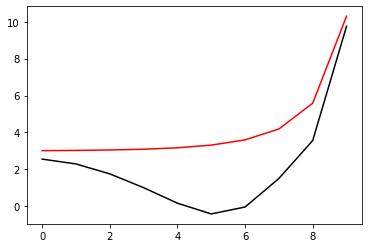

1100 73.21155702388864 -0.059153747482610236 -4.767435349566409
[ 2.57594933  2.31527999  1.77675989  1.02813588  0.18404726 -0.39903568
 -0.02920255  1.51366511  3.56787177  9.75443598]


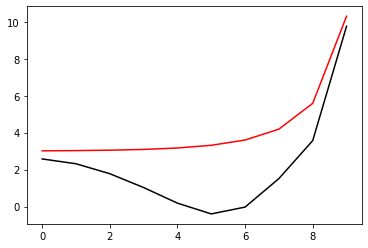

1200 72.02293819590372 -0.3166512232119281 -4.796513904700845
[ 2.60025245  2.33858912  1.79902475  1.04795938  0.20194213 -0.38266496
 -0.01474952  1.52726525  3.58159508  9.75413937]


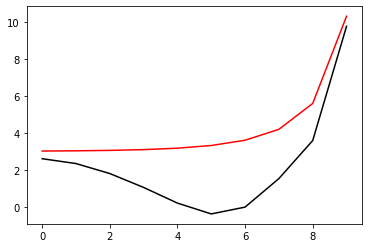

1300 72.02286257117697 -0.3278865114053184 -4.737820104801871
[ 2.64407634  2.37757692  1.83280659  1.07446256  0.22034093 -0.37360781
 -0.01550723  1.52065318  3.57313251  9.75384276]


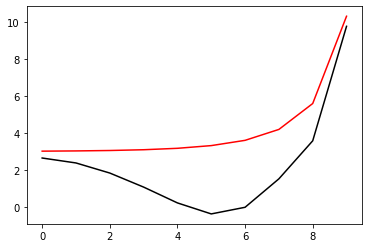

1400 72.00420960681716 -0.3072514148680255 -4.800296804132625
[ 2.67858036  2.40941417  1.86241385  1.10134939  0.24595884 -0.34787357
  0.00995892  1.54577634  3.59799814  9.75354654]


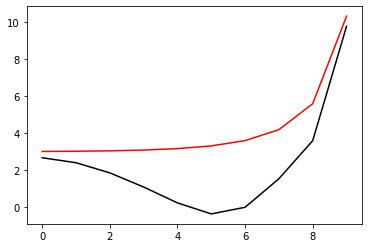

1500 72.02406729670794 -0.33660819764627964 -4.928456007591783
[ 2.70740748  2.43531576  1.88615192  1.12328573  0.26884882 -0.32077243
  0.04210106  1.58169095  3.63561359  9.75325207]


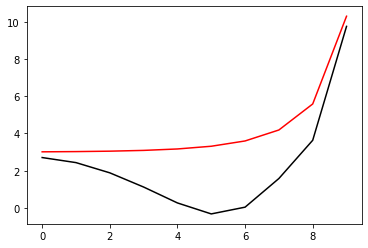

1600 72.02588645536319 -0.34648834609575485 -4.994862922647305
[ 2.71630758  2.44605446  1.89843449  1.136217    0.28324563 -0.3041264
  0.06029224  1.60103769  3.65578113  9.752959  ]


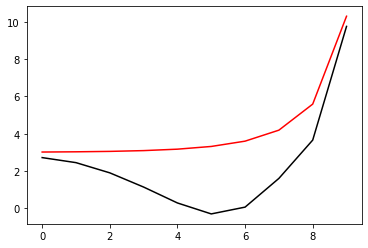

1700 72.02343621887812 -0.3329385756349251 -5.040683760654764
[ 2.72039334  2.45212849  1.90592584  1.14377532  0.29105658 -0.29575411
  0.06895405  1.61076495  3.66691253  9.75266659]


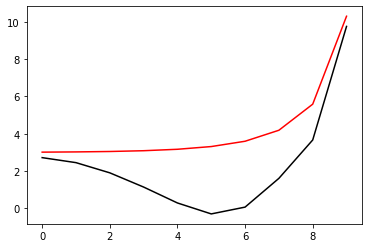

1800 71.81741183559231 -0.2706543660677067 -5.081314102350405
[ 2.72669752  2.46032567  1.91556741  1.15358396  0.3011762  -0.28518135
  0.07935069  1.6215532   3.67855749  9.75237485]


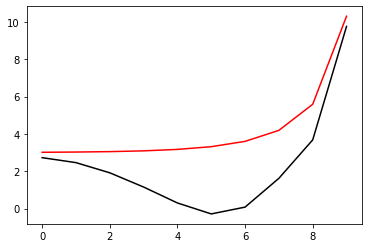

1900 72.02295239074458 -0.32928640551814187 -5.107403736865172
[ 2.72229232  2.45910669  1.91667789  1.15514523  0.30253829 -0.28453392
  0.07893775  1.62170587  3.68034324  9.75208338]


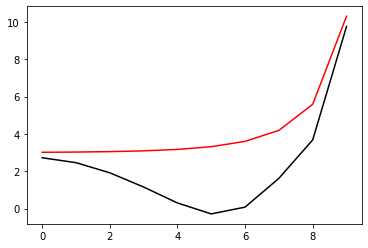

2000 72.02543622638017 -0.3393495158892828 -5.132869408099702
[ 2.72230743  2.46145379  1.92078771  1.15928312  0.30610917 -0.28205523
  0.07984469  1.62261495  3.68244517  9.75179204]


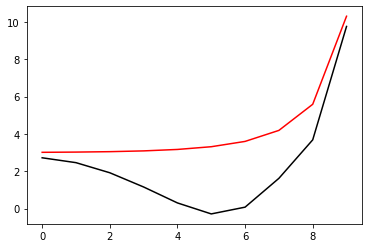

2100 72.02517734064116 -0.333236652498625 -5.159354691729799
[ 2.72209512  2.46162328  1.92068926  1.1570455   0.30108208 -0.2898542
  0.07048164  1.61486447  3.6776428   9.75150064]


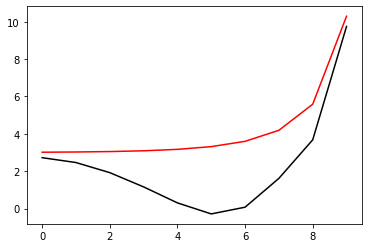

2200 72.02880191182051 -0.3511590602083945 -5.195581107325795
[ 2.72432275  2.46414021  1.92311974  1.15785183  0.29998338 -0.29252148
  0.06718864  1.61332887  3.67871196  9.75120914]


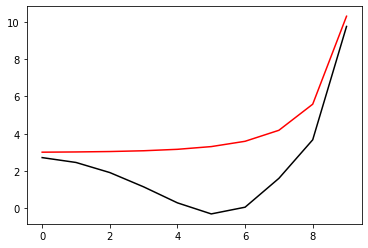

2300 72.01008034092862 -0.3005542561932724 -5.189190729399348
[ 2.72490823  2.46833885  1.93037419  1.16615234  0.30787466 -0.28702289
  0.06816398  1.61115195  3.67571437  9.75091771]


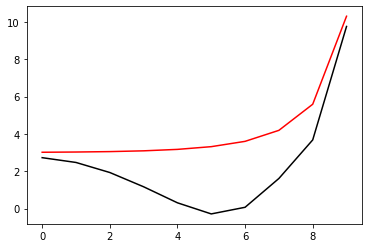

2400 72.02669993111682 -0.3397550358986404 -5.1965647949139795
[ 2.72278255  2.46748868  1.93015544  1.16449573  0.30351273 -0.29499359
  0.05689387  1.59977426  3.66626237  9.75062601]


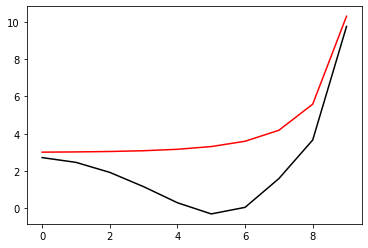

2500 72.02533055160661 -0.3234896729904212 -5.232043094964561
[ 2.72584994  2.46891482  1.92954863  1.16020463  0.29509052 -0.30678968
  0.04421609  1.59018514  3.66086272  9.75033389]


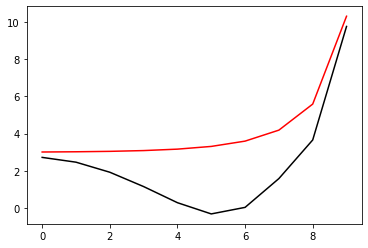

2600 74.70311904617952 -0.5195226780937433 -5.208650486860356
[ 2.72084278  2.46665817  1.92926237  1.15943626  0.29153772 -0.3158162
  0.02822106  1.57045968  3.6408452   9.75004149]


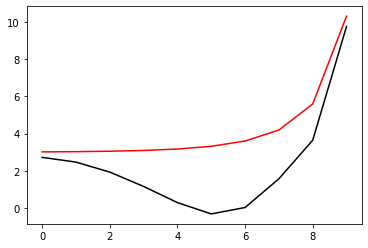

2700 72.02436335428337 -0.32381890350724696 -5.19633366309538
[ 2.72452366  2.47429822  1.94063666  1.17275795  0.30529545 -0.30387345
  0.03539229  1.57348398  3.64211588  9.74974819]


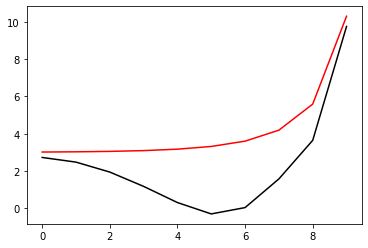

2800 72.02174001911712 -0.30439540226206274 -5.253177001403306
[ 2.72596853  2.47347198  1.93758131  1.16618808  0.29528942 -0.31555949
  0.02546328  1.56904087  3.64326802  9.74945513]


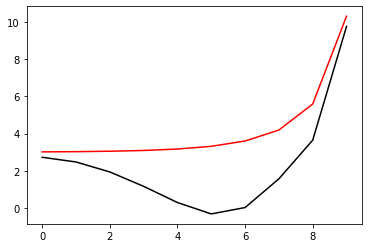

2900 72.02554033379654 -0.31620175062143735 -5.176125095607576
[ 2.72127435e+00  2.45351250e+00  1.90875175e+00  1.13551273e+00
  2.65377396e-01 -3.44045883e-01  7.77746827e-04  1.54983274e+00
  3.62495948e+00  9.74916157e+00]


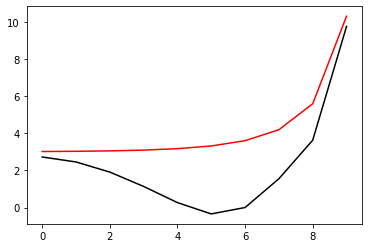

3000 72.02424134501504 -0.30574137796596274 -5.212933973120779
[ 2.72461748e+00  2.45772342e+00  1.91286046e+00  1.13822447e+00
  2.66421364e-01 -3.44262617e-01  1.79702594e-04  1.55104206e+00
  3.62875154e+00  9.74886776e+00]


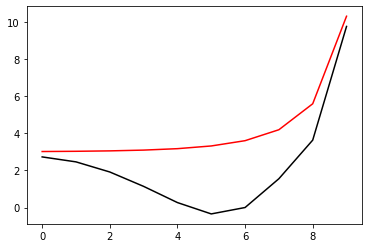

3100 72.0279335441876 -0.33772188289647737 -5.191676282824892
[ 2.72184144e+00  2.45882816e+00  1.91654656e+00  1.14228122e+00
  2.68696177e-01 -3.46516387e-01 -8.75965511e-03  1.53786718e+00
  3.61465348e+00  9.74857337e+00]


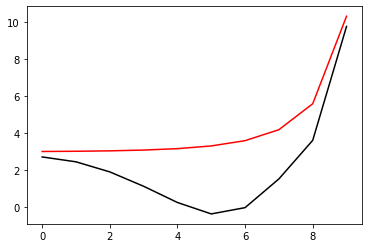

3200 72.02768884466296 -0.33927534312093904 -5.167030152219889
[ 2.71705954  2.45870469  1.9199351   1.14699801  0.27268366 -0.34587048
 -0.01377608  1.52909606  3.60506507  9.74827882]


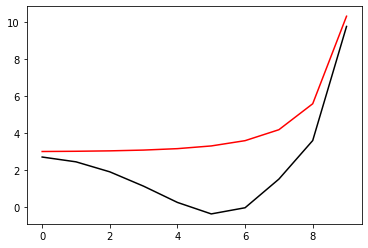

3300 72.02717454373041 -0.3336853277650744 -5.156596804227517
[ 2.71414358  2.4577693   1.92004729  1.14604609  0.26890468 -0.35408308
 -0.02673748  1.51472468  3.591953    9.7479838 ]


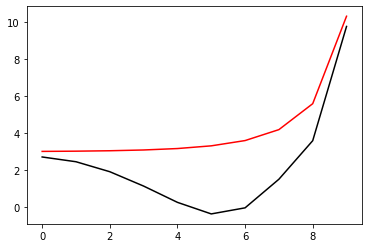

3400 72.02707161414762 -0.33733808615238386 -5.142488929184162
[ 2.71044459  2.45892525  1.92539739  1.15373054  0.27726213 -0.34726861
 -0.02407001  1.51412971  3.59036864  9.7476883 ]


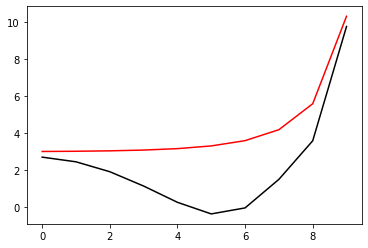

3500 72.0270039647875 -0.34020838708576573 -5.115306163273539
[ 2.70529544  2.45777561  1.92758208  1.15706911  0.27957758 -0.34862523
 -0.03126562  1.5032495   3.57885431  9.74739255]


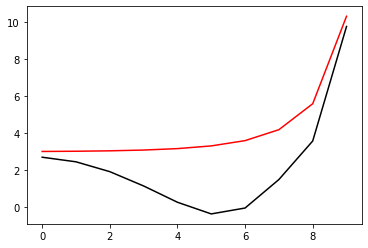

3600 72.02592119824995 -0.333285452681983 -5.113285504275916
[ 2.70280779  2.45970724  1.93377489  1.16591987  0.28971927 -0.33901388
 -0.02469316  1.50719318  3.58197579  9.74709653]


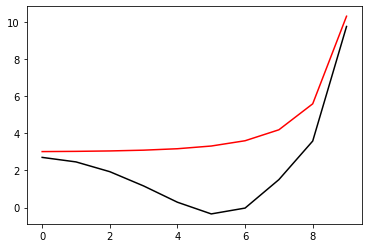

3700 72.02354326075103 -0.3216042147211134 -5.104866342608701
[ 2.70165146  2.4628164   1.94118182  1.17604674  0.30110837 -0.32839231
 -0.01765136  1.5109648   3.58446177  9.74680068]


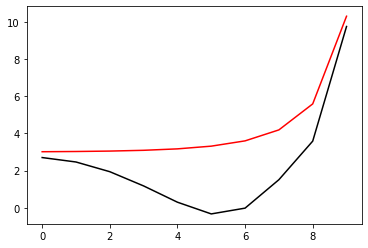

3800 71.05084394040847 -0.22340133503497034 -5.112259287574819
[ 2.70909083e+00  2.47414279e+00  1.95709777e+00  1.19563797e+00
  3.23597593e-01 -3.04671724e-01  3.51188742e-03  1.52810672e+00
  3.59888765e+00  9.74650519e+00]


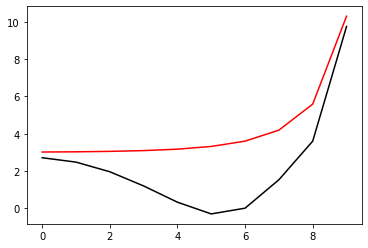

3900 72.02858926883002 -0.35910550053196033 -5.156259586614102
[ 2.70707153e+00  2.47330253e+00  1.95792978e+00  1.19707192e+00
  3.25169683e-01 -3.02865793e-01  5.69754429e-03  1.53198611e+00
  3.60496827e+00  9.74621021e+00]


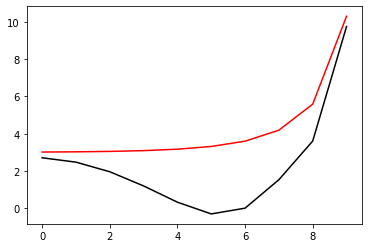

4000 72.02239752554046 -0.32256360811582174 -5.165219392213556
[ 2.70519122e+00  2.47424985e+00  1.96204206e+00  1.20298952e+00
  3.31724119e-01 -2.96894160e-01  9.59640571e-03  1.53472637e+00
  3.60803045e+00  9.74591549e+00]


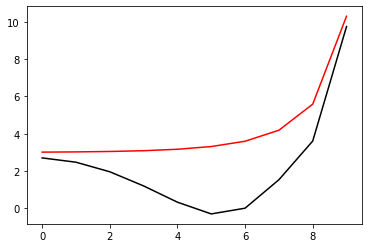

4100 72.02754784485627 -0.35536429187646457 -5.171830306626968
[ 2.70446338  2.47584337  1.96637871  1.20871851  0.3375557  -0.29236818
  0.01126061  1.53467882  3.60803106  9.74562083]


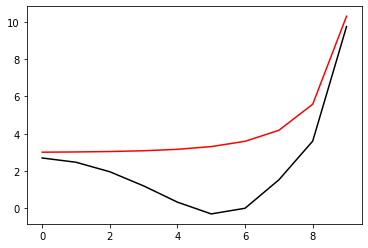

4200 72.02185106221636 -0.3225761895748398 -5.18294342852867
[ 2.7063351   2.47911671  1.97165054  1.21483289  0.34346613 -0.28766068
  0.01365694  1.53599742  3.60979556  9.74532629]


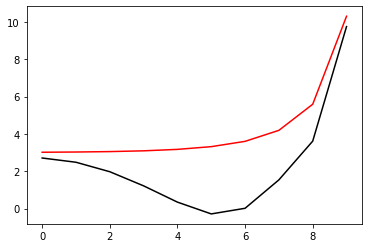

4300 72.02808596635124 -0.34882234757628894 -5.25907609235519
[ 2.70941037e+00  2.47750966e+00  1.96614367e+00  1.20479677e+00
  3.29341294e-01 -3.03199665e-01  1.50801706e-03  1.53150884e+00
  3.61248992e+00  9.74503197e+00]


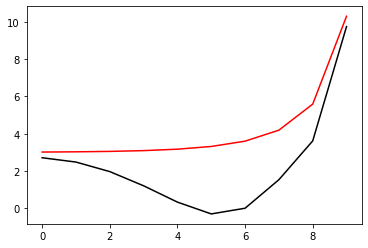

4400 72.02521282183923 -0.3321201051280387 -5.26010259336402
[ 2.70813928e+00  2.47991215e+00  1.97253305e+00  1.21399814e+00
  3.40027392e-01 -2.92766827e-01  9.18578711e-03  1.53662938e+00
  3.61672556e+00  9.74473770e+00]


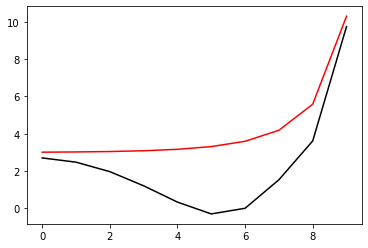

4500 70.12708082768184 -0.17659117347440373 -5.271013070184968
[ 2.71805321  2.49017342  1.98395079  1.22583679  0.35152493 -0.28244287
  0.01696708  1.54264717  3.62244479  9.74444359]


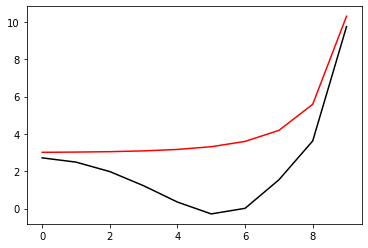

4600 72.01524894006205 -0.2971316740401329 -5.280369520511162
[ 2.71213024e+00  2.48048760e+00  1.97259117e+00  1.21423583e+00
  3.39919104e-01 -2.93734207e-01  7.35410753e-03  1.53670364e+00
  3.61921287e+00  9.74414955e+00]


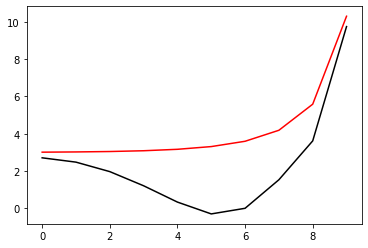

4700 72.02694973248232 -0.34164313845453553 -5.278283790671788
[ 2.72425433e+00  2.48581824e+00  1.97359668e+00  1.21325883e+00
  3.37643220e-01 -2.97355826e-01  2.68619375e-03  1.53255022e+00
  3.61517430e+00  9.74385556e+00]


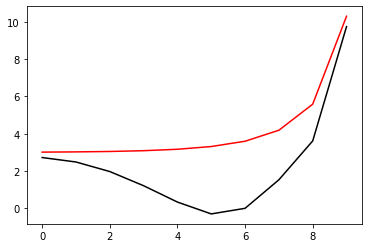

4800 72.02004516192153 -0.3083123320504625 -5.2531568184400665
[ 2.72393207e+00  2.48674168e+00  1.97600377e+00  1.21662929e+00
  3.40510610e-01 -2.97207743e-01 -1.88112698e-03  1.52484185e+00
  3.60648143e+00  9.74356123e+00]


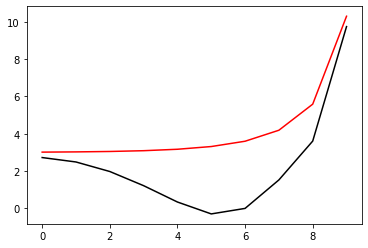

4900 91.42754183836564 0.09736953470606857 -5.420196469974692
[ 2.74380617  2.54007883  2.04729434  1.28033464  0.38460489 -0.27933653
 -0.01535247  1.49192731  3.57628538  9.74326655]


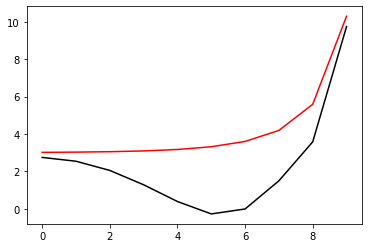

5000 72.0280716914604 -0.3263217517823994 -5.360544928073932
[ 2.72254077  2.46468402  1.94335541  1.16734238  0.27748644 -0.36962492
 -0.0753769   1.46448674  3.55272757  9.74296908]


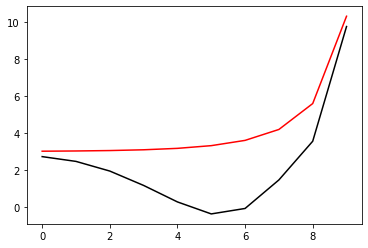

5100 72.01924535222622 -0.27294608059195624 -5.355172583082209
[ 2.71719226  2.46449004  1.9465597   1.17310548  0.28413191 -0.36392341
 -0.07269495  1.46501569  3.55305789  9.74267196]


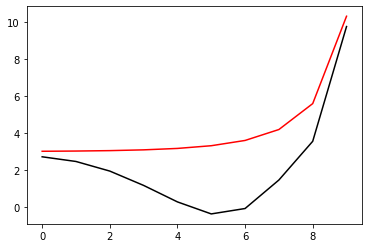

5200 72.02990396370747 -0.32804476883390954 -4.423883644352208
[ 2.686279    2.24076903  1.60864171  0.84079536  0.01571238 -0.54300742
 -0.13958093  1.47987153  3.55678286  9.74237487]


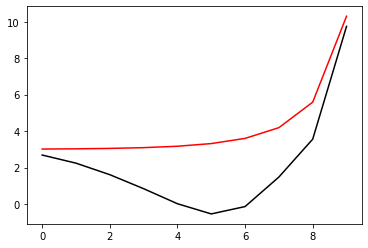

5300 72.03196676575297 -0.3386671373233276 -4.51056746182946
[ 2.69169253  2.25225901  1.61478266  0.84079452  0.01154532 -0.54828326
 -0.14215696  1.48324307  3.56583003  9.74207819]


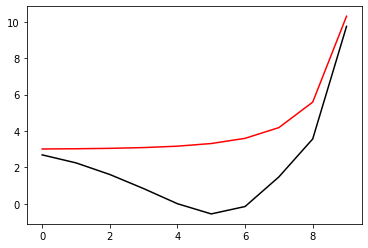

5400 72.0328965728753 -0.3502561450334523 -4.559249805339902
[ 2.69154818  2.26171729  1.62329028  0.84700079  0.01652869 -0.54346793
 -0.13692314  1.49035656  3.57537189  9.74178187]


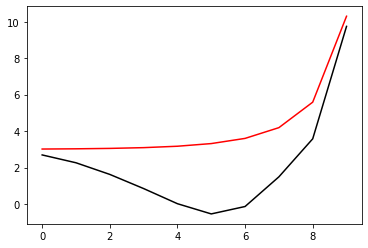

5500 71.9229473787833 -0.2646416630708733 -4.5692573723820455
[ 2.68802189  2.26953651  1.63265128  0.85590418  0.02512404 -0.5357478
 -0.13143067  1.4946309   3.58000607  9.7414859 ]


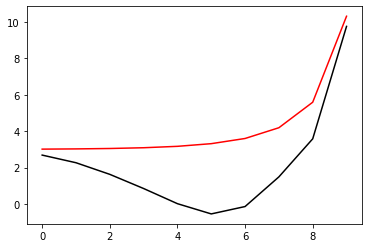

5600 72.0268297691848 -0.3082100637097607 -4.591758121399698
[ 2.68550743  2.27745668  1.64199959  0.86452191  0.03332739 -0.52809292
 -0.12518572  1.50052512  3.5868258   9.74119048]


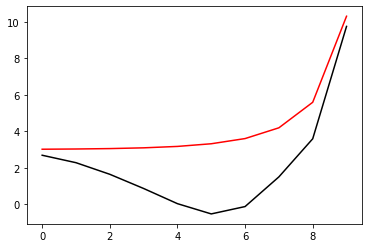

5700 72.03048497858808 -0.3253773766285159 -4.653430052051321
[ 2.71176454  2.31042594  1.67426329  0.89485979  0.06366585 -0.49624006
 -0.09303443  1.531846    3.61753567  9.74089611]


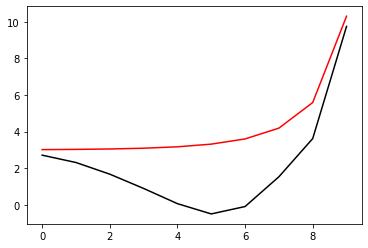

5800 72.0311512562908 -0.33565082700378124 -4.68491828874156
[ 2.72699179  2.3327692   1.69653535  0.91499003  0.08250577 -0.47818522
 -0.07667137  1.54701919  3.63268612  9.74060248]


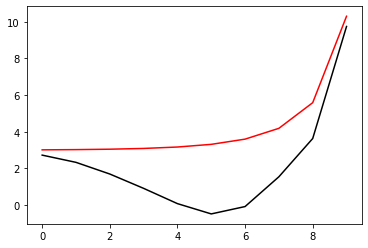

5900 72.03075354543525 -0.331431503769105 -4.711336317083717
[ 2.72723234  2.34098085  1.70587818  0.92292752  0.08935911 -0.47225494
 -0.07206183  1.55163668  3.63851086  9.7403094 ]


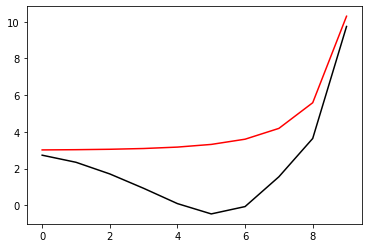

6000 72.02765685747138 -0.31217662911235705 -4.713098986540367
[ 2.72722392  2.34931191  1.71616501  0.93223243  0.09742474 -0.4660922
 -0.06896121  1.5531241   3.64027171  9.74001656]


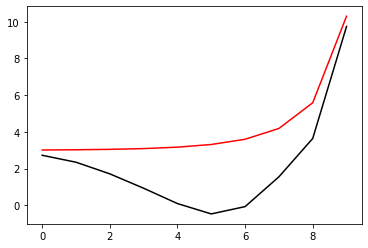

6100 72.02216175165547 -0.2986948228641515 -4.725663443773003
[ 2.71994977  2.35118891  1.72140789  0.93785332  0.10315648 -0.4608868
 -0.06557203  1.55569285  3.64348954  9.73972391]


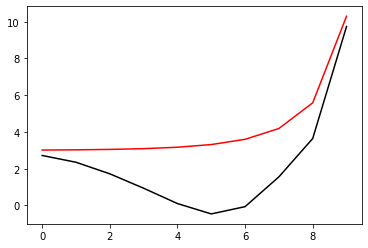

6200 73.40120377901836 -0.057051133109430635 -4.740007215629913
[ 2.74717484  2.3828168   1.75300879  0.96719441  0.13100472 -0.43425098
 -0.04194735  1.5761331   3.66224403  9.73943187]


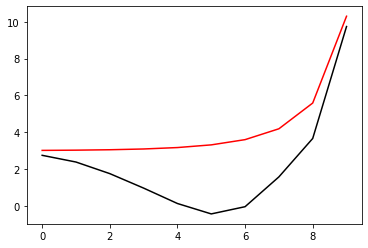

6300 72.02902643432988 -0.33345721756356395 -4.7499401105586605
[ 2.78576979  2.4213685   1.78722223  0.99450263  0.15212309 -0.4182268
 -0.03042642  1.58549897  3.67147881  9.73914014]


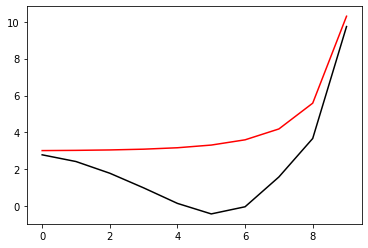

6400 70.30016136752099 -0.20986870020036597 -4.7021108724414695
[ 2.83588373  2.46828246  1.82661271  1.0232774   0.17010231 -0.41081257
 -0.03245845  1.57881805  3.66407063  9.73884844]


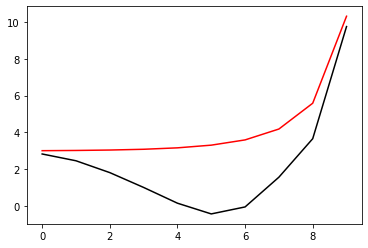

6500 71.68558525756788 -0.2697368451179781 -4.718057999189499
[ 2.87998727  2.50508072  1.85165099  1.03375346  0.16697821 -0.42431833
 -0.05030747  1.56386769  3.65410924  9.73855626]


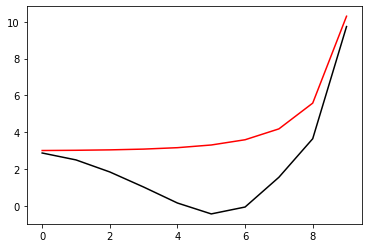

6600 72.02269510726653 -0.32711519790923227 -4.860254442330389
[ 2.90306080e+00  2.53156122e+00  1.87853708e+00  1.06034996e+00
  1.96473282e-01 -3.88282112e-01 -8.00677669e-03  1.60921078e+00
  3.70012970e+00  9.73826551e+00]


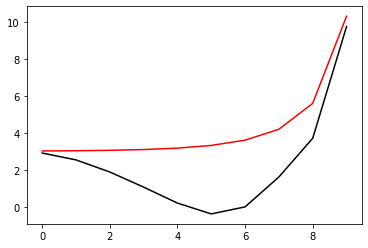

6700 72.0305612880113 -0.3460056891465006 -4.952362219501112
[ 2.91376385  2.54601923  1.89319717  1.07333206  0.20942    -0.37297736
  0.01037896  1.63043749  3.72339743  9.73797637]


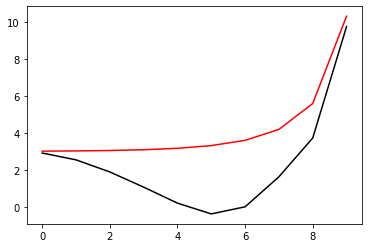

6800 72.02800061886316 -0.33556922696181185 -4.998256060943383
[ 2.91449772  2.55299799  1.90267631  1.08264644  0.21892622 -0.36259961
  0.02114758  1.64190161  3.73599137  9.73768797]


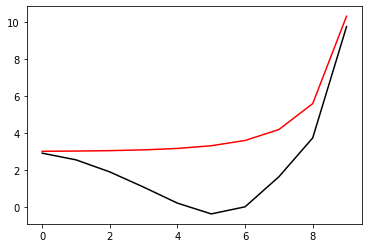

6900 72.03311999212035 -0.358700218121187 -5.050315336482718
[ 2.91366238  2.55655861  1.90708052  1.08508972  0.21981236 -0.36188881
  0.02291828  1.64640619  3.74348486  9.73740002]


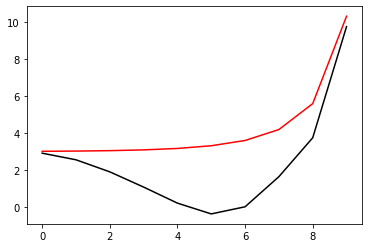

7000 71.99704885266577 -0.30309415384093297 -5.048199538669059
[ 2.9085868   2.559308    1.91418325  1.0930933   0.22766412 -0.35539657
  0.02619442  1.64743571  3.74424533  9.73711233]


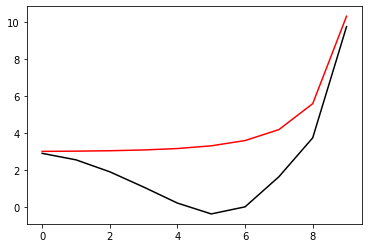

7100 72.03166105020232 -0.3512095682861488 -5.069636354920662
[ 2.90317477  2.55949392  1.91688915  1.09500417  0.22816736 -0.35634007
  0.02380891  1.64549196  3.7440515   9.73682465]


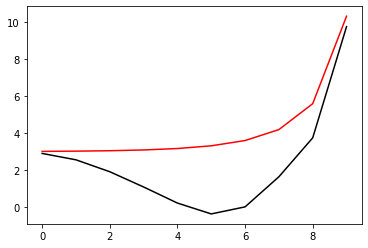

7200 70.18753988939518 -0.15026849275794354 -5.073256766010955
[ 2.90877288  2.5709788   1.93198285  1.11068682  0.24375732 -0.34172734
  0.03521991  1.65389915  3.75125057  9.73653716]


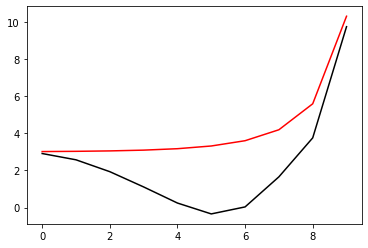

7300 70.01437210022799 -0.16364923995936995 -5.148977610232498
[ 2.90776801  2.56851563  1.9256219   1.09743879  0.22428167 -0.36392024
  0.0162292   1.64327186  3.74860655  9.73624975]


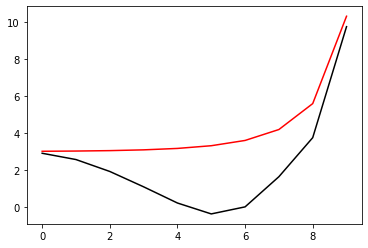

7400 72.03289223942157 -0.34960786177420905 -5.150884617512241
[ 2.90208498e+00  2.56685379e+00  1.92529942e+00  1.09467906e+00
  2.17471576e-01 -3.75775724e-01 -4.34677529e-04  1.62549591e+00
  3.73236041e+00  9.73596214e+00]


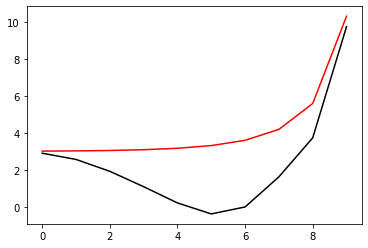

7500 72.02961364280564 -0.33005311428387774 -5.1255437316061325
[ 2.89564190e+00  2.56717728e+00  1.92998717e+00  1.09986363e+00
  2.21055600e-01 -3.75996280e-01 -6.51111554e-03  1.61567644e+00
  3.72188920e+00  9.73567374e+00]


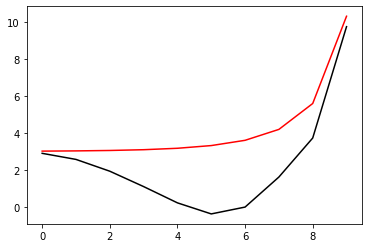

7600 72.03286904525154 -0.3555966577981078 -5.115718676170859
[ 2.89389778  2.57031614  1.93615324  1.10550347  0.22447444 -0.37633777
 -0.01200541  1.6072207   3.71319067  9.73538512]


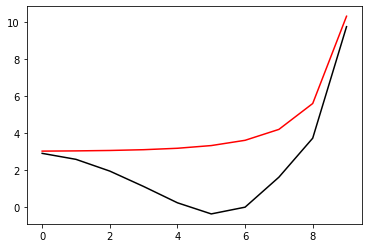

7700 72.0302840372298 -0.3378597525455921 -5.12789603389276
[ 2.88933936e+00  2.57143815e+00  1.94146420e+00  1.11183394e+00
  2.30756642e-01 -3.70762403e-01 -8.34567180e-03  1.60990547e+00
  3.71639601e+00  9.73509614e+00]


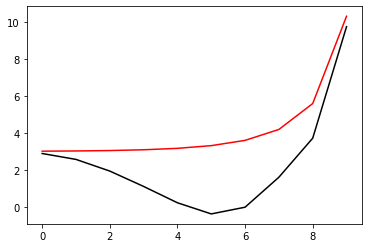

7800 72.02862333413132 -0.32356425961008756 -5.171665936928931
[ 2.8885704   2.57268795  1.94350309  1.1118026   0.22838938 -0.37417682
 -0.01103521  1.61032633  3.72040297  9.73480737]


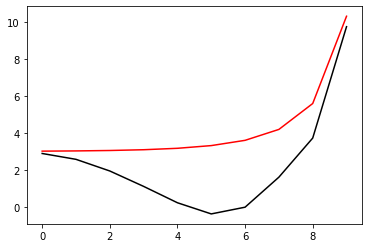

7900 71.12803192305795 -0.2262360774208465 -5.153600997688181
[ 2.89350045  2.58157059  1.95536433  1.1233561   0.23772854 -0.36910792
 -0.01259225  1.60386195  3.71222483  9.73451857]


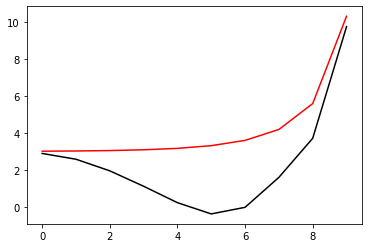

8000 73.0705242551603 -0.4681752800028491 -5.2030145361837645
[ 2.88617498  2.57425358  1.94676307  1.11023302  0.21938089 -0.39103793
 -0.03411186  1.58766774  3.70210768  9.73422949]


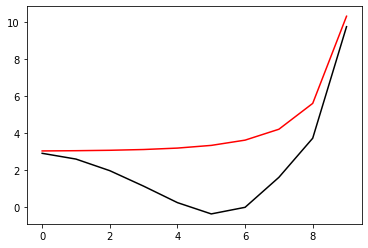

8100 72.03199915355242 -0.34640243154403033 -5.169823539438178
[ 2.88448503  2.57803703  1.95484028  1.11899273  0.22629778 -0.38863452
 -0.0388338   1.57785393  3.69078166  9.73393978]


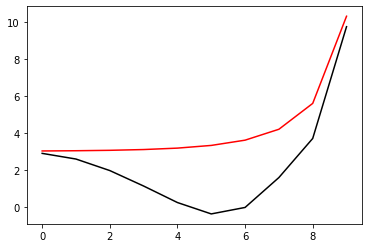

8200 72.02820394813166 -0.32334011252313943 -5.142484598913868
[ 2.88043278  2.57946774  1.96081207  1.126012    0.23195439 -0.38678909
 -0.04325973  1.56898453  3.68071372  9.73364953]


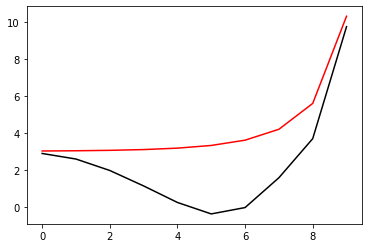

8300 72.03185069960287 -0.34539281706753944 -5.163090214513175
[ 2.87900872  2.57875748  1.96010072  1.12216112  0.22364297 -0.39925985
 -0.05798167  1.55603778  3.6712835   9.73335864]


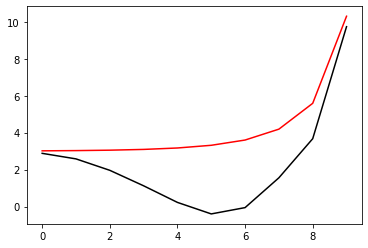

8400 72.02651018589557 -0.3155539961858928 -5.138042143151765
[ 2.87459288  2.57989218  1.96612397  1.1297728   0.23048644 -0.39553797
 -0.05994722  1.54984473  3.66388954  9.73306753]


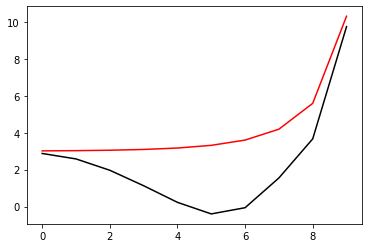

8500 72.02539956201029 -0.3116497272474985 -5.144003748425563
[ 2.87038397  2.57916682  1.96844504  1.13217844  0.23139548 -0.39679479
 -0.06370734  1.54565492  3.66108521  9.73277611]


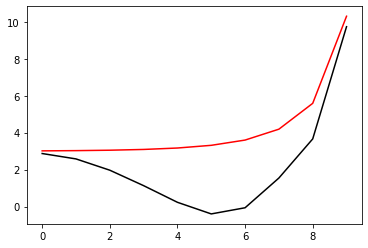

8600 72.03034356088419 -0.34000925801825327 -5.107676762604407
[ 2.865685    2.57870477  1.97172964  1.13572358  0.2322822  -0.40142747
 -0.07605397  1.52840904  3.6428051   9.73248391]


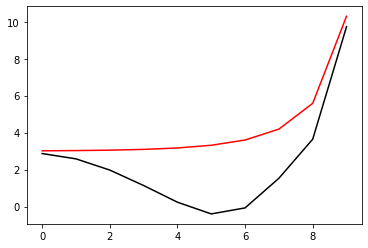

8700 72.02910122281537 -0.33379499744266905 -5.108463428445357
[ 2.86166225  2.57984037  1.97807901  1.14460405  0.24199302 -0.39229971
 -0.06976352  1.53220309  3.64597833  9.73219171]


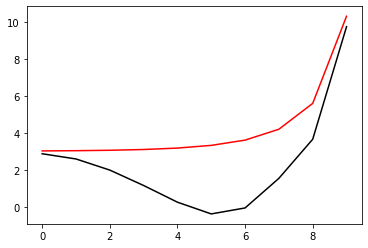

8800 72.02479780281313 -0.3187901069082643 -5.113218305931033
[ 2.85832914  2.58137696  1.98476881  1.15390543  0.25228345 -0.38231914
 -0.06231255  1.53731812  3.65049984  9.73189973]


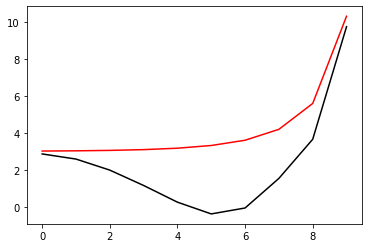

8900 72.0316978959799 -0.3621293528607519 -5.102545399676492
[ 2.8549056   2.58178652  1.98928936  1.15977735  0.25744937 -0.37950395
 -0.0636286   1.53327087  3.64612261  9.73160762]


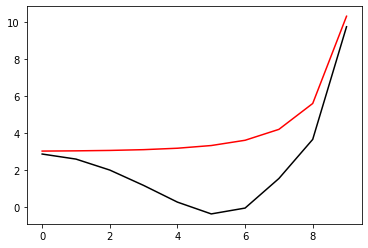

9000 72.0300804373823 -0.3492598310631754 -5.117312484582573
[ 2.85137884  2.58098631  1.99165319  1.16282975  0.25968572 -0.37857631
 -0.06437144  1.53248441  3.64678523  9.73131554]


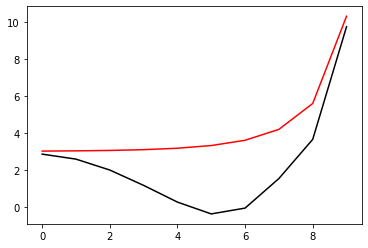

9100 72.03057153162075 -0.34352860965800286 -5.136270546744797
[ 2.84749204  2.57437019  1.98233005  1.14778503  0.23699852 -0.40840232
 -0.09725309  1.50329972  3.62356288  9.73102307]


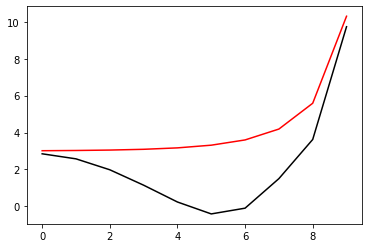

9200 72.03051865553518 -0.34859302933831393 -5.134000393986222
[ 2.84628557  2.57796601  1.99126976  1.15985884  0.25041924 -0.39531502
 -0.08738786  1.50970637  3.62847724  9.73073002]


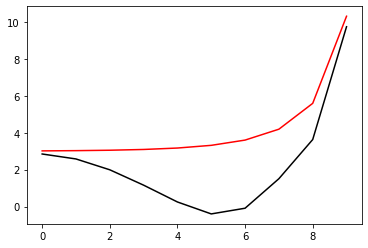

9300 72.02971578033758 -0.3378559902072866 -5.167963981721593
[ 2.84563836  2.57856867  1.99377235  1.16227342  0.25172816 -0.39467689
 -0.0867316   1.5120946   3.6333946   9.7304372 ]


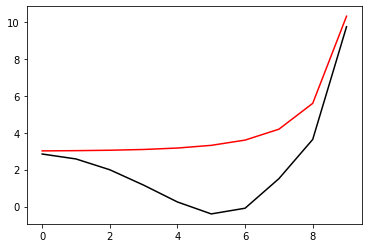

9400 72.02947469692678 -0.3381185674291518 -5.16724075317044
[ 2.84198882  2.57850873  1.99776567  1.16801737  0.25728911 -0.39063831
 -0.08572774  1.51121914  3.63265369  9.73014455]


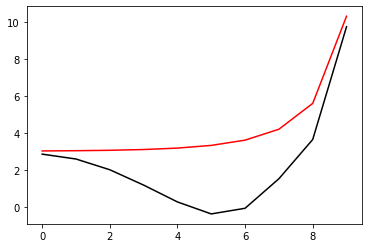

9500 72.033129215529 -0.36632306319843905 -5.148397087370676
[ 2.84019222  2.57866231  2.00026438  1.17022978  0.25657065 -0.39639138
 -0.0977023   1.49599947  3.61748706  9.72985149]


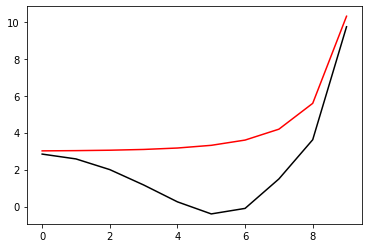

9600 72.03072741329747 -0.3515014573435704 -5.136964340865161
[ 2.83662342  2.57632681  1.99951164  1.16844754  0.25128563 -0.40662183
 -0.11284274  1.47960263  3.60271323  9.72955806]


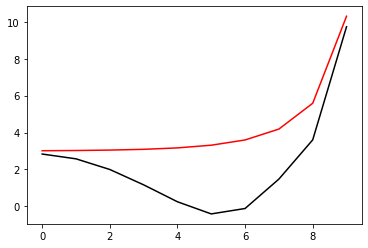

9700 72.03623113287424 -0.3724053923324703 -5.169828607659386
[ 2.83926562  2.57701133  1.99897458  1.16477098  0.24324552 -0.41823523
 -0.12549522  1.46986363  3.59714223  9.72926403]


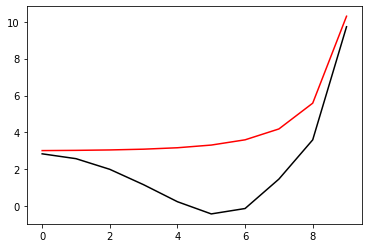

9800 72.02474496696988 -0.30642895586892926 -5.163558566912061
[ 2.83415105  2.5761562   2.0028011   1.17118877  0.25014612 -0.41252163
 -0.1229513   1.47007045  3.59713254  9.72896968]


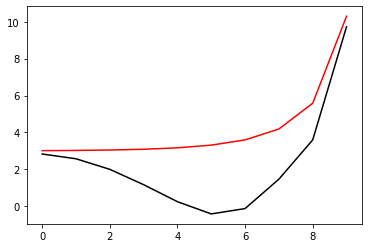

9900 72.02841276384783 -0.32281624177611945 -5.180336005749065
[ 2.83077971  2.57491196  2.00423255  1.17341116  0.25152563 -0.41249421
 -0.12440812  1.4688961   3.59770081  9.72867539]


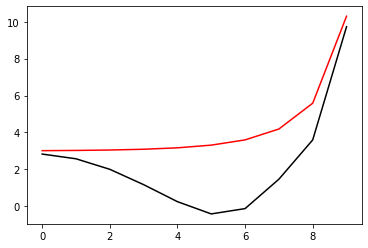

10000 72.0256457323157 -0.3087164076827444 -5.143775773101946
[ 2.82394483  2.57092747  2.00335884  1.17300354  0.24830193 -0.42157749
 -0.1411906   1.44771332  3.57611979  9.72838041]


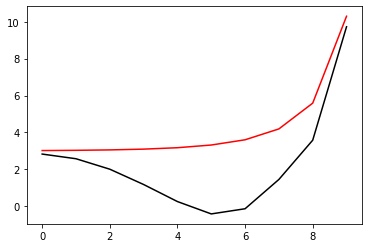

In [97]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

100 72.02987238266917 -0.3425365925730491 -5.110546778351967
[ 2.81632075  2.56544505  2.00032196  1.16981818  0.24173864 -0.43432386
 -0.16138511  1.42384225  3.55248585  9.728084  ]


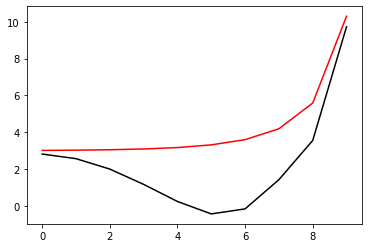

KeyboardInterrupt: 

In [98]:
optimizer=tf.optimizers.SGD(learning_rate=0.005)
for i in range (1, 10001):
    run()
    if i%100==0: print(i, Error_func(h, m2_2, lam2).numpy(), m2_2.numpy(), lam2.numpy()), print(h.numpy()), plt.plot(h_real, 'r-'), plt.plot(h.numpy(), 'k-'), plt.show()

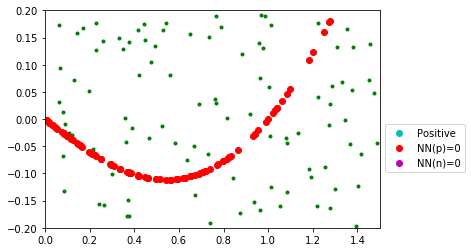

In [54]:
[Positive0, Positive1]=NN_func_01(h, Positive)
[Negative0, Negative1]=NN_func_01(h, Negative)

x_data1=[v[0] for v in Positive0]
y_data1=[v[1] for v in Positive0]
x_data2=[v[0] for v in Positive1]
y_data2=[v[1] for v in Positive1]
x_data3=[v[0] for v in Negative0]
y_data3=[v[1] for v in Negative0]
x_data4=[v[0] for v in Negative1]
y_data4=[v[1] for v in Negative1]
plt.plot(x_data4, y_data4, 'g.')
plt.plot(x_data2, y_data2, 'co', label='Positive')
plt.plot(x_data1, y_data1, 'ro', label='NN(p)=0')
plt.plot(x_data3, y_data3, 'mo', label='NN(n)=0')
plt.xlim(0.0, 1.5)
plt.ylim(-0.2, 0.2)
plt.legend(bbox_to_anchor=(1, 0.5))
plt.show()